In [11]:
# Core libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import time
from datetime import timedelta

# Machine learning tools
from sklearn.linear_model import LinearRegression, Ridge, MultiTaskLassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.multioutput import MultiOutputRegressor
from sklearn.feature_selection import mutual_info_regression

# Deep Learning tools
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Input
from keras.optimizers import Adam, RMSprop, SGD
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.regularizers import l2

# Additional tools
from scipy import signal
from scipy.optimize import minimize
from itertools import combinations, product

# External data and APIs
import yfinance as yf
#from dune_client.client import DuneClient
import requests
import streamlit as st

# Set random seeds to ensure reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)


In [12]:
@st.cache_data()
def fetch_data_from_api(api_url, params=None):
    response = requests.get(api_url, params=params)
    if response.status_code == 200:
        data = response.json()
        if 'rows' in data['result']:
            return pd.DataFrame(data['result']['rows'])
        return data
    else:
        print(f"Failed to retrieve data: {response.status_code}")
        return pd.DataFrame()  # or an empty dict

2024-06-09 16:23:55.192 WARNING streamlit.runtime.caching.cache_data_api: No runtime found, using MemoryCacheStorageManager


In [25]:
def fetch_historical_data(api_url, api_key):
    # Use the API key either as a query parameter or in the headers
    params = {'vs_currency': 'usd', 'days': 'max', 'interval': 'daily', 'x_cg_demo_api_key': api_key}
    headers = {'x-cg-demo-api-key': api_key}  # Alternatively, use this header

    response = requests.get(api_url, params=params, headers=headers)

    if response.status_code == 200:
        # Parse the JSON response
        historical_pricedata = response.json()
        # Extract the 'prices' and 'market_caps' data
        historical_price = historical_pricedata['prices']
        market_cap = pd.DataFrame(historical_pricedata['market_caps'], columns=['date', 'marketcap'])

        # Convert the 'timestamp' column from UNIX timestamps in milliseconds to datetime objects
        history = pd.DataFrame(historical_price, columns=['timestamp', 'price'])
        history['date'] = pd.to_datetime(history['timestamp'], unit='ms')
        history.set_index('date', inplace=True)
        history.drop(columns='timestamp', inplace=True)

        vol = pd.DataFrame(historical_pricedata['total_volumes'], columns=['date', 'volume'])
        vol['date'] = pd.to_datetime(vol['date'], unit='ms')
        vol.set_index('date', inplace=True)
        
        return history, market_cap, vol
    else:
        print(f"Failed to retrieve data: {response.status_code}")
        return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()

api_key_dune = st.secrets["api_key"]
api_key_cg = st.secrets["api_key_cg"]
api_key_FRED = st.secrets["FRED_API_KEY"]

dune = DuneClient(api_key_dune)

In [26]:
def fetch_dune_data(num):
    result = dune.get_latest_result(num)
    return pd.DataFrame(result.result.rows)

In [27]:
pd.options.display.float_format = '{:,.5f}'.format

### First, lets get MakerDAO Financial Statements from https://dune.com/steakhouse/makerdao

Balance Sheet

In [28]:
# Balance Sheet
#bs_raw = dune.get_latest_result(2840463)

In [29]:
#bs_df = pd.DataFrame(bs_raw.result.rows)
#bs_df['period'] = pd.to_datetime(bs_df['period'])
#bs_df.set_index('period', inplace=True)
#bs_df.index = bs_df.index.normalize()
#bs_df = bs_df.sort_index()

In [30]:
#bs_df

In [31]:
bs_path = '../data/csv/bs.csv'

In [32]:
#bs_df.to_csv(bs_path)

In [33]:
bs_csv = pd.read_csv(bs_path, index_col='period', parse_dates=True)

FileNotFoundError: [Errno 2] No such file or directory: '../data/csv/bs.csv'

In [ ]:
#categorizing items as asset, liability, or equity
def categorize_item(item):
    if item in ['Crypto-Loans', 'Real-World Assets', 'Others assets', 'Stablecoins']:
        return 'Assets'
    elif item in ['DAI','DSR']:  # Assuming DAI represents a liability here; adjust according to your accounting rules
        return 'Liabilities'
    elif item == 'Equity':
        return 'Equity'
    else:
        return 'Other'  # For any item not explicitly categorized

# Assuming 'df' is your DataFrame
bs_csv['category'] = bs_csv['item'].apply(categorize_item)



In [ ]:
bs_csv = bs_csv.iloc[::-1]

In [ ]:
bs_csv.tail()

In [ ]:
bs_csv.describe()

In [ ]:
pivoted_balance_sheet = bs_csv.pivot(columns='item', values='balance')

In [ ]:
# Percent Changes in account balances 
pivoted_balance_sheet['Crypto-Loans_pct_chg'] = pivoted_balance_sheet['Crypto-Loans'].pct_change()
pivoted_balance_sheet['DAI_pct_chg'] = pivoted_balance_sheet['DAI'].pct_change()
pivoted_balance_sheet['DSR_pct_chg'] = pivoted_balance_sheet['DSR'].pct_change()
pivoted_balance_sheet['Equity_pct_chg'] = pivoted_balance_sheet['Equity'].pct_change()
pivoted_balance_sheet['Others_assets_pct_chg'] = pivoted_balance_sheet['Others assets'].pct_change()  # Assuming this is the correct column name
pivoted_balance_sheet['Real-World_Assets_pct_chg'] = pivoted_balance_sheet['Real-World Assets'].pct_change()
pivoted_balance_sheet['Stablecoins_pct_chg'] = pivoted_balance_sheet['Stablecoins'].pct_change()


In [ ]:
# Rolling Averages, Standard Deviation
# Define the window size for rolling calculation
window_size = 7  # for example, a 7-day rolling window

# Calculate rolling averages
pivoted_balance_sheet['Crypto-Loans_7d_rolling_avg'] = pivoted_balance_sheet['Crypto-Loans'].rolling(window=window_size).mean()
pivoted_balance_sheet['DAI_7d_rolling_avg'] = pivoted_balance_sheet['DAI'].rolling(window=window_size).mean()
pivoted_balance_sheet['DSR_7d_rolling_avg'] = pivoted_balance_sheet['DSR'].rolling(window=window_size).mean()
pivoted_balance_sheet['Equity_7d_rolling_avg'] = pivoted_balance_sheet['Equity'].rolling(window=window_size).mean()
pivoted_balance_sheet['Others_assets_7d_rolling_avg'] = pivoted_balance_sheet['Others assets'].rolling(window=window_size).mean()
pivoted_balance_sheet['Real-World_Assets_7d_rolling_avg'] = pivoted_balance_sheet['Real-World Assets'].rolling(window=window_size).mean()
pivoted_balance_sheet['Stablecoins_7d_rolling_avg'] = pivoted_balance_sheet['Stablecoins'].rolling(window=window_size).mean()

# Calculate volatility (standard deviation)
pivoted_balance_sheet['Crypto-Loans_7d_rolling_volatility'] = pivoted_balance_sheet['Crypto-Loans_pct_chg'].rolling(window=window_size).std()
pivoted_balance_sheet['DAI_7d_rolling_volatility'] = pivoted_balance_sheet['DAI_pct_chg'].rolling(window=window_size).std()
pivoted_balance_sheet['DSR_7d_rolling_volatility'] = pivoted_balance_sheet['DSR_pct_chg'].rolling(window=window_size).std()
pivoted_balance_sheet['Equity_7d_rolling_volatility'] = pivoted_balance_sheet['Equity_pct_chg'].rolling(window=window_size).std()
pivoted_balance_sheet['Others_assets_7d_rolling_volatility'] = pivoted_balance_sheet['Others_assets_pct_chg'].rolling(window=window_size).std()
pivoted_balance_sheet['Real-World_Assets_7d_rolling_volatility'] = pivoted_balance_sheet['Real-World_Assets_pct_chg'].rolling(window=window_size).std()
pivoted_balance_sheet['Stablecoins_7d_rolling_volatility'] = pivoted_balance_sheet['Stablecoins_pct_chg'].rolling(window=window_size).std()



In [ ]:
# Assuming you've already calculated percent changes (_pct_chg)
window_size = 30  # Adjust based on your analysis needs

# Calculate rolling averages and volatilities based on percent changes
for col in ['Crypto-Loans', 'DAI', 'DSR', 'Equity', 'Others_assets', 'Real-World_Assets', 'Stablecoins']:
    pct_chg_col = f'{col}_pct_chg'  # The column names for percent changes you've calculated
    pivoted_balance_sheet[f'{col}_30d_rolling_avg_pct_chg'] = pivoted_balance_sheet[pct_chg_col].rolling(window=window_size).mean()
    pivoted_balance_sheet[f'{col}_30d_volatility_pct_chg'] = pivoted_balance_sheet[pct_chg_col].rolling(window=window_size).std()


In [ ]:
pivoted_balance_sheet.columns = [f'b_s_{col}' if col != 'period' else col for col in pivoted_balance_sheet.columns]

In [ ]:
pivoted_balance_sheet.tail()

In [ ]:
pivoted_balance_sheet.shape[0]

MONTHLY Income Statement/PnL (also includes more detailed balance sheet)

In [ ]:
#is_df = fetch_dune_data(2641549) 

In [ ]:
#is_df.head()

In [ ]:
#is_df_wide = is_df.pivot_table(index='period', columns='item', values='value', aggfunc='sum').reset_index()
#is_df_wide = is_df_wide.iloc[::-1]

In [ ]:
#is_df_wide.head()

In [ ]:
is_path = '../data/csv/is.csv'

In [ ]:
#is_df.to_csv(is_path)

In [ ]:
is_csv = pd.read_csv(is_path, index_col='period', parse_dates=True)

In [ ]:
cleaned_is = is_csv.drop(columns=['Unnamed: 0','year'])

In [ ]:
cleaned_is.describe()

In [ ]:
pivoted_income_statement = is_csv.pivot_table(index='period', 
                            columns='item', 
                            values='value', 
                            aggfunc='sum').reset_index()

In [ ]:
pivoted_income_statement.drop(columns=['1 - PnL','2 - Assets','2.8 - Operating Reserves','3 - Liabilities & Equity','3.8 - Equity (Operating Reserves)'], inplace=True)

In [ ]:
pivoted_income_statement['Total Revenues']= pivoted_income_statement[['1.1 - Lending Revenues', '1.2 - Liquidations Revenues', '1.3 - Trading Revenues']].sum(axis=1)
pivoted_income_statement['Total Expenses'] = pivoted_income_statement[['1.4 - Lending Expenses', '1.5 - Liquidations Expenses', '1.6 - Workforce Expenses']].sum(axis=1)
pivoted_income_statement['profit_margin'] = pivoted_income_statement['1.9 - Net Income'] / pivoted_income_statement['2.9 - Total Assets']
pivoted_income_statement['ROA'] = pivoted_income_statement['1.9 - Net Income'] / pivoted_income_statement['2.9 - Total Assets']
pivoted_income_statement['ROE'] = pivoted_income_statement['1.9 - Net Income'] / pivoted_income_statement['3.7 - Equity (Surplus Buffer)']
pivoted_income_statement['debt_to_equity'] = pivoted_income_statement['3.1 - Liabilities (DAI)'] / pivoted_income_statement['3.7 - Equity (Surplus Buffer)']
pivoted_income_statement['debt_ratio'] = pivoted_income_statement['3.1 - Liabilities (DAI)'] / pivoted_income_statement['2.9 - Total Assets'] 
pivoted_income_statement['cumulative_revenues'] = pivoted_income_statement['Total Revenues'].cumsum()
pivoted_income_statement['cumulative_expenses'] = pivoted_income_statement['Total Expenses'].cumsum()
pivoted_income_statement['cumulative_net_income'] = pivoted_income_statement['1.9 - Net Income'].cumsum()


In [ ]:
pivoted_income_statement[['1.9 - Net Income','2.9 - Total Assets']]

In [ ]:
pivoted_income_statement.tail()

In [ ]:
# Percent Changes in account balances
window_size = 3  # Three months
# Calculate rolling averages and volatilities based on percent changes
for col in ['Total Revenues', 'Total Expenses', '1.9 - Net Income']:
    pct_chg_col = f'{col}_pct_chg'  # Define the percent change column name
    pivoted_income_statement[pct_chg_col] = pivoted_income_statement[col].pct_change()
    # Use the pct_chg_col variable correctly now
    pivoted_income_statement[f'{col}_3m_rolling_avg_pct_chg'] = pivoted_income_statement[pct_chg_col].rolling(window=window_size).mean()
    pivoted_income_statement[f'{col}_3m_volatility_pct_chg'] = pivoted_income_statement[pct_chg_col].rolling(window=window_size).std()
    for lag in range(1,13):
        pivoted_income_statement[f'{col}_3m_rolling_avg_pct_chg_lag_{lag}'] = pivoted_income_statement[f'{col}_3m_rolling_avg_pct_chg'].shift(lag)
        pivoted_income_statement[f'{col}_3m_volatility_pct_chg_lag_{lag}'] = pivoted_income_statement[f'{col}_3m_volatility_pct_chg'].shift(lag)


In [ ]:

# Generate lagged features
for lag in range(1, 13):  # From 1 to 12 months
    pivoted_income_statement[f'Total_Revenues_Lag_{lag}m'] = pivoted_income_statement['Total Revenues'].shift(lag)
    pivoted_income_statement[f'Total_Expenses_Lag_{lag}m'] = pivoted_income_statement['Total Expenses'].shift(lag)
    pivoted_income_statement[f'Net_Income_Lag_{lag}m'] = pivoted_income_statement['1.9 - Net Income'].shift(lag)
    pivoted_income_statement[f'profit_margin_Lag_{lag}m'] = pivoted_income_statement['profit_margin'].shift(lag)
    pivoted_income_statement[f'ROA_Lag_{lag}m'] = pivoted_income_statement['ROA'].shift(lag)
    pivoted_income_statement[f'ROE_Lag_{lag}m'] = pivoted_income_statement['ROE'].shift(lag)
    pivoted_income_statement[f'debt_to_equity_Lag_{lag}m'] = pivoted_income_statement['debt_to_equity'].shift(lag)
    pivoted_income_statement[f'debt_ratio_Lag_{lag}m'] = pivoted_income_statement['debt_ratio'].shift(lag)


In [ ]:
pivoted_income_statement.shape[0]

Assets/Revenue Per Type
Coinbase asset type: http://forum.makerdao.com/t/mip81-coinbase-usdc-institutional-rewards/17703/254?u=sebventures


In [ ]:
#assets_raw = dune.get_latest_result(58495)

In [ ]:
#assets_p_t_ts = pd.DataFrame(assets_raw.result.rows)
#assets_p_t_ts['dt'] = pd.to_datetime(assets_p_t_ts['dt'])
#assets_p_t_ts.set_index('dt', inplace=True)

In [ ]:
#assets_p_t_ts.head()

In [ ]:
#assets_p_t_ts.to_csv(as_path)

In [ ]:
as_path = '../data/csv/as.csv'

In [ ]:
as_csv = pd.read_csv(as_path, index_col='dt', parse_dates=True)

In [ ]:
as_csv = as_csv.drop(columns=['total_asset'])

Daily Interest Revenues By Vault

In [ ]:
#ir_v = fetch_dune_data(3567939) 

In [ ]:
#ir_v['period'] = pd.to_datetime(ir_v['period'])
#ir_v.set_index('period', inplace=True)

In [ ]:
#ir_v.head()

In [ ]:
daily_int_path = '../data/csv/d_int.csv'

In [ ]:
#ir_v.to_csv(daily_int_path)

In [ ]:
ir_csv = pd.read_csv(daily_int_path, index_col='period', parse_dates=True)

In [ ]:
ir_csv.shape[0]

In [ ]:

ir_csv = ir_csv.rename_axis('day')

 

In [ ]:
ir_csv = ir_csv.rename(columns={'collateral':'ilk'})

In [ ]:
ir_csv['ilk'].unique()

In [ ]:
top_vaults = ir_csv.groupby('ilk').sum().sort_values('daily_revenues', ascending=False)

In [ ]:
#10 Most Revenue Generating Vaults
top_10_vaults = top_vaults.head(10)

In [ ]:
top_10_vaults

Dai Maturity Profile

Step-by-Step Process:
Tracking DAI Movements:

First, all transactions involving DAI are tracked to understand how DAI moves in and out of wallets. This includes both inflows (adding DAI to a wallet) and outflows (removing DAI from a wallet).
Defining Maturity Buckets:

Maturity buckets are predefined categories based on time durations, such as "1-day", "1-week", "1-month", "1-year", etc. Each bucket represents a hypothesis about how long DAI tends to stay put before being moved again.
Assigning Weights to Buckets:

Weights are assigned to each maturity bucket to reflect assumptions or historical observations about the distribution of DAI across these buckets. For example, if historically 30% of DAI is moved or used within a day, then the "1-day" bucket might get a weight of 0.30 (or 30%).
Applying Weights Based on Wallet Types:

DAI can be held in different types of wallets or contracts, each with its own expected behavior. For example, DAI in a savings contract (like DSR) might be considered more long-term ("1-year"), while DAI in a regular wallet might be more liquid ("1-day" or "1-week"). The weights applied to the DAI in these wallets reflect these expectations.
Calculating DAI Amounts per Bucket:

For each wallet (or DAI holding), the total amount of DAI is distributed across the maturity buckets based on the assigned weights. This means if a wallet has 100 DAI and the "1-day" bucket weight is 30%, then 30 DAI is considered to have a 1-day maturity.
The process is repeated for each wallet and each maturity bucket, based on the specific weights for that wallet type and the total DAI it holds.
Aggregating Across the Ecosystem:

Finally, to get the ecosystem-wide view, the amounts of DAI in each maturity bucket from all wallets are aggregated. This provides a snapshot of how much DAI is considered to be in each maturity bucket across the entire MakerDAO system at any given time.

In [ ]:
#d_m = fetch_dune_data(907852)

In [ ]:
#d_m['dt'] = pd.to_datetime(d_m['dt'])

In [ ]:
#d_m

In [ ]:

#d_m.to_csv(d_m_path)


In [ ]:
d_m_path = '../data/csv/d_m.csv'

In [ ]:
d_m_csv = pd.read_csv(d_m_path, index_col='dt', parse_dates=True)

In [ ]:
print(d_m_csv.describe())

In [ ]:
clean_dm = d_m_csv.drop(columns=['Unnamed: 0'])

In [ ]:
clean_dm.describe()

In [ ]:
dai_maturity_df = d_m_csv.pivot_table(
    index='dt',  # or 'period' if your DataFrame's time column is named 'period'
    columns='maturity',
    values=['outflow', 'outflow_dai_only', 'outflow_surplus_buffer'],
    aggfunc='sum'  # or any other aggregation function that fits your needs
)

# Flatten the MultiIndex columns (optional, for cleaner column names)
dai_maturity_df.columns = ['_'.join(col).strip() for col in dai_maturity_df.columns.values]

# Reset the index if you want 'dt' back as a regular column
dai_maturity_df.reset_index(inplace=True)



In [ ]:
dai_maturity_df.tail()

In [ ]:
dai_maturity_df['dt'] = pd.to_datetime(dai_maturity_df['dt'])
dai_maturity_df.set_index('dt', inplace=True)


start_date = dai_maturity_df.index.min()
end_date = dai_maturity_df.index.max()
date_range = pd.date_range(start=start_date, end=end_date, freq='D')  # 'D' for daily frequency




In [ ]:
dai_maturity_df_reindexed = dai_maturity_df.reindex(date_range)

# Forward-fill missing values
dai_maturity_df_reindexed.ffill(inplace=True)

# Optionally, reset the index if you want 'dt' back as a column
dai_maturity_df_reindexed.reset_index(inplace=True)
dai_maturity_df_reindexed.rename(columns={'index': 'day'}, inplace=True)

In [ ]:
dai_maturity_df_reindexed.columns = [f'dai_maturity_{col}' if col != 'day' and not col.startswith('dai_maturity_') else col for col in dai_maturity_df_reindexed.columns]

In [ ]:
dai_maturity_df_reindexed.tail()

MakerDAO Stablecoin Ratio
This can give insights into the proportion of assets held in stablecoins (including DAI) relative to other assets. A higher stablecoin ratio might suggest a preference for stability within the MakerDAO system, which can have implications for DAI's stability.

In [ ]:
#stablecoin_ratio_df = fetch_dune_data(58136)

In [ ]:
#stablecoin_ratio_df['dt'] = pd.to_datetime(stablecoin_ratio_df['dt'])
#stablecoin_ratio_df.set_index('dt', inplace=True)

In [ ]:
#stablecoin_ratio_df.to_csv(stablecoin_ratio_path)

In [ ]:
stablecoin_ratio_path = '../data/csv/srp.csv'

In [ ]:
stablecoin_ratio_csv = pd.read_csv(stablecoin_ratio_path, index_col='dt', parse_dates=True)

In [ ]:
stablecoin_ratio_csv.head()

In [ ]:
stable_coin_ratios = stablecoin_ratio_csv[['stablecoins_ratio','usdc_ratio']]

In [ ]:
stable_coin_ratios = stable_coin_ratios.rename_axis('day')

In [ ]:
stable_coin_ratios.index

Maker Peg Stability Module Stats
Data on the Peg Stability Module, which helps maintain DAI's peg to the USD, can be vital. Insights into the inflows, outflows, and balances within the PSM can directly indicate efforts to stabilize DAI.

In [ ]:
#psm_stats_df = fetch_dune_data(17216)

In [ ]:
#psm_stats_df['date'] = pd.to_datetime(psm_stats_df['date'])

In [ ]:
psm_stats_path = '../data/csv/psm.csv'

In [ ]:
#psm_stats_df.to_csv(psm_stats_path)

In [ ]:
psm_stats_csv = pd.read_csv(psm_stats_path, index_col='date', parse_dates=True)

In [ ]:
psm_stats_csv.columns = [f'psm_{col}' if col != 'dt' and not col.startswith('psm_') else col for col in psm_stats_csv.columns]


In [ ]:
psm_stats_csv = psm_stats_csv.drop(columns=['psm_Unnamed: 0'])

In [ ]:
psm_stats_csv = psm_stats_csv.rename_axis('day')

In [ ]:
psm_stats_csv.columns

In [ ]:
psm_stats_csv[['psm_balance','psm_fees','psm_inflow','psm_outflow','psm_turnover']].describe()

Where is dai lets us know how dai is being used; dai in lending could be considered to add to stability 

In [ ]:
#where_is_dai_df = fetch_dune_data(54599)

In [ ]:
#where_is_dai_df['dt'] = pd.to_datetime(where_is_dai_df['dt'])

In [ ]:
wid_path = '../data/csv/wid.csv'

In [ ]:
#where_is_dai_df.to_csv(wid_path)

In [ ]:
where_is_dai_csv = pd.read_csv(wid_path, index_col='dt', parse_dates=True)

In [ ]:
where_is_dai_csv = where_is_dai_csv.rename_axis('day')

In [ ]:
print(where_is_dai_csv.describe())

In [ ]:
where_is_dai_csv.columns = [f'where_is_dai_{col}' if col != 'day' and not col.startswith('where_is_dai_') else col for col in where_is_dai_csv.columns]

In [ ]:
where_is_dai_csv = where_is_dai_csv.drop(columns=['where_is_dai_Unnamed: 0'])

In [ ]:
where_is_dai_csv.shape[0]

In [ ]:
where_is_dai_csv_table = where_is_dai_csv.pivot_table(values='where_is_dai_balance', index='day', columns='where_is_dai_wallet', aggfunc='sum')

In [ ]:
where_is_dai_csv_table.describe()

In [ ]:
where_is_dai_csv_table.columns = [f'where_is_dai_{col}' if col != 'day' and not col.startswith('where_is_dai_') else col for col in where_is_dai_csv_table.columns]

In [ ]:
where_is_dai_csv_table.shape[0]

In [ ]:
where_is_dai_csv_table

Daily surplus buffer
Provides information on the surplus buffer in MakerDAO, which is a key financial metric. The surplus buffer acts as a reserve to cover potential system shortfalls and ensures the stability and solvency of the system. This data could be valuable for understanding the financial health and risk management strategies of MakerDAO over time

In [ ]:
#daily_surplus_buffer = fetch_dune_data(3567837)

In [ ]:
#daily_surplus_buffer['period'] = pd.to_datetime(daily_surplus_buffer['period'])

In [ ]:
dsb_path = '../data/csv/dsb.csv'
#daily_surplus_buffer.to_csv(dsb_path)
daily_surplus_buffer_csv = pd.read_csv(dsb_path, index_col='period', parse_dates=True)

In [ ]:
daily_surplus_buffer_csv = daily_surplus_buffer_csv.drop(columns=['Unnamed: 0'])

In [ ]:
daily_surplus_buffer_csv.describe()

In [ ]:
daily_surplus_buffer_csv.columns = [f'daily_surplus_buffer_{col}' if col != 'period' and not col.startswith('surplus_buffer') else col for col in daily_surplus_buffer_csv.columns]

In [ ]:
daily_surplus_buffer_csv = daily_surplus_buffer_csv.rename(columns={'surplus_buffer':'daily_surplus_buffer'})


In [ ]:
daily_surplus_buffer_csv = daily_surplus_buffer_csv.rename_axis('day')

In [ ]:
daily_surplus_buffer_csv.head()

Stability Fee history and Vault History - Rates Set by DAO
dart = debt balance

In [ ]:
#sf_df = fetch_dune_data(3551110)

In [ ]:
#sf_df['period'] = pd.to_datetime(sf_df['period'])

In [ ]:
sf_path = '../data/csv/sf.csv'
#sf_df.to_csv(sf_path)
sf_history_csv = pd.read_csv(sf_path, index_col='period', parse_dates=True)

In [ ]:
sf_history_csv

In [ ]:
sf_history_csv_reset = sf_history_csv.reset_index()

In [ ]:
sf_history_csv_clean = sf_history_csv_reset.drop_duplicates(subset=['period', 'ilk'], keep='last')

In [ ]:
sf_history_csv_clean = sf_history_csv_clean.drop(columns='Unnamed: 0')

In [ ]:
sf_history_csv_clean['period'] = sf_history_csv_clean['period'].dt.date

In [ ]:
sf_history_csv_clean = sf_history_csv_clean.rename(columns={'period':'day'})

DAI Savings Rate Historical - Set by DAO

In [ ]:
#dsr_rate = fetch_dune_data(3581248)

In [ ]:
dsr_rate_path = '../data/csv/dsr.csv'
#dsr_rate.to_csv(dsr_rate_path)
dsr_rate_csv = pd.read_csv(dsr_rate_path, index_col='dt', parse_dates=True)

In [ ]:
dsr_rate_csv['dsr_rate'].describe()

In [ ]:
dsr_rate_csv = dsr_rate_csv.drop(columns=['Unnamed: 0'])

In [ ]:
dsr_rate_csv['dai_percent_in_dsr'] = dsr_rate_csv['dsr_balance'] / dsr_rate_csv['total_balance']
dsr_rate_csv['dai_percent_out_dsr'] = dsr_rate_csv['non_dsr_balance'] / dsr_rate_csv['total_balance']

In [ ]:
dsr_rate_csv = dsr_rate_csv.rename_axis('day')

In [ ]:
print(dsr_rate_csv.describe())

dsr flows

In [ ]:
#dsr_flows = fetch_dune_data(1753750)

In [ ]:
dsr_flows_path='../data/csv/dsr_flows.csv'
#dsr_flows.to_csv(dsr_flows_path)
dsr_flows_csv = pd.read_csv(dsr_flows_path, index_col='period', parse_dates=True)

In [ ]:
dsr_flows_csv.shape[0]

In [ ]:
dsr_flows_csv = dsr_flows_csv.drop(columns=['Unnamed: 0','balance'])
dsr_flows_csv = dsr_flows_csv.rename_axis('day')

In [ ]:
dsr_flows_csv.columns = [f'dsr_{col}' if col != 'day' and not col.startswith('surplus_buffer') else col for col in dsr_flows_csv.columns]

In [ ]:
dsr_df = dsr_flows_csv.merge(dsr_rate_csv, on=['day'], how='inner')

In [ ]:
dsr_df = dsr_df.rename(columns={'total_balance':'dai_total_balance'})
dsr_df = dsr_df.rename(columns={'non_dsr_balance':'dai_circulating'})

In [ ]:
dsr_df.describe()

## Daily comprehensive vault stats

These next api calls retrive daily metrics for each vault in makerdao

In [ ]:
#cum_bal_and_safetyprice_and_safetyvalue = vault_stats_6_20_through_6_21 

In [ ]:
cumbal_stats_path ='../data/csv/cumbal.csv'
#cum_bal_and_safetyprice_and_safetyvalue.to_csv(cumbal_stats_path)
cumbal_csv = pd.read_csv(cumbal_stats_path, index_col = 'day', parse_dates=True)

In [ ]:
cumbal_csv[cumbal_csv['ilk']=='PSM-USDC-A']

In [ ]:
#debtbal_lpenalty_lratio = fetch_dune_data(3568425)

In [ ]:
debtbal_lpenalty_lratio_path = '../data/csv/debtbal_lpenalty_lratio.csv'
#debtbal_lpenalty_lratio.to_csv(debtbal_lpenalty_lratio_path)
debtbal_lpenalty_lratio_path_csv = pd.read_csv(debtbal_lpenalty_lratio_path, index_col = 'day', parse_dates=True)

In [ ]:
debtbal_lpenalty_lratio_path_csv.head()

In [ ]:
debtbal_lpenalty_lratio_path_csv_reset = debtbal_lpenalty_lratio_path_csv.reset_index()
debtbal_lpenalty_lratio_path_csv_clean = debtbal_lpenalty_lratio_path_csv_reset.drop_duplicates(subset=['day', 'ilk'], keep='last')

In [ ]:
debtbal_lpenalty_lratio_path_csv_clean = debtbal_lpenalty_lratio_path_csv_clean.drop(columns='Unnamed: 0')

In [ ]:
#dceiling_dfloor_scratio = fetch_dune_data(3568438)

In [ ]:
dceiling_dfloor_scratio_path = '../data/csv/dceiling_dfloor_scratio.csv'
#dceiling_dfloor_scratio.to_csv(dceiling_dfloor_scratio_path)
dceiling_dfloor_scratio_csv = pd.read_csv(dceiling_dfloor_scratio_path, index_col = 'day', parse_dates=True)

In [ ]:
#vault_market_price = fetch_dune_data(3568453)

In [ ]:
vault_market_price_path = '../data/csv/vault_market_price.csv'
#vault_market_price.to_csv(vault_market_price_path)
vault_market_price_csv = pd.read_csv(vault_market_price_path, index_col = 'day', parse_dates=True)

In [ ]:
vault_market_price_csv.head()

In [ ]:
vault_market_price_csv_reset = vault_market_price_csv.reset_index()
vault_market_price_csv_clean = vault_market_price_csv_reset.drop_duplicates(subset=['day', 'ilk'], keep='last')

In [ ]:
vault_market_price_csv_clean = vault_market_price_csv_clean.drop(columns=['Unnamed: 0'])

In [ ]:
cumbal_csv_reset = cumbal_csv.reset_index()
dceiling_dfloor_scratio_csv_reset = dceiling_dfloor_scratio_csv.reset_index()

In [ ]:
cumbal_csv_reset[cumbal_csv_reset['ilk'] == 'PSM-USDC-A']

In [ ]:
cumbal_csv_clean = cumbal_csv_reset.drop_duplicates(subset=['day', 'ilk'], keep='last')
dceiling_dfloor_scratio_csv_clean = dceiling_dfloor_scratio_csv_reset.drop_duplicates(subset=['day', 'ilk'], keep='last')

In [ ]:
cumbal_csv_clean[cumbal_csv_clean['ilk'] == 'PSM-USDC-A']

In [ ]:
cumbal_csv_clean = cumbal_csv_clean.drop(columns=['Unnamed: 0'])

In [ ]:
dceiling_dfloor_scratio_csv_clean = dceiling_dfloor_scratio_csv_clean.drop(columns=['Unnamed: 0'])

In [ ]:
comprehensive_vault_stats = pd.merge(cumbal_csv_clean, dceiling_dfloor_scratio_csv_clean, on=['day', 'ilk'], how='left')

In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats[comprehensive_vault_stats['day'] < '2024-03-22']

In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats.merge(vault_market_price_csv_clean, on=['day', 'ilk'], how='left' )

In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats.merge(debtbal_lpenalty_lratio_path_csv_clean, on=['day', 'ilk'], how='left')

In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['ilk'] == 'PSM-USDC-A']

In [ ]:
comprehensive_vault_stats['day'] = pd.to_datetime(comprehensive_vault_stats['day'])
sf_history_csv_clean['day'] = pd.to_datetime(sf_history_csv_clean['day'])

In [ ]:
sf_history_csv_clean[sf_history_csv_clean['ilk']=='WBTC-A']

In [ ]:
ir_csv[ir_csv['ilk'] == 'WBTC-A']

In [ ]:
comprehensive_vault_stats.columns

In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats.merge(ir_csv, on=['day', 'ilk'], how='left')

In [ ]:
wtbca1 = comprehensive_vault_stats[comprehensive_vault_stats['ilk'] == 'WBTC-A']

In [ ]:
wtbca1

In [ ]:
wtbca1[['day','daily_revenues']].tail(10)

In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats.merge(sf_history_csv_clean, on=['day', 'ilk'], how='left')

In [ ]:
comprehensive_vault_stats

In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['ilk'] == 'WBTC-A']

# Define the columns to be backward filled
bfill_columns = ['annualized', 'annualized_revenues', 'dart','total_ann_revenues']

# Apply bfill within each 'ilk' group for the specified columns
for column in bfill_columns:
    comprehensive_vault_stats[column] = comprehensive_vault_stats.groupby('ilk')[column].bfill()

# Optionally, apply ffill if you want to ensure there are no remaining NAs at the start of the dataset
for column in bfill_columns:
    comprehensive_vault_stats[column] = comprehensive_vault_stats.groupby('ilk')[column].ffill()

# Check results
print(comprehensive_vault_stats[comprehensive_vault_stats['ilk'] == 'WBTC-A'][['day', 'ilk'] + bfill_columns])


## More Maker Protocol Engingeering 

In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['ilk'] == 'WBTC-A']

In [ ]:
def localize_or_convert(df, column_name, timezone='UTC'):
    # Check if the first datetime object in the column is naive or aware
    if df[column_name].dt.tz is None:
        # If naive, use tz_localize
        df[column_name] = df[column_name].dt.tz_localize(timezone)
    else:
        # If aware, use tz_convert
        df[column_name] = df[column_name].dt.tz_convert(timezone)
    return df

# Apply the function to your DataFrames



In [ ]:
comprehensive_vault_stats = localize_or_convert(comprehensive_vault_stats, 'day')
dai_maturity_df_reindexed = localize_or_convert(dai_maturity_df_reindexed, 'day')

In [ ]:
stable_coin_ratios.index

In [ ]:
comprehensive_vault_stats.tail(1000)

In [ ]:
comprehensive_vault_stats.fillna(0,inplace=True)


In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats.rename(columns={'annualized':'annualized stability fee'})

In [ ]:
def determine_status(row):
    # The vault is considered closed if 'dai_ceiling' is 0
    # This includes the first day if 'dai_ceiling' starts at 0 or if it drops to 0 from a nonzero value
    if pd.isnull(row['prev_dai_ceiling']) and row['dai_ceiling'] == 0:
        return 'Closed'
    elif row['prev_dai_ceiling'] >= 0 and row['dai_ceiling'] == 0:
        return 'Closed'
    # Check if 'safety_price' is 0
    elif row['safety_price'] == 0:
        return 'Closed'
    else:
        return 'Open'

In [ ]:
comprehensive_vault_stats['market_price'] = np.where(comprehensive_vault_stats['liquidation_ratio'].isnull(), comprehensive_vault_stats['safety_price'], comprehensive_vault_stats['market_price'])

In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats.sort_values('day')
comprehensive_vault_stats['prev_dai_ceiling'] = comprehensive_vault_stats.groupby('ilk')['dai_ceiling'].shift(1)

In [ ]:
comprehensive_vault_stats['status'] = comprehensive_vault_stats.apply(determine_status, axis=1)


In [ ]:
comprehensive_vault_stats.tail(1000)

In [ ]:
comprehensive_vault_stats.columns

In [ ]:
comprehensive_vault_stats['market_collateral_ratio'] = np.where(comprehensive_vault_stats['status']=='Open',((comprehensive_vault_stats['usd_safety_value'] *comprehensive_vault_stats['liquidation_ratio']) / comprehensive_vault_stats['debt_balance']), np.nan)
comprehensive_vault_stats['market_collateral_ratio'] = np.where(comprehensive_vault_stats['debt_balance']==0,0, comprehensive_vault_stats['market_collateral_ratio'])

comprehensive_vault_stats['safety_collateral_ratio'] = np.where(comprehensive_vault_stats['status']=='Open',comprehensive_vault_stats['safety_collateral_ratio'], np.nan)
comprehensive_vault_stats['safety_collateral_ratio'] = np.where(comprehensive_vault_stats['status'] == 'Closed', 0, comprehensive_vault_stats['safety_collateral_ratio'])
comprehensive_vault_stats['safety_collateral_ratio'] = np.where(comprehensive_vault_stats['debt_balance'] <= 0, 0, comprehensive_vault_stats['safety_collateral_ratio'])
comprehensive_vault_stats[['annualized_revenues', 'dart']] = np.where(comprehensive_vault_stats[['annualized_revenues', 'dart']] <= 0, 0, comprehensive_vault_stats[['annualized_revenues', 'dart']])

comprehensive_vault_stats['collateral_usd'] = comprehensive_vault_stats['usd_safety_value'] * comprehensive_vault_stats['liquidation_ratio']
comprehensive_vault_stats['hypothetical_dai_ceiling'] = comprehensive_vault_stats['collateral_usd']* (comprehensive_vault_stats['liquidation_ratio'] / 2)

In [ ]:
#replace values when vault is closed to 0?

In [ ]:
def clean_small_values(value, threshold=1e-8):
    """
    Set small negative and positive values within a specified threshold to zero.

    Parameters:
    - value: The value to be cleaned.
    - threshold: Values within +/- this threshold will be set to zero.

    Returns:
    - The cleaned value.
    """
    if -threshold < value < threshold:
        return 0.0
    else:
        return value

# Apply this function to the entire DataFrame
comprehensive_vault_stats[['cumulative_collateral','usd_safety_value','collateral_usd','hypothetical_dai_ceiling','debt_balance']] = comprehensive_vault_stats[['cumulative_collateral','usd_safety_value','collateral_usd','hypothetical_dai_ceiling','debt_balance']].applymap(lambda x: clean_small_values(x))


In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats[comprehensive_vault_stats['ilk'] != 'SAI']

UNIV2ETHUSDT-A is an outlier and will be removed from dataset.  

In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['safety_collateral_ratio'] < 0 ]

In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats[comprehensive_vault_stats['ilk'] != 'UNIV2ETHUSDT-A']

In [ ]:
comprehensive_vault_stats['debt_balance'].describe()

In [ ]:
#pd.set_option('display.max_columns', None)  # Show all columns
#pd.set_option('display.max_rows', None)  # Show all rows
#pd.set_option('display.max_colwidth', None)  # Show full content of each column

In [ ]:
comprehensive_vault_stats['market_collateral_ratio'].describe()

In [ ]:
comprehensive_vault_stats['safety_collateral_ratio'].describe()

In [ ]:
type(comprehensive_vault_stats['debt_balance'].iloc[-1])

In [ ]:
# Check entries where `debt_balance` is zero but `market_collateral_ratio` is not
anomalies = comprehensive_vault_stats[
    (comprehensive_vault_stats['debt_balance'] == 0) & 
    (comprehensive_vault_stats['market_collateral_ratio'] != 0)
]
print(anomalies[['day', 'ilk', 'market_collateral_ratio', 'debt_balance']])


In [ ]:
comprehensive_vault_stats[['day','ilk','market_collateral_ratio','debt_balance']][comprehensive_vault_stats['market_collateral_ratio'] > 3.31 ].sort_values('market_collateral_ratio')

In [ ]:
comprehensive_vault_stats[['day','ilk','safety_collateral_ratio']][comprehensive_vault_stats['safety_collateral_ratio'] > 100 ]

In [ ]:
comprehensive_vault_stats[['day','ilk','debt_balance']][comprehensive_vault_stats['debt_balance'] < 0 ]

In [ ]:
comprehensive_vault_stats = comprehensive_vault_stats[comprehensive_vault_stats['ilk'] != 'DIRECT-AAVEV2-DAI']

In [ ]:
comprehensive_vault_stats[['day','ilk','debt_balance']][comprehensive_vault_stats['debt_balance'] < 0 ]

In [ ]:
comprehensive_vault_stats

In [ ]:
open_vaults = comprehensive_vault_stats[comprehensive_vault_stats['status'] == 'Open']

# Group by 'day' and count the entries for each day
open_ilk_count_per_day = open_vaults.groupby('day').size().reset_index(name='total_open_ilk_count')

# Merge this count back into the original DataFrame on the 'day' column
comprehensive_vault_stats = comprehensive_vault_stats.merge(open_ilk_count_per_day, on='day', how='left')

# Fill NaN values with 0 for days with no open ilks
comprehensive_vault_stats['total_open_ilk_count'] = comprehensive_vault_stats['total_open_ilk_count'].fillna(0).astype(int)

In [ ]:
comprehensive_vault_stats['total_open_ilk_count'].describe()

In [ ]:
comprehensive_vault_stats['total_open_ilk_count'].plot()

In [ ]:
comprehensive_vault_stats['status'].describe()

In [ ]:
comprehensive_vault_stats[['liquidation_ratio','liquidation_penalty','annualized stability fee',
       'annualized_revenues', 'dart', 'total_ann_revenues',
       'prev_dai_ceiling']].describe()

In [ ]:
closed_vaults = comprehensive_vault_stats[comprehensive_vault_stats['status'] == 'Closed']

In [ ]:
zero_balances = comprehensive_vault_stats[comprehensive_vault_stats['cumulative_collateral'] == 0]

In [ ]:
usdt_a = comprehensive_vault_stats[comprehensive_vault_stats['ilk']=='USDT-A']

In [ ]:
usdt_a.tail()

In [ ]:
zero_balances['ilk'].unique()

In [ ]:
closed_vaults['ilk'].unique()

In [ ]:
wbtc = comprehensive_vault_stats[comprehensive_vault_stats['ilk']=='WBTC-A']
eth_a = comprehensive_vault_stats[comprehensive_vault_stats['ilk']=='ETH-A']

In [ ]:
wbtc['annualized_revenues']

In [ ]:
eth_a['status']

In [ ]:
eth_a_df = eth_a['dai_ceiling'].to_frame('eth_a_dai_ceiling')

In [ ]:
eth_a_zero_dai_ceiling = eth_a[eth_a['dai_ceiling'] == 0]

In [ ]:
eth_a_zero_dai_ceiling.head()

In [ ]:
eth_a_df.head()

In [ ]:
wbtc = wbtc.set_index('day')

In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['ilk']=='PSM-USDC-A']

In [ ]:
comprehensive_vault_stats.columns

In [ ]:
comprehensive_vault_stats['ilk'].sort_values().unique()

In [ ]:
comprehensive_vault_stats['status'].head()

In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['ilk']=='PSM-USDC-A']

In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['ilk'] =='PSM-USDC-A']

In [ ]:
comprehensive_vault_stats['BTC Vault'] = comprehensive_vault_stats['ilk'].isin(['WBTC-A','WBTC-B','WBTC-C','RENBTC-A'])
comprehensive_vault_stats['ETH Vault'] = comprehensive_vault_stats['ilk'].isin(['ETH-A','ETH-B','ETH-C'])
comprehensive_vault_stats['stETH Vault'] = comprehensive_vault_stats['ilk'].isin(['WSTETH-A', 'WSTETH-B','RETH-A'])
comprehensive_vault_stats['Stablecoin Vault'] = comprehensive_vault_stats['ilk'].isin(['USDC-A', 'USDC-B', 'USDT-A','GUSD-A','PAXUSD-A','TUSD-A'])
comprehensive_vault_stats['Altcoin Vault'] = comprehensive_vault_stats['ilk'].isin(['AAVE-A', 'BAL-A', 'BAT-A', 'COMP-A','GNO-A','KNC-A', 'LINK-A', 'LRC-A', 'MANA-A', 'MATIC-A','UNI-A','YFI-A', 'ZRX-A'])
comprehensive_vault_stats['LP Vault'] = comprehensive_vault_stats['ilk'].isin(['CRVV1ETHSTETH-A','GUNIV3DAIUSDC1-A', 'GUNIV3DAIUSDC2-A','UNIV2AAVEETH-A', 'UNIV2DAIETH-A','UNIV2DAIUSDC-A', 'UNIV2DAIUSDT-A', 'UNIV2LINKETH-A','UNIV2UNIETH-A', 'UNIV2USDCETH-A', 'UNIV2WBTCDAI-A','UNIV2WBTCETH-A'])
comprehensive_vault_stats['RWA Vault'] = comprehensive_vault_stats['ilk'].isin(['RWA001-A', 'RWA002-A', 'RWA003-A', 'RWA004-A','RWA005-A', 'RWA006-A', 'RWA008-A', 'RWA009-A', 'RWA012-A','RWA013-A'])
comprehensive_vault_stats['PSM Vault'] = comprehensive_vault_stats['ilk'].isin(['PSM-GUSD-A', 'PSM-PAX-A', 'PSM-USDC-A'])


In [ ]:
lps = comprehensive_vault_stats[comprehensive_vault_stats['ilk'].isin(['CRVV1ETHSTETH-A','GUNIV3DAIUSDC1-A', 'GUNIV3DAIUSDC2-A','PSM-GUSD-A', 'PSM-PAX-A', 'PSM-USDC-A','UNIV2AAVEETH-A', 'UNIV2DAIETH-A','UNIV2DAIUSDC-A', 'UNIV2DAIUSDT-A', 'UNIV2LINKETH-A','UNIV2UNIETH-A', 'UNIV2USDCETH-A', 'UNIV2WBTCDAI-A','UNIV2WBTCETH-A'])]
lps.columns
lps[['day','ilk','annualized stability fee','collateral_usd']].tail(20)

In [ ]:
psms = comprehensive_vault_stats[comprehensive_vault_stats['ilk'].isin(['PSM-GUSD-A', 'PSM-PAX-A', 'PSM-USDC-A'])]
psms.tail(50)


In [ ]:
comprehensive_vault_stats.duplicated().sum()

In [ ]:
comprehensive_vault_stats[['day','ilk','PSM Vault']].tail(50)

In [ ]:
#then we join this, and divide category usd by total daily usd to get percentage of portfolio 
total_daily_usd_bal = comprehensive_vault_stats.groupby('day')['collateral_usd'].sum()
total_daily_usd_bal

In [ ]:
vaultsbtc = comprehensive_vault_stats[comprehensive_vault_stats['ilk'].isin(['WBTC-A','WBTC-B','WBTC-C','RENBTC-A'])]
vaultspsm = comprehensive_vault_stats[comprehensive_vault_stats['ilk'].isin(['PSM-GUSD-A', 'PSM-PAX-A', 'PSM-USDC-A'])]
vaultslp = comprehensive_vault_stats[comprehensive_vault_stats['ilk'].isin(['CRVV1ETHSTETH-A','GUNIV3DAIUSDC1-A', 'GUNIV3DAIUSDC2-A','UNIV2AAVEETH-A', 'UNIV2DAIETH-A','UNIV2DAIUSDC-A', 'UNIV2DAIUSDT-A', 'UNIV2LINKETH-A','UNIV2UNIETH-A', 'UNIV2USDCETH-A', 'UNIV2WBTCDAI-A','UNIV2WBTCETH-A'])]
vaultsalt = comprehensive_vault_stats[comprehensive_vault_stats['ilk'].isin(['AAVE-A', 'BAL-A', 'BAT-A', 'COMP-A','GNO-A','KNC-A', 'LINK-A', 'LRC-A', 'MANA-A', 'MATIC-A','UNI-A','YFI-A', 'ZRX-A'])]

In [ ]:
psm_usdc = vaultspsm[vaultspsm['ilk']=='PSM-USDC-A']
psm_usdc['dai_ceiling'].plot()

In [ ]:
print(vaultspsm['ilk'].unique())
print(vaultslp['ilk'].unique())

In [ ]:
vaultslp['dai_ceiling'].plot()

In [ ]:
vaultsbtc.columns

In [ ]:
print(vaultsbtc.columns)
print(vaultsbtc.index)


In [ ]:
btc_vault_daily_collateral_sum = vaultsbtc.groupby('day')['collateral_usd'].sum().reset_index()
btc_vault_daily_collateral_sum

In [ ]:
vaultsbtc['liquidation_penalty'].describe()

In [ ]:
btc_vault_data = comprehensive_vault_stats[comprehensive_vault_stats['BTC Vault']]
btc_vault_daily_sum = btc_vault_data.groupby('day')['collateral_usd'].sum().reset_index(name='BTC Vault_Collateral_usd')
btc_vault_daily_sum

In [ ]:
sum_columns = [
    'dai_ceiling', 'dai_floor', 'debt_balance', 'daily_revenues',
    'annualized_revenues', 'dart', 
    'prev_dai_ceiling', 'collateral_usd', 'hypothetical_dai_ceiling'
]

btc_vault_data = comprehensive_vault_stats[comprehensive_vault_stats['BTC Vault']]

# Dictionary to hold the results with new column names
sum_results = {}

# Group by 'day' and sum each column, assigning new column names with f-string
for column in sum_columns:
    sum_results[f'BTC Vault_{column}'] = btc_vault_data.groupby('day')[column].sum()

# Convert the dictionary to a DataFrame
btc_vault_daily_sum = pd.DataFrame(sum_results)

# Resetting index to get 'day' as a column if needed
btc_vault_daily_sum.reset_index(inplace=True)

# Display the resulting DataFrame
btc_vault_daily_sum

In [ ]:

# Assuming 'comprehensive_vault_stats' is already loaded and available

# Columns to sum
sum_columns = [
    'dai_ceiling', 'dai_floor', 'debt_balance', 'daily_revenues',
    'annualized_revenues', 'dart', 
    'prev_dai_ceiling', 'collateral_usd', 'hypothetical_dai_ceiling'
]

categories = [
    'BTC Vault', 'ETH Vault', 'stETH Vault', 'Stablecoin Vault',
    'Altcoin Vault', 'LP Vault', 'RWA Vault','PSM Vault'
]

# Dictionary to hold DataFrames for each category
category_dfs = {}

# Loop through each category to filter data, sum by day, and create a DataFrame
for category in categories:
    # Filter data for the current category
    category_data = comprehensive_vault_stats[comprehensive_vault_stats[category]]

    # Dictionary to hold the results with new column names
    sum_results = {}

    # Group by 'day' and sum each column, assigning new column names with f-string
    for column in sum_columns:
        sum_results[f'{category}_{column}'] = category_data.groupby('day')[column].sum()

    # Convert the dictionary to a DataFrame and reset index to make 'day' a column
    category_df = pd.DataFrame(sum_results).reset_index()

    # Store the DataFrame in the dictionary using the category as the key
    category_dfs[category] = category_df




In [ ]:
category_dfs.keys()

In [ ]:
 category_dfs['BTC Vault']

In [ ]:
# Example to access the DataFrame for 'BTC Vault'
btc_vault_daily_sum = category_dfs['BTC Vault']
eth_vault_daily_sum = category_dfs['ETH Vault']
stETH_vault_daily_sum = category_dfs['stETH Vault']
Stablecoin_Vault = category_dfs['Stablecoin Vault']
Altcoin_Vault = category_dfs['Altcoin Vault']
LP_Vault = category_dfs['LP Vault']
RWA_Vault = category_dfs['RWA Vault']
PSM_vault = category_dfs['PSM Vault']

In [ ]:
btc_vault_daily_sum.head(20)

In [ ]:
aggregated_vaults = pd.merge(btc_vault_daily_sum, eth_vault_daily_sum, on=['day'],how='inner')
aggregated_vaults = aggregated_vaults.merge(stETH_vault_daily_sum, on=['day'],how='inner')
aggregated_vaults = aggregated_vaults.merge(Stablecoin_Vault, on=['day'],how='inner')
aggregated_vaults = aggregated_vaults.merge(Altcoin_Vault, on=['day'],how='inner')
aggregated_vaults = aggregated_vaults.merge(LP_Vault, on=['day'],how='inner')
aggregated_vaults = aggregated_vaults.merge(RWA_Vault, on=['day'],how='inner')
aggregated_vaults = aggregated_vaults.merge(PSM_vault, on=['day'],how='inner')

In [ ]:
aggregated_vaults.isna().sum().sum()

In [ ]:
aggregated_vaults.columns

In [ ]:
aggregated_vaults['Vaults Total USD Value'] = aggregated_vaults[['BTC Vault_collateral_usd','ETH Vault_collateral_usd','stETH Vault_collateral_usd',
    'Stablecoin Vault_collateral_usd','Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd','RWA Vault_collateral_usd','PSM Vault_collateral_usd'
    ]].sum(axis=1)

aggregated_vaults['BTC Debt Ratio'] = aggregated_vaults['BTC Vault_debt_balance'] / aggregated_vaults['BTC Vault_collateral_usd']
aggregated_vaults['ETH Debt Ratio']
aggregated_vaults['stETH Debt Ratio']
aggregated_vaults['Stablecoin Debt Ratio']
aggregated_vaults['Altcoin Debt Ratio']
aggregated_vaults['LP Debt Ratio']
aggregated_vaults['RWA Debt Ratio']
aggregated_vaults['PSM Debt Ratio']

aggregated_vaults['BTC Debt Ratio'] = aggregated_vaults['BTC Vault_debt_balance'] / aggregated_vaults['BTC Vault_collateral_usd']
aggregated_vaults['BTC Debt Ratio'].describe()

In [ ]:
# Calculate the percentage of total for each vault type
vault_types = ['BTC Vault_collateral_usd', 'ETH Vault_collateral_usd', 'stETH Vault_collateral_usd',
               'Stablecoin Vault_collateral_usd', 'Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd',
               'RWA Vault_collateral_usd', 'PSM Vault_collateral_usd']

for vault in vault_types:
    aggregated_vaults[f'{vault} % of Total'] = (aggregated_vaults[vault] / aggregated_vaults['Vaults Total USD Value']) * 100

# This will add each vault's percentage of the total USD value as new columns in your DataFrame


In [ ]:
aggregated_vaults.columns

In [ ]:
# Columns of interest
columns = ['BTC Vault_collateral_usd', 'ETH Vault_collateral_usd', 'stETH Vault_collateral_usd',
           'Stablecoin Vault_collateral_usd', 'Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd',
           'RWA Vault_collateral_usd', 'PSM Vault_collateral_usd']

# Check for negative values in these columns
negative_values = (aggregated_vaults[columns] < 0).any()

print(negative_values)


In [ ]:
aggregated_vaults

In [ ]:
aggregated_vaults.columns

In [ ]:
aggregated_vaults[['BTC Vault_collateral_usd','ETH Vault_collateral_usd','stETH Vault_collateral_usd','Stablecoin Vault_collateral_usd'
                  ,'Altcoin Vault_collateral_usd','LP Vault_collateral_usd','RWA Vault_collateral_usd','PSM Vault_collateral_usd']].plot()

In [ ]:
aggregated_vaults[['BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']].plot()

In [ ]:

# Assuming comprehensive_vault_stats is your DataFrame

# Columns to sum
sum_columns = [
    'dai_ceiling', 'dai_floor', 'debt_balance', 'daily_revenues',
    'annualized_revenues', 'dart', 'total_ann_revenues', 
    'prev_dai_ceiling', 'collateral_usd', 'hypothetical_dai_ceiling'
]

# List of vault categories
categories = [
    'BTC Vault', 'ETH Vault', 'stETH Vault', 'Stablecoin Vault',
    'Altcoin Vault', 'LP Vault', 'RWA Vault'
]

# Melt the DataFrame to turn category columns into values
melted_data = comprehensive_vault_stats.melt(
    id_vars=['day'] + sum_columns + ['status'],  # Include 'status' to filter by open status in the next steps
    value_vars=categories,
    var_name='Vault Category',
    value_name='Is In Category'
)

# Filter only the entries marked as True for being in a category
filtered_data = melted_data[melted_data['Is In Category']]

# Calculate the sums for each category and each day
pivot_table = pd.pivot_table(
    filtered_data,
    index='day',
    columns='Vault Category',
    values=sum_columns,
    aggfunc='sum',  # Change to 'mean' or any other function as needed
    fill_value=0
)

# Optionally, handle open status here if necessary
# This can involve additional filtering or adjustments based on the 'status' column
# For example, you might want to exclude certain records or adjust weights before summing

# Reset index if needed to flatten the DataFrame after pivoting
pivot_table.reset_index(inplace=True)

# Display the results
print(pivot_table)


In [ ]:
# Assuming 'pivot_table' is your current DataFrame after pivoting
pivot_table.columns = ['_'.join(col).strip() for col in pivot_table.columns.values]

# Reset the index to flatten the DataFrame if necessary
pivot_table.reset_index(inplace=True)

# Show the result
pivot_table


In [ ]:
categories = [
    'BTC Vault', 'ETH Vault', 'stETH Vault', 'Stablecoin Vault',
    'Altcoin Vault', 'LP Vault', 'RWA Vault','PSM Vault'
]

sum_columns = [
    'dai_ceiling', 'dai_floor', 'debt_balance', 'daily_revenues',
    'annualized_revenues', 'dart', 'total_ann_revenues', 
    'prev_dai_ceiling', 'collateral_usd', 'hypothetical_dai_ceiling'
]

sums_by_category = comprehensive_vault_stats.groupby(['day'] + categories)[sum_columns].sum().reset_index()

In [ ]:
sums_by_category

In [ ]:
print(comprehensive_vault_stats.head())
print(comprehensive_vault_stats['status'].unique())  # Check unique statuses
print(comprehensive_vault_stats['day'].describe())   # Get an overview of the 'day' column


In [ ]:
comprehensive_vault_stats.columns


In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['ilk']=='GUNIV3DAIUSDC2-A']['annualized stability fee']

In [ ]:
wbtc['ilk'].unique()

In [ ]:
def weighted_average(data, value_column, weight_column):
    d = data.dropna(subset=[value_column, weight_column])
    if d.empty:
        return np.nan
    numer = (d[value_column] * d[weight_column]).sum()
    denom = d[weight_column].sum()
    return numer / denom if denom != 0 else np.nan

In [ ]:
# Test filtering for a single category

parameters = [
    'safety_collateral_ratio', 'liquidation_penalty',
    'liquidation_ratio', 'annualized stability fee',
    'market_collateral_ratio','market_price'
]
test_data = comprehensive_vault_stats[(comprehensive_vault_stats['BTC Vault']) & (comprehensive_vault_stats['status'] == 'Open')]
print(test_data.head())  # Check the output

# Test grouping and weighted calculation for one day
if not test_data.empty:
    example_group = test_data.groupby('day').get_group(list(test_data['day'])[0])
    example_result = {param: weighted_average(example_group, param, 'collateral_usd') for param in parameters}
    print(example_result)


In [ ]:
comprehensive_vault_stats['ilk'].unique()

In [ ]:
comprehensive_vault_stats['ilk'][comprehensive_vault_stats['status'] == 'Open'].unique()

In [ ]:
parameters = [
    'safety_collateral_ratio', 'liquidation_penalty',
    'liquidation_ratio', 'annualized stability fee',
    'market_collateral_ratio', 'market_price'
]

categories = [
    'BTC Vault', 'ETH Vault', 'stETH Vault', 'Stablecoin Vault',
    'Altcoin Vault', 'LP Vault', 'RWA Vault', 'PSM Vault'
]

# Dictionary to store results
results = {category: [] for category in categories}

# Loop over each day and category
for day, day_group in comprehensive_vault_stats.groupby('day'):
    for category in categories:
        # Filter the day's data for open vaults in this category
        category_data = day_group[(day_group[category] == True) & (day_group['status'] == 'Open')]
        
        if not category_data.empty:
            # Calculate weighted averages for each parameter using the function
            daily_results = {}
            for param in parameters:
                if 'collateral_usd' in category_data.columns and param in category_data.columns:
                    weighted_avg = weighted_average(category_data, param, 'collateral_usd')
                    daily_results[f'{category}_{param}'] = weighted_avg
            
            daily_results['day'] = day
            results[category].append(daily_results)

# Convert list of dictionaries to DataFrames
for category in results:
    if results[category]:
        results[category] = pd.DataFrame(results[category])
        results[category]['day'] = pd.to_datetime(results[category]['day'])  # Convert 'day' to datetime if necessary

# Example: Output results for 'BTC Vault'
if 'BTC Vault' in results and not results['BTC Vault'].empty:
    print(results['BTC Vault'].tail())

In [ ]:
results['BTC Vault'].tail()

parameters = [
    'safety_collateral_ratio', 'liquidation_penalty',
    'liquidation_ratio', 'annualized stability fee',
    'market_collateral_ratio','market_price'
]

# Categories of vaults
categories = [
    'BTC Vault', 'ETH Vault', 'stETH Vault', 'Stablecoin Vault',
    'Altcoin Vault', 'LP Vault', 'RWA Vault','PSM Vault'
]

# Prepare a dictionary to store the results
results = {category: pd.DataFrame() for category in categories}

# Loop over each category
for category in categories:
    # Filter data for this category where status is 'Open'
    category_data = comprehensive_vault_stats[(comprehensive_vault_stats[category]) & (comprehensive_vault_stats['status'] == 'Open')]
    
    # Group by day
    grouped = category_data.groupby('day')
    
    # For each group, calculate the weighted average for each parameter
    for day, group in grouped:
        daily_results = {f'{category}_{param}': weighted_average(group, param, 'collateral_usd') for param in parameters}
        daily_results['day'] = day
        temp_df = pd.DataFrame([daily_results])  # Create a DataFrame from the dictionary
        results[category] = pd.concat([results[category], temp_df], ignore_index=True)

# Optionally, convert day columns back to datetime if they were converted to string in the process
for category in results:
    if not results[category].empty:
        results[category]['day'] = pd.to_datetime(results[category]['day'])

# Display results for one of the categories
print(results['BTC Vault'])


## Continuing with Vault Aggregations

In [ ]:
results['BTC Vault']['BTC Vault_market_price']

In [ ]:
btc_wa = results['BTC Vault']
eth_wa = results['ETH Vault']
steth_wa = results['stETH Vault']
stablecoin_wa = results['Stablecoin Vault']
altcoin_wa = results['Altcoin Vault']
lp_wa = results['LP Vault']
rwa_wa = results['RWA Vault']
psm_wa = results['PSM Vault']

In [ ]:
lp_wa['LP Vault_market_price'].describe()

In [ ]:
lp_wa['LP Vault_market_price'].pct_change().describe()

In [ ]:
lp_wa['LP Vault_annualized stability fee'].plot()

In [ ]:
eth_wa

In [ ]:
psm_wa['PSM Vault_annualized stability fee'].plot()

In [ ]:
vault_wa = pd.merge(btc_wa, eth_wa, on=['day'], how='right')
vault_wa = vault_wa.merge(steth_wa, on=['day'], how='left')
vault_wa = vault_wa.merge(stablecoin_wa, on=['day'], how='left')
vault_wa = vault_wa.merge(altcoin_wa, on=['day'], how='left')
vault_wa = vault_wa.merge(lp_wa, on=['day'], how='left')
vault_wa = vault_wa.merge(rwa_wa, on=['day'], how='left')
vault_wa = vault_wa.merge(psm_wa, on=['day'], how='left')

vault_wa

In [ ]:
vault_wa.fillna(0,inplace=True)

In [ ]:
vault_wa.columns

In [ ]:
vault_wa[[
    'BTC Vault_safety_collateral_ratio', 'ETH Vault_safety_collateral_ratio','stETH Vault_safety_collateral_ratio','Stablecoin Vault_safety_collateral_ratio',
    'Altcoin Vault_safety_collateral_ratio','LP Vault_safety_collateral_ratio','RWA Vault_safety_collateral_ratio','PSM Vault_safety_collateral_ratio'
    
]]

In [ ]:
stablecoin_wa.set_index('day', inplace=True)

In [ ]:
lp_wa

In [ ]:
stablecoin_wa.ffill()

In [ ]:
vault_wa['day']

In [ ]:
vault_wa[['day','BTC Vault_market_price','ETH Vault_market_price','stETH Vault_market_price','Stablecoin Vault_market_price'
                  ,'Altcoin Vault_market_price','LP Vault_market_price','RWA Vault_market_price','PSM Vault_market_price']]

In [ ]:
aggregated_vaults['day']

In [ ]:
aggregated_vaults = aggregated_vaults.merge(vault_wa, on=['day'],how='inner')
list(aggregated_vaults.columns)

In [ ]:
aggregated_vaults

In [ ]:
# Calculate the number of null values in each column
null_counts = aggregated_vaults.isna().sum()

# Display the number of nulls for each column
print(null_counts)


In [ ]:
# Display only those columns that have null values
null_columns = null_counts[null_counts > 0]
print(null_columns)


In [ ]:
aggregated_vaults.isna().sum().sum()

In [ ]:
no_nan_vaults = comprehensive_vault_stats.copy()
no_nan_vaults = no_nan_vaults.fillna(0)

In [ ]:
no_nan_vaults.columns

In [ ]:
comprehensive_vault_stats.shape[0]

In [ ]:
comprehensive_vault_stats['safety_collateral_ratio'].describe()

In [ ]:
comprehensive_vault_stats.columns

In [ ]:
comprehensive_vault_stats[comprehensive_vault_stats['ilk']=='ETH-A']

In [ ]:
no_nan_vaults[no_nan_vaults['ilk']=='WSTETH-A'].head()

In [ ]:
top_10_ilks = top_10_vaults.index.tolist()

In [ ]:
top_10_ilks

In [ ]:
no_nan_vaults.columns

In [ ]:
topvaults = no_nan_vaults[no_nan_vaults['ilk'].isin(top_10_ilks)]

In [ ]:
topvaults

In [ ]:
wbtc_a_vault = no_nan_vaults[no_nan_vaults['ilk']=='WBTC-A']
eth_a_vault = no_nan_vaults[no_nan_vaults['ilk']=='ETH-A']
wsteth_a_vault = no_nan_vaults[no_nan_vaults['ilk']=='WSTETH-A']
eth_c_vault = no_nan_vaults[no_nan_vaults['ilk']=='ETH-C']
eth_b_vault = no_nan_vaults[no_nan_vaults['ilk']=='ETH-B']

In [ ]:
eth_a_vault['cumulative_collateral'].plot()

In [ ]:
eth_a_vault[['collateral_usd','dai_ceiling','debt_balance']].plot()

In [ ]:
eth_c_vault['cumulative_collateral'].plot()

In [ ]:
eth_b_vault['cumulative_collateral'].plot()

In [ ]:
#We start with eth-a vault, which has long history and has generated most revenues 
eth_a_vault.columns

In [ ]:
eth_a_vault.describe()

In [ ]:
eth_a_vault.columns

In [ ]:
def calculate_moving_averages(df, columns, windows=[7, 30, 90]):
    """
    Applies moving averages to specified columns of a DataFrame.

    Parameters:
    - df: pandas.DataFrame, the DataFrame containing the data.
    - columns: list, column names to apply the moving averages.
    - windows: list of integers, the window sizes for the moving averages.

    Returns:
    - df: pandas.DataFrame, the DataFrame with new columns for moving averages.
    """
    for window in windows:
        for column in columns:
            ma_column_name = f'{column}_{window}d_ma'
            df[ma_column_name] = df[column].rolling(window=window).mean()
    return df

In [ ]:
eth_a_vault = calculate_moving_averages(eth_a_vault,['market_price','cumulative_collateral','collateral_usd','debt_balance','safety_collateral_ratio','market_collateral_ratio','daily_revenues','annualized stability fee'])
eth_b_vault = calculate_moving_averages(eth_b_vault,['market_price','cumulative_collateral','collateral_usd','debt_balance','safety_collateral_ratio','market_collateral_ratio','daily_revenues','annualized stability fee'])
wbtc_a_vault = calculate_moving_averages(wbtc_a_vault,['market_price','cumulative_collateral','collateral_usd','debt_balance','safety_collateral_ratio','market_collateral_ratio','daily_revenues','annualized stability fee'])
wsteth_a_vault = calculate_moving_averages(wsteth_a_vault,['market_price','cumulative_collateral','collateral_usd','debt_balance','safety_collateral_ratio','market_collateral_ratio','daily_revenues','annualized stability fee'])
eth_c_vault = calculate_moving_averages(eth_c_vault,['market_price','cumulative_collateral','collateral_usd','debt_balance','safety_collateral_ratio','market_collateral_ratio','daily_revenues','annualized stability fee'])

In [ ]:
aggregated_vaults = calculate_moving_averages(aggregated_vaults, aggregated_vaults.drop(columns=['day']).columns)

In [ ]:
aggregated_vaults.columns

In [ ]:
eth_a_vault.columns

#7 day MA
eth_a_vault['market_price_7d_ma'] = eth_a_vault['market_price'].rolling(window=7).mean()
eth_a_vault['collateral_usd_7d_ma'] = eth_a_vault['collateral_usd'].rolling(window=7).mean()
eth_a_vault['debt_balance_7d_ma'] = eth_a_vault['debt_balance'].rolling(window=7).mean()
eth_a_vault['safety_collateral_ratio_7d_ma'] = eth_a_vault['safety_collateral_ratio'].rolling(window=7).mean()
eth_a_vault['market_collateral_ratio_7d_ma'] = eth_a_vault['market_collateral_ratio'].rolling(window=7).mean()
eth_a_vault['daily_revenues_7d_ma'] = eth_a_vault['daily_revenues'].rolling(window=7).mean()

# Calculate 30-day moving averages
eth_a_vault['market_price_30d_ma'] = eth_a_vault['market_price'].rolling(window=30).mean()
eth_a_vault['collateral_usd_30d_ma'] = eth_a_vault['collateral_usd'].rolling(window=30).mean()
eth_a_vault['debt_balance_30d_ma'] = eth_a_vault['debt_balance'].rolling(window=30).mean()
eth_a_vault['cumulative_collateral_30d_ma'] = eth_a_vault['cumulative_collateral'].rolling(window=30).mean()
eth_a_vault['safety_collateral_ratio_30d_ma'] = eth_a_vault['safety_collateral_ratio'].rolling(window=30).mean()
eth_a_vault['market_collateral_ratio_30d_ma'] = eth_a_vault['market_collateral_ratio'].rolling(window=30).mean()
eth_a_vault['daily_revenues_30d_ma'] = eth_a_vault['daily_revenues'].rolling(window=30).mean()

#calculate 90 day ma stability fee
eth_a_vault['annualized stability fee_90d_ma'] = eth_a_vault['annualized stability fee'].rolling(window=90).mean()

# Display the head of the DataFrame to verify the new columns
print(eth_a_vault[['market_price', 'market_price_7d_ma', 'market_price_30d_ma', 
                   'collateral_usd', 'collateral_usd_7d_ma', 'collateral_usd_30d_ma',
                   'debt_balance', 'debt_balance_7d_ma', 'debt_balance_30d_ma']].tail())

## Individual vault engingeering

In [ ]:
eth_a_vault['status']

In [ ]:
def enhance_features(df, columns):
    """
    Enhances a DataFrame by calculating percent changes, rolling volatility, and lags for specified columns.

    Parameters:
    - df: pandas.DataFrame, the DataFrame containing the data.
    - columns: list, column names to apply the transformations.

    Returns:
    - df: pandas.DataFrame, the DataFrame with new columns for percent changes, volatility, and lags.
    """
    # Calculate percent change for selected columns
    for column in columns:
        pct_change_col = f'{column}_pct_change'
        df[pct_change_col] = df[column].pct_change()

    # Calculate volatility (standard deviation) of the percent changes over a 7-day rolling window
    for column in columns:
        pct_change_col = f'{column}_pct_change'
        volatility_col = f'{pct_change_col}_volatility_7d'
        df[volatility_col] = df[pct_change_col].rolling(window=7).std()

    # Calculate lag for selected columns (30-day lag as an example)
    for column in columns:
        lag_col = f'{column}_lag30'
        df[lag_col] = df[column].shift(30)

    return df

In [ ]:
columns_to_enhance = ['debt_balance', 'cumulative_collateral', 
               'safety_price', 'safety_collateral_ratio', 
               'market_collateral_ratio','annualized stability fee','daily_revenues']

eth_a_vault = enhance_features(eth_a_vault, columns_to_enhance)
eth_b_vault = enhance_features(eth_b_vault, columns_to_enhance)
wbtc_a_vault = enhance_features(wbtc_a_vault, columns_to_enhance)
wsteth_a_vault = enhance_features(wsteth_a_vault, columns_to_enhance)
eth_c_vault = enhance_features(eth_c_vault, columns_to_enhance)

In [ ]:
aggregated_vaults = enhance_features(aggregated_vaults, aggregated_vaults.drop(columns=['day']).columns)

In [ ]:
eth_a_vault.columns

In [ ]:
aggregated_vaults.columns

In [ ]:
eth_b_vault.columns

In [ ]:
# Calculate percent change for selected columns
for column in ['debt_balance', 'cumulative_collateral', 
               'safety_price', 'safety_collateral_ratio', 
               'market_collateral_ratio','annualized stability fee','daily_revenues']:
    eth_a_vault[f'{column}_pct_change'] = eth_a_vault[column].pct_change()

# Calculate volatility (standard deviation) of the percent changes over a 7-day rolling window
for column in ['debt_balance_pct_change', 'cumulative_collateral_pct_change', 
               'safety_price_pct_change', 'safety_collateral_ratio_pct_change', 
               'market_collateral_ratio_pct_change','annualized stability fee_pct_change','daily_revenues_pct_change']:
    eth_a_vault[f'{column}_volatility_7d'] = eth_a_vault[column].rolling(window=7).std()

# Calculate lag for selected columns (1-day lag as an example)
for column in ['debt_balance', 'cumulative_collateral', 
               'safety_price', 'safety_collateral_ratio', 
               'market_collateral_ratio','annualized stability fee','daily_revenues']:
    eth_a_vault[f'{column}_lag30'] = eth_a_vault[column].shift(30)


In [ ]:
eth_a_vault['status']

In [ ]:
eth_a_vault.columns = [f'eth_a_vault_{col}' if col != 'period' and not col.startswith('day') else col for col in eth_a_vault.columns]
eth_b_vault.columns = [f'eth_b_vault_{col}' if col != 'period' and not col.startswith('day') else col for col in eth_b_vault.columns]
wbtc_a_vault.columns = [f'wbtc_a_vault_{col}' if col != 'period' and not col.startswith('day') else col for col in wbtc_a_vault.columns]
wsteth_a_vault.columns = [f'wsteth_a_vault_{col}' if col != 'period' and not col.startswith('day') else col for col in wsteth_a_vault.columns]
eth_c_vault.columns = [f'eth_c_vault_{col}' if col != 'period' and not col.startswith('day') else col for col in eth_c_vault.columns]

In [ ]:
eth_a_vault['eth_a_vault_status']

In [ ]:
eth_a_vault.set_index('day', inplace=True)
eth_b_vault.set_index('day', inplace=True)
wbtc_a_vault.set_index('day', inplace=True)
wsteth_a_vault.set_index('day', inplace=True)
eth_c_vault.set_index('day', inplace=True)
eth_a_vault = eth_a_vault.drop(columns=['eth_a_vault_ilk'])
eth_b_vault = eth_b_vault.drop(columns=['eth_b_vault_ilk'])
wbtc_a_vault = wbtc_a_vault.drop(columns=['wbtc_a_vault_ilk'])
wsteth_a_vault = wsteth_a_vault.drop(columns=['wsteth_a_vault_ilk'])
eth_c_vault = eth_c_vault.drop(columns=['eth_c_vault_ilk'])

In [ ]:
aggregated_vaults = localize_or_convert(aggregated_vaults, 'day')
aggregated_vaults.set_index('day', inplace=True)

In [ ]:
eth_a_vault.columns

In [ ]:
eth_a_vault = eth_a_vault.merge(eth_b_vault, left_index=True, right_index=True, how='left')
eth_a_vault = eth_a_vault.merge(wbtc_a_vault, left_index=True, right_index=True, how='left')
eth_a_vault = eth_a_vault.merge(wsteth_a_vault, left_index=True, right_index=True, how='left')
eth_a_vault = eth_a_vault.merge(eth_c_vault, left_index=True, right_index=True, how='left')

In [ ]:
ethb_col = eth_b_vault.columns
wbtca_col = wbtc_a_vault.columns
wstetha_col = wsteth_a_vault.columns
ethc_col = eth_c_vault.columns

In [ ]:
eth_a_vault[ethb_col] = eth_a_vault[ethb_col].fillna(0)
eth_a_vault[wbtca_col] = eth_a_vault[wbtca_col].fillna(0)
eth_a_vault[wstetha_col] = eth_a_vault[wstetha_col].fillna(0)
eth_a_vault[ethc_col] = eth_a_vault[ethc_col].fillna(0)

In [ ]:
list(eth_a_vault.columns)

In [ ]:
print(list(dai_maturity_df_reindexed['dai_maturity_outflow_surplus_buffer_1-block']))

In [ ]:
print(list(dai_maturity_df_reindexed['dai_maturity_outflow_surplus_buffer_1-day']))

In [ ]:
dai_maturity_df_reindexed

dai_maturity_outflow_surplus_buffer_1-block        nan
dai_maturity_outflow_surplus_buffer_1-day          nan
dai_maturity_outflow_surplus_buffer_1-month        nan
dai_maturity_outflow_surplus_buffer_1-week         nan
dai_maturity_outflow_surplus_buffer_3-months       nan
1 - PnL                                            nan
2 - Assets                                         nan
2.8 - Operating Reserves                           nan
3 - Liabilities & Equity                           nan
3.8 - Equity (Operating Reserves)                  nan

In [ ]:
eth_a_vault = eth_a_vault.merge(dai_maturity_df_reindexed, on=['day'], how='inner')


In [ ]:
aggregated_vaults = aggregated_vaults.merge(dai_maturity_df_reindexed, on=['day'], how='inner')

In [ ]:
stable_coin_ratios.head()

In [ ]:
#eth_a_vault = eth_a_vault.merge(stable_coin_ratios, on=['day'], how='inner')

In [ ]:
eth_a_vault.head()

In [ ]:
start_date = eth_a_vault['day'].min()
end_date = eth_a_vault['day'].max()
date_range = pd.date_range(start=start_date, end=end_date)

psm_full_range_df = pd.DataFrame(index=date_range)



In [ ]:
psm_full_range_df.head()

In [ ]:


psm_columns = ['psm_change', 'psm_change_excl_rwa', 'psm_change_excl_rwa_30d_avg', 'psm_change_excl_rwa_7d_avg', 'psm_fees', 'psm_inflow', 'psm_inflow_exl_rwa', 'psm_lifetime_fees', 'psm_lifetime_turnover', 'psm_outflow', 'psm_balance', 'psm_turnover']
for column in psm_columns:
    psm_full_range_df[column] = psm_stats_csv[column]

# Fill missing values with zeros
psm_full_range_df.fillna(0, inplace=True)

In [ ]:
psm_stats_csv

In [ ]:
eth_a_vault.describe()

In [ ]:
eth_a_vault.columns

In [ ]:
psm_full_range_df = psm_full_range_df.rename_axis('day')

In [ ]:
psm_full_range_df.duplicated().sum()

In [ ]:
aggregated_vaults = aggregated_vaults.merge(psm_stats_csv, on=['day'], how='left')

In [ ]:
aggregated_vaults.fillna(0, inplace=True)

In [ ]:
aggregated_vaults

In [ ]:
eth_a_vault= eth_a_vault.merge(psm_full_range_df, on=['day'], how='inner')

In [ ]:
eth_a_vault[['day','psm_change']].tail()

In [ ]:
where_is_dai_csv_table_full = pd.DataFrame(index=date_range)


where_is_dai_csv_table_columns = where_is_dai_csv_table.columns
for column in where_is_dai_csv_table_columns:
    where_is_dai_csv_table_full[column] = where_is_dai_csv_table[column]

# Fill missing values with zeros
where_is_dai_csv_table_full.fillna(0, inplace=True)

In [ ]:
where_is_dai_csv_table_full = where_is_dai_csv_table_full.rename_axis('day')

In [ ]:
where_is_dai_csv_table_full.head()

In [ ]:
eth_a_vault= eth_a_vault.merge(where_is_dai_csv_table_full, on=['day'], how='inner')

In [ ]:
aggregated_vaults = aggregated_vaults.merge(where_is_dai_csv_table_full, on=['day'], how='left')
aggregated_vaults.fillna(0, inplace=True)

In [ ]:
aggregated_vaults

In [ ]:
eth_a_vault.head()

In [ ]:
daily_surplus_buffer_csv = daily_surplus_buffer_csv.fillna(0)

In [ ]:
eth_a_vault= eth_a_vault.merge(daily_surplus_buffer_csv, on=['day'], how='inner')

In [ ]:
aggregated_vaults = aggregated_vaults.merge(daily_surplus_buffer_csv, on=['day'], how='left')


In [ ]:
list(aggregated_vaults.columns)

In [ ]:
eth_a_vault['eth_a_vault_status']

In [ ]:
dsr_df.fillna(0, inplace=True)

In [ ]:
dsr_df.head()

In [ ]:
dsr_df.reset_index(inplace=True)
eth_a_vault.reset_index(inplace=True)
# Remove timezone information from both 'day' columns
eth_a_vault['day'] = eth_a_vault['day'].dt.tz_localize(None)
dsr_df['day'] = dsr_df['day'].dt.tz_localize(None)

In [ ]:
dsr_df_full = pd.DataFrame(index=date_range)
dsr_df_full = dsr_df_full.rename_axis('day')

dsr_df_full.reset_index(inplace=True)
dsr_df_full['day'] = dsr_df_full['day'].dt.tz_localize(None)


In [ ]:
dsr_df_full = dsr_df_full.merge(dsr_df, on=['day'], how='outer')

In [ ]:
dsr_df_full.fillna(0, inplace=True)

In [ ]:
dsr_df_full

In [ ]:
dsr_df_full = dsr_df_full.set_index('day')

In [ ]:
#dsr_df_full = dsr_df_full.drop(columns=['level_0','index'])

In [ ]:
dsr_df_full.head()

In [ ]:
eth_a_vault= eth_a_vault.merge(dsr_df_full, on=['day'], how='inner')

In [ ]:
aggregated_vaults

In [ ]:
dsr_df_full.reset_index(inplace=True)
dsr_df_full = localize_or_convert(dsr_df_full, 'day')


In [ ]:
aggregated_vaults = aggregated_vaults.merge(dsr_df_full, on=['day'], how='left')

In [ ]:
list(aggregated_vaults.columns)

In [ ]:
eth_a_vault.columns

In [ ]:
eth_a_vault = eth_a_vault.drop(columns=['index'])

In [ ]:
eth_a_vault.head()

In [ ]:
pivoted_balance_sheet = pivoted_balance_sheet.rename_axis('day')

In [ ]:
pivoted_income_statement.rename(columns={'period':'day'}, inplace=True)

In [ ]:
pivoted_balance_sheet.reset_index(inplace=True)
pivoted_balance_sheet['day'] = pivoted_balance_sheet['day'].dt.tz_localize(None)

In [ ]:
pivoted_balance_sheet = pivoted_balance_sheet.set_index('day')

In [ ]:
pivoted_balance_sheet = pivoted_balance_sheet.fillna(0)

In [ ]:
print(pivoted_balance_sheet.describe())

In [ ]:
eth_a_vault= eth_a_vault.merge(pivoted_balance_sheet, on=['day'], how='left') 

In [ ]:
pivoted_balance_sheet.reset_index(inplace=True)
pivoted_balance_sheet = localize_or_convert(pivoted_balance_sheet, 'day')

In [ ]:
aggregated_vaults = aggregated_vaults.merge(pivoted_balance_sheet, on=['day'], how='left') 

In [ ]:
aggregated_vaults.fillna(0, inplace=True)

In [ ]:
aggregated_vaults

In [ ]:
eth_a_vault = eth_a_vault.fillna(0)

In [ ]:
eth_a_vault.shape[0]

In [ ]:
print(list(eth_a_vault.columns))

In [ ]:
eth_a_vault = eth_a_vault.sort_values(by='day')
pivoted_income_statement = pivoted_income_statement.sort_values(by='day')

In [ ]:
pivoted_income_statement.tail()

In [ ]:
total_vault_data = pd.merge_asof(eth_a_vault, pivoted_income_statement, on='day')

In [ ]:
aggregated_vaults

In [ ]:
pivoted_income_statement

In [ ]:
pivoted_income_statement = localize_or_convert(pivoted_income_statement, 'day')

In [ ]:
aggregated_vault_data = pd.merge_asof(aggregated_vaults, pivoted_income_statement, on='day')

In [ ]:
print(list(total_vault_data.columns))

In [ ]:
aggregated_vault_data.fillna(0, inplace=True)

### Now for CoinGecko Crypto Market Data

In [ ]:
#lets get price feeds for accepted collateral types

ir_csv['ilk'].unique()

In [ ]:
#need to use yfinance instead, coingecko clocked to 1 year historical

In [ ]:
#sp = yf.Ticker("^GSPC")

In [ ]:
#sp_from_nov_raw = sp.history(period="54mo")

In [ ]:
sp_path = '../data/csv/sp500.csv'
#sp_from_nov_raw.to_csv(sp_path)
sp_from_nov = pd.read_csv(sp_path)

In [ ]:
sp_from_nov.head()

In [ ]:
sp_from_nov = sp_from_nov.drop(columns=['Dividends','Stock Splits','Open','Low','High'])

In [ ]:
sp_from_nov.columns = [f's&p_500_market_{col}' if col != 'Date' else col for col in sp_from_nov.columns]

In [ ]:
sp_from_nov

In [ ]:
#btc = yf.Ticker('BTC-USD')

In [ ]:
#btc_from_nov = btc.history(period='54mo')
btc_path = '../data/csv/btc.csv'
#btc_from_nov.to_csv(btc_path)
btc_from_nov = pd.read_csv(btc_path)

In [ ]:
btc_from_nov.head()

In [ ]:
#btc_from_nov = btc_from_nov.drop(columns=['Dividends','Stock Splits','Open','Low','High'])

In [ ]:
#btc_from_nov.columns = [f'btc_market_{col}' if col != 'Date' else col for col in btc_from_nov.columns]

In [ ]:
btc_from_nov.head()

eth = yf.Ticker('ETH-USD')
eth_from_nov = eth.history(period='54mo')

In [ ]:
eth_from_nov_path = '../data/csv/eth.csv'
#eth_from_nov.to_csv(eth_from_nov_path)
eth_from_nov = pd.read_csv(eth_from_nov_path)

In [ ]:
eth_from_nov.head()

In [ ]:
eth_from_nov = eth_from_nov.drop(columns=['Dividends','Stock Splits','Open','Low','High'])

In [ ]:
eth_from_nov.columns = [f'eth_market_{col}' if col != 'Date' else col for col in eth_from_nov.columns]

In [ ]:
eth_from_nov.head()

mkr = yf.Ticker('MKR-USD')
mkr_from_nov = mkr.history(period='54mo')

In [ ]:
mkr_from_nov_path = '../data/csv/mkr.csv'
#mkr_from_nov.to_csv(mkr_from_nov_path)
mkr_from_nov = pd.read_csv(mkr_from_nov_path)
mkr_from_nov.head()

In [ ]:
mkr_from_nov = mkr_from_nov.drop(columns=['Unnamed: 0'])

In [ ]:
#mkr_from_nov.columns = [f'mkr_market_{col}' if col != 'Date' else col for col in mkr_from_nov.columns]

In [ ]:
mkr_from_nov.head()

vix = yf.Ticker('^VIX')
vix_from_nov = vix.history(period='54mo')

In [ ]:
vix_from_nov_path = '../data/csv/vix.csv'
#vix_from_nov.to_csv(vix_from_nov_path)
vix_from_nov = pd.read_csv(vix_from_nov_path)
vix_from_nov = vix_from_nov.drop(columns=['Dividends','Stock Splits','Open','Low','High'])
vix_from_nov.head()

In [ ]:
vix_from_nov.columns = [f'vix_market_{col}' if col != 'Date' else col for col in vix_from_nov.columns]

dai = yf.Ticker('DAI-USD')
dai_from_nov = dai.history(period='54mo')

In [ ]:
dai_from_nov_path = '../data/csv/dai.csv'
#dai_from_nov.to_csv(dai_from_nov_path)
dai_from_nov = pd.read_csv(dai_from_nov_path)
dai_from_nov.head()

In [ ]:
dai_from_nov = dai_from_nov.drop(columns=['Dividends','Stock Splits','Open','Low','High'])

In [ ]:
dai_from_nov.columns = [f'dai_market_{col}' if col != 'Date' else col for col in dai_from_nov.columns]

In [ ]:
dai_from_nov.head()

In [ ]:
dai_from_nov['dai_deviation'] = dai_from_nov['dai_market_Close'] - 1
dai_from_nov['dai_abs_deviation'] = dai_from_nov['dai_deviation'].abs()

average_deviation = dai_from_nov['dai_abs_deviation'].mean()
standard_deviation = dai_from_nov['dai_market_Close'].std()

print(f"DAI Average Deviation from $1: {average_deviation}")
print(f"Standard Deviation of DAI Price: {standard_deviation}")

### Market Cap Stats

In [ ]:
mcap_path = '../data/csv/cryptomarketcap.csv'
mcap = pd.read_csv(mcap_path)
mcap['Date'] = pd.to_datetime(mcap['snapped_at'], unit='ms')
mcap['Date'] = mcap['Date'].dt.tz_localize('UTC')
mcap.drop(columns=['snapped_at'], inplace=True)
#mcap.set_index('day', inplace=True)
mcap['Date'] = mcap['Date'].dt.normalize()  # This will set the time to 00:00:00
# Format the 'Date' to match 'dai_from_nov' which includes the colon in the timezone
mcap['Date'] = mcap['Date'].dt.strftime('%Y-%m-%d %H:%M:%S+00:00')


In [ ]:
mcap.columns = [f'mcap_{col}' if col != 'Date' else col for col in mcap.columns]
mcap.columns


### Defi APY

In [ ]:
apy_path = '../data/csv/medianAPY.csv'
defi_apy = pd.read_csv(apy_path)
defi_apy['timestamp'] = pd.to_datetime(defi_apy['timestamp'])
defi_apy['timestamp'] = defi_apy['timestamp'].dt.strftime('%Y-%m-%d %H:%M:%S+00:00')
defi_apy.rename(columns={'timestamp': 'Date'}, inplace=True)

In [ ]:
defi_apy.columns = [f'defi_apy_{col}' if col != 'Date' else col for col in defi_apy.columns]
defi_apy


### Stablecoin Mcap

In [ ]:
sbl_path = '../data/csv/stablecoins.csv'
stablecoin_tvl = pd.read_csv(sbl_path)
stablecoin_tvl['Date'] = pd.to_datetime(stablecoin_tvl['Date'])
stablecoin_tvl['Date'] = stablecoin_tvl['Date'].dt.strftime('%Y-%m-%d %H:%M:%S+00:00')
stablecoin_tvl = stablecoin_tvl[['Date', 'Total']]
stablecoin_tvl

In [ ]:
stablecoin_tvl.columns = [f'stablecoin_tvl_{col}' if col != 'Date' else col for col in stablecoin_tvl.columns]
stablecoin_tvl.columns


### DPI Index

In [ ]:
dpi = yf.Ticker('DPI-USD') 
dpi_from_nov = dpi.history(period='5y')
dpi_from_nov = dpi_from_nov[[ 'Close','Volume']]
dpi_from_nov

In [ ]:
dpi_from_nov.columns = [f'dpi_market_{col}' if col != 'Date' else col for col in dpi_from_nov.columns]
dpi_from_nov.reset_index(inplace=True)
dpi_from_nov

In [ ]:
mcap['Date'] 

In [ ]:
dai_from_nov['Date']

In [ ]:
crypto_market_data = pd.merge(dai_from_nov, eth_from_nov, on=['Date'], how='inner')

In [ ]:
crypto_market_data = crypto_market_data.merge(mcap, on=['Date'], how='left')

In [ ]:
crypto_market_data = crypto_market_data.merge(stablecoin_tvl, on=['Date'], how='left')

In [ ]:
crypto_market_data[ 'stablecoin_tvl_Total'
].fillna(0, inplace=True)

In [ ]:
crypto_market_data = crypto_market_data.merge(defi_apy, on=['Date'], how='left')

In [ ]:
crypto_market_data[['defi_apy_medianAPY','defi_apy_avg7day']] = crypto_market_data[['defi_apy_medianAPY','defi_apy_avg7day']].fillna(0)

In [ ]:
dpi_from_nov['Date'] = dpi_from_nov['Date'].astype(str)

In [ ]:
crypto_market_data = crypto_market_data.merge(dpi_from_nov, on=['Date'], how='left')

In [ ]:
crypto_market_data[['dpi_market_Close',	'dpi_market_Volume']] = crypto_market_data[['dpi_market_Close',	'dpi_market_Volume']].fillna(0)

In [ ]:
crypto_market_data

In [ ]:
crypto_market_data = crypto_market_data.merge(btc_from_nov, on=['Date'], how='inner')

In [ ]:
crypto_market_data = crypto_market_data.merge(mkr_from_nov, on=['Date'], how='inner')

In [ ]:
crypto_market_data

In [ ]:
sp_from_nov['Date'] = pd.to_datetime(sp_from_nov['Date'],utc=True)
vix_from_nov['Date']= pd.to_datetime(vix_from_nov['Date'],utc=True)

In [ ]:
sp_from_nov = localize_or_convert(sp_from_nov, 'Date')
vix_from_nov= localize_or_convert(vix_from_nov, 'Date')

In [ ]:
sp_from_nov.describe()

In [ ]:
crypto_market_data.set_index('Date', inplace=True)

In [ ]:
crypto_market_data.index = pd.to_datetime(crypto_market_data.index)

In [ ]:
sp_from_nov.set_index('Date', inplace=True)
vix_from_nov.set_index('Date', inplace=True)

In [ ]:
#sp_from_nov.index = pd.to_datetime(sp_from_nov.index)

In [ ]:
sp_from_nov_normalized = sp_from_nov.index.normalize()
crypto_market_data_normalized = crypto_market_data.index.normalize()
vix_from_nov_normalized = vix_from_nov.index.normalize()

In [ ]:
sp_from_nov.index = sp_from_nov_normalized
crypto_market_data.index = crypto_market_data_normalized
vix_from_nov.index = vix_from_nov_normalized

In [ ]:
sp_from_nov.head()

In [ ]:
vix_from_nov.head()

In [ ]:
crypto_market_data.head()

In [ ]:
crypto_market_data = crypto_market_data.merge(sp_from_nov, on=['Date'], how='left')

In [ ]:
crypto_market_data[['s&p_500_market_Close','s&p_500_market_Volume']] = crypto_market_data[['s&p_500_market_Close','s&p_500_market_Volume']].ffill()

In [ ]:
crypto_market_data.isna().sum()

In [ ]:
crypto_market_data = crypto_market_data.merge(vix_from_nov, on=['Date'], how='left')

In [ ]:
crypto_market_data['vix_market_Close'] = crypto_market_data['vix_market_Close'].ffill()
crypto_market_data.drop(columns=['vix_market_Volume'], inplace=True)

In [ ]:
crypto_market_data

In [ ]:
for col in crypto_market_data:
    crypto_market_data[f'{col}_daily_returns'] = crypto_market_data[col].pct_change()
    crypto_market_data[f'{col}_7d_ma']= crypto_market_data[col].rolling(window=7).mean()
    crypto_market_data[f'{col}_30d_ma'] = crypto_market_data[col].rolling(window=30).mean()



In [ ]:
crypto_market_data.rename_axis('day',inplace=True)

In [ ]:
crypto_market_data = crypto_market_data.fillna(0)

In [ ]:
crypto_market_data.head(20)

In [ ]:
nan_rows = crypto_market_data[crypto_market_data.isna().any(axis=1)]
print(nan_rows)


In [ ]:
nan_rows.columns

for column in crypto_market_data[f'{col}_daily_returns']:
    crypto_market_data[f'{column}_volatility_7d'] = eth_a_vault[column].rolling(window=7).std()

for column in [ 'cumulative_collateral', 
               'safety_price', 'safety_collateral_ratio', 
               'market_collateral_ratio','annualized stability fee','daily_revenues']:
    eth_a_vault[f'{column}_lag30'] = eth_a_vault[column].shift(30)

## Now for Macro Economic Data from FRED Api

def fetch_and_process_tbill_data(api_url, data_key, date_column, value_column, date_format='datetime'):
    # Retrieve the API key from Streamlit secrets
    api_key = st.secrets["FRED_API_KEY"]

    # Append the API key to the URL
    api_url_with_key = f"{api_url}&api_key={api_key}"

    response = requests.get(api_url_with_key)
    if response.status_code == 200:
        data = response.json()
        df = pd.DataFrame(data[data_key])
        
        if date_format == 'datetime':
            df[date_column] = pd.to_datetime(df[date_column])
        
        df.set_index(date_column, inplace=True)
        df[value_column] = df[value_column].astype(float)
        return df
    else:
        print(f"Failed to retrieve data: {response.status_code}")
        return pd.DataFrame()  # Return an empty DataFrame in case of failure

three_month_tbill_historical_api = "https://api.stlouisfed.org/fred/series/observations?series_id=TB3MS&file_type=json"
three_month_tbill = fetch_and_process_tbill_data(three_month_tbill_historical_api, "observations", "date", "value")


three_month_tbill = three_month_tbill[three_month_tbill.index >= '2019-11-01']

three_month_tbill['3m_tbill'] = three_month_tbill['value'] / 100

three_month_tbill

In [ ]:
tmo_path = '../data/csv/3mo_tbill.csv'
three_month_tbill = pd.read_csv(tmo_path)
three_month_tbill_csv = pd.read_csv(tmo_path, index_col='date', parse_dates=True)

In [ ]:
three_month_tbill_csv.describe()

https://fred.stlouisfed.org/series/FEDTARMDLR

In [ ]:
forecast_ffr_path = "../data/csv/FEDTARMDLR.csv"
forecast_ffr = pd.read_csv(forecast_ffr_path)
forecast_ffr.head()

In [ ]:
forecast_ffr=forecast_ffr.rename(columns={'DATE':'date'})
forecast_ffr=forecast_ffr.rename(columns={'FEDTARMDLR':'forecast_fed_funds'})
forecast_ffr['date'] = pd.to_datetime(forecast_ffr['date'])
forecast_ffr['date'] = forecast_ffr['date'].dt.tz_localize('UTC')

In [ ]:
forecast_ffr.set_index('date',inplace=True)

In [ ]:
forecast_ffr = forecast_ffr.resample('M').last().ffill()
forecast_ffr.reset_index(inplace=True)
forecast_ffr.head()

In [ ]:
#sticky_price_consumer_index

spi_path = "../data/csv/sticky_price_consumer_price_index.csv"
sticky_index = pd.read_csv(spi_path)

In [ ]:
print(sticky_index.describe())

https://fred.stlouisfed.org/series/PCECTPIMDLR

In [ ]:
pce_path = "../data/csv/PCECTPIMDLR.csv"
forecast_pce_inflation = pd.read_csv(pce_path)
forecast_pce_inflation.head()

In [ ]:
forecast_pce_inflation=forecast_pce_inflation.rename(columns={'DATE':'date'})
forecast_pce_inflation=forecast_pce_inflation.rename(columns={'PCECTPIMDLR':'forecast_pce'})
forecast_pce_inflation['date'] = pd.to_datetime(forecast_pce_inflation['date'])
forecast_pce_inflation['date'] = forecast_pce_inflation['date'].dt.tz_localize('UTC')

In [ ]:
forecast_pce_inflation.set_index('date',inplace=True)

In [ ]:
forecast_pce_inflation = forecast_pce_inflation.resample('M').last().ffill()
forecast_pce_inflation.reset_index(inplace=True)
forecast_pce_inflation.head()

https://fred.stlouisfed.org/series/M1SL

In [ ]:
m1_path =  "../data/csv/M1SL.csv"
m1 = pd.read_csv(m1_path)

In [ ]:
m1.tail()

In [ ]:
m1=m1.rename(columns={'DATE':'date'})
m1['date'] = pd.to_datetime(m1['date'])
m1['date'] = m1['date'].dt.tz_localize('UTC')

https://fred.stlouisfed.org/series/M1V

In [ ]:
m1_v_path =  "../data/csv/M1V.csv"
m1_v = pd.read_csv(m1_v_path)

In [ ]:
m1_v.tail()

In [ ]:
m1_v=m1_v.rename(columns={'DATE':'date'})
m1_v['date'] = pd.to_datetime(m1_v['date'])
m1_v['date'] = m1_v['date'].dt.tz_localize('UTC')

In [ ]:
m1_v.set_index('date',inplace=True)
m1_v = m1_v.resample('M').last().ffill()
m1_v.reset_index(inplace=True)
m1_v.tail()

https://fred.stlouisfed.org/series/WM2NS

In [ ]:
m2_path =  "../data/csv/WM2NS.csv"
m2 = pd.read_csv(m2_path)

In [ ]:
m2.tail()

In [ ]:
m2=m2.rename(columns={'DATE':'date'})
m2['date'] = pd.to_datetime(m2['date'])
m2['date'] = m2['date'].dt.tz_localize('UTC')

In [ ]:
m2.set_index('date',inplace=True)
m2 = m2.resample('M').mean()
m2.reset_index(inplace=True)
m2.tail()

https://fred.stlouisfed.org/series/M2V

In [ ]:
m2_v_path =  "../data/csv/M2V.csv"
m2_v = pd.read_csv(m2_v_path)

In [ ]:
m2_v.tail()

In [ ]:
m2_v=m2_v.rename(columns={'DATE':'date'})
m2_v['date'] = pd.to_datetime(m2_v['date'])
m2_v['date'] = m2_v['date'].dt.tz_localize('UTC')

In [ ]:
m2_v.set_index('date',inplace=True)
m2_v = m2_v.resample('M').last().ffill()
m2_v.reset_index(inplace=True)
m2_v.tail()

In [ ]:
rgdp_path = "../data/csv/GDPC1.csv"
rgdp = pd.read_csv(rgdp_path)
rgdp.tail()

In [ ]:
rgdp=rgdp.rename(columns={'DATE':'date'})
rgdp=rgdp.rename(columns={'GDPC1':'real_gdp'})
rgdp['date'] = pd.to_datetime(rgdp['date'])
rgdp['date'] = rgdp['date'].dt.tz_localize('UTC')

In [ ]:
rgdp.set_index('date',inplace=True)
rgdp = rgdp.resample('M').last().ffill()
rgdp.reset_index(inplace=True)
rgdp.tail()

https://fred.stlouisfed.org/series/GDPC1MDLR

In [ ]:
forecast_median_real_gdp_path = "../data/csv/GDPC1MDLR.csv"
forecast_median_real_gdp = pd.read_csv(forecast_median_real_gdp_path)
forecast_median_real_gdp.head()

In [ ]:
forecast_median_real_gdp=forecast_median_real_gdp.rename(columns={'DATE':'date'})
forecast_median_real_gdp=forecast_median_real_gdp.rename(columns={'GDPC1MDLR':'forecast_real_gdp'})
forecast_median_real_gdp['date'] = pd.to_datetime(forecast_median_real_gdp['date'])
forecast_median_real_gdp['date'] = forecast_median_real_gdp['date'].dt.tz_localize('UTC')

In [ ]:
forecast_median_real_gdp.set_index('date',inplace=True)
forecast_median_real_gdp = forecast_median_real_gdp.resample('M').last().ffill()
forecast_median_real_gdp.reset_index(inplace=True)
forecast_median_real_gdp.tail()

https://fred.stlouisfed.org/series/GDP

In [ ]:
gdp_path = "../data/csv/GDP.csv"
gdp = pd.read_csv(gdp_path)
gdp.tail()

In [ ]:
gdp=gdp.rename(columns={'DATE':'date'})
gdp['date'] = pd.to_datetime(gdp['date'])
gdp['date'] = gdp['date'].dt.tz_localize('UTC')

In [ ]:
gdp.set_index('date',inplace=True)
gdp = gdp.resample('M').last().ffill()
gdp.reset_index(inplace=True)
gdp.tail()

https://fred.stlouisfed.org/series/QBPQYTNIYVENTKREV

In [ ]:
#in millions

vcr_path = "../data/csv/QBPQYTNIYVENTKREV.csv"
vc_revenue = pd.read_csv(vcr_path)
vc_revenue.tail()

In [ ]:
vc_revenue=vc_revenue.rename(columns={'DATE':'date'})
vc_revenue=vc_revenue.rename(columns={'QBPQYTNIYVENTKREV':'vc_revenue'})
vc_revenue['date'] = pd.to_datetime(vc_revenue['date'])
vc_revenue['date'] = vc_revenue['date'].dt.tz_localize('UTC')

In [ ]:
vc_revenue.set_index('date',inplace=True)
vc_revenue = vc_revenue.resample('M').last().ffill()
vc_revenue.reset_index(inplace=True)
vc_revenue.tail()

https://fred.stlouisfed.org/series/RRPTTLD

In [ ]:
#in billions

reverse_repo_path = "../data/csv/RRPTTLD.csv"
reverse_repo = pd.read_csv(reverse_repo_path)
reverse_repo.tail(20)

In [ ]:
reverse_repo['RRPTTLD'] = reverse_repo['RRPTTLD'].replace('.', np.nan).astype(float)

In [ ]:
reverse_repo=reverse_repo.rename(columns={'DATE':'date'})
reverse_repo=reverse_repo.rename(columns={'RRPTTLD':'fed_reverse_repo'})
reverse_repo['date'] = pd.to_datetime(reverse_repo['date'])
reverse_repo['date'] = reverse_repo['date'].dt.tz_localize('UTC')

In [ ]:
reverse_repo.set_index('date',inplace=True)
reverse_repo = reverse_repo.resample('M').mean()
reverse_repo.reset_index(inplace=True)
reverse_repo.tail(20)

https://fred.stlouisfed.org/series/RPTTLD

In [ ]:
#multiply by 1 billion for real figure

repo_path = "../data/csv/RPTTLD.csv"
repo = pd.read_csv(repo_path)
repo.head()

In [ ]:
repo['RPTTLD'] = repo['RPTTLD'].replace('.', np.nan).astype(float)

In [ ]:
repo=repo.rename(columns={'DATE':'date'})
repo=repo.rename(columns={'RPTTLD':'fed_repo'})
repo['date'] = pd.to_datetime(repo['date'])
repo['date'] = repo['date'].dt.tz_localize('UTC')

In [ ]:
repo.head(20)

In [ ]:
repo.set_index('date',inplace=True)
repo = repo.resample('M').mean()
repo.reset_index(inplace=True)
repo.head(20)

https://fred.stlouisfed.org/series/QBPBSTAS

In [ ]:
#in millions, multiply by 1 milion for real figure

fdic_assets_path = "../data/csv/QBPBSTAS.csv"
fdic_assets = pd.read_csv(fdic_assets_path)
fdic_assets.tail()

In [ ]:
fdic_assets=fdic_assets.rename(columns={'DATE':'date'})
fdic_assets=fdic_assets.rename(columns={'QBPBSTAS':'FDIC_Assets'})
fdic_assets['date'] = pd.to_datetime(fdic_assets['date'])
fdic_assets['date'] = fdic_assets['date'].dt.tz_localize('UTC')

In [ ]:
fdic_assets.set_index('date',inplace=True)
fdic_assets = fdic_assets.resample('M').last().ffill()
fdic_assets.reset_index(inplace=True)
fdic_assets.head(20)

https://fred.stlouisfed.org/series/QBPBSTLKTL

In [ ]:
#in millions, multiply by 1 milion for real figure

fdic_liabilities_path = "../data/csv/QBPBSTLKTL.csv"
fdic_liabilities = pd.read_csv(fdic_liabilities_path)
fdic_liabilities.tail()

In [ ]:
fdic_liabilities=fdic_liabilities.rename(columns={'DATE':'date'})
fdic_liabilities=fdic_liabilities.rename(columns={'QBPBSTLKTL':'FDIC_Liabilities'})
fdic_liabilities['date'] = pd.to_datetime(fdic_liabilities['date'])
fdic_liabilities['date'] = fdic_liabilities['date'].dt.tz_localize('UTC')

In [ ]:
fdic_liabilities.set_index('date',inplace=True)
fdic_liabilities = fdic_liabilities.resample('M').last().ffill()
fdic_liabilities.reset_index(inplace=True)
fdic_liabilities.head(20)

https://fred.stlouisfed.org/series/QBPBSTLKTEQK

In [ ]:
#in millions, multiply by 1 milion for real figure

fdic_equity_path = "../data/csv/QBPBSTLKTEQK.csv"
fdic_equity = pd.read_csv(fdic_equity_path)
fdic_equity.tail()

In [ ]:
fdic_equity=fdic_equity.rename(columns={'DATE':'date'})
fdic_equity=fdic_equity.rename(columns={'QBPBSTLKTEQK':'FDIC_Equity'})
fdic_equity['date'] = pd.to_datetime(fdic_equity['date'])
fdic_equity['date'] = fdic_equity['date'].dt.tz_localize('UTC')

In [ ]:
fdic_equity.set_index('date',inplace=True)
fdic_equity = fdic_equity.resample('M').last().ffill()
fdic_equity.reset_index(inplace=True)
fdic_equity.head(20)

In [ ]:
eff_rate_path =  "../data/csv/effective_federal_funds_rate.csv"
fed_funds_rate = pd.read_csv(eff_rate_path)

In [ ]:
fed_funds_rate.describe()

In [ ]:
fed_funds_rate=fed_funds_rate.rename(columns={'DATE':'date'})
fed_funds_rate['date'] = pd.to_datetime(fed_funds_rate['date'])

In [ ]:
fed_funds_rate['date'] = fed_funds_rate['date'].dt.tz_localize('UTC')

In [ ]:
fed_funds_rate.describe()

In [ ]:
three_month_tbill_csv.index = three_month_tbill_csv.index.tz_localize('UTC')

In [ ]:
three_month_tbill_csv.tail()

In [ ]:
three_month_tbill_csv = three_month_tbill_csv.rename(columns={'value':'3_m_tbill_yield'})

In [ ]:
three_month_tbill_csv.head()

In [ ]:
print(three_month_tbill_csv.describe())

In [ ]:
fed_funds_rate['EFFR'] = fed_funds_rate['EFFR'].replace('.', np.nan).astype(float)

In [ ]:
fed_funds_rate = fed_funds_rate.rename(columns={'EFFR':'effective_funds_rate'})
fed_funds_rate.set_index('date',inplace=True)
fed_funds_rate = fed_funds_rate.resample('M').mean().ffill()
fed_funds_rate.reset_index(inplace=True)
fed_funds_rate.head(20)

In [ ]:
macro_data = pd.merge_asof(fed_funds_rate.sort_values('date'), three_month_tbill_csv.sort_values('date'), on='date', direction='nearest')


In [ ]:
macro_data.head()

macro_data['effective_funds_rate'] = macro_data['effective_funds_rate'].replace('.', np.nan)

macro_data['effective_funds_rate'] = pd.to_numeric(macro_data['effective_funds_rate'], errors='coerce')

macro_data['effective_funds_rate'].ffill(inplace=True)



In [ ]:
print(macro_data['effective_funds_rate'].describe())

In [ ]:
sticky_index.rename(columns={'DATE': 'date', 'CORESTICKM159SFRBATL': 'sticky_cpi'}, inplace=True)

In [ ]:
sticky_index.tail()

In [ ]:
sticky_index['date']= pd.to_datetime(sticky_index['date'])

In [ ]:
sticky_index = localize_or_convert(sticky_index, 'date')
sticky_index.set_index('date',inplace=True)
sticky_index = sticky_index.resample('M').last().ffill()
sticky_index.reset_index(inplace=True)
sticky_index.head(20)

In [ ]:
macro_data = macro_data.merge(sticky_index, on=['date'],how='inner')

In [ ]:
print(macro_data['date'].dtype)
print(forecast_ffr['date'].dtype)

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), forecast_ffr.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), forecast_pce_inflation.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), m1.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), m1_v.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), m2.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), m2_v.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), rgdp.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), forecast_median_real_gdp.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), gdp.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), vc_revenue.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), reverse_repo.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), repo.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), fdic_assets.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), fdic_liabilities.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data = pd.merge_asof(macro_data.sort_values('date'), fdic_equity.sort_values('date'), on='date', direction='nearest')

In [ ]:
macro_data

In [ ]:
macro_data = macro_data.drop(columns=['3m_tbill','realtime_start','realtime_end'])

In [ ]:
macro_data.set_index('date',inplace=True)

In [ ]:
macro_data.rename_axis('day',inplace=True)

In [ ]:
crypto_market_data = crypto_market_data.sort_values(by='day')
macro_data = macro_data.sort_values(by='day')



In [ ]:
crypto_market_data.head()

In [ ]:
macro_data.head()

In [ ]:
macro_and_crypto = pd.merge_asof(crypto_market_data, macro_data, on='day')


In [ ]:

columns_to_backfill = ['effective_funds_rate', '3_m_tbill_yield', 'sticky_cpi', 'forecast_fed_funds', 'forecast_pce', 'M1SL', 'M1V', 'WM2NS', 'M2V', 'real_gdp', 'forecast_real_gdp', 'GDP', 'vc_revenue', 'fed_reverse_repo', 'fed_repo', 'FDIC_Assets', 'FDIC_Liabilities', 'FDIC_Equity']
macro_and_crypto[columns_to_backfill] = macro_and_crypto[columns_to_backfill].fillna(method='bfill')


In [ ]:
macro_and_crypto = localize_or_convert(macro_and_crypto, 'day')

In [ ]:
total_vault_data = localize_or_convert(total_vault_data, 'day')

In [ ]:
total_vault_data[['dai_maturity_outflow_surplus_buffer_1-block','dai_maturity_outflow_surplus_buffer_1-day','dai_maturity_outflow_surplus_buffer_1-month','dai_maturity_outflow_surplus_buffer_1-week','dai_maturity_outflow_surplus_buffer_3-months']]








1 - PnL                                            nan
2 - Assets                                         nan
2.8 - Operating Reserves                           nan
3 - Liabilities & Equity                           nan
3.8 - Equity (Operating Reserves)                  nan

In [ ]:
dataset = total_vault_data.merge(macro_and_crypto, on=['day'],how='inner')

In [ ]:
aggregated_vault_data = aggregated_vault_data.merge(macro_and_crypto, on=['day'],how='left')

In [ ]:
aggregated_vault_data.fillna(0, inplace=True)

In [ ]:
aggregated_vault_data.isna().sum().sum()

In [ ]:
list(aggregated_vault_data.columns)

In [ ]:
aggregated_vault_data.set_index('day', inplace=True)

In [ ]:
dataset['real_gdp'].isna().sum()

## Preparing for Correlations

In [ ]:
nan_rows = dataset[dataset.isna().any(axis=1)]
print(nan_rows)


In [ ]:
# Checking for columns with NaN values and their count of NaNs
nan_columns = dataset.isna().sum()
print(nan_columns[nan_columns > 0])


In [ ]:
# Temporarily adjust the display settings to show more rows
with pd.option_context('display.max_rows', None):  # None means show all rows
    # Checking for columns with NaN values and their count of NaNs
    nan_columns = dataset.isna().sum()
    print(nan_columns[nan_columns > 0])


In [ ]:
dataset_no_nan = dataset.fillna(0)

In [ ]:
dataset_no_nan.isna().any().sum()

In [ ]:
print(list(dataset_no_nan.columns))

In [ ]:
dataset_no_nan.set_index('day',inplace=True)

In [ ]:
dataset_no_nan.head(20)

In [ ]:
numeric_dataset = dataset_no_nan.select_dtypes(include=[np.number])

In [ ]:
inf_mask = np.isinf(aggregated_vault_data)
rows_with_inf = numeric_dataset[inf_mask.any(axis=1)]
print("Rows with Infinite Values:")
print(rows_with_inf)

In [ ]:
inf_mask = np.isinf(numeric_dataset)

# Check which rows contain any infinite values
rows_with_inf = numeric_dataset[inf_mask.any(axis=1)]

# Display these rows
print("Rows with Infinite Values:")
print(rows_with_inf)

In [ ]:
# Iterate through rows that contain inf and display which columns have inf
for index, row in rows_with_inf.iterrows():
    columns_with_inf = row.index[row.apply(np.isinf)]
    print(f"Row {index} has infinite values in columns: {list(columns_with_inf)}")


In [ ]:
# Check if any row has at least one NaN value
rows_with_nan = numeric_dataset[numeric_dataset.isna().any(axis=1)]

# Print rows with NaN values if any
print("Rows with NaN values:")
print(rows_with_nan)




In [ ]:
numeric_dataset.replace([np.inf, -np.inf], np.nan, inplace=True)
numeric_dataset.fillna(method='ffill', inplace=True)

In [ ]:
aggregated_vault_data.replace([np.inf, -np.inf], np.nan, inplace=True)
aggregated_vault_data.fillna(method='ffill', inplace=True)

In [ ]:
print(dataset_no_nan.isnull().sum())


## Running Correlations for Feature Engineering

Check the pearson correlation, spearman correlation, and mutual information values.  Take the most correlated features (>0.5) and test each feature set with each ml model.  Feature set with highest score will be chosen.   

If the non-linear ml models perform better, assume non-linear relationship and focus on features from spearman/mutual information

## Pearson correlation

In [ ]:
correlations = numeric_dataset.corr()
aggregated_correlations = aggregated_vault_data.corr()

In [ ]:
agg_params = [
    'BTC Vault_dai_ceiling', 'BTC Vault_dai_floor', 'BTC Vault_liquidation_penalty', 'BTC Vault_liquidation_ratio', 'BTC Vault_annualized stability fee',
    'ETH Vault_dai_ceiling', 'ETH Vault_dai_floor', 'ETH Vault_liquidation_penalty', 'ETH Vault_liquidation_ratio', 'ETH Vault_annualized stability fee',
    'stETH Vault_dai_ceiling', 'stETH Vault_dai_floor', 'stETH Vault_liquidation_penalty', 'stETH Vault_liquidation_ratio', 'stETH Vault_annualized stability fee',
    'Stablecoin Vault_dai_ceiling', 'Stablecoin Vault_dai_floor', 'Stablecoin Vault_liquidation_penalty', 'Stablecoin Vault_liquidation_ratio', 'Stablecoin Vault_annualized stability fee',
    'Altcoin Vault_dai_ceiling', 'Altcoin Vault_dai_floor', 'Altcoin Vault_liquidation_penalty', 'Altcoin Vault_liquidation_ratio', 'Altcoin Vault_annualized stability fee',
    'LP Vault_dai_ceiling', 'LP Vault_dai_floor', 'LP Vault_liquidation_penalty', 'LP Vault_liquidation_ratio', 'LP Vault_annualized stability fee',
    'RWA Vault_dai_ceiling', 'RWA Vault_dai_floor', 'RWA Vault_liquidation_penalty', 'RWA Vault_liquidation_ratio', 'RWA Vault_annualized stability fee',
    'PSM Vault_dai_ceiling', 'PSM Vault_dai_floor', 'PSM Vault_liquidation_penalty', 'PSM Vault_liquidation_ratio', 'PSM Vault_annualized stability fee'
]

eth_params = ['ETH Vault_dai_ceiling', 'ETH Vault_dai_floor', 'ETH Vault_liquidation_penalty', 'ETH Vault_liquidation_ratio', 'ETH Vault_annualized stability fee']
btc_params = ['BTC Vault_dai_ceiling', 'BTC Vault_dai_floor', 'BTC Vault_liquidation_penalty', 'BTC Vault_liquidation_ratio', 'BTC Vault_annualized stability fee']
steth_params = ['stETH Vault_dai_ceiling', 'stETH Vault_dai_floor', 'stETH Vault_liquidation_penalty', 'stETH Vault_liquidation_ratio', 'stETH Vault_annualized stability fee']
alt_params = ['Altcoin Vault_dai_ceiling', 'Altcoin Vault_dai_floor', 'Altcoin Vault_liquidation_penalty', 'Altcoin Vault_liquidation_ratio', 'Altcoin Vault_annualized stability fee']
stablecoin_params = ['Stablecoin Vault_dai_ceiling', 'Stablecoin Vault_dai_floor', 'Stablecoin Vault_liquidation_penalty', 'Stablecoin Vault_liquidation_ratio', 'Stablecoin Vault_annualized stability fee']
lp_params = ['LP Vault_dai_ceiling', 'LP Vault_dai_floor', 'LP Vault_liquidation_penalty', 'LP Vault_liquidation_ratio', 'LP Vault_annualized stability fee']
rwa_params = ['RWA Vault_dai_ceiling', 'RWA Vault_dai_floor', 'RWA Vault_liquidation_penalty', 'RWA Vault_liquidation_ratio', 'RWA Vault_annualized stability fee']
psm_params = ['PSM Vault_dai_ceiling', 'PSM Vault_dai_floor', 'PSM Vault_liquidation_penalty', 'PSM Vault_liquidation_ratio', 'PSM Vault_annualized stability fee']

In [ ]:
# Assuming 'df' is your DataFrame
non_numeric_columns = dataset_no_nan.select_dtypes(exclude=[np.number])

# This will show you the columns that do not contain numeric data
print(non_numeric_columns.columns)


BTC Vault_collateral_usd          
ETH Vault_collateral_usd          
stETH Vault_collateral_usd        
Stablecoin Vault_collateral_usd   
Altcoin Vault_collateral_usd      
LP Vault_collateral_usd           
RWA Vault_collateral_usd          
PSM Vault_collateral_usd          

## Aggregated Vaults

In [ ]:
correlated_aggregated_eth_collateral_usd = aggregated_correlations['ETH Vault_collateral_usd']
correlated_aggregated_eth_collateral_usd_sorted = correlated_aggregated_eth_collateral_usd.sort_values(ascending=False)
for index, value in correlated_aggregated_eth_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
for index, value in correlated_aggregated_eth_collateral_usd_sorted.items():
     if index in eth_params:
        print(f"{index:50} {value}")

In [ ]:
correlated_aggregated_steth_collateral_usd = aggregated_correlations['stETH Vault_collateral_usd']
correlated_aggregated_steth_collateral_usd_sorted = correlated_aggregated_steth_collateral_usd.sort_values(ascending=False)
for index, value in correlated_aggregated_steth_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
for index, value in correlated_aggregated_steth_collateral_usd_sorted.items():
    if index in steth_params:
        print(f"{index:50} {value}")

In [ ]:
correlated_aggregated_wbtc_collateral_usd = aggregated_correlations['BTC Vault_collateral_usd']
correlated_aggregated_wbtc_collateral_usd_sorted = correlated_aggregated_wbtc_collateral_usd.sort_values(ascending=False)
for index, value in correlated_aggregated_wbtc_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
for index, value in correlated_aggregated_wbtc_collateral_usd_sorted.items():
    if index in btc_params:
        print(f"{index:50} {value}")

In [ ]:
correlated_aggregated_stb_collateral_usd = aggregated_correlations['Stablecoin Vault_collateral_usd']
correlated_aggregated_stb_collateral_usd_sorted = correlated_aggregated_stb_collateral_usd.sort_values(ascending=False)
for index, value in correlated_aggregated_stb_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
for index, value in correlated_aggregated_stb_collateral_usd_sorted.items():
    if index in stablecoin_params:
        print(f"{index:50} {value}")

In [ ]:
correlated_aggregated_alt_collateral_usd = aggregated_correlations['Altcoin Vault_collateral_usd']
correlated_aggregated_alt_collateral_usd_sorted = correlated_aggregated_alt_collateral_usd.sort_values(ascending=False)
for index, value in correlated_aggregated_alt_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
for index, value in correlated_aggregated_alt_collateral_usd_sorted.items():
    if index in alt_params:
        print(f"{index:50} {value}")

In [ ]:
correlated_aggregated_lp_collateral_usd = aggregated_correlations['LP Vault_collateral_usd']
correlated_aggregated_lp_collateral_usd_sorted = correlated_aggregated_lp_collateral_usd.sort_values(ascending=False)
for index, value in correlated_aggregated_lp_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
for index, value in correlated_aggregated_lp_collateral_usd_sorted.items():
    if index in lp_params:
        print(f"{index:50} {value}")

In [ ]:
correlated_aggregated_rwa_collateral_usd = aggregated_correlations['RWA Vault_collateral_usd']
correlated_aggregated_rwa_collateral_usd_sorted = correlated_aggregated_rwa_collateral_usd.sort_values(ascending=False)
for index, value in correlated_aggregated_rwa_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
for index, value in correlated_aggregated_rwa_collateral_usd_sorted.items():
    if index in rwa_params:
        print(f"{index:50} {value}")

In [ ]:
correlated_aggregated_psm_collateral_usd = aggregated_correlations['PSM Vault_collateral_usd']
correlated_aggregated_psm_collateral_usd_sorted = correlated_aggregated_psm_collateral_usd.sort_values(ascending=False)
for index, value in correlated_aggregated_psm_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
for index, value in correlated_aggregated_psm_collateral_usd_sorted.items():
    if index in psm_params:
        print(f"{index:50} {value}")

## Individual Vaults

In [ ]:
correlations = numeric_dataset.corr()

collateral_target_correlations = correlations['eth_a_vault_cumulative_collateral']
collateral_sorted_correlations = collateral_target_correlations.sort_values(ascending=False)

# Display the sorted correlations
print(collateral_sorted_correlations)

In [ ]:
for index, value in collateral_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
etha_target_correlations = correlations['eth_a_vault_liquidation_ratio'].drop('eth_a_vault_liquidation_ratio')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
etha_sorted_correlations = etha_target_correlations.sort_values(ascending=False)

for index, value in etha_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
dsr_target_correlations = correlations['dsr_rate'].drop('dsr_rate')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
dsr_sorted_correlations = dsr_target_correlations.sort_values(ascending=False)

for index, value in dsr_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
stability_fee_target_correlations = correlations['eth_a_vault_annualized stability fee'].drop('eth_a_vault_annualized stability fee')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
stability_fee_target_correlations = stability_fee_target_correlations.sort_values(ascending=False)

for index, value in stability_fee_target_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
safety_ratio_target_correlations = correlations['eth_a_vault_safety_collateral_ratio'].drop('eth_a_vault_safety_collateral_ratio')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
safety_ratio_target_correlations = safety_ratio_target_correlations.sort_values(ascending=False)

for index, value in safety_ratio_target_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
dai_target_correlations = correlations['dai_total_balance'].drop('dai_total_balance')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
dai_sorted_correlations = dai_target_correlations.sort_values(ascending=False)

for index, value in dai_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
sb_target_correlations = correlations['daily_surplus_buffer'].drop('daily_surplus_buffer')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
sb_sorted_correlations = sb_target_correlations.sort_values(ascending=False)

for index, value in sb_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:

# Select correlations of all features with the target variable, excluding the target variable itself
ni_target_correlations = correlations['1.9 - Net Income'].drop('1.9 - Net Income')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
ni_sorted_correlations = ni_target_correlations.sort_values(ascending=False)

for index, value in ni_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
dai_market_Volume_target_correlations = correlations['dai_market_Volume'].drop('dai_market_Volume')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
dai_market_Volume_sorted_correlations = dai_market_Volume_target_correlations.sort_values(ascending=False)

for index, value in dai_market_Volume_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
dai_treasury_target_correlations = correlations['where_is_dai_Treasury'].drop('where_is_dai_Treasury')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
dai_t_sorted_correlations = dai_treasury_target_correlations.sort_values(ascending=False)

for index, value in dai_t_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
dai_p_target_correlations = correlations['dai_market_Close'].drop('dai_market_Close')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
dai_p_sorted_correlations = dai_p_target_correlations.sort_values(ascending=False)

for index, value in dai_p_sorted_correlations.items():
    print(f"{index:50} {value}")

In [ ]:
# Select correlations of all features with the target variable, excluding the target variable itself
mkr_target_correlations = correlations['mkr_market_Close'].drop('mkr_market_Close')

# Sort the correlations to see the most positive and negative correlations at the top and bottom, respectively
mkr_target_correlations = mkr_target_correlations.sort_values(ascending=False)

for index, value in mkr_target_correlations.items():
    print(f"{index:50} {value}")

Since the relationship appears to be nonlienar, need to try the spearman and mi features with high correlations instead of pearson

## Aggregated Vaults

BTC Vault_collateral_usd
ETH Vault_collateral_usd
stETH Vault_collateral_usd
Stablecoin Vault_collateral_usd
Altcoin Vault_collateral_usd
LP Vault_collateral_usd
RWA Vault_collateral_usd
PSM Vault_collateral_usd

In [ ]:
aggregated_spearman_corr = aggregated_vault_data.corr(method='spearman')

In [ ]:
eth_spearman_aggregated_usd = aggregated_spearman_corr['ETH Vault_collateral_usd']
eth_spearman_aggregated_usd_sorted = eth_spearman_aggregated_usd.sort_values(ascending=False)
for index, value in eth_spearman_aggregated_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
steth_spearman_aggregated_usd = aggregated_spearman_corr['stETH Vault_collateral_usd']
steth_spearman_aggregated_usd_sorted = steth_spearman_aggregated_usd.sort_values(ascending=False)
for index, value in steth_spearman_aggregated_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
wbtc_spearman_aggregated_usd = aggregated_spearman_corr['BTC Vault_collateral_usd']
wbtc_spearman_aggregated_usd_sorted = wbtc_spearman_aggregated_usd.sort_values(ascending=False)
for index, value in wbtc_spearman_aggregated_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
alt_spearman_aggregated_usd = aggregated_spearman_corr['Altcoin Vault_collateral_usd']
alt_spearman_aggregated_usd_sorted = alt_spearman_aggregated_usd.sort_values(ascending=False)
for index, value in alt_spearman_aggregated_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
stb_spearman_aggregated_usd = aggregated_spearman_corr['Stablecoin Vault_collateral_usd']
stb_spearman_aggregated_usd_sorted = stb_spearman_aggregated_usd.sort_values(ascending=False)
for index, value in stb_spearman_aggregated_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
lp_spearman_aggregated_usd = aggregated_spearman_corr['LP Vault_collateral_usd']
lp_spearman_aggregated_usd_sorted = lp_spearman_aggregated_usd.sort_values(ascending=False)
for index, value in lp_spearman_aggregated_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
rwa_spearman_aggregated_usd = aggregated_spearman_corr['RWA Vault_collateral_usd']
rwa_spearman_aggregated_usd_sorted = rwa_spearman_aggregated_usd.sort_values(ascending=False)
for index, value in rwa_spearman_aggregated_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
psm_spearman_aggregated_usd = aggregated_spearman_corr['PSM Vault_collateral_usd']
psm_spearman_aggregated_usd_sorted = psm_spearman_aggregated_usd.sort_values(ascending=False)
for index, value in psm_spearman_aggregated_usd_sorted.items():
    print(f"{index:50} {value}")

## Individual Vaults

In [ ]:


# Assuming 'df' is your DataFrame
# Calculate Spearman's correlation
spearman_corr = numeric_dataset.corr(method='spearman')

# Prepare data for mutual information calculation
X = numeric_dataset.drop('eth_a_vault_cumulative_collateral', axis=1)  # features
y = numeric_dataset['eth_a_vault_cumulative_collateral']               # target variable

# Calculate mutual information
mi = mutual_info_regression(X, y)
mi /= np.max(mi)  # Normalize results to scale from 0 to 1

# Convert to DataFrame for better visualization
mi_df = pd.DataFrame(mi, index=X.columns, columns=['Mutual Information'])

# Display results
print(spearman_corr)


In [ ]:
print(mi_df.sort_values(by='Mutual Information', ascending=False))

In [ ]:
spear_corr = spearman_corr['eth_a_vault_cumulative_collateral']
spear_corr_sorted = spear_corr.sort_values(ascending=False)

# Print each feature with its sorted mutual information
for index, value in spear_corr_sorted.items():
    print(f"{index:50} {value:.5f}")


In [ ]:
# Convert DataFrame to a dictionary
mi_dict = mi_df['Mutual Information'].to_dict()

# Sort the dictionary by values (mutual information scores) in descending order
sorted_mi_dict = dict(sorted(mi_dict.items(), key=lambda item: item[1], reverse=True))

# Print each feature with its sorted mutual information
for index, value in sorted_mi_dict.items():
    print(f"{index:50} {value:.5f}")



# Features for Forecasting/Simulating Balances 

## Individual Vault

Now, we need to forecast the balances.  Having accurate forecasting on backtesting will infer that it will accurately simulate vault balance changes as result of key parameter changes, namely Liquidation Ratio and Dai Ceiling.

Correlation analysis with collateral balance shows that parameters with most correlation are Liquidation Ratio, Dai Ceiling
Therefore, we will see which data science methods will work best for the forecasting portion

In [ ]:
#linear correlated features
significant_correlations = collateral_sorted_correlations[(collateral_sorted_correlations > 0.6) | (collateral_sorted_correlations < -0.6)]
for index, value in significant_correlations.items():
    print(f"{index:50} {value}")

filtered_spear_corr = spear_corr_sorted[(spear_corr_sorted.abs() > 0.6)]
for index, value in filtered_spear_corr.items():
    print(f"{index:50} {value:.5f}")

In [ ]:
filtered_aggregated_eth_usd = eth_spearman_aggregated_usd_sorted[(eth_spearman_aggregated_usd_sorted.abs() > 0.8)]
for index, value in filtered_aggregated_eth_usd.items():
    print(f"{index:50} {value:.5f}")

In [ ]:
aggregated_vault_data

In [ ]:
significant_eth_aggregated_columns = list(filtered_aggregated_eth_usd.index)
significant_eth_aggregated_df = aggregated_vault_data[significant_eth_aggregated_columns]


In [ ]:
filtered_mi_dict = {key: val for key, val in sorted_mi_dict.items() if val > 0.6}

# Now print each feature with its mutual information that meets the condition
for index, value in filtered_mi_dict.items():
    print(f"{index:50} {value:.5f}")

In [ ]:
significant_columns = list(significant_correlations.index)  # List of significant columns
significant_dataset = dataset_no_nan[significant_columns]
print(significant_dataset.head())


## Aggregated Vaults

In [ ]:
aggregated_vault_data['Vaults Total USD Value'].plot()

### Spearman

In [ ]:
st_high_corr = steth_spearman_aggregated_usd_sorted[steth_spearman_aggregated_usd_sorted.abs() > .95]
st_high_corr_no_target = st_high_corr.drop('stETH Vault_collateral_usd', axis=0)
st_high_corr_no_target



In [ ]:
filtered_aggregated_eth_usd_allvaults_spearman = eth_spearman_aggregated_usd_sorted[(eth_spearman_aggregated_usd_sorted.abs() > 0.8)]
filtered_aggregated_steth_usd_allvaults_spearman = steth_spearman_aggregated_usd_sorted[(steth_spearman_aggregated_usd_sorted.abs() > 0.8)]
filtered_aggregated_wbtc_usd_allvaults_spearman = wbtc_spearman_aggregated_usd_sorted[(wbtc_spearman_aggregated_usd_sorted.abs() > 0.8)]
filtered_aggregated_stb_usd_allvaults_spearman = stb_spearman_aggregated_usd_sorted[(stb_spearman_aggregated_usd_sorted.abs() > 0.8)]
filtered_aggregated_alt_usd_allvaults_spearman = alt_spearman_aggregated_usd_sorted[(alt_spearman_aggregated_usd_sorted.abs() > 0.8)]
filtered_aggregated_lp_usd_allvaults_spearman = lp_spearman_aggregated_usd_sorted[(lp_spearman_aggregated_usd_sorted.abs() > 0.8)]
filtered_aggregated_rwa_usd_allvaults_spearman = rwa_spearman_aggregated_usd_sorted[(rwa_spearman_aggregated_usd_sorted.abs() > 0.8)]
filtered_aggregated_psm_usd_allvaults_spearman = psm_spearman_aggregated_usd_sorted[(psm_spearman_aggregated_usd_sorted.abs() > 0.8)]

print('eth spearman features:',filtered_aggregated_eth_usd_allvaults_spearman.shape[0])
print('stETH spearman features:',filtered_aggregated_steth_usd_allvaults_spearman.shape[0])
print('BTC spearman features:',filtered_aggregated_wbtc_usd_allvaults_spearman.shape[0])
print('stablecoin spearman features:',filtered_aggregated_stb_usd_allvaults_spearman.shape[0])
print('altcoin spearman features:',filtered_aggregated_alt_usd_allvaults_spearman.shape[0])
print('LP spearman features:',filtered_aggregated_lp_usd_allvaults_spearman.shape[0])
print('RWA spearman features:',filtered_aggregated_rwa_usd_allvaults_spearman.shape[0])
print('PSM spearman features:',filtered_aggregated_psm_usd_allvaults_spearman.shape[0])

filtered_aggregated_steth_usd_allvaults_spearman.drop(index = st_high_corr_no_target.index, inplace=True)

In [ ]:
significant_eth_aggregated_columns_av_s = list(filtered_aggregated_eth_usd_allvaults_spearman.index)
significant_eth_aggregated_df_av_s = aggregated_vault_data[significant_eth_aggregated_columns_av_s]


In [ ]:
significant_steth_aggregated_columns_av_s = list(filtered_aggregated_steth_usd_allvaults_spearman.index)
significant_steth_aggregated_df_av_s = aggregated_vault_data[significant_steth_aggregated_columns_av_s]


In [ ]:
significant_wbtc_aggregated_columns_av_s = list(filtered_aggregated_wbtc_usd_allvaults_spearman.index)
significant_wbtc_aggregated_df_av_s = aggregated_vault_data[significant_wbtc_aggregated_columns_av_s]


In [ ]:
significant_stb_aggregated_columns_av_s = list(filtered_aggregated_stb_usd_allvaults_spearman.index)
significant_stb_aggregated_df_av_s = aggregated_vault_data[significant_stb_aggregated_columns_av_s]


In [ ]:
significant_alt_aggregated_columns_av_s = list(filtered_aggregated_alt_usd_allvaults_spearman.index)
significant_alt_aggregated_df_av_s = aggregated_vault_data[significant_alt_aggregated_columns_av_s]


In [ ]:
significant_lp_aggregated_columns_av_s = list(filtered_aggregated_lp_usd_allvaults_spearman.index)
significant_lp_aggregated_df_av_s = aggregated_vault_data[significant_lp_aggregated_columns_av_s]


In [ ]:
significant_rwa_aggregated_columns_av_s = list(filtered_aggregated_rwa_usd_allvaults_spearman.index)
significant_rwa_aggregated_df_av_s = aggregated_vault_data[significant_rwa_aggregated_columns_av_s]


In [ ]:
significant_psm_aggregated_columns_av_s = list(filtered_aggregated_psm_usd_allvaults_spearman.drop(columns=[['PSM Vault_hypothetical_dai_ceiling','psm_balance']]).index)
significant_psm_aggregated_df_av_s = aggregated_vault_data[significant_psm_aggregated_columns_av_s]


In [ ]:
significant_eth_aggregated_all_vaults_spearman = significant_eth_aggregated_df_av_s[significant_eth_aggregated_df_av_s.index > '2021-11-18']
significant_steth_aggregated_all_vaults_spearman = significant_steth_aggregated_df_av_s[significant_steth_aggregated_df_av_s.index > '2021-11-18']
significant_wbtc_aggregated_all_vaults_spearman = significant_wbtc_aggregated_df_av_s[significant_wbtc_aggregated_df_av_s.index > '2021-11-18']
significant_stb_aggregated_all_vaults_spearman = significant_stb_aggregated_df_av_s[significant_stb_aggregated_df_av_s.index > '2021-11-18']
significant_alt_aggregated_all_vaults_spearman = significant_alt_aggregated_df_av_s[significant_alt_aggregated_df_av_s.index > '2021-11-18']
significant_lp_aggregated_all_vaults_spearman = significant_lp_aggregated_df_av_s[significant_lp_aggregated_df_av_s.index > '2021-11-18']
significant_psm_aggregated_all_vaults_spearman = significant_psm_aggregated_df_av_s[significant_psm_aggregated_df_av_s.index > '2021-11-18']
significant_rwa_aggregated_all_vaults_spearman = significant_rwa_aggregated_df_av_s[significant_rwa_aggregated_df_av_s.index > '2021-11-18']




### Pearson

In [ ]:
filtered_aggregated_eth_usd_allvaults_pearson = correlated_aggregated_eth_collateral_usd_sorted[(correlated_aggregated_eth_collateral_usd_sorted.abs() > 0.8)]
filtered_aggregated_steth_usd_allvaults_pearson = correlated_aggregated_steth_collateral_usd[(correlated_aggregated_steth_collateral_usd.abs() > 0.8)]
filtered_aggregated_wbtc_usd_allvaults_pearson = correlated_aggregated_wbtc_collateral_usd[(correlated_aggregated_wbtc_collateral_usd.abs() > 0.8)]
filtered_aggregated_stb_usd_allvaults_pearson = correlated_aggregated_stb_collateral_usd[(correlated_aggregated_stb_collateral_usd.abs() > 0.8)]
filtered_aggregated_alt_usd_allvaults_pearson = correlated_aggregated_alt_collateral_usd[(correlated_aggregated_alt_collateral_usd.abs() > 0.8)]
filtered_aggregated_lp_usd_allvaults_pearson = correlated_aggregated_lp_collateral_usd[(correlated_aggregated_lp_collateral_usd.abs() > 0.8)]
filtered_aggregated_rwa_usd_allvaults_pearson = correlated_aggregated_rwa_collateral_usd[(correlated_aggregated_rwa_collateral_usd.abs() > 0.8)]
filtered_aggregated_psm_usd_allvaults_pearson = correlated_aggregated_psm_collateral_usd[(correlated_aggregated_psm_collateral_usd.abs() > 0.8)]


print('eth pearson features:',filtered_aggregated_eth_usd_allvaults_pearson.shape[0])
print('stETH pearson features:',filtered_aggregated_steth_usd_allvaults_pearson.shape[0])
print('BTC pearson features:',filtered_aggregated_wbtc_usd_allvaults_pearson.shape[0])
print('stablecoin pearson features:',filtered_aggregated_stb_usd_allvaults_pearson.shape[0])
print('altcoin pearson features:',filtered_aggregated_alt_usd_allvaults_pearson.shape[0])
print('LP pearson features:',filtered_aggregated_lp_usd_allvaults_pearson.shape[0])
print('RWA pearson features:',filtered_aggregated_rwa_usd_allvaults_pearson.shape[0])
print('PSM pearson features:',filtered_aggregated_psm_usd_allvaults_pearson.shape[0])

In [ ]:
significant_eth_aggregated_columns_av = list(filtered_aggregated_eth_usd_allvaults_pearson.index)
significant_eth_aggregated_df_av = aggregated_vault_data[significant_eth_aggregated_columns_av]

In [ ]:
significant_steth_aggregated_columns_av = list(filtered_aggregated_steth_usd_allvaults_pearson.index)
significant_steth_aggregated_df_av = aggregated_vault_data[significant_steth_aggregated_columns_av]

In [ ]:
significant_wbtc_aggregated_columns_av = list(filtered_aggregated_wbtc_usd_allvaults_pearson.index)
significant_wbtc_aggregated_df_av = aggregated_vault_data[significant_wbtc_aggregated_columns_av]

In [ ]:
significant_stb_aggregated_columns_av = list(filtered_aggregated_stb_usd_allvaults_pearson.index)
significant_stb_aggregated_df_av = aggregated_vault_data[significant_stb_aggregated_columns_av]

In [ ]:
significant_alt_aggregated_columns_av = list(filtered_aggregated_alt_usd_allvaults_pearson.index)
significant_alt_aggregated_df_av = aggregated_vault_data[significant_alt_aggregated_columns_av]

In [ ]:
significant_lp_aggregated_columns_av = list(filtered_aggregated_lp_usd_allvaults_pearson.index)
significant_lp_aggregated_df_av = aggregated_vault_data[significant_lp_aggregated_columns_av]

In [ ]:
significant_rwa_aggregated_columns_av = list(filtered_aggregated_rwa_usd_allvaults_pearson.index)
significant_rwa_aggregated_df_av = aggregated_vault_data[significant_rwa_aggregated_columns_av]

In [ ]:
significant_psm_aggregated_columns_av = list(filtered_aggregated_psm_usd_allvaults_pearson.drop(columns=[['PSM Vault_hypothetical_dai_ceiling','psm_balance']]).index)
significant_psm_aggregated_df_av = aggregated_vault_data[significant_psm_aggregated_columns_av]

In [ ]:
significant_eth_aggregated_all_vaults_pearson = significant_eth_aggregated_df_av[significant_eth_aggregated_df_av.index > '2021-11-18']
significant_steth_aggregated_all_vaults_pearson = significant_steth_aggregated_df_av[significant_steth_aggregated_df_av.index > '2021-11-18']
significant_wbtc_aggregated_all_vaults_pearson = significant_wbtc_aggregated_df_av[significant_wbtc_aggregated_df_av.index > '2021-11-18']
significant_stb_aggregated_all_vaults_pearson = significant_stb_aggregated_df_av[significant_stb_aggregated_df_av.index > '2021-11-18']
significant_alt_aggregated_all_vaults_pearson = significant_alt_aggregated_df_av[significant_alt_aggregated_df_av.index > '2021-11-18']
significant_lp_aggregated_all_vaults_pearson = significant_lp_aggregated_df_av[significant_lp_aggregated_df_av.index > '2021-11-18']
significant_psm_aggregated_all_vaults_pearson = significant_psm_aggregated_df_av[significant_psm_aggregated_df_av.index > '2021-11-18']
significant_rwa_aggregated_all_vaults_pearson = significant_rwa_aggregated_df_av[significant_rwa_aggregated_df_av.index > '2021-11-18']

# Individual Regressor Models

## ETH Vault

In [ ]:
def plot_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, title_base):
    # Assuming y_train and y_test are DataFrame with multiple columns for each target
    num_targets = y_train.shape[1]  # Number of target variables
    
    for i in range(num_targets):
        # Create DataFrames for plotting
        target_name = y_train.columns[i]
        train_df = pd.DataFrame({
            'Actual': y_train.iloc[:, i],
            'Predicted': y_train_pred[:, i]
        }, index=X_train.index)
        
        test_df = pd.DataFrame({
            'Actual': y_test.iloc[:, i],
            'Predicted': y_test_pred[:, i]
        }, index=X_test.index)
        
        # Combine and sort the DataFrames
        combined_df = pd.concat([train_df, test_df])
        combined_df.sort_index(inplace=True)
        
        # Plotting
        plt.figure(figsize=(12, 6))
        plt.plot(combined_df.index, combined_df['Actual'], label='Actual Values', color='blue')
        plt.plot(combined_df.index, combined_df['Predicted'], label='Predicted Values', linestyle='--', color='red')
        plt.title(f"{title_base} for {target_name}")
        plt.xlabel('Date')
        plt.ylabel('Collateral in USD')
        plt.legend()
        plt.show()



In [ ]:
def plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, title):
    y_train_df = pd.DataFrame({'Actual': y_train, 'Predicted': y_train_pred}, index=X_train.index)
    y_test_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_test_pred}, index=X_test.index)
    
    # Combine and sort the DataFrames
    combined_df = pd.concat([y_train_df, y_test_df])
    combined_df.sort_index(inplace=True)
    
    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(combined_df.index, combined_df['Actual'], label='Actual Values', color='blue')
    plt.plot(combined_df.index, combined_df['Predicted'], label='Predicted Values', linestyle='--', color='orange')
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Collateral in USD')
    plt.legend()
    plt.show()



In [ ]:
st_aggregated_vault_data = aggregated_vault_data[aggregated_vault_data.index > '2021-11-18']
st_aggregated_vault_data.isna().sum().sum()

In [ ]:
significant_eth_aggregated_all_vaults_spearman[['ETH Vault_collateral_usd','ETH Vault_dai_ceiling']].plot()

In [ ]:



# Ensure x_st and y_st are pandas Series with appropriate indices
x_st = st_aggregated_vault_data['ETH Vault_dai_ceiling']
y_st = st_aggregated_vault_data['ETH Vault_collateral_usd']

# Split the data, ensuring it retains its DataFrame structure
X_train, X_test, y_train, y_test = train_test_split(x_st.to_frame(), y_st, test_size=0.2, random_state=42)

# Fit the model
model_st = LinearRegression()
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)



# Call the plotting function
plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")


In [ ]:


# Assuming 'st_aggregated_vault_data' contains your dataset
x_st = st_aggregated_vault_data[['ETH Vault_dai_ceiling','ETH Vault_dai_ceiling_7d_ma','ETH Vault_collateral_usd_7d_ma', 'BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total','ETH Vault_collateral_usd % of Total_7d_ma','ETH Vault_collateral_usd % of Total_30d_ma',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']]

y_st = st_aggregated_vault_data['ETH Vault_collateral_usd']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Initialize the linear regression model
model_st = LinearRegression()

# Fit the model to the training data
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")

model_st = Ridge(alpha=550.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)

In [ ]:






def to_sequences(X, y, time_steps=1):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:(i + time_steps)])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and prepare the dataset
#data = significant_spearman_df_no_collat.drop(columns=['eth_a_vault_cumulative_collateral'])

data_multi = significant_eth_aggregated_all_vaults_spearman.drop(columns=['ETH Vault_collateral_usd','ETH Vault_hypothetical_dai_ceiling'])

target = significant_eth_aggregated_all_vaults_spearman['ETH Vault_collateral_usd']

# performs .74 '3_m_tbill_yield','eth_a_vault_liquidation_ratio','debt_ratio_Lag_2m','dsr_rate','vc_revenue','dai_abs_deviation_30d_ma','b_s_DAI_30d_rolling_avg_pct_chg','M2V','psm_lifetime_fees'

# Ensure data is in the correct shape for scaling
if data_multi.ndim == 1:
    data_multi = data_multi.values.reshape(-1, 1)  # Reshape data to 2D if it's 1D
else:
    data_multi = data_multi.values

# Scale features and target
scaler_feature = MinMaxScaler(feature_range=(0, 1))
data_scaled_multi = scaler_feature.fit_transform(data_multi)
scaler_target = MinMaxScaler(feature_range=(0, 1))
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 15
X, y = to_sequences(data_scaled_multi, target_scaled, time_step)

# Split into train and test sets
train_size = int(len(X) * 0.67)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the LSTM model with dropout and L2 regularization
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(45, return_sequences=True, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.08)),
    LSTM(20, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    X_train, y_train, epochs=100, batch_size=40,
    validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping]
)

# Predict on training and test data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform predictions and targets
train_predict_multi_inv_eth = scaler_target.inverse_transform(train_predict)
test_predict_multi_inv_eth = scaler_target.inverse_transform(test_predict)
y_train_multi_inv_eth = scaler_target.inverse_transform(y_train.reshape(-1, 1))
y_test_multi_inv_eth = scaler_target.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse_eth = np.sqrt(mean_squared_error(y_train_multi_inv_eth, train_predict_multi_inv_eth))
test_rmse_eth = np.sqrt(mean_squared_error(y_test_multi_inv_eth, test_predict_multi_inv_eth))

# Calculate R-squared
train_r2_eth = r2_score(y_train_multi_inv_eth, train_predict_multi_inv_eth)
test_r2_eth = r2_score(y_test_multi_inv_eth, test_predict_multi_inv_eth)

# Calculate MAE
train_mae_eth = mean_absolute_error(y_train_multi_inv_eth, train_predict_multi_inv_eth)
test_mae_eth = mean_absolute_error(y_test_multi_inv_eth, test_predict_multi_inv_eth)

# Calculate MAPE
train_mape_eth = mean_absolute_percentage_error(y_train_multi_inv_eth, train_predict_multi_inv_eth)
test_mape_eth = mean_absolute_percentage_error(y_test_multi_inv_eth, test_predict_multi_inv_eth)

# Output the metrics
print(f"Train RMSE: {train_rmse_eth}, Test RMSE: {test_rmse_eth}")
print(f"Train R²: {train_r2_eth}, Test R²: {test_r2_eth}")
print(f"Train MAE: {train_mae_eth}, Test MAE: {test_mae_eth}")
print(f"Train MAPE: {train_mape_eth}%, Test MAPE: {test_mape_eth}%")


## stETH vault

In [ ]:
significant_steth_aggregated_all_vaults_spearman[['stETH Vault_collateral_usd','stETH Vault_dai_ceiling']].plot()

In [ ]:
# Ensure x_st and y_st are pandas Series with appropriate indices
x_st = st_aggregated_vault_data['stETH Vault_dai_ceiling']
y_st = st_aggregated_vault_data['stETH Vault_collateral_usd']

# Split the data, ensuring it retains its DataFrame structure
X_train, X_test, y_train, y_test = train_test_split(x_st.to_frame(), y_st, test_size=0.2, random_state=42)

# Fit the model
model_st = LinearRegression()
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)



# Call the plotting function
plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")


In [ ]:


# Assuming 'st_aggregated_vault_data' contains your dataset

x_st = st_aggregated_vault_data[['stETH Vault_dai_ceiling','stETH Vault_dai_ceiling_7d_ma','stETH Vault_collateral_usd_7d_ma', 'BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total', 
       'stETH Vault_collateral_usd % of Total','stETH Vault_collateral_usd % of Total_30d_ma','stETH Vault_collateral_usd % of Total_30d_ma',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']]

y_st = st_aggregated_vault_data['stETH Vault_collateral_usd']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Initialize the linear regression model
model_st = LinearRegression()

# Fit the model to the training data
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")

model_st = Ridge(alpha=300.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)

import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Input
from keras.optimizers import Adam
from keras.regularizers import l2
import tensorflow as tf
from keras.optimizers import RMSprop
from keras.optimizers import SGD
from keras.callbacks import ReduceLROnPlateau
from scipy import signal
from keras.callbacks import EarlyStopping





np.random.seed(42)
tf.random.set_seed(42)

def to_sequences(X, y, time_steps=1):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:(i + time_steps)])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and prepare the dataset
#data = significant_spearman_df_no_collat.drop(columns=['eth_a_vault_cumulative_collateral'])

data_multi = significant_steth_aggregated_all_vaults_spearman['stETH Vault_dai_ceiling']
target = significant_steth_aggregated_all_vaults_spearman['stETH Vault_collateral_usd']

# performs .74 '3_m_tbill_yield','eth_a_vault_liquidation_ratio','debt_ratio_Lag_2m','dsr_rate','vc_revenue','dai_abs_deviation_30d_ma','b_s_DAI_30d_rolling_avg_pct_chg','M2V','psm_lifetime_fees'

# Ensure data is in the correct shape for scaling
if data_multi.ndim == 1:
    data_multi = data_multi.values.reshape(-1, 1)  # Reshape data to 2D if it's 1D
else:
    data_multi = data_multi.values

# Scale features and target
scaler_feature = MinMaxScaler(feature_range=(0, 1))
data_scaled_multi = scaler_feature.fit_transform(data_multi)
scaler_target = MinMaxScaler(feature_range=(0, 1))
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 15
X, y = to_sequences(data_scaled_multi, target_scaled, time_step)

# Split into train and test sets
train_size = int(len(X) * 0.67)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the LSTM model with dropout and L2 regularization
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(40, return_sequences=True, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    LSTM(20, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.005), loss='mean_squared_error')

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    X_train, y_train, epochs=100, batch_size=12,
    validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping]
)

# Predict on training and test data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform predictions and targets
train_predict_multi_inv_steth = scaler_target.inverse_transform(train_predict)
test_predict_multi_inv_steth = scaler_target.inverse_transform(test_predict)
y_train_multi_inv_steth = scaler_target.inverse_transform(y_train.reshape(-1, 1))
y_test_multi_inv_steth = scaler_target.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse_steth = np.sqrt(mean_squared_error(y_train_multi_inv_steth, train_predict_multi_inv_steth))
test_rmse_steth = np.sqrt(mean_squared_error(y_test_multi_inv_steth, test_predict_multi_inv_steth))

# Calculate R-squared
train_r2_steth = r2_score(y_train_multi_inv_steth, train_predict_multi_inv_steth)
test_r2_steth = r2_score(y_test_multi_inv_steth, test_predict_multi_inv_steth)

# Calculate MAE
train_mae_steth = mean_absolute_error(y_train_multi_inv_steth, train_predict_multi_inv_steth)
test_mae_steth = mean_absolute_error(y_test_multi_inv_steth, test_predict_multi_inv_steth)

# Calculate MAPE
train_mape_steth = mean_absolute_percentage_error(y_train_multi_inv_steth, train_predict_multi_inv_steth)
test_mape_steth = mean_absolute_percentage_error(y_test_multi_inv_steth, test_predict_multi_inv_steth)

# Output the metrics
print(f"Train RMSE: {train_rmse_steth}, Test RMSE: {test_rmse_steth}")
print(f"Train R²: {train_r2_steth}, Test R²: {test_r2_steth}")
print(f"Train MAE: {train_mae_steth}, Test MAE: {test_mae_steth}")
print(f"Train MAPE: {train_mape_steth}%, Test MAPE: {test_mape_steth}%")


import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Input
from keras.optimizers import Adam
from keras.regularizers import l2
import tensorflow as tf
from keras.optimizers import RMSprop
from keras.optimizers import SGD
from keras.callbacks import ReduceLROnPlateau
from scipy import signal
from keras.callbacks import EarlyStopping





np.random.seed(42)
tf.random.set_seed(42)

def to_sequences(X, y, time_steps=1):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:(i + time_steps)])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and prepare the dataset
#data = significant_spearman_df_no_collat.drop(columns=['eth_a_vault_cumulative_collateral'])

data_multi = significant_steth_aggregated_all_vaults_spearman.drop(columns=['stETH Vault_collateral_usd'])

target = significant_steth_aggregated_all_vaults_spearman['stETH Vault_collateral_usd']

# performs .74 '3_m_tbill_yield','eth_a_vault_liquidation_ratio','debt_ratio_Lag_2m','dsr_rate','vc_revenue','dai_abs_deviation_30d_ma','b_s_DAI_30d_rolling_avg_pct_chg','M2V','psm_lifetime_fees'

# Ensure data is in the correct shape for scaling
if data_multi.ndim == 1:
    data_multi = data_multi.values.reshape(-1, 1)  # Reshape data to 2D if it's 1D
else:
    data_multi = data_multi.values

# Scale features and target
scaler_feature = MinMaxScaler(feature_range=(0, 1))
data_scaled_multi = scaler_feature.fit_transform(data_multi)
scaler_target = MinMaxScaler(feature_range=(0, 1))
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 100
X, y = to_sequences(data_scaled_multi, target_scaled, time_step)

# Split into train and test sets
train_size = int(len(X) * 0.67)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the LSTM model with dropout and L2 regularization
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(40, return_sequences=False, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    #LSTM(20, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.005), loss='mean_squared_error')

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    X_train, y_train, epochs=100, batch_size=12,
    validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping]
)

# Predict on training and test data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform predictions and targets
train_predict_multi_inv_steth = scaler_target.inverse_transform(train_predict)
test_predict_multi_inv_steth = scaler_target.inverse_transform(test_predict)
y_train_multi_inv_steth = scaler_target.inverse_transform(y_train.reshape(-1, 1))
y_test_multi_inv_steth = scaler_target.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse_steth = np.sqrt(mean_squared_error(y_train_multi_inv_steth, train_predict_multi_inv_steth))
test_rmse_steth = np.sqrt(mean_squared_error(y_test_multi_inv_steth, test_predict_multi_inv_steth))

# Calculate R-squared
train_r2_steth = r2_score(y_train_multi_inv_steth, train_predict_multi_inv_steth)
test_r2_steth = r2_score(y_test_multi_inv_steth, test_predict_multi_inv_steth)

# Calculate MAE
train_mae_steth = mean_absolute_error(y_train_multi_inv_steth, train_predict_multi_inv_steth)
test_mae_steth = mean_absolute_error(y_test_multi_inv_steth, test_predict_multi_inv_steth)

# Calculate MAPE
train_mape_steth = mean_absolute_percentage_error(y_train_multi_inv_steth, train_predict_multi_inv_steth)
test_mape_steth = mean_absolute_percentage_error(y_test_multi_inv_steth, test_predict_multi_inv_steth)

# Output the metrics
print(f"Train RMSE: {train_rmse_steth}, Test RMSE: {test_rmse_steth}")
print(f"Train R²: {train_r2_steth}, Test R²: {test_r2_steth}")
print(f"Train MAE: {train_mae_steth}, Test MAE: {test_mae_steth}")
print(f"Train MAPE: {train_mape_steth}%, Test MAPE: {test_mape_steth}%")


## BTC vault

In [ ]:
significant_wbtc_aggregated_all_vaults_spearman[['BTC Vault_collateral_usd', 'BTC Vault_dai_ceiling']].plot()

In [ ]:
for index, value in correlated_aggregated_wbtc_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
# Make sure x_st and y_st are pandas Series with the right indices (assuming they are columns in a DataFrame)
x_st = st_aggregated_vault_data['BTC Vault_dai_ceiling'].to_frame()  # Convert to DataFrame
y_st = st_aggregated_vault_data['BTC Vault_collateral_usd']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Model training
model_st = LinearRegression()
model_st.fit(X_train, y_train)

# Predictions
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Performance metrics
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")


In [ ]:


# Assuming 'st_aggregated_vault_data' contains your dataset

x_st = st_aggregated_vault_data[['BTC Vault_dai_ceiling', 'BTC Vault_dai_ceiling_7d_ma','BTC Vault_collateral_usd_7d_ma','BTC Vault_collateral_usd % of Total',
                                 'BTC Vault_collateral_usd % of Total_7d_ma','BTC Vault_collateral_usd % of Total_30d_ma',
       'ETH Vault_collateral_usd % of Total','BTC Vault_dart','BTC Vault_dart_7d_ma','BTC Vault_prev_dai_ceiling',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']]

y_st = st_aggregated_vault_data['BTC Vault_collateral_usd']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Initialize the linear regression model
model_st = LinearRegression()

# Fit the model to the training data
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)


plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")

model_st = Ridge(alpha=3000.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)

In [ ]:







def to_sequences(X, y, time_steps=1):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:(i + time_steps)])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and prepare the dataset
#data = significant_spearman_df_no_collat.drop(columns=['eth_a_vault_cumulative_collateral'])

data_multi = significant_wbtc_aggregated_all_vaults_spearman.drop(columns=['BTC Vault_collateral_usd'])

target = significant_wbtc_aggregated_all_vaults_spearman['BTC Vault_collateral_usd']

# performs .74 '3_m_tbill_yield','eth_a_vault_liquidation_ratio','debt_ratio_Lag_2m','dsr_rate','vc_revenue','dai_abs_deviation_30d_ma','b_s_DAI_30d_rolling_avg_pct_chg','M2V','psm_lifetime_fees'

# Ensure data is in the correct shape for scaling
if data_multi.ndim == 1:
    data_multi = data_multi.values.reshape(-1, 1)  # Reshape data to 2D if it's 1D
else:
    data_multi = data_multi.values

# Scale features and target
scaler_feature = MinMaxScaler(feature_range=(0, 1))
data_scaled_multi = scaler_feature.fit_transform(data_multi)
scaler_target = MinMaxScaler(feature_range=(0, 1))
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 15
X, y = to_sequences(data_scaled_multi, target_scaled, time_step)

# Split into train and test sets
train_size = int(len(X) * 0.67)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the LSTM model with dropout and L2 regularization
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(45, return_sequences=True, dropout=0.2, recurrent_dropout=0.2),
    LSTM(20, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.002), loss='mean_squared_error')

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    X_train, y_train, epochs=100, batch_size=40,
    validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping]
)

# Predict on training and test data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform predictions and targets
train_predict_multi_inv_btc = scaler_target.inverse_transform(train_predict)
test_predict_multi_inv_btc = scaler_target.inverse_transform(test_predict)
y_train_multi_inv_btc = scaler_target.inverse_transform(y_train.reshape(-1, 1))
y_test_multi_inv_btc = scaler_target.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse_btc = np.sqrt(mean_squared_error(y_train_multi_inv_btc, train_predict_multi_inv_btc))
test_rmse_btc = np.sqrt(mean_squared_error(y_test_multi_inv_btc, test_predict_multi_inv_btc))

# Calculate R-squared
train_r2_btc = r2_score(y_train_multi_inv_btc, train_predict_multi_inv_btc)
test_r2_btc = r2_score(y_test_multi_inv_btc, test_predict_multi_inv_btc)

# Calculate MAE
train_mae_btc = mean_absolute_error(y_train_multi_inv_btc, train_predict_multi_inv_btc)
test_mae_btc = mean_absolute_error(y_test_multi_inv_btc, test_predict_multi_inv_btc)

# Calculate MAPE
train_mape_btc = mean_absolute_percentage_error(y_train_multi_inv_btc, train_predict_multi_inv_btc)
test_mape_btc = mean_absolute_percentage_error(y_test_multi_inv_btc, test_predict_multi_inv_btc)

# Output the metrics
print(f"Train RMSE: {train_rmse_btc}, Test RMSE: {test_rmse_btc}")
print(f"Train R²: {train_r2_btc}, Test R²: {test_r2_btc}")
print(f"Train MAE: {train_mae_btc}, Test MAE: {test_mae_btc}")
print(f"Train MAPE: {train_mape_btc}%, Test MAPE: {test_mape_btc}%")


## Altcoin Vault

In [ ]:
st_aggregated_vault_data[['Altcoin Vault_collateral_usd','Altcoin Vault_dai_ceiling']].plot()

In [ ]:
for index, value in correlated_aggregated_alt_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
x_st = st_aggregated_vault_data['Altcoin Vault_dai_ceiling'].to_frame()
y_st = st_aggregated_vault_data['Altcoin Vault_collateral_usd']

X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)  # Assuming 'y' is your target variable




model_st = LinearRegression()
model_st.fit(X_train, y_train)

y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")


In [ ]:
#need to see if these vaults are closed 

st_aggregated_vault_data[['Altcoin Vault_dai_ceiling','Altcoin Vault_collateral_usd','Altcoin Vault_market_price']]

In [ ]:


# Assuming 'st_aggregated_vault_data' contains your dataset

x_st = st_aggregated_vault_data[['Altcoin Vault_dai_ceiling','Altcoin Vault_dai_ceiling_7d_ma','Altcoin Vault_collateral_usd_7d_ma', 'BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total','Altcoin Vault_dart','stETH Vault_collateral_usd',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total','Altcoin Vault_collateral_usd % of Total_30d_ma','Altcoin Vault_collateral_usd % of Total_30d_ma',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']]

y_st = st_aggregated_vault_data['Altcoin Vault_collateral_usd']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Initialize the linear regression model
model_st = LinearRegression()

# Fit the model to the training data
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")

model_st = Ridge(alpha=20000.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)

In [ ]:








def to_sequences(X, y, time_steps=1):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:(i + time_steps)])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and prepare the dataset
#data = significant_spearman_df_no_collat.drop(columns=['eth_a_vault_cumulative_collateral'])

data_multi = significant_alt_aggregated_all_vaults_spearman.drop(columns=['Altcoin Vault_collateral_usd'])

target = significant_alt_aggregated_all_vaults_spearman['Altcoin Vault_collateral_usd']

# performs .74 '3_m_tbill_yield','eth_a_vault_liquidation_ratio','debt_ratio_Lag_2m','dsr_rate','vc_revenue','dai_abs_deviation_30d_ma','b_s_DAI_30d_rolling_avg_pct_chg','M2V','psm_lifetime_fees'

# Ensure data is in the correct shape for scaling
if data_multi.ndim == 1:
    data_multi = data_multi.values.reshape(-1, 1)  # Reshape data to 2D if it's 1D
else:
    data_multi = data_multi.values

# Scale features and target
scaler_feature = MinMaxScaler(feature_range=(0, 1))
data_scaled_multi = scaler_feature.fit_transform(data_multi)
scaler_target = MinMaxScaler(feature_range=(0, 1))
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 15
X, y = to_sequences(data_scaled_multi, target_scaled, time_step)

# Split into train and test sets
train_size = int(len(X) * 0.67)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the LSTM model with dropout and L2 regularization
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(45, return_sequences=True, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.08)),
    LSTM(20, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    X_train, y_train, epochs=100, batch_size=40,
    validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping]
)

# Predict on training and test data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform predictions and targets
train_predict_multi_inv = scaler_target.inverse_transform(train_predict)
test_predict_multi_inv = scaler_target.inverse_transform(test_predict)
y_train_multi_inv = scaler_target.inverse_transform(y_train.reshape(-1, 1))
y_test_multi_inv = scaler_target.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(y_train_multi_inv, train_predict_multi_inv))
test_rmse = np.sqrt(mean_squared_error(y_test_multi_inv, test_predict_multi_inv))

# Calculate R-squared
train_r2 = r2_score(y_train_multi_inv, train_predict_multi_inv)
test_r2 = r2_score(y_test_multi_inv, test_predict_multi_inv)

# Calculate MAE
train_mae = mean_absolute_error(y_train_multi_inv, train_predict_multi_inv)
test_mae = mean_absolute_error(y_test_multi_inv, test_predict_multi_inv)

# Calculate MAPE
train_mape = mean_absolute_percentage_error(y_train_multi_inv, train_predict_multi_inv)
test_mape = mean_absolute_percentage_error(y_test_multi_inv, test_predict_multi_inv)

# Output the metrics
print(f"Train RMSE: {train_rmse}, Test RMSE: {test_rmse}")
print(f"Train R²: {train_r2}, Test R²: {test_r2}")
print(f"Train MAE: {train_mae}, Test MAE: {test_mae}")
print(f"Train MAPE: {train_mape}%, Test MAPE: {test_mape}%")


## Stablecoin Vault

In [ ]:
st_aggregated_vault_data[['Stablecoin Vault_collateral_usd','Stablecoin Vault_dai_ceiling']].plot()

In [ ]:
for index, value in correlated_aggregated_stb_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
x_st = st_aggregated_vault_data['Stablecoin Vault_dai_ceiling'].to_frame()
y_st = st_aggregated_vault_data['Stablecoin Vault_collateral_usd']

X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)  # Assuming 'y' is your target variable




model_st = LinearRegression()
model_st.fit(X_train, y_train)

y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")


In [ ]:
#need to add status for aggregated vaults; dai ceiling is 0 so vault is closed.  model has trouble

st_aggregated_vault_data['Stablecoin Vault_dai_ceiling']

In [ ]:


# Assuming 'st_aggregated_vault_data' contains your dataset

x_st = st_aggregated_vault_data[['Stablecoin Vault_dai_ceiling', 'Stablecoin Vault_dai_ceiling_7d_ma','Stablecoin Vault_collateral_usd_7d_ma', 'BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total','Stablecoin Vault_dart',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total','Stablecoin Vault_collateral_usd % of Total_7d_ma','Stablecoin Vault_collateral_usd % of Total_30d_ma',
       'Altcoin Vault_collateral_usd % of Total','Vaults Total USD Value',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']]

y_st = st_aggregated_vault_data['Stablecoin Vault_collateral_usd']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Initialize the linear regression model
model_st = LinearRegression()

# Fit the model to the training data
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")

model_st = Ridge(alpha=5000.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)

In [ ]:







def to_sequences(X, y, time_steps=1):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:(i + time_steps)])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and prepare the dataset
#data = significant_spearman_df_no_collat.drop(columns=['eth_a_vault_cumulative_collateral'])

data_multi = significant_stb_aggregated_all_vaults_spearman.drop(columns=['Stablecoin Vault_collateral_usd'])

target = significant_stb_aggregated_all_vaults_spearman['Stablecoin Vault_collateral_usd']

# performs .74 '3_m_tbill_yield','eth_a_vault_liquidation_ratio','debt_ratio_Lag_2m','dsr_rate','vc_revenue','dai_abs_deviation_30d_ma','b_s_DAI_30d_rolling_avg_pct_chg','M2V','psm_lifetime_fees'

# Ensure data is in the correct shape for scaling
if data_multi.ndim == 1:
    data_multi = data_multi.values.reshape(-1, 1)  # Reshape data to 2D if it's 1D
else:
    data_multi = data_multi.values

# Scale features and target
scaler_feature = MinMaxScaler(feature_range=(0, 1))
data_scaled_multi = scaler_feature.fit_transform(data_multi)
scaler_target = MinMaxScaler(feature_range=(0, 1))
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 15
X, y = to_sequences(data_scaled_multi, target_scaled, time_step)

# Split into train and test sets
train_size = int(len(X) * 0.67)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the LSTM model with dropout and L2 regularization
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(45, return_sequences=True, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.08)),
    LSTM(20, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    X_train, y_train, epochs=100, batch_size=40,
    validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping]
)

# Predict on training and test data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform predictions and targets
train_predict_multi_inv = scaler_target.inverse_transform(train_predict)
test_predict_multi_inv = scaler_target.inverse_transform(test_predict)
y_train_multi_inv = scaler_target.inverse_transform(y_train.reshape(-1, 1))
y_test_multi_inv = scaler_target.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(y_train_multi_inv, train_predict_multi_inv))
test_rmse = np.sqrt(mean_squared_error(y_test_multi_inv, test_predict_multi_inv))

# Calculate R-squared
train_r2 = r2_score(y_train_multi_inv, train_predict_multi_inv)
test_r2 = r2_score(y_test_multi_inv, test_predict_multi_inv)

# Calculate MAE
train_mae = mean_absolute_error(y_train_multi_inv, train_predict_multi_inv)
test_mae = mean_absolute_error(y_test_multi_inv, test_predict_multi_inv)

# Calculate MAPE
train_mape = mean_absolute_percentage_error(y_train_multi_inv, train_predict_multi_inv)
test_mape = mean_absolute_percentage_error(y_test_multi_inv, test_predict_multi_inv)

# Output the metrics
print(f"Train RMSE: {train_rmse}, Test RMSE: {test_rmse}")
print(f"Train R²: {train_r2}, Test R²: {test_r2}")
print(f"Train MAE: {train_mae}, Test MAE: {test_mae}")
print(f"Train MAPE: {train_mape}%, Test MAPE: {test_mape}%")


## LP Vault

In [ ]:
st_aggregated_vault_data[['LP Vault_collateral_usd','LP Vault_dai_ceiling']].plot()

In [ ]:
for index, value in correlated_aggregated_lp_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
x_st = st_aggregated_vault_data['LP Vault_dai_ceiling'].to_frame()
y_st = st_aggregated_vault_data['LP Vault_collateral_usd']

X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)  # Assuming 'y' is your target variable




model_st = LinearRegression()
model_st.fit(X_train, y_train)

y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")


In [ ]:
st_aggregated_vault_data[['LP Vault_collateral_usd','LP Vault_dai_ceiling']]

In [ ]:


# Assuming 'st_aggregated_vault_data' contains your dataset

x_st = st_aggregated_vault_data[['LP Vault_dai_ceiling','LP Vault_dai_ceiling_7d_ma','LP Vault_collateral_usd_7d_ma','LP Vault_collateral_usd_30d_ma', 'BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total','LP Vault_collateral_usd % of Total_7d_ma','LP Vault_collateral_usd % of Total_30d_ma',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']]

y_st = st_aggregated_vault_data['LP Vault_collateral_usd']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Initialize the linear regression model
model_st = LinearRegression()

# Fit the model to the training data
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")

model_st = Ridge(alpha=10000.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)

import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Input
from keras.optimizers import Adam
from keras.regularizers import l2
import tensorflow as tf
from keras.optimizers import RMSprop
from keras.optimizers import SGD
from keras.callbacks import ReduceLROnPlateau
from scipy import signal
from keras.callbacks import EarlyStopping





np.random.seed(42)
tf.random.set_seed(42)

def to_sequences(X, y, time_steps=1):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:(i + time_steps)])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and prepare the dataset
#data = significant_spearman_df_no_collat.drop(columns=['eth_a_vault_cumulative_collateral'])

data_multi = significant_lp_aggregated_all_vaults.drop(columns=['LP Vault_collateral_usd'])

target = significant_lp_aggregated_all_vaults['LP Vault_collateral_usd']

# performs .74 '3_m_tbill_yield','eth_a_vault_liquidation_ratio','debt_ratio_Lag_2m','dsr_rate','vc_revenue','dai_abs_deviation_30d_ma','b_s_DAI_30d_rolling_avg_pct_chg','M2V','psm_lifetime_fees'

# Ensure data is in the correct shape for scaling
if data_multi.ndim == 1:
    data_multi = data_multi.values.reshape(-1, 1)  # Reshape data to 2D if it's 1D
else:
    data_multi = data_multi.values

# Scale features and target
scaler_feature = MinMaxScaler(feature_range=(0, 1))
data_scaled_multi = scaler_feature.fit_transform(data_multi)
scaler_target = MinMaxScaler(feature_range=(0, 1))
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 15
X, y = to_sequences(data_scaled_multi, target_scaled, time_step)

# Split into train and test sets
train_size = int(len(X) * 0.67)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the LSTM model with dropout and L2 regularization
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(45, return_sequences=True, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.08)),
    LSTM(20, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    X_train, y_train, epochs=100, batch_size=40,
    validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping]
)

# Predict on training and test data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform predictions and targets
train_predict_multi_inv = scaler_target.inverse_transform(train_predict)
test_predict_multi_inv = scaler_target.inverse_transform(test_predict)
y_train_multi_inv = scaler_target.inverse_transform(y_train.reshape(-1, 1))
y_test_multi_inv = scaler_target.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(y_train_multi_inv, train_predict_multi_inv))
test_rmse = np.sqrt(mean_squared_error(y_test_multi_inv, test_predict_multi_inv))

# Calculate R-squared
train_r2 = r2_score(y_train_multi_inv, train_predict_multi_inv)
test_r2 = r2_score(y_test_multi_inv, test_predict_multi_inv)

# Calculate MAE
train_mae = mean_absolute_error(y_train_multi_inv, train_predict_multi_inv)
test_mae = mean_absolute_error(y_test_multi_inv, test_predict_multi_inv)

# Calculate MAPE
train_mape = mean_absolute_percentage_error(y_train_multi_inv, train_predict_multi_inv)
test_mape = mean_absolute_percentage_error(y_test_multi_inv, test_predict_multi_inv)

# Output the metrics
print(f"Train RMSE: {train_rmse}, Test RMSE: {test_rmse}")
print(f"Train R²: {train_r2}, Test R²: {test_r2}")
print(f"Train MAE: {train_mae}, Test MAE: {test_mae}")
print(f"Train MAPE: {train_mape}%, Test MAPE: {test_mape}%")


## RWA Vault 

In [ ]:
st_aggregated_vault_data[['RWA Vault_collateral_usd','RWA Vault_dai_ceiling']].plot()

In [ ]:
for index, value in correlated_aggregated_rwa_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
x_st = st_aggregated_vault_data['RWA Vault_dai_ceiling'].to_frame()
y_st = st_aggregated_vault_data['RWA Vault_collateral_usd']

X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)  # Assuming 'y' is your target variable

model_st = LinearRegression()
model_st.fit(X_train, y_train)

y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")


In [ ]:


# Assuming 'st_aggregated_vault_data' contains your dataset

x_st = st_aggregated_vault_data[['RWA Vault_dai_ceiling','RWA Vault_dai_ceiling_7d_ma', 'RWA Vault_collateral_usd_7d_ma', 'BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total','RWA Vault_dart',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total','RWA Vault_collateral_usd % of Total_7d_ma','RWA Vault_collateral_usd % of Total_30d_ma',
       'PSM Vault_collateral_usd % of Total']]

y_st = st_aggregated_vault_data['RWA Vault_collateral_usd']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Initialize the linear regression model
model_st = LinearRegression()

# Fit the model to the training data
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")

model_st = Ridge(alpha=4000.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)

In [ ]:







def to_sequences(X, y, time_steps=1):
    X_seq, y_seq = [], []
    for i in range(len(X) - time_steps):
        X_seq.append(X[i:(i + time_steps)])
        y_seq.append(y[i + time_steps])
    return np.array(X_seq), np.array(y_seq)

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and prepare the dataset
#data = significant_spearman_df_no_collat.drop(columns=['eth_a_vault_cumulative_collateral'])

data_multi = st_aggregated_vault_data[['RWA Vault_dai_ceiling', 'BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']]

target = st_aggregated_vault_data['RWA Vault_collateral_usd']

# performs .74 '3_m_tbill_yield','eth_a_vault_liquidation_ratio','debt_ratio_Lag_2m','dsr_rate','vc_revenue','dai_abs_deviation_30d_ma','b_s_DAI_30d_rolling_avg_pct_chg','M2V','psm_lifetime_fees'

# Ensure data is in the correct shape for scaling
if data_multi.ndim == 1:
    data_multi = data_multi.values.reshape(-1, 1)  # Reshape data to 2D if it's 1D
else:
    data_multi = data_multi.values

# Scale features and target
scaler_feature = MinMaxScaler(feature_range=(0, 1))
data_scaled_multi = scaler_feature.fit_transform(data_multi)
scaler_target = MinMaxScaler(feature_range=(0, 1))
target_scaled = scaler_target.fit_transform(target.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 15
X, y = to_sequences(data_scaled_multi, target_scaled, time_step)

# Split into train and test sets
train_size = int(len(X) * 0.67)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the LSTM model with dropout and L2 regularization
model = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    LSTM(45, return_sequences=True, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.08)),
    LSTM(20, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(0.02)),
    Dense(1)
])
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model with early stopping
history = model.fit(
    X_train, y_train, epochs=100, batch_size=40,
    validation_data=(X_test, y_test), verbose=1, callbacks=[early_stopping]
)

# Predict on training and test data
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

# Inverse transform predictions and targets
train_predict_multi_inv = scaler_target.inverse_transform(train_predict)
test_predict_multi_inv = scaler_target.inverse_transform(test_predict)
y_train_multi_inv = scaler_target.inverse_transform(y_train.reshape(-1, 1))
y_test_multi_inv = scaler_target.inverse_transform(y_test.reshape(-1, 1))

# Calculate RMSE
train_rmse = np.sqrt(mean_squared_error(y_train_multi_inv, train_predict_multi_inv))
test_rmse = np.sqrt(mean_squared_error(y_test_multi_inv, test_predict_multi_inv))

# Calculate R-squared
train_r2 = r2_score(y_train_multi_inv, train_predict_multi_inv)
test_r2 = r2_score(y_test_multi_inv, test_predict_multi_inv)

# Calculate MAE
train_mae = mean_absolute_error(y_train_multi_inv, train_predict_multi_inv)
test_mae = mean_absolute_error(y_test_multi_inv, test_predict_multi_inv)

# Calculate MAPE
train_mape = mean_absolute_percentage_error(y_train_multi_inv, train_predict_multi_inv)
test_mape = mean_absolute_percentage_error(y_test_multi_inv, test_predict_multi_inv)

# Output the metrics
print(f"Train RMSE: {train_rmse}, Test RMSE: {test_rmse}")
print(f"Train R²: {train_r2}, Test R²: {test_r2}")
print(f"Train MAE: {train_mae}, Test MAE: {test_mae}")
print(f"Train MAPE: {train_mape}%, Test MAPE: {test_mape}%")


## PSM Vault

In [ ]:
st_aggregated_vault_data[['PSM Vault_collateral_usd','PSM Vault_dai_ceiling']].plot()

In [ ]:
for index, value in correlated_aggregated_psm_collateral_usd_sorted.items():
    print(f"{index:50} {value}")

In [ ]:
x_st = st_aggregated_vault_data['PSM Vault_dai_ceiling'].to_frame()
y_st = st_aggregated_vault_data['PSM Vault_collateral_usd']

X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)  # Assuming 'y' is your target variable




model_st = LinearRegression()
model_st.fit(X_train, y_train)

y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")


In [ ]:
st_aggregated_vault_data[['stETH Vault_collateral_usd % of Total','PSM Vault_collateral_usd % of Total']].plot()

In [ ]:



# Assuming 'st_aggregated_vault_data' contains your dataset

x_st = st_aggregated_vault_data[['PSM Vault_dai_ceiling','PSM Vault_dai_ceiling_7d_ma',
                                 
                                 'PSM Vault_collateral_usd_7d_ma',
                            
                                 'BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total',
       'stETH Vault_collateral_usd % of Total','where_is_dai_Bridge',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total','PSM Vault_collateral_usd % of Total_7d_ma','PSM Vault_collateral_usd % of Total_30d_ma']]

y_st = st_aggregated_vault_data['PSM Vault_collateral_usd']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(x_st, y_st, test_size=0.2, random_state=42)

# Initialize the linear regression model
model_st = LinearRegression()

# Fit the model to the training data
model_st.fit(X_train, y_train)

# Predict on training and test sets
y_train_pred = model_st.predict(X_train)
y_test_pred = model_st.predict(X_test)

# Calculate MAE and R-squared for training set
mae_train = mean_absolute_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

# Calculate MAE and R-squared for test set
mae_test = mean_absolute_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

print("Train MAE:", mae_train)
print("Train R-squared:", r2_train)
print("Test MAE:", mae_test)
print("Test R-squared:", r2_test)

plot_single_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")
# Initialize the linear regression model
model_st = Ridge(alpha=200.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)

# LSTM Multivariate Cross Validation

In [ ]:
list(dataset_no_nan.columns)

In [ ]:
dataset_no_nan['eth_a_vault_cumulative_collateral'].plot()

# MVO

We will compare MVO with varying targets, including sharpe ratio, sortino ratio, and pure returns

## Sharpe ratios

In [ ]:
portfolio = aggregated_vault_data[['BTC Vault_collateral_usd','ETH Vault_collateral_usd','stETH Vault_collateral_usd','Stablecoin Vault_collateral_usd'
                  ,'Altcoin Vault_collateral_usd','LP Vault_collateral_usd','RWA Vault_collateral_usd','PSM Vault_collateral_usd']]

In [ ]:
portfolio = portfolio[portfolio.index > '2021-11-18']
portfolio

From 2020-12-29 through 2021-01-02 there is one stablecoin in the psm vault, on 2021-01-03 the balance jumps to 2964388.545068.  This skews returns for this vault, so decided to replace 1 with 0 for more accurate returns.  The 1 was likely a test.

portfolio['PSM Vault_collateral_usd'].replace(1.0, 0.0)

In [ ]:
portfolio 

In [ ]:
portfolio.columns

In [ ]:
returns = portfolio.pct_change()
returns.replace([np.inf, -np.inf], np.nan, inplace=True)

returns

In [ ]:
returns.fillna(0, inplace=True)


In [ ]:
returns.isna().sum().sum()

In [ ]:
returns

In [ ]:
returns['PSM Vault_collateral_usd'].describe()

In [ ]:
# Calculate covariance matrix and mean returns
covariance_matrix = returns.cov()
mean_returns = returns.mean()

In [ ]:
covariance_matrix

In [ ]:
mean_returns 

In [ ]:
#This gets sharpe ratio for each individual vault, not considering correlations between assets


# Assume risk-free rate is close to 0 for simplification in the crypto context
risk_free_rate = 0.00

# Calculate daily returns


# Calculate mean returns and standard deviation of returns
mean_daily_returns = returns.mean()
std_daily_returns = returns.std()

# Annualize the mean returns and standard deviation
annual_mean_returns = mean_daily_returns * 365  # 365 days, assuming daily data
annual_std_returns = std_daily_returns * np.sqrt(365)  # Square root of days to annualize

# Calculate Sharpe Ratio for each asset
non_cov_sharpe_ratios = (annual_mean_returns - risk_free_rate) / annual_std_returns

# Display the Sharpe ratios
print("Sharpe Ratios for each asset:")
print(non_cov_sharpe_ratios)


In [ ]:
#We can see, not considering covariance, stETH vault has generated highest return

In [ ]:
aggregated_vaults.columns

In [ ]:
#Now we look at returns and variance based on solely the market price, not usd value of vaults 

In [ ]:
portfolio_market_prices = aggregated_vaults[['day','BTC Vault_market_price','ETH Vault_market_price','stETH Vault_market_price','Stablecoin Vault_market_price'
                  ,'Altcoin Vault_market_price','LP Vault_market_price','RWA Vault_market_price','PSM Vault_market_price']]
portfolio_market_prices.set_index('day',inplace=True)

In [ ]:
portfolio_market_prices = portfolio_market_prices[portfolio_market_prices.index > '2021-11-18']

In [ ]:
portfolio_market_prices['LP Vault_market_price'].describe()

In [ ]:
market_price_returns = portfolio_market_prices.pct_change()
market_price_returns['LP Vault_market_price'].describe()

In [ ]:
market_price_returns['LP Vault_market_price'].fillna(0).describe()

In [ ]:
market_price_returns.replace([np.inf, -np.inf], np.nan, inplace=True)
market_price_returns['LP Vault_market_price'].describe()

In [ ]:
market_price_returns.fillna(0, inplace=True)
market_price_returns

In [ ]:
# Calculate covariance matrix and mean returns for each weighted average market price 
mp_covariance_matrix = market_price_returns.cov()
mp_mean_returns = market_price_returns.mean()
mp_mean_returns

In [ ]:
mp_covariance_matrix

In [ ]:
# Sharpe ratios based on market price, accounting for covariance 
individual_volatilities = np.sqrt(np.diag(mp_covariance_matrix))

# Individual Sharpe ratios
asset_sharpe_ratios = (mp_mean_returns - risk_free_rate) / individual_volatilities
print("Individual Sharpe Ratios:\n", asset_sharpe_ratios)


In [ ]:
#calculate avaerage composition for each asset historically, use that as bound for psm/rwa/stablecoin weightings 

composition = aggregated_vaults[['day','BTC Vault_collateral_usd % of Total',
       'ETH Vault_collateral_usd % of Total',
       'stETH Vault_collateral_usd % of Total',
       'Stablecoin Vault_collateral_usd % of Total',
       'Altcoin Vault_collateral_usd % of Total',
       'LP Vault_collateral_usd % of Total',
       'RWA Vault_collateral_usd % of Total',
       'PSM Vault_collateral_usd % of Total']]


In [ ]:
composition.set_index('day', inplace=True)
composition

In [ ]:
composition = composition[composition.index > '2021-11-18']
composition = composition / 100
composition

In [ ]:
historical_bounds = composition.mean()
historical_bounds

latest_composition = composition.iloc[-1]
latest_composition

In [ ]:
returns

In [ ]:
composition.columns = returns.columns

In [ ]:
print("Returns columns:", returns.columns)
print("Covariance matrix columns:", covariance_matrix.columns)
print("Composition columns:", composition.columns)

In [ ]:
print("Composition shape:", composition.shape)
print("Covariance matrix shape:", covariance_matrix.shape)

In [ ]:


# Assume returns and composition are already loaded DataFrames
# Calculate daily portfolio returns
daily_portfolio_returns = (returns * composition).sum(axis=1)

# Calculate mean return and standard deviation of portfolio returns
mean_portfolio_return = daily_portfolio_returns.mean()
std_dev_portfolio = daily_portfolio_returns.std()

# Define the risk-free rate (annualized if your returns are daily)
# Example: 0.5% annualized risk-free rate
risk_free_rate = 0

# Calculate the Sharpe Ratio
sharpe_ratio = (mean_portfolio_return - risk_free_rate) / std_dev_portfolio

print("Mean Portfolio Return:",mean_portfolio_return)
print("Standard Deviation of Portfolio:", std_dev_portfolio)
print("Portfolio Sharpe Ratio:", sharpe_ratio)


In [ ]:
daily_portfolio_returns.plot()

In [ ]:
#Now we calculate weights targeting best sharpe ratio



# Number of assets
num_assets = len(portfolio.columns)

# Calculate returns and covariance
mean_returns = returns.mean()
covariance_matrix = returns.cov()

# Objective function (Minimize risk for a given return)
def objective(weights): 
    return - (weights.T @ mean_returns) / (np.sqrt(weights.T @ covariance_matrix @ weights))  # Negative Sharpe Ratio for minimization

# Constraints
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})  # Sum of weights must be 1

# Bounds with custom limits
bounds = [(0.1, 1), (0.1, 1), (0.1, 1), (0, 0.2), (0.05, 0.25), (0.1, 1), (0, 0.02), (0.05, 0.16)]
# Adjusted bounds to prioritize certain assets:
# BTC, ETH, stETH, LP: Minimum 10%, no maximum (up to 1 or 100%)
# Stablecoin, RWA: Maximum 20%
# Altcoin, PSM: Moderate flexibility with a minimum of 5% and a maximum of 25%

# Initial guess
initial_weights = np.array(num_assets * [1. / num_assets,])  # Equal weight for start

# Minimize the objective function
opt_result = minimize(objective, initial_weights, method='SLSQP', bounds=bounds, constraints=constraints)

# Output the results
if opt_result.success:
    sharpe_optimal_weights = opt_result.x
    print("Adjusted Optimal Weights:", sharpe_optimal_weights)
else:
    print("Optimization failed:", opt_result.message)


In [ ]:
# Calculate portfolio standard deviation (volatility)
optimized_portfolio_std_dev = np.sqrt(sharpe_optimal_weights.T @ covariance_matrix @ sharpe_optimal_weights)

# Calculate portfolio return
optimized_portfolio_return = sharpe_optimal_weights.T @ mean_returns

# Risk-free rate assumption (can be set to a fixed value, e.g., 0 if not provided)
risk_free_rate = 0

# Calculate portfolio Sharpe ratio
optimized_portfolio_sharpe_ratio = (optimized_portfolio_return) / optimized_portfolio_std_dev
print("Optimized Portfolio Return:", optimized_portfolio_return)
print("Optimized Portfolio Standard Deviation:", optimized_portfolio_std_dev)
print("Optimized Portfolio Sharpe Ratio:", optimized_portfolio_sharpe_ratio)


In [ ]:
# Individual vault sharpe ratios
individual_volatilities = np.sqrt(np.diag(covariance_matrix))

# Individual Sharpe ratios
vault_sharpe_ratios = (mean_returns - risk_free_rate) / individual_volatilities
print("Individual Sharpe Ratios:\n", vault_sharpe_ratios)


In [ ]:
# individual asset sharpe ratios (based on market price)

asset_sharpe_ratios.fillna(0, inplace=True)
asset_sharpe_ratios

## Sortino Ratio

In [ ]:
returns


In [ ]:
composition 

### Portfolio Sortino Ratio

In [ ]:

# Annual risk-free rate
annual_risk_free_rate = 0.05

# Convert to daily risk-free rate
daily_risk_free_rate = (1 + annual_risk_free_rate)**(1/365) - 1

# Now use this daily rate in your calculations
# Assuming you use it as the Minimum Acceptable Return (MAR)
MAR = daily_risk_free_rate  # This could also be set to zero if you're only measuring against downside deviation

# Ensure that 'returns' and 'composition' are aligned and sorted by 'day'
returns.sort_index(inplace=True)
composition.sort_index(inplace=True)

# Calculate daily portfolio returns by weighting the returns by their composition percentages
portfolio_daily_returns = (returns * composition).sum(axis=1)

# Excess returns and downside deviation
excess_returns = portfolio_daily_returns - MAR
downside_returns = excess_returns[excess_returns < 0]  # Only consider negative excess returns for downside deviation

# Calculate downside deviation and average excess returns
downside_deviation = np.sqrt((downside_returns**2).mean())
average_excess_return = excess_returns.mean()

# Calculate Sortino Ratio
portfolio_sortino_ratio = average_excess_return / downside_deviation if downside_deviation != 0 else np.inf

print('Daily Risk-Free Rate:', daily_risk_free_rate)
print('Minimum Acceptable Return (MAR):', MAR)
print('Average Excess Return:', average_excess_return)
print('Downside Deviation:', downside_deviation)
print("Portfolio Sortino Ratio:", portfolio_sortino_ratio)

In [ ]:


# Ensure your data is in a pandas DataFrame for easier plotting
# Assuming 'portfolio_daily_returns' is already a pandas Series with datetime index

# 1. Time Series Plot of Portfolio Returns
plt.figure(figsize=(10, 6))
portfolio_daily_returns.plot(title='Daily Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.grid(True)
plt.show()

# 2. Histogram of Portfolio Returns
plt.figure(figsize=(10, 6))
sns.histplot(portfolio_daily_returns, kde=True, bins=30)
plt.title('Histogram of Portfolio Returns')
plt.xlabel('Returns')
plt.ylabel('Frequency')
plt.show()

# 3. Cumulative Returns Plot
cumulative_returns = (1 + portfolio_daily_returns).cumprod()
plt.figure(figsize=(10, 6))
cumulative_returns.plot(title='Historical Cumulative Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.grid(True)
plt.show()

# 4. Downside Returns Plot
plt.figure(figsize=(10, 6))
downside_returns.plot(style='ro', title='Downside Returns Below MAR')
plt.axhline(0, color='k', linestyle='--')  # Add a line at 0 for reference
plt.xlabel('Date')
plt.ylabel('Downside Returns')
plt.grid(True)
plt.show()

# 5. Excess Returns Over MAR
excess_returns.plot(style='go', title='Excess Returns Over MAR')
plt.axhline(0, color='k', linestyle='--')  # Add a line at MAR for reference
plt.xlabel('Date')
plt.ylabel('Excess Returns')
plt.grid(True)
plt.show()


### MVO with Sortino Ratio Objective

In [ ]:
historical_bounds

In [ ]:
MAR

In [ ]:
returns

In [ ]:
# Calculate excess returns below MAR
excess_returns = returns - MAR

# Downside deviation
downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
downside_deviation = np.sqrt(downside_returns.mean())

# Average excess returns
average_excess_returns = excess_returns.mean()

# Calculate Sortino Ratio for each asset
sortino_ratios = average_excess_returns / downside_deviation
print("Sortino Ratios for each asset:\n", sortino_ratios)

# Implementing MVO based on Sortino Ratio

def sortino_ratio_objective(weights):
    portfolio_returns = np.dot(returns, weights)
    excess_portfolio_returns = portfolio_returns - MAR
    downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
    portfolio_downside_deviation = np.sqrt(np.mean(downside_portfolio_returns) + 1e-6)  # Adding epsilon to avoid division by zero
    portfolio_return = np.mean(excess_portfolio_returns)
    return -portfolio_return / portfolio_downside_deviation

# Relax bounds to give more flexibility
bounds = [(0.01, .4),(0.2, .4),(0.01, .2),(0.01, 0.02),(0.01, .4),(0.01, 0.25),(0.01, 0.02),(0.01,0.25)]  # Minimum bound slightly above zero

# Initial weights more evenly distributed
initial_weights = np.full(num_assets, 1/num_assets)

# Optimization settings
options = {
    'maxiter': 1000,  # Increase the maximum number of iterations
    'disp': True      # Display progress
}

# Redo the optimization with updated settings
result = minimize(sortino_ratio_objective, initial_weights, method='SLSQP', bounds=bounds, constraints=constraints, options=options)

# Output the results
if result.success:
    sortino_optimized_weights = result.x
    print("Optimized Weights for Maximum Sortino Ratio:", sortino_optimized_weights)
else:
    print("Optimization failed:", result.message)

In [ ]:

# Assuming `returns` is a DataFrame with each column representing an asset's returns
# and `optimized_weights` is a NumPy array with the optimized weights for each asset.

# Step 1: Calculate portfolio returns
optimized_portfolio_daily_returns = np.dot(returns, sortino_optimized_weights)

# Step 2: Calculate excess returns relative to MAR

optimized_excess_returns = optimized_portfolio_daily_returns - MAR

# Step 3: Identify downside returns
optimized_downside_returns = np.where(optimized_excess_returns < 0, optimized_excess_returns**2, 0)

# Step 4: Calculate downside deviation
optimized_downside_deviation = np.sqrt(np.mean(optimized_downside_returns))

# Step 5: Calculate average excess return above MAR
optimized_average_excess_return = np.mean(excess_returns[excess_returns > 0])

# Step 6: Compute the Sortino Ratio
optimized_portfolio_sortino_ratio = optimized_average_excess_return / optimized_downside_deviation

print('Minimum Acceptable Return (MAR):', MAR)

print("Average Excess Return:",optimized_average_excess_return)
print("Downside Deviation:",optimized_downside_deviation)
print("Portfolio Sortino Ratio:", optimized_portfolio_sortino_ratio)


In [ ]:


# Ensure your data is in a pandas DataFrame for easier plotting
# Assuming 'portfolio_daily_returns' is already a pandas Series with datetime index
optimized_portfolio_daily_returns_series = pd.Series(optimized_portfolio_daily_returns, index=returns.index)


# 1. Time Series Plot of Portfolio Returns
plt.figure(figsize=(10, 6))
optimized_portfolio_daily_returns_series.plot(title='Daily Portfolio Returns')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.grid(True)
plt.show()

# 2. Histogram of Portfolio Returns
plt.figure(figsize=(10, 6))
sns.histplot(optimized_portfolio_daily_returns, kde=True, bins=30)
plt.title('Histogram of Portfolio Returns')
plt.xlabel('Returns')
plt.ylabel('Frequency')
plt.show()

# 3. Cumulative Returns Plot
optimized_cumulative_returns = (1 + optimized_portfolio_daily_returns_series).cumprod()
plt.figure(figsize=(10, 6))
optimized_cumulative_returns.plot(title='Optimized Cumulative Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Returns')
plt.grid(True)
plt.show()

optimized_downside_returns_series = pd.Series(optimized_downside_returns, index=returns.index)

# 4. Downside Returns Plot
plt.figure(figsize=(10, 6))
optimized_downside_returns_series.plot(style='ro', title='Downside Returns Below MAR')
plt.axhline(0, color='k', linestyle='--')  # Add a line at 0 for reference
plt.xlabel('Date')
plt.ylabel('Downside Returns')
plt.grid(True)
plt.show()

optimized_excess_returns_series = pd.Series(optimized_excess_returns, index=returns.index)

# 5. Excess Returns Over MAR
optimized_excess_returns_series.plot(style='go', title='Excess Returns Over MAR')
plt.axhline(0, color='k', linestyle='--')  # Add a line at MAR for reference
plt.xlabel('Date')
plt.ylabel('Excess Returns')
plt.grid(True)
plt.show()


In [ ]:
cumulative_returns

In [ ]:
optimized_cumulative_returns

In [ ]:
optimized_portfolio_daily_returns_series

In [ ]:
portfolio_daily_returns

In [ ]:
returns

# RDL 

## State Space Features

In [ ]:
state_space = st_aggregated_vault_data[['ETH Vault_dai_ceiling','stETH Vault_dai_ceiling','BTC Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling','Stablecoin Vault_dai_ceiling','LP Vault_dai_ceiling','PSM Vault_dai_ceiling',
'PSM Vault_collateral_usd_7d_ma','BTC Vault_collateral_usd_7d_ma','ETH Vault_collateral_usd_7d_ma','stETH Vault_collateral_usd_7d_ma','Altcoin Vault_collateral_usd_7d_ma','LP Vault_collateral_usd_7d_ma','Stablecoin Vault_collateral_usd_7d_ma','RWA Vault_collateral_usd_7d_ma',
'BTC Vault_market_price', 'ETH Vault_market_price', 'stETH Vault_market_price', 'Stablecoin Vault_market_price', 'Altcoin Vault_market_price', 'LP Vault_market_price', 'PSM Vault_market_price', 'effective_funds_rate',
'M1V', 'WM2NS', 'fed_reverse_repo',
'ETH Vault_liquidation_ratio', 'BTC Vault_liquidation_ratio', 'stETH Vault_liquidation_ratio', 'Altcoin Vault_liquidation_ratio', 'Stablecoin Vault_liquidation_ratio', 'LP Vault_liquidation_ratio', 'PSM Vault_liquidation_ratio',
'BTC Vault_collateral_usd % of Total', 'ETH Vault_collateral_usd % of Total', 'stETH Vault_collateral_usd % of Total', 'where_is_dai_Bridge',
'Stablecoin Vault_collateral_usd % of Total', 'Altcoin Vault_collateral_usd % of Total', 'LP Vault_collateral_usd % of Total',
'RWA Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'ETH Vault_collateral_usd % of Total_7d_ma', 'ETH Vault_collateral_usd % of Total_30d_ma',
'stETH Vault_collateral_usd % of Total_7d_ma', 'stETH Vault_collateral_usd % of Total_30d_ma',
'BTC Vault_collateral_usd % of Total_7d_ma', 'BTC Vault_collateral_usd % of Total_30d_ma',
'Altcoin Vault_collateral_usd % of Total_7d_ma', 'Altcoin Vault_collateral_usd % of Total_30d_ma',
'Stablecoin Vault_collateral_usd % of Total_7d_ma', 'Stablecoin Vault_collateral_usd % of Total_30d_ma',
'LP Vault_collateral_usd % of Total_7d_ma', 'LP Vault_collateral_usd % of Total_30d_ma',
'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma', 'Vaults Total USD Value',
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling',
'RWA Vault_collateral_usd', 'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma',
'where_is_dai_Bridge', 'dai_market_Volume_30d_ma', 'dai_market_Volume_7d_ma','eth_market_Close_7d_ma','eth_market_Volume_30d_ma','btc_market_Close_7d_ma','btc_market_Volume_30d_ma',
'btc_market_Volume_30d_ma','eth_market_Volume_30d_ma','ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd']]

environment = state_space.copy()

In [ ]:
state_space

In [ ]:
composition.iloc[0]

## MVO Functions

def mvo(data):
    portfolio = data[['BTC Vault_collateral_usd','ETH Vault_collateral_usd','stETH Vault_collateral_usd','Stablecoin Vault_collateral_usd'
                  ,'Altcoin Vault_collateral_usd','LP Vault_collateral_usd','RWA Vault_collateral_usd','PSM Vault_collateral_usd']]
    
    returns = portfolio.pct_change()
    returns.replace([np.inf, -np.inf], np.nan, inplace=True)
    returns.fillna(0, inplace=True)

    total_portfolio_value = portfolio.sum(axis=1)
    composition = portfolio.divide(total_portfolio_value, axis=0)

    composition.columns = returns.columns

    
    
    annual_risk_free_rate = 0.05
    
    # Convert to daily risk-free rate
    daily_risk_free_rate = (1 + annual_risk_free_rate)**(1/365) - 1
    
    # Now use this daily rate in your calculations
    # Assuming you use it as the Minimum Acceptable Return (MAR)
    MAR = daily_risk_free_rate  # This could also be set to zero if you're only measuring against downside deviation

    excess_returns = returns - MAR

    # Downside deviation
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    downside_deviation = np.sqrt(downside_returns.mean())
    
    # Average excess returns
    average_excess_returns = excess_returns.mean()
    
    # Calculate Sortino Ratio for each asset
    sortino_ratios = average_excess_returns / downside_deviation
    print("Sortino Ratios for each asset:\n", sortino_ratios)
    
    # Implementing MVO based on Sortino Ratio
    
    def sortino_ratio_objective(weights):
        portfolio_returns = np.dot(returns, weights)
        excess_portfolio_returns = portfolio_returns - MAR
        downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
        portfolio_downside_deviation = np.sqrt(np.mean(downside_portfolio_returns) + 1e-6)  # Adding epsilon to avoid division by zero
        portfolio_return = np.mean(excess_portfolio_returns)
        return -portfolio_return / portfolio_downside_deviation

    # Relax bounds to give more flexibility
    bounds = [(0.01, .4),(0.2, .4),(0.01, .4),(0.01, 0.02),(0.01, .4),(0.01, 0.25),(0.01, 0.02),(0.01,0.25)]  # Minimum bound slightly above zero
    
    # Initial weights more evenly distributed
    initial_weights = composition.iloc[-1]
    
    # Optimization settings
    options = {
        'maxiter': 1000,  # Increase the maximum number of iterations
        'disp': True      # Display progress
    }
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    # Redo the optimization with updated settings
    result = minimize(sortino_ratio_objective, initial_weights, method='SLSQP', bounds=bounds, constraints=constraints, options=options)
    
    # Output the results
    if result.success:
        sortino_optimized_weights = result.x
        print(sortino_optimized_weights)
        return sortino_optimized_weights, returns, composition
    else:
        print("Optimization failed:", result.message)

    

def mvo(data,  annual_risk_free_rate = 0.05):
    portfolio = data[['BTC Vault_collateral_usd','ETH Vault_collateral_usd','stETH Vault_collateral_usd','Stablecoin Vault_collateral_usd',
                      'Altcoin Vault_collateral_usd','LP Vault_collateral_usd','RWA Vault_collateral_usd','PSM Vault_collateral_usd']]
    
    returns = portfolio.pct_change()
    returns.replace([np.inf, -np.inf], np.nan, inplace=True)
    returns.fillna(0, inplace=True)

    composition = data[['BTC Vault_collateral_usd % of Total',
                        'ETH Vault_collateral_usd % of Total',
                        'stETH Vault_collateral_usd % of Total',
                        'Stablecoin Vault_collateral_usd % of Total',
                        'Altcoin Vault_collateral_usd % of Total',
                        'LP Vault_collateral_usd % of Total',
                        'RWA Vault_collateral_usd % of Total',
                        'PSM Vault_collateral_usd % of Total']]
    composition = composition / 100
    composition.columns = returns.columns
    
   
    daily_risk_free_rate = (1 + annual_risk_free_rate)**(1/365) - 1
    MAR = daily_risk_free_rate

    excess_returns = returns - MAR
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    # Annualizing downside deviation and excess returns
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
    annual_average_excess_returns = excess_returns.mean() * 365

    # Calculate Sortino Ratio for each asset annually
    sortino_ratios = annual_average_excess_returns / annual_downside_deviation
    print("Sortino Ratios for each asset:\n", sortino_ratios)
    
    def sortino_ratio_objective(weights):
        portfolio_returns = np.dot(returns, weights)
        excess_portfolio_returns = portfolio_returns - MAR
        downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
        portfolio_downside_deviation = np.sqrt(np.mean(downside_portfolio_returns) + 1e-6)  # Avoid division by zero
        portfolio_return = np.mean(excess_portfolio_returns) * 365  # Annualizing
        portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
        return -portfolio_return / portfolio_annual_downside_deviation

    bounds = [(0.01, .4),(0.2, .4),(0.01, .2),(0.01, 0.02),(0.01, .4),(0.01, 0.25),(0.01, 0.02),(0.01,0.25)]
    initial_weights = composition.iloc[-1]
    options = {'maxiter': 1000, 'disp': True}
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})

    result = minimize(sortino_ratio_objective, initial_weights, method='SLSQP', bounds=bounds, constraints=constraints, options=options)
    
    if result.success:
        sortino_optimized_weights = result.x
        print("Optimized Weights:\n", sortino_optimized_weights)
        return sortino_optimized_weights, returns, composition
    else:
        print("Optimization failed:", result.message)

#With % columns

import numpy as np
import pandas as pd
from scipy.optimize import minimize

def mvo(data, annual_risk_free_rate=0.05):
    portfolio = data[['BTC Vault_collateral_usd', 'ETH Vault_collateral_usd', 'stETH Vault_collateral_usd', 'Stablecoin Vault_collateral_usd',
                      'Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd', 'RWA Vault_collateral_usd', 'PSM Vault_collateral_usd']]
    
    returns = portfolio.pct_change()
    returns.replace([np.inf, -np.inf], np.nan, inplace=True)
    returns.fillna(0, inplace=True)

    composition = data[['BTC Vault_collateral_usd % of Total', 'ETH Vault_collateral_usd % of Total',
                        'stETH Vault_collateral_usd % of Total', 'Stablecoin Vault_collateral_usd % of Total',
                        'Altcoin Vault_collateral_usd % of Total', 'LP Vault_collateral_usd % of Total',
                        'RWA Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total']] / 100
    print('composition', composition)
    composition.columns = returns.columns
    
    daily_risk_free_rate = (1 + annual_risk_free_rate)**(1/365) - 1

    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    # Compounding returns and annualizing downside deviation
    compounding_return = (1 + excess_returns).prod()**(365 / len(returns)) - 1
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratios = compounding_return / annual_downside_deviation
    print("Sortino Ratios for each asset:\n", sortino_ratios)

    def sortino_ratio_objective(weights):
        portfolio_returns = np.dot(returns, weights)
        excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
        downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
        portfolio_downside_deviation = np.sqrt(np.mean(downside_portfolio_returns) + 1e-6)
        annual_portfolio_return = (1 + excess_portfolio_returns).prod()**(365 / len(returns)) - 1
        portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
        return -annual_portfolio_return / portfolio_annual_downside_deviation

    bounds = [(0.01, .4),(0.2, .4),(0.01, .2),(0.01, 0.02),(0.01, .4),(0.01, 0.25),(0.01, 0.02),(0.01,0.25)]
    initial_weights = composition.iloc[0].values  # ensure it's a numpy array
    options = {'maxiter': 1000, 'disp': True}
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})

    result = minimize(sortino_ratio_objective, initial_weights, method='SLSQP', bounds=bounds, constraints=constraints, options=options)
    
    if result.success:
        optimized_weights = result.x
        print("Optimized Weights:\n", optimized_weights)
        return optimized_weights, returns, composition
    else:
        print("Optimization failed:", result.message)



### Returns w/ fill for NaN, replace 0

from scipy.optimize import minimize, Bounds, LinearConstraint
import numpy as np

def mvo(data, annual_risk_free_rate=0.05):
    try:
        # Extract the portfolio data
        portfolio = data[['BTC Vault_collateral_usd', 'ETH Vault_collateral_usd', 'stETH Vault_collateral_usd', 
                          'Stablecoin Vault_collateral_usd', 'Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd', 
                          'RWA Vault_collateral_usd', 'PSM Vault_collateral_usd']]
        print("Portfolio Data through date:\n", portfolio.index.min(), ' - ', portfolio.index.max())

        # Handle zero balances by replacing them with NaNs to prevent calculation errors
        portfolio = portfolio.replace(0, np.nan).ffill().bfill()  # forward and backward fill to handle NaNs initially
        
        # Calculate percentage returns only where data is not NaN
        returns = portfolio.pct_change().fillna(0)

        # Calculate asset composition
        total_portfolio_value = portfolio.sum(axis=1)
        print('mvo portfolio value', total_portfolio_value)
        composition = portfolio.divide(total_portfolio_value, axis=0)
        print("Latest Asset Composition:\n", composition.iloc[-1])

        # Calculate daily risk-free rate
        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        print('daily risk free', daily_risk_free_rate)

        # Calculate excess returns
        excess_returns = returns - daily_risk_free_rate
        
        # Calculate downside returns
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())
        print('daily downside deviation', daily_downside_deviation)

        # Compounding returns and annualizing based on the actual days with data
        active_days = (portfolio != 0).sum()
        # Using actual days with returns
        print('active days', active_days)
        annual_factor = 365 / active_days
        print('annual factor', annual_factor)
        compounding_return = (1 + excess_returns).prod() ** annual_factor - 1
        print('vault compounding return', compounding_return)

        # Annual downside deviation
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        print('annual downside deivation', annual_downside_deviation)

        # Calculate Sortino ratios
        sortino_ratio = compounding_return / annual_downside_deviation
        print("Sortino Ratio:", sortino_ratio)

        # Define the optimization objective function
        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            annual_portfolio_return = (1 + excess_portfolio_returns).prod() ** (365 / len(excess_portfolio_returns)) - 1
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation

        # Set optimization parameters
        lower_bounds = [0.05, 0.1, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01]  # Set ETH minimum to 0.1
        upper_bounds = [0.5, 0.5, 0.3, 0.03, 0.5, 0.3, 0.03, 0.3]
        bounds = Bounds(lower_bounds, upper_bounds)
        constraints = LinearConstraint([1]*8, [1], [1])
        options = {'verbose': 1, 'maxiter': 5000}

        # Run the optimization
        result = minimize(sortino_ratio_objective, composition.mean().values, method='trust-constr',
                          bounds=bounds, constraints=constraints, options=options)

        if result.success:
            optimized_weights = result.x
            print("Optimized Weights:\n", optimized_weights)
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)

    except Exception as e:
        print(f"Error during MVO computation: {e}")



### Log Returns MVO

def mvo(data, annual_risk_free_rate=0.05):
    try:
        # Extract the portfolio data
        portfolio = data[['BTC Vault_collateral_usd', 'ETH Vault_collateral_usd', 'stETH Vault_collateral_usd', 
                          'Stablecoin Vault_collateral_usd', 'Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd', 
                          'RWA Vault_collateral_usd', 'PSM Vault_collateral_usd']]
        print("Portfolio Data through date:\n", portfolio.index.min(), ' - ', portfolio.index.max())

        # Ensure all values are positive before log transformation
        portfolio = portfolio.clip(lower=0.01)
        
        # Calculate log returns safely
        returns = np.log(portfolio / portfolio.shift(1)).replace([np.inf, -np.inf], np.nan).fillna(0)
        print("Log returns:\n", returns)
        if returns.isnull().values.any() or np.isinf(returns.values).any():
            print("Warning: NaN or Inf found in log returns.")

        # Calculate asset composition
        total_portfolio_value = portfolio.sum(axis=1)
        composition = portfolio.divide(total_portfolio_value, axis=0)
        print("Latest Asset Composition:\n", composition.iloc[-1])

        # Calculate daily risk-free rate
        daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
        print('daily risk free', daily_risk_free_rate)

        excess_returns = returns - daily_risk_free_rate
        print("Excess returns:\n", excess_returns)
        if excess_returns.isnull().values.any() or np.isinf(excess_returns.values).any():
            print("Warning: NaN or Inf found in excess returns.")

        # Calculate downside returns
        downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
        daily_downside_deviation = np.sqrt(downside_returns.mean())
        print('daily downside deviation', daily_downside_deviation)

        # Compounding returns and annualizing based on the actual days with data
        active_days = (portfolio != 0).sum()
        print('active days', active_days)
        annual_factor = 365 / active_days
        print('annual factor', annual_factor)
        try:
            compounding_return = (1 + excess_returns).prod() ** (365 / len(excess_returns)) - 1
        except Exception as e:
            print(f"Error during compounding return calculation: {e}")
            compounding_return = np.nan  # Use NaN if error occurs

        if np.isnan(compounding_return).any():
            print("NaN found in compounding returns")
        print('vault compounding return', compounding_return)

        # Annual downside deviation
        annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
        print('annual downside deviation', annual_downside_deviation)

        sortino_ratio = compounding_return / annual_downside_deviation
        print("Sortino Ratio:\n", sortino_ratio)
        if np.isnan(sortino_ratio).any() or np.isinf(sortino_ratio).any():
            print("Warning: NaN or Inf found in Sortino Ratio calculations.")

        # Define the optimization objective function
        def sortino_ratio_objective(weights):
            portfolio_returns = np.dot(returns, weights)
            excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
            
            # Ensuring that (1 + excess_portfolio_returns) is positive before the power operation
            adjusted_excess = 1 + excess_portfolio_returns
            adjusted_excess[adjusted_excess <= 0] = 0.01  # Setting a lower bound to avoid log(0) or negative power
        
            annual_portfolio_return = adjusted_excess.prod() ** (365 / len(excess_portfolio_returns)) - 1
            if np.isnan(annual_portfolio_return):
                print("NaN in annual portfolio return after adjustment")
        
            downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
            portfolio_downside_deviation = np.sqrt(downside_portfolio_returns.mean())
            portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
            return -annual_portfolio_return / portfolio_annual_downside_deviation

        # Set optimization parameters
        bounds = Bounds([0.05, 0.2, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01], [0.5, 0.5, 0.3, 0.03, 0.5, 0.3, 0.03, 0.3])
        constraints = LinearConstraint([1]*8, [1], [1])
        options = {'verbose': 1, 'maxiter': 10000}

        # Run the optimization
        result = minimize(sortino_ratio_objective, composition.iloc[-1].values, method='trust-constr', bounds=bounds, constraints=constraints, options=options)
        if result.success:
            optimized_weights = result.x
            print("Optimized Weights:\n", optimized_weights)
            return optimized_weights, returns, composition, total_portfolio_value
        else:
            print("Optimization failed:", result.message)

    except Exception as e:
        print(f"Error during MVO computation: {e}")

In [ ]:


def mvo(data, annual_risk_free_rate=0.05, penalty_factor=10000):  # Increased penalty factor
    portfolio = data[['BTC Vault_collateral_usd', 'ETH Vault_collateral_usd', 'stETH Vault_collateral_usd', 
                      'Stablecoin Vault_collateral_usd', 'Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd', 
                      'RWA Vault_collateral_usd', 'PSM Vault_collateral_usd']]
    log_returns = np.log(portfolio / portfolio.shift(1))
    log_returns.fillna(0, inplace=True)
    
    total_portfolio_value = portfolio.sum(axis=1)
    composition = portfolio.divide(total_portfolio_value, axis=0)
    
    daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
    excess_returns = log_returns.subtract(daily_risk_free_rate, axis=0)
    
    downside_returns = np.where(log_returns < daily_risk_free_rate, log_returns - daily_risk_free_rate, 0)
    daily_downside_deviation = np.sqrt((downside_returns ** 2).mean())
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)
    
    annualized_returns = excess_returns.mean() * 365
    sortino_ratios = annualized_returns / annual_downside_deviation if annual_downside_deviation != 0 else np.inf
    print("Individual Sortino Ratios:", sortino_ratios)

    def sortino_ratio(weights):
        portfolio_returns = np.sum(weights * excess_returns, axis=1)
        annualized_returns = np.mean(portfolio_returns) * 365
        downside_deviation = np.sqrt(np.mean(np.minimum(0, portfolio_returns - daily_risk_free_rate) ** 2)) * np.sqrt(365)
        
        lower_bounds, upper_bounds = np.array([b[0] for b in bounds]), np.array([b[1] for b in bounds])
        penalties = penalty_factor * (np.sum(np.maximum(0, lower_bounds - weights) ** 2) +
                                     np.sum(np.maximum(0, weights - upper_bounds) ** 2))
        
        return -(annualized_returns / downside_deviation) + penalties if downside_deviation != 0 else -np.inf

    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bounds = [(0.1, 0.5), (0.05, 0.3), (0.05, 0.5), (0.1, 0.1), (0.01, 0.2), (0.01, 0.3), (0.01, 0.02), (0.01, 0.25)]
    initial_weights = np.clip(composition.iloc[-1].values, a_min=[b[0] for b in bounds], a_max=[b[1] for b in bounds])

    result = minimize(sortino_ratio, initial_weights, method='SLSQP', bounds=bounds, constraints=constraints)
    if result.success:
        optimized_weights = result.x
        print('Optimized weights:', optimized_weights)
        return optimized_weights, log_returns, composition, total_portfolio_value
    else:
        raise Exception('Optimization did not converge')

# Example usage with your data variable
# all_data_mvo, all_data_returns, all_data_composition, all_data_portfolio_value = mvo(your_data_variable)


In [ ]:
## w/o percent columsn


def mvo_no_rwa(data, annual_risk_free_rate=0.05):
    # Extract the portfolio data
    portfolio = data[['BTC Vault_collateral_usd', 'ETH Vault_collateral_usd', 'stETH Vault_collateral_usd', 
                      'Stablecoin Vault_collateral_usd', 'Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd', 
                      'PSM Vault_collateral_usd']]
    
    # Calculate percentage returns
    returns = portfolio.pct_change()
    returns.replace([np.inf, -np.inf], np.nan, inplace=True)
    returns.fillna(0, inplace=True)
    
    # Calculate composition of each asset as a percentage of total portfolio value
    total_portfolio_value = portfolio.sum(axis=1)
    composition = portfolio.divide(total_portfolio_value, axis=0)
    
    # Convert composition to correct scale if needed (no need to divide by 100 since it's already a ratio)
    composition.columns = returns.columns  # Ensure the composition columns match the returns columns for consistency
    
    daily_risk_free_rate = (1 + annual_risk_free_rate)**(1/365) - 1
    excess_returns = returns - daily_risk_free_rate
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    daily_downside_deviation = np.sqrt(downside_returns.mean())

    # Compounding returns and annualizing downside deviation
    compounding_return = (1 + excess_returns).prod()**(365 / len(excess_returns)) - 1
    print('excess return', excess_returns)
    print('')
    print('compounding return', compounding_return)
    annual_downside_deviation = daily_downside_deviation * np.sqrt(365)

    sortino_ratios = compounding_return / annual_downside_deviation
    print("Sortino Ratios for each asset:\n", sortino_ratios)

    def sortino_ratio_objective(weights):
        portfolio_returns = np.dot(returns, weights)
        excess_portfolio_returns = portfolio_returns - daily_risk_free_rate
        downside_portfolio_returns = np.where(excess_portfolio_returns < 0, excess_portfolio_returns**2, 0)
        portfolio_downside_deviation = np.sqrt(np.mean(downside_portfolio_returns) + 1e-6)  # Ensure no division by zero
        annual_portfolio_return = (1 + excess_portfolio_returns).prod()**(365 / len(excess_portfolio_returns)) - 1
        portfolio_annual_downside_deviation = portfolio_downside_deviation * np.sqrt(365)
        return -annual_portfolio_return / portfolio_annual_downside_deviation


    bounds = [(0.01, .4),(0.2, .4),(0.01, .2),(0.01, 0.02),(0.01, .4),(0.01, 0.25),(0.01,0.25)]
    initial_weights = composition.mean() # ensure it's a numpy array
    options = {'maxiter': 1000, 'disp': True}
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})

    result = minimize(sortino_ratio_objective, initial_weights, method='SLSQP', bounds=bounds, constraints=constraints, options=options)
    
    if result.success:
        optimized_weights = result.x
        print("Optimized Weights:\n", optimized_weights)
        return optimized_weights, returns, composition, total_portfolio_value
    else:
        print("Optimization failed:", result.message)


In [ ]:
def optimized_sortino_daily(returns, sortino_optimized_weights):
    # Step 1: Calculate portfolio returns
    # Annual risk-free rate
    annual_risk_free_rate = 0.05
    
    # Convert to daily risk-free rate
    daily_risk_free_rate = (1 + annual_risk_free_rate)**(1/365) - 1
    
    # Now use this daily rate in your calculations
    # Assuming you use it as the Minimum Acceptable Return (MAR)
    MAR = daily_risk_free_rate  # This could also be set to zero if you're only measuring against downside deviation
    
    optimized_portfolio_daily_returns = np.dot(returns, sortino_optimized_weights)
    
    # Step 2: Calculate excess returns relative to MAR
    
    optimized_excess_returns = optimized_portfolio_daily_returns - MAR
    
    # Step 3: Identify downside returns
    optimized_downside_returns = np.where(optimized_excess_returns < 0, optimized_excess_returns**2, 0)
    
    # Step 4: Calculate downside deviation
    optimized_downside_deviation = np.sqrt(np.mean(optimized_downside_returns))
    
    # Step 5: Calculate average excess return above MAR
    optimized_average_excess_return = optimized_excess_returns.mean()
    
    # Step 6: Compute the Sortino Ratio
    optimized_portfolio_sortino_ratio = optimized_average_excess_return / optimized_downside_deviation
    
    print('Minimum Acceptable Return (MAR):', MAR)
    print("Average Excess Return:",optimized_average_excess_return)
    print("Downside Deviation:",optimized_downside_deviation)
    print("Portfolio Sortino Ratio:", optimized_portfolio_sortino_ratio)


In [ ]:

def optimized_sortino(returns_df, weights, annual_risk_free_rate=0.05):
    """
    Calculate the Sortino Ratio for a given set of returns and weights.
    
    Parameters:
        returns_df (DataFrame): DataFrame of returns.
        weights (array): Asset weights in the portfolio.
        annual_risk_free_rate (float): Annual risk-free rate, default is 5%.
        
    Returns:
        tuple: Contains daily returns, downside returns, excess returns, and the Sortino Ratio.
    """
    # Calculate daily risk-free rate
    daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
    
    # Portfolio daily returns
    daily_returns = returns_df.dot(weights)
    
    # Excess returns over the risk-free rate
    excess_returns = daily_returns - daily_risk_free_rate
    
    # Calculate downside returns
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    
    # Daily and annualized downside deviation
    daily_downside_deviation = np.sqrt(downside_returns.mean())
    annualized_downside_deviation = daily_downside_deviation * np.sqrt(365)
    
    # Annualized excess return calculation
    if len(excess_returns) > 0:
        annualized_excess_return = ((1 + excess_returns).prod())**(365 / len(excess_returns)) - 1
    else:
        annualized_excess_return = -1  # Handle case with no returns
    
    # Calculate Sortino Ratio
    target_sortino_ratio = (annualized_excess_return / annualized_downside_deviation if annualized_downside_deviation != 0 else np.inf)
    
    # Debugging prints can be commented out in production
    print('Daily downside deviation:', daily_downside_deviation)
    print('Annualized downside deviation:', annualized_downside_deviation)
    print('Annualized excess return:', annualized_excess_return)
    print("Sortino Ratio:", target_sortino_ratio)

    return daily_returns, downside_returns, excess_returns, target_sortino_ratio


In [ ]:

def historical_sortino(returns, composition, annual_risk_free_rate=0.05):
    """
    Calculate the Sortino Ratio for a portfolio based on historical returns and asset composition.
    
    Parameters:
        returns (DataFrame): DataFrame of returns.
        composition (DataFrame): DataFrame of asset weights in the portfolio.
        annual_risk_free_rate (float): Annual risk-free rate, default is 5%.
        
    Returns:
        tuple: Contains portfolio daily returns, downside returns, excess returns, and the Sortino Ratio.
    """
    # Calculate daily risk-free rate
    daily_risk_free_rate = (1 + annual_risk_free_rate) ** (1/365) - 1
    
    # Portfolio daily returns
    portfolio_daily_returns = (returns * composition).sum(axis=1)
    
    # Excess returns over the risk-free rate
    excess_returns = portfolio_daily_returns - daily_risk_free_rate
    
    # Calculate downside returns
    downside_returns = np.where(excess_returns < 0, excess_returns**2, 0)
    
    # Daily and annualized downside deviation
    daily_downside_deviation = np.sqrt(downside_returns.mean())
    annualized_downside_deviation = daily_downside_deviation * np.sqrt(365)
    
    # Annualized excess return calculation
    if len(excess_returns) > 0:
        annualized_excess_return = ((1 + excess_returns).prod())**(365 / len(excess_returns)) - 1
    else:
        annualized_excess_return = -1  # Handle case with no returns
    
    # Calculate Sortino Ratio
    sortino_ratio = annualized_excess_return / annualized_downside_deviation if annualized_downside_deviation != 0 else np.inf
    
    # Debugging prints can be commented out in production
    print('Daily downside deviation:', daily_downside_deviation)
    print('Annualized downside deviation:', annualized_downside_deviation)
    print('Annualized excess return:', annualized_excess_return)
    print("Portfolio Sortino Ratio:", sortino_ratio)

    return portfolio_daily_returns, downside_returns, excess_returns, sortino_ratio


In [ ]:
def visualize_mvo_results(daily_returns, downside_returns, excess_returns):

    # 1. Time Series Plot of Portfolio Returns
    plt.figure(figsize=(10, 6))
    daily_returns.plot(title='Daily Portfolio Returns')
    plt.xlabel('Date')
    plt.ylabel('Returns')
    plt.grid(True)
    plt.show()
    
    # 2. Histogram of Portfolio Returns
    plt.figure(figsize=(10, 6))
    sns.histplot(daily_returns, kde=True, bins=30)
    plt.title('Histogram of Portfolio Returns')
    plt.xlabel('Returns')
    plt.ylabel('Frequency')
    plt.show()
    
    # 3. Cumulative Returns Plot
    optimized_cumulative_returns = (1 + daily_returns).cumprod()
    plt.figure(figsize=(10, 6))
    optimized_cumulative_returns.plot(title='Cumulative Returns')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.grid(True)
    plt.show()

    downside_returns = pd.Series(downside_returns, index=daily_returns.index)
    
    # 4. Downside Returns Plot
    plt.figure(figsize=(10, 6))
    downside_returns.plot(style='ro', title='Downside Returns Below MAR')
    plt.axhline(0, color='k', linestyle='--')  # Add a line at 0 for reference
    plt.xlabel('Date')
    plt.ylabel('Downside Returns')
    plt.grid(True)
    plt.show()
    
    excess_returns = pd.Series(excess_returns, index=daily_returns.index)

    # 5. Excess Returns Over MAR
    excess_returns.plot(style='go', title='Excess Returns Over MAR')
    plt.axhline(0, color='k', linestyle='--')  # Add a line at MAR for reference
    plt.xlabel('Date')
    plt.ylabel('Excess Returns')
    plt.grid(True)
    plt.show()

    return optimized_cumulative_returns

## MVO Tests

In [ ]:
first_year = st_aggregated_vault_data[st_aggregated_vault_data.index < '2022-11-20']
second_year = st_aggregated_vault_data[(st_aggregated_vault_data.index > '2022-11-19') & (st_aggregated_vault_data.index < '2023-11-20')]
second_year

In [ ]:
all_data_mvo, all_data_returns, all_data_composition, all_data_portfolio_value = mvo(st_aggregated_vault_data)

In [ ]:
all_data_returns

In [ ]:
optimized_daily_returns, optimized_downside_returns, optimized_excess_returns, optimized_sortino_ratio = optimized_sortino(all_data_returns, all_data_mvo)

In [ ]:
optimized_daily_returns

In [ ]:
#optimized portfolio on whole data set

visualize_mvo_results(optimized_daily_returns, optimized_downside_returns, optimized_excess_returns)

In [ ]:
historical_daily_returns, historical_downside_returns, historical_excess_returns, historical_sortino_ratio = historical_sortino(all_data_returns, all_data_composition)

In [ ]:
#historical mvo on whole dataset 

visualize_mvo_results(historical_daily_returns, historical_downside_returns, historical_excess_returns)

In [ ]:
first_year_mvo, first_year_returns, first_year_composition, first_year_portfolio_val = mvo(first_year)

In [ ]:
optimized_sortino(first_year_returns, first_year_mvo)

In [ ]:
historical_sortino(first_year_returns, first_year_composition)

In [ ]:
second_year_mvo, second_year_returns, second_year_composition, second_year_portfolio_val = mvo(second_year)

In [ ]:
second_year_returns

In [ ]:
optimized_sortino(second_year_returns, second_year_mvo)

In [ ]:
historical_sortino(second_year_returns, second_year_composition)

## Action Space

Model will not adjust RWA vault as that is a special vault.  

### Discrete Action Space

# Generate all possible combinations of actions for the vaults
def get_action_space():
    # Number of vault types
    vault_names = ['ETH', 'stETH', 'BTC', 'Altcoin', 'Stablecoin', 'LP', 'PSM']
        for vault in vault_names:
    
    # Actions percentages
    action_percentages = [-0.1, -0.05, 0, 0.05, 0.1]
    actions = [{f'{vault_name} Vault': {action_percentage}' for _ in range(24), f'{vault_name} Vault': {action_percentage}' for _ in range(24)]  # Example: Adjust stETH up 5%, ETH down 5%
    #[{'stETH Vault': 5, 'ETH Vault': -5} for _ in range(24)]  # Example: Adjust stETH up 5%, ETH down 5%
    action_space = np.array(np.meshgrid(action_percentages, action_percentages, action_percentages)).T.reshape(-1, num_vaults)
    return action_space

    action_space = get_action_space()
    print("Action Space:")
    print(action_space)


### Continuos Action Space

import gym
from gym import spaces

class DaiCeilingEnv(gym.Env):
    def __init__(self):
        super(DaiCeilingEnv, self).__init__()

        # Number of vaults
        self.num_vaults = 3
        
        # Define action and observation space
        # Actions of the format (-0.1 to 0.1 for each vault)
        self.action_space = spaces.Box(low=-0.1, high=0.1, shape=(self.num_vaults,), dtype=np.float32)
        
        # Example observation space which you will need to define based on your state features
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(num_features,), dtype=np.float32)

    def step(self, action):
        # Implement what happens when an action is taken
        pass

    def reset(self):
        # Reset the state of the environment to an initial state
        pass

    def render(self, mode='human'):
        # Render the environment to the screen
        pass


### Reward Function 

In [ ]:
def reward_function(portfolio_returns):
    #Calculate MVO weightings
    optimized_weights, returns, composition = mvo(portfolio_returns)
    target_weights = optimized_weights
    #calculate current weightings
    current_weights = composition.iloc[-1] #from mvo() function, this is the latest composition
    print('current weights', current_weights)
    #Calculate actual sortino
    current_daily_returns,  current_downside_returns, current_excess_returns, current_sortino_ratio = historical_sortino(returns, composition)
    target_daily_returns, target_downside_returns, target_excess_returns, target_sortino_ratio = optimized_sortino(returns, optimized_weights)
    print('current sortino',current_sortino_ratio)
    print('target sortino',target_sortino_ratio)
    
    # Distance from target weights
    distance_penalty = np.sum(np.abs(current_weights - target_weights))

    # Combining the metrics into a single reward
    reward = current_sortino_ratio - distance_penalty  # Higher Sortino and lower distance yield higher rewards
    return reward


## Multiregressor Testing

In [ ]:
state_space

In [ ]:
print(list(st_aggregated_vault_data.columns))

In [ ]:
pearson_y_correlations = st_aggregated_vault_data[['ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd']].corr()
spearman_y_correlations = st_aggregated_vault_data[['ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd']].corr('spearman')

In [ ]:
## Multiple Regression


# Example data
# X represents features including one Dai ceiling and possibly other market conditions
# y represents multiple vault balances (multi-output)
X = st_aggregated_vault_data[['ETH Vault_dai_ceiling','stETH Vault_dai_ceiling','BTC Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling','Stablecoin Vault_dai_ceiling','LP Vault_dai_ceiling','PSM Vault_dai_ceiling',
'PSM Vault_collateral_usd_7d_ma','BTC Vault_collateral_usd_7d_ma','ETH Vault_collateral_usd_7d_ma','stETH Vault_collateral_usd_7d_ma','Altcoin Vault_collateral_usd_7d_ma','LP Vault_collateral_usd_7d_ma','Stablecoin Vault_collateral_usd_7d_ma','RWA Vault_collateral_usd_7d_ma',
'BTC Vault_market_price', 'ETH Vault_market_price', 'stETH Vault_market_price', 'Stablecoin Vault_market_price', 'Altcoin Vault_market_price', 'LP Vault_market_price', 'PSM Vault_market_price', 'effective_funds_rate',
'M1V', 'WM2NS', 'fed_reverse_repo',
'ETH Vault_liquidation_ratio', 'BTC Vault_liquidation_ratio', 'stETH Vault_liquidation_ratio', 'Altcoin Vault_liquidation_ratio', 'Stablecoin Vault_liquidation_ratio', 'LP Vault_liquidation_ratio', 'PSM Vault_liquidation_ratio',
'BTC Vault_collateral_usd % of Total', 'ETH Vault_collateral_usd % of Total', 'stETH Vault_collateral_usd % of Total', 'where_is_dai_Bridge',
'Stablecoin Vault_collateral_usd % of Total', 'Altcoin Vault_collateral_usd % of Total', 'LP Vault_collateral_usd % of Total',
'RWA Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'ETH Vault_collateral_usd % of Total_7d_ma', 'ETH Vault_collateral_usd % of Total_30d_ma',
'stETH Vault_collateral_usd % of Total_7d_ma', 'stETH Vault_collateral_usd % of Total_30d_ma',
'BTC Vault_collateral_usd % of Total_7d_ma', 'BTC Vault_collateral_usd % of Total_30d_ma',
'Altcoin Vault_collateral_usd % of Total_7d_ma', 'Altcoin Vault_collateral_usd % of Total_30d_ma',
'Stablecoin Vault_collateral_usd % of Total_7d_ma', 'Stablecoin Vault_collateral_usd % of Total_30d_ma',
'LP Vault_collateral_usd % of Total_7d_ma', 'LP Vault_collateral_usd % of Total_30d_ma',
'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma', 'Vaults Total USD Value',
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling',
'RWA Vault_collateral_usd', 'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma',
'where_is_dai_Bridge', 'dai_market_Volume_30d_ma', 'dai_market_Volume_7d_ma','eth_market_Close_7d_ma','eth_market_Volume_30d_ma','btc_market_Close_7d_ma','btc_market_Volume_30d_ma',
'btc_market_Volume_30d_ma','eth_market_Volume_30d_ma']]

y = st_aggregated_vault_data[['ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd']] #maybe don't forecast psm since maybe cant capture usd vault 

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the MultiOutput Regressor with a RandomForest
model = MultiOutputRegressor(Ridge(alpha=300))

# Train the model
model.fit(X_train, y_train)




# Assuming 'model', 'X_train', 'X_test', 'y_train', 'y_test' are already defined and model is trained

# Make predictions
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Compute R² score for each target on the training set
r2_scores_train = r2_score(y_train, y_train_pred, multioutput='raw_values')
print("R² on the training set:", r2_scores_train)

# Compute R² score for each target on the testing set
r2_scores_test = r2_score(y_test, y_test_pred, multioutput='raw_values')
print("R² on the testing set:", r2_scores_test)

# Evaluate the model
error = mean_absolute_error(y_test, y_test_pred, multioutput='raw_values')
print("MAE on test set:", error)

error = mean_absolute_error(y_train, y_train_pred, multioutput='raw_values')
print("MAE on test set:", error)

plot_regression_time_series(X_train, X_test, y_train, y_test, y_train_pred, y_test_pred, "Regression Time Series Comparison")
# Initialize the linear regression model


### Regressor Feature Ranking



X = st_aggregated_vault_data.drop(columns=['ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd'])

y = st_aggregated_vault_data[['ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd']] #maybe don't forecast psm since maybe cant capture usd vault 

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Assuming X_train and y_train are already defined
forest = RandomForestRegressor(n_estimators=100)
forest.fit(X_train, y_train)

# Get feature importances
importances = forest.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {X_train.columns[indices[f]]} ({importances[indices[f]]})")


# Absolute threshold
threshold = 0  # Keep features with importance greater than 0.01
important_features = X_train.columns[importances > threshold]
print("Important features:", important_features)


### PCA



# Create a pipeline that includes PCA, scaling, and regression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=0.95)),  # Retain 95% of variance
    ('regressor', MultiTaskLassoCV(cv=5, random_state=0))
])

# Fit the pipeline
pipeline.fit(X_train, y_train)

# You can access individual steps if you need, for example:
print("PCA Components Shape:", pipeline.named_steps['pca'].components_.shape)
print("Regression Coefficients:", pipeline.named_steps['regressor'].coef_)


### variance_inflation_factor

### Multiregressor CV

In [ ]:
# Assuming 'x_st' has a datetime index or similar for plotting
def plot_cv_results(x_st, y_st, model, cv, title_base="CV Fold"):
    fig, axes = plt.subplots(nrows=cv.get_n_splits(), ncols=1, figsize=(10, 20), sharex=True)
    
    for idx, (train_index, test_index) in enumerate(cv.split(x_st)):
        X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
        y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

        # Fit the model
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Plot
        ax = axes[idx]
        ax.plot(X_test.index, y_test, label='Actual', color='blue', marker='o')
        ax.plot(X_test.index, y_pred, label='Predicted', linestyle='--', color='red', marker='x')
        ax.set_title(f"{title_base} {idx+1} - MAE: {mean_absolute_error(y_test, y_pred):.2f}, R²: {r2_score(y_test, y_pred):.2f}")
        ax.legend()
    
    plt.tight_layout()
    plt.show()
    
model_st = Ridge(alpha=100000.0)

tscv = TimeSeriesSplit(n_splits=5)
mae_scores, r2_scores = [], []

for train_index, test_index in tscv.split(x_st):
    X_train, X_test = x_st.iloc[train_index], x_st.iloc[test_index]
    y_train, y_test = y_st.iloc[train_index], y_st.iloc[test_index]

    model_st.fit(X_train, y_train)
    y_pred = model_st.predict(X_test)

    mae_scores.append(mean_absolute_error(y_test, y_pred))
    r2_scores.append(r2_score(y_test, y_pred))

print("Cross-validated MAE scores:", mae_scores)
print("Cross-validated R-squared scores:", r2_scores)



model_st = Ridge(alpha=100000.0)
tscv = TimeSeriesSplit(n_splits=5)

# Call the function to plot CV results
plot_cv_results(x_st, y_st, model_st, tscv)


In [ ]:


def plot_multioutput_cv_results(X, y, n_splits=5, alpha=100, title="CV Results with Ridge Regularization"):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    fig, axes = plt.subplots(nrows=n_splits, ncols=1, figsize=(15, 3 * n_splits))

    # Using Ridge with regularization
    for idx, (train_index, test_index) in enumerate(tscv.split(X)):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Multioutput with Ridge regression
        model = MultiOutputRegressor(Ridge(alpha=alpha))
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        mae = mean_absolute_error(y_test, y_pred, multioutput='raw_values')
        r2 = r2_score(y_test, y_pred, multioutput='raw_values')

        ax = axes[idx]
        # Assuming the first output for simplicity in plotting
        ax.plot(y_test.index, y_test.iloc[:, 0], label='Actual', marker='o', linestyle='-', color='blue')
        ax.plot(y_test.index, y_pred[:, 0], label='Predicted', marker='x', linestyle='--', color='red')
        ax.set_title(f"{title} {idx+1} - MAE: {mae[0]:.2f}, R²: {r2[0]:.2f}")
        ax.legend()

    plt.tight_layout()
    plt.show()



### Nan checker

In [ ]:

X = st_aggregated_vault_data[['ETH Vault_dai_ceiling','stETH Vault_dai_ceiling','BTC Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling','Stablecoin Vault_dai_ceiling','LP Vault_dai_ceiling','PSM Vault_dai_ceiling',
'PSM Vault_collateral_usd_7d_ma','BTC Vault_collateral_usd_7d_ma','ETH Vault_collateral_usd_7d_ma','stETH Vault_collateral_usd_7d_ma','Altcoin Vault_collateral_usd_7d_ma','LP Vault_collateral_usd_7d_ma','Stablecoin Vault_collateral_usd_7d_ma','RWA Vault_collateral_usd_7d_ma',
'BTC Vault_market_price', 'ETH Vault_market_price', 'stETH Vault_market_price', 'Stablecoin Vault_market_price', 'Altcoin Vault_market_price', 'LP Vault_market_price', 'PSM Vault_market_price', 'effective_funds_rate',
'M1V', 'WM2NS', 'fed_reverse_repo',
'ETH Vault_liquidation_ratio', 'BTC Vault_liquidation_ratio', 'stETH Vault_liquidation_ratio', 'Altcoin Vault_liquidation_ratio', 'Stablecoin Vault_liquidation_ratio', 'LP Vault_liquidation_ratio', 'PSM Vault_liquidation_ratio',
'BTC Vault_collateral_usd % of Total', 'ETH Vault_collateral_usd % of Total', 'stETH Vault_collateral_usd % of Total', 'where_is_dai_Bridge',
'Stablecoin Vault_collateral_usd % of Total', 'Altcoin Vault_collateral_usd % of Total', 'LP Vault_collateral_usd % of Total',
'RWA Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'ETH Vault_collateral_usd % of Total_7d_ma', 'ETH Vault_collateral_usd % of Total_30d_ma',
'stETH Vault_collateral_usd % of Total_7d_ma', 'stETH Vault_collateral_usd % of Total_30d_ma',
'BTC Vault_collateral_usd % of Total_7d_ma', 'BTC Vault_collateral_usd % of Total_30d_ma',
'Altcoin Vault_collateral_usd % of Total_7d_ma', 'Altcoin Vault_collateral_usd % of Total_30d_ma',
'Stablecoin Vault_collateral_usd % of Total_7d_ma', 'Stablecoin Vault_collateral_usd % of Total_30d_ma',
'LP Vault_collateral_usd % of Total_7d_ma', 'LP Vault_collateral_usd % of Total_30d_ma',
'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma', 'Vaults Total USD Value',
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling',
'RWA Vault_collateral_usd', 'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma',
'where_is_dai_Bridge', 'dai_market_Volume_30d_ma', 'dai_market_Volume_7d_ma','eth_market_Close_7d_ma','eth_market_Volume_30d_ma','btc_market_Close_7d_ma','btc_market_Volume_30d_ma',
'btc_market_Volume_30d_ma','eth_market_Volume_30d_ma','Altcoin Vault_prev_dai_ceiling_7d_ma']]
# Check for NaNs across the DataFrame
na_columns = X.isna().any()

# Columns that contain at least one NaN value
na_cols = na_columns[na_columns].index.tolist()

# Display columns with NaNs and the rows in those columns that contain NaNs
for col in na_cols:
    # Display rows where NaN values are found in the specific column
    print(f"NaNs in column '{col}':")
    display(X[X[col].isna()])


### Best Regressor on 20% Test

In [ ]:


X = state_space[['ETH Vault_dai_ceiling','stETH Vault_dai_ceiling','BTC Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling','Stablecoin Vault_dai_ceiling','LP Vault_dai_ceiling','PSM Vault_dai_ceiling',
'PSM Vault_collateral_usd_7d_ma','BTC Vault_collateral_usd_7d_ma','ETH Vault_collateral_usd_7d_ma','stETH Vault_collateral_usd_7d_ma','Altcoin Vault_collateral_usd_7d_ma','LP Vault_collateral_usd_7d_ma','Stablecoin Vault_collateral_usd_7d_ma','RWA Vault_collateral_usd_7d_ma',
'BTC Vault_market_price', 'ETH Vault_market_price', 'stETH Vault_market_price', 'Stablecoin Vault_market_price', 'Altcoin Vault_market_price', 'LP Vault_market_price', 'effective_funds_rate',
'M1V', 'WM2NS', 'fed_reverse_repo',
'ETH Vault_liquidation_ratio', 'BTC Vault_liquidation_ratio', 'stETH Vault_liquidation_ratio', 'Altcoin Vault_liquidation_ratio', 'Stablecoin Vault_liquidation_ratio', 'LP Vault_liquidation_ratio', 'PSM Vault_liquidation_ratio',
'BTC Vault_collateral_usd % of Total', 'ETH Vault_collateral_usd % of Total', 'stETH Vault_collateral_usd % of Total', 'where_is_dai_Bridge',
'Stablecoin Vault_collateral_usd % of Total', 'Altcoin Vault_collateral_usd % of Total', 'LP Vault_collateral_usd % of Total',
'RWA Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'ETH Vault_collateral_usd % of Total_7d_ma', 'ETH Vault_collateral_usd % of Total_30d_ma',
'stETH Vault_collateral_usd % of Total_7d_ma', 'stETH Vault_collateral_usd % of Total_30d_ma',
'BTC Vault_collateral_usd % of Total_7d_ma', 'BTC Vault_collateral_usd % of Total_30d_ma',
'Altcoin Vault_collateral_usd % of Total_7d_ma', 'Altcoin Vault_collateral_usd % of Total_30d_ma',
'Stablecoin Vault_collateral_usd % of Total_7d_ma', 'Stablecoin Vault_collateral_usd % of Total_30d_ma',
'LP Vault_collateral_usd % of Total_7d_ma', 'LP Vault_collateral_usd % of Total_30d_ma',
'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma', 'Vaults Total USD Value',
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling',
'RWA Vault_collateral_usd', 'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma',
'where_is_dai_Bridge', 'dai_market_Volume_30d_ma', 'dai_market_Volume_7d_ma','eth_market_Close_7d_ma','eth_market_Volume_30d_ma','btc_market_Close_7d_ma','btc_market_Volume_30d_ma',
'btc_market_Volume_30d_ma','eth_market_Volume_30d_ma']]

y = state_space[['ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd']] #maybe don't forecast psm since maybe cant capture usd vault 

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

final_model = MultiOutputRegressor(Ridge(alpha=300))
final_model.fit(X_train, y_train)

# Predict on test data
y_pred_test = final_model.predict(X_test)

# Evaluate the final model on test data
final_test_mae = mean_absolute_error(y_test, y_pred_test, multioutput='raw_values')
final_test_r2 = r2_score(y_test, y_pred_test, multioutput='raw_values')

print("Final Test MAE:", final_test_mae)
print("Final Test R²:", final_test_r2)

plot_multioutput_cv_results(X, y, n_splits=5, alpha=300)

### Best Regressor on 80% Test

In [ ]:
st_aggregated_vault_data[['mcap_market_cap', 'mcap_total_volume']]

In [ ]:


X = st_aggregated_vault_data[['ETH Vault_dai_ceiling','stETH Vault_dai_ceiling','BTC Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling','Stablecoin Vault_dai_ceiling','LP Vault_dai_ceiling','PSM Vault_dai_ceiling',
'mcap_total_volume', 'defi_apy_medianAPY', 'defi_apy_avg7day', 'dpi_market_Volume', 
'BTC Vault_market_price', 'ETH Vault_market_price', 'stETH Vault_market_price', 'Stablecoin Vault_market_price', 'Altcoin Vault_market_price', 'LP Vault_market_price', 'effective_funds_rate',
'M1V', 'WM2NS', 'fed_reverse_repo',
'ETH Vault_liquidation_ratio', 'BTC Vault_liquidation_ratio', 'stETH Vault_liquidation_ratio', 'Altcoin Vault_liquidation_ratio', 'Stablecoin Vault_liquidation_ratio', 'LP Vault_liquidation_ratio', 
'BTC Vault_collateral_usd % of Total', 'ETH Vault_collateral_usd % of Total', 'stETH Vault_collateral_usd % of Total', 'where_is_dai_Bridge',
'Stablecoin Vault_collateral_usd % of Total', 'Altcoin Vault_collateral_usd % of Total', 'LP Vault_collateral_usd % of Total',
'RWA Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'ETH Vault_collateral_usd % of Total_7d_ma', 'ETH Vault_collateral_usd % of Total_30d_ma',
'stETH Vault_collateral_usd % of Total_7d_ma', 'stETH Vault_collateral_usd % of Total_30d_ma',
'BTC Vault_collateral_usd % of Total_7d_ma', 'BTC Vault_collateral_usd % of Total_30d_ma',
'Altcoin Vault_collateral_usd % of Total_7d_ma', 'Altcoin Vault_collateral_usd % of Total_30d_ma',
'Stablecoin Vault_collateral_usd % of Total_7d_ma', 'Stablecoin Vault_collateral_usd % of Total_30d_ma',
'LP Vault_collateral_usd % of Total_7d_ma', 'LP Vault_collateral_usd % of Total_30d_ma',
'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma', 'Vaults Total USD Value',
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling',
'RWA Vault_collateral_usd', 'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma',
'where_is_dai_Bridge', 'dai_market_Volume_30d_ma', 'dai_market_Volume_7d_ma','eth_market_Close_7d_ma','eth_market_Volume_30d_ma','btc_market_Close_7d_ma','btc_market_Volume_30d_ma',
'btc_market_Volume_30d_ma','LP Vault_dai_floor_90d_ma_pct_change']]

y = st_aggregated_vault_data[['ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd']] #maybe don't forecast psm since maybe cant capture usd vault 

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=42)

final_model = MultiOutputRegressor(Ridge(alpha=300))
final_model.fit(X_train, y_train)

# Predict on test data
y_pred_test = final_model.predict(X_test)

# Evaluate the final model on test data
final_test_mae = mean_absolute_error(y_test, y_pred_test, multioutput='raw_values')
final_test_r2 = r2_score(y_test, y_pred_test, multioutput='raw_values')

print("Final Test MAE:", final_test_mae)
print("Final Test R²:", final_test_r2)

plot_multioutput_cv_results(X, y, n_splits=5, alpha=400)

## Forecast Set Up

In [ ]:
targets = ['ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd']
features = ['ETH Vault_dai_ceiling','stETH Vault_dai_ceiling','BTC Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling','Stablecoin Vault_dai_ceiling','LP Vault_dai_ceiling','PSM Vault_dai_ceiling',

'BTC Vault_market_price', 'ETH Vault_market_price', 'stETH Vault_market_price', 'Stablecoin Vault_market_price', 'Altcoin Vault_market_price', 'LP Vault_market_price', 'effective_funds_rate',
'M1V', 'WM2NS', 'fed_reverse_repo','mcap_total_volume','defi_apy_medianAPY', 'defi_apy_avg7day', 'dpi_market_Volume',
'ETH Vault_liquidation_ratio', 'BTC Vault_liquidation_ratio', 'stETH Vault_liquidation_ratio', 'Altcoin Vault_liquidation_ratio', 'Stablecoin Vault_liquidation_ratio', 'LP Vault_liquidation_ratio', 
'RWA Vault_dai_ceiling',
'BTC Vault_collateral_usd % of Total', 'ETH Vault_collateral_usd % of Total', 'stETH Vault_collateral_usd % of Total',
'Stablecoin Vault_collateral_usd % of Total', 'Altcoin Vault_collateral_usd % of Total', 'LP Vault_collateral_usd % of Total',
'RWA Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'ETH Vault_collateral_usd % of Total_7d_ma', 'ETH Vault_collateral_usd % of Total_30d_ma',
'stETH Vault_collateral_usd % of Total_7d_ma', 'stETH Vault_collateral_usd % of Total_30d_ma',
'BTC Vault_collateral_usd % of Total_7d_ma', 'BTC Vault_collateral_usd % of Total_30d_ma',
'Altcoin Vault_collateral_usd % of Total_7d_ma', 'Altcoin Vault_collateral_usd % of Total_30d_ma',
'Stablecoin Vault_collateral_usd % of Total_7d_ma', 'Stablecoin Vault_collateral_usd % of Total_30d_ma',
'LP Vault_collateral_usd % of Total_7d_ma', 'LP Vault_collateral_usd % of Total_30d_ma',
 'Vaults Total USD Value',
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling',
'RWA Vault_collateral_usd', 'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma',
'where_is_dai_Bridge', 'dai_market_Volume_30d_ma', 'dai_market_Volume_7d_ma','eth_market_Close_7d_ma','eth_market_Volume_30d_ma','btc_market_Close_7d_ma',
'btc_market_Volume_30d_ma','LP Vault_dai_floor_90d_ma_pct_change'


       ]
l = ['PSM Vault_collateral_usd_7d_ma','BTC Vault_collateral_usd_7d_ma','ETH Vault_collateral_usd_7d_ma','stETH Vault_collateral_usd_7d_ma','Altcoin Vault_collateral_usd_7d_ma','LP Vault_collateral_usd_7d_ma','Stablecoin Vault_collateral_usd_7d_ma','RWA Vault_collateral_usd_7d_ma',]


temporal_features = ['ETH Vault_collateral_usd % of Total_7d_ma', 'ETH Vault_collateral_usd % of Total_30d_ma',
'stETH Vault_collateral_usd % of Total_7d_ma', 'stETH Vault_collateral_usd % of Total_30d_ma',
'BTC Vault_collateral_usd % of Total_7d_ma', 'BTC Vault_collateral_usd % of Total_30d_ma',
'Altcoin Vault_collateral_usd % of Total_7d_ma', 'Altcoin Vault_collateral_usd % of Total_30d_ma',
'Stablecoin Vault_collateral_usd % of Total_7d_ma', 'Stablecoin Vault_collateral_usd % of Total_30d_ma',
'LP Vault_collateral_usd % of Total_7d_ma', 'LP Vault_collateral_usd % of Total_30d_ma',
'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma', 'Vaults Total USD Value',
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling',
'RWA Vault_collateral_usd', 'RWA Vault_collateral_usd % of Total_7d_ma', 'RWA Vault_collateral_usd % of Total_30d_ma']
descripts = [


'ETH Vault_collateral_usd','stETH Vault_collateral_usd','BTC Vault_collateral_usd','Altcoin Vault_collateral_usd','Stablecoin Vault_collateral_usd','LP Vault_collateral_usd','PSM Vault_collateral_usd',
'ETH Vault_dai_ceiling','stETH Vault_dai_ceiling','BTC Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling','Stablecoin Vault_dai_ceiling','LP Vault_dai_ceiling','PSM Vault_dai_ceiling'



]
temporals = [
 'BTC Vault_collateral_usd % of Total', 'ETH Vault_collateral_usd % of Total', 'stETH Vault_collateral_usd % of Total', 'where_is_dai_Bridge',
'Stablecoin Vault_collateral_usd % of Total', 'Altcoin Vault_collateral_usd % of Total', 'LP Vault_collateral_usd % of Total',
'RWA Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total', 'PSM Vault_collateral_usd % of Total_7d_ma', 'PSM Vault_collateral_usd % of Total_30d_ma',
'ETH Vault_collateral_usd % of Total_7d_ma', 
'stETH Vault_collateral_usd % of Total_7d_ma', 
'BTC Vault_collateral_usd % of Total_7d_ma',
'Altcoin Vault_collateral_usd % of Total_7d_ma', 
'Stablecoin Vault_collateral_usd % of Total_7d_ma', 
'LP Vault_collateral_usd % of Total_7d_ma', 
'PSM Vault_collateral_usd % of Total_7d_ma', 
'RWA Vault_collateral_usd % of Total_7d_ma', 'Vaults Total USD Value',
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling',
'RWA Vault_collateral_usd', 'RWA Vault_collateral_usd % of Total_7d_ma', 
'BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling'
]

prev_ceiling = ['BTC Vault_prev_dai_ceiling', 'ETH Vault_prev_dai_ceiling', 'stETH Vault_prev_dai_ceiling', 'Altcoin Vault_prev_dai_ceiling',
'LP Vault_prev_dai_ceiling', 'Stablecoin Vault_prev_dai_ceiling', 'PSM Vault_prev_dai_ceiling']

In [ ]:
test_data = st_aggregated_vault_data[targets + features]

In [ ]:
test_data.index = pd.to_datetime(test_data.index)

In [ ]:
test_data.isna().sum().sum()

In [ ]:
test_data_copy = test_data.copy()

In [ ]:
# Check for all duplicated columns (including the first occurrence)
all_duplicated_columns = test_data_copy.columns.duplicated(keep=False)

# Print out the names of all duplicated columns
print("All duplicate columns:")
for idx, is_duplicate in enumerate(all_duplicated_columns):
    if is_duplicate:
        print(test_data_copy.columns[idx])


In [ ]:
temporals

In [ ]:
test_data_copy.columns

## Final Forecasting Model - Baseline w/o actions

In [ ]:


class VaultSimulator_baseline:
    def __init__(self, data, initial_data, features, targets, temporals, start_date, alpha=300):
        self.data = data[data.index <= pd.to_datetime(start_date).tz_localize('UTC')]
        self.features = features
        self.targets = targets
        self.alpha = alpha
        self.model = None
        self.temporals = temporals
        self.results = pd.DataFrame()
        self.initial_data = initial_data
        self.start_date = start_date

    def train_model(self):
        X = self.initial_data[self.features]
        y = self.initial_data[self.targets]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=42)
        self.model = MultiOutputRegressor(Ridge(alpha=self.alpha))
        self.model.fit(X_train, y_train)
        print("Model trained.")

    def run_simulation(self, actions=None):
        start_date = pd.to_datetime(self.start_date).tz_localize('UTC')
        periods = 1  # Forecast period in days
        cycles = 24  # Use number of actions or default to 24 cycles

        for cycle in range(cycles):
            start = start_date + timedelta(days=periods * cycle)
            if start <= self.data.index.max():
                X_test = self.data.loc[[self.data.index.max()], self.features]
            else:
                X_test = self.data.tail(1)[self.features]

            # Apply actions to the data before prediction
            if actions:
                self.apply_action(actions[cycle])

            predictions = self.forecast(X_test)
            future_index = pd.DatetimeIndex([start])
            self.update_state(future_index, predictions)
            self.recalculate_temporal_features(future_index)
            print(f"Cycle {cycle + 1} completed. Data updated for {start}.")

    def apply_action(self, action):
        for vault, percentage_change in action.items():
            dai_ceiling_key = f'{vault}_dai_ceiling'
            if dai_ceiling_key in self.data.columns:
                print('current_ceiling', self.data[dai_ceiling_key])
                self.data[dai_ceiling_key] *= (1 + percentage_change / 100)
                print(f"Adjusted {dai_ceiling_key} by {percentage_change}%")
                print('adjusted ceiling', self.data[dai_ceiling_key])

    def forecast(self, X):
        return self.model.predict(X)

    def update_state(self, indices, predictions):
        print('Current state', self.data[self.targets].iloc[-1])
        print('Current temporal', self.data[self.temporals].iloc[-1])
        # Create a new DataFrame for the predictions
        new_data = pd.DataFrame(predictions, index=indices, columns=self.targets)
        # Append new data to results
        self.results = pd.concat([self.results, new_data])
        # Update the main data with predictions
        self.data.update(new_data)
        # Append new data if the index does not already exist
        if not self.data.index.isin(indices).any():
            self.data = self.data.reindex(self.data.index.union(new_data.index), method='nearest')
            for column in new_data.columns:
                self.data.loc[new_data.index, column] = new_data[column]
            self.data.sort_index(inplace=True)  # Ensure the index is sorted
        else:
            self.data.update(new_data)
        print('new state update:', self.data[self.targets].iloc[-1], self.data[self.temporals].iloc[-1])
    
        # Recalculate temporal features right after updating the state
        self.recalculate_temporal_features(indices)

    def recalculate_temporal_features(self, start_index):
        # Ensure start_index is a DatetimeIndex
        if not isinstance(start_index, pd.DatetimeIndex):
            start_index = pd.to_datetime(start_index)
        
        vault_names = ['ETH Vault', 'stETH Vault', 'BTC Vault', 'Altcoin Vault', 'Stablecoin Vault', 'LP Vault', 'PSM Vault', 'RWA Vault']
        total_usd_col = 'Vaults Total USD Value'
        self.data[total_usd_col] = self.data[[f'{vault}_collateral_usd' for vault in vault_names]].sum(axis=1)

        for vault in vault_names:
            usd_col = f'{vault}_collateral_usd'
            pct_col = f'{vault}_collateral_usd % of Total'
            self.data[pct_col] = self.data[usd_col] / self.data[total_usd_col]  # Update the percentage column
            print('new pct:', self.data[pct_col])
            # Calculate the 7-day moving average for the USD collateral
            ma_col_usd_7d = f'{usd_col}_7d_ma'
            self.data[ma_col_usd_7d] = self.data[usd_col].rolling(window=7, min_periods=1).mean()
            for window in [30]:
                ma_col_pct = f'{pct_col}_{window}d_ma'
                self.data[ma_col_pct] = self.data[pct_col].rolling(window=window, min_periods=1).mean()

            dai_ceiling_col = f'{vault}_dai_ceiling'
            if dai_ceiling_col in self.data.columns:
                prev_dai_ceiling_col = f'{vault}_prev_dai_ceiling'
                self.data[prev_dai_ceiling_col] = self.data[dai_ceiling_col].shift(1)

    def plot_vault_data(self, column):
        plt.figure(figsize=(10, 6))
        plt.plot(self.data.index, self.data[column], label=column)
        plt.title(f"Time Series for {column}")
        plt.xlabel("Date")
        plt.ylabel("Value")
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_simulation_results(self):
        plt.figure(figsize=(14, 7))
        for target in self.targets:
            plt.plot(self.results.index, self.results[target], label=target)
        plt.title("Simulation Results")
        plt.xlabel('Date')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()

    def print_summary_statistics(self, pre_data):
        for column in self.data.columns:
            if column not in pre_data.columns:
                pre_data[column] = pd.NA  # Handle missing column in pre_data
            pre_stats = pre_data.describe()
            post_stats = self.data.describe()
            print(f"--- {column} ---")
            print("Pre-Simulation:\n", pre_stats)
            print("Post-Simulation:\n", post_stats, "\n")

    def plot_dai_ceilings_and_usd_balances(self, start_simulation_date, vault_names):
        if isinstance(start_simulation_date, str):
            start_simulation_date = pd.to_datetime(start_simulation_date)
        if not isinstance(self.data.index, pd.DatetimeIndex):
            self.data.index = pd.to_datetime(self.data.index)
        fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 10), sharex=True)
        for vault in vault_names:
            axes[0].plot(self.data.index, self.data[f'{vault} Vault_dai_ceiling'], label=f'{vault} Dai Ceiling')
        axes[0].axvline(x=start_simulation_date, color='r', linestyle='--', label='Start of Simulation')
        axes[0].set_title('Dai Ceilings Over Time')
        axes[0].set_ylabel('Dai Ceiling')
        axes[0].legend()
        for vault in vault_names:
            axes[1].plot(self.data.index, self.data[f'{vault} Vault_collateral_usd'], label=f'{vault} USD Balance')
        axes[1].axvline(x=start_simulation_date, color='r', linestyle='--', label='Start of Simulation')
        axes[1].set_title('USD Balances Per Vault Over Time')
        axes[1].set_ylabel('USD Balance')
        axes[1].set_xlabel('Date')
        axes[1].legend()
        plt.show()

    def calculate_error_metrics(self, actual_data):
        vault_names = ['ETH', 'stETH', 'BTC', 'Altcoin', 'Stablecoin', 'LP', 'PSM']
        for vault in vault_names:
            column = f'{vault} Vault_collateral_usd'
            try:
                mse = mean_squared_error(actual_data[column], self.data[column])
                mae = mean_absolute_error(actual_data[column], self.data[column])
                rmse = sqrt(mse)
                print(f"--- Metrics for {vault} Vault ---")
                print(f"MSE: {mse}")
                print(f"MAE: {mae}")
                print(f"RMSE: {rmse}\n")
            except KeyError:
                print(f"Data for {vault} Vault not available in the dataset.")

# Run the simulation
simulation_data = test_data_copy
start_date = '2022-05-20'
simulation = VaultSimulator_baseline(simulation_data, test_data_copy, features, targets, temporals, start_date)
simulation.train_model()
simulation.run_simulation()
simulation.plot_simulation_results()


In [ ]:
historical = test_data[targets]
result = simulation.results

def evaluate_predictions(predictions, historical):
    # Ensure indexes are properly aligned
    predictions.index = pd.to_datetime(predictions.index).tz_localize(None)
    historical.index = pd.to_datetime(historical.index).tz_localize(None)
    
    if not predictions.index.equals(historical.index):
        print("Warning: Indexes do not match, aligning them...")
        # Align the data by index
        combined = predictions.join(historical, lsuffix='_pred', rsuffix='_hist', how='inner')
    else:
        combined = predictions.join(historical, lsuffix='_pred', rsuffix='_hist')
    
    vault_names = ['ETH Vault', 'stETH Vault', 'BTC Vault', 'Altcoin Vault', 'Stablecoin Vault', 'LP Vault', 'PSM Vault']
    metrics = {}

    
    
    for vault in vault_names:
        pred_col = f'{vault}_collateral_usd_pred'
        hist_col = f'{vault}_collateral_usd_hist'
        
        if pred_col in combined.columns and hist_col in combined.columns:
            mse = mean_squared_error(combined[hist_col], combined[pred_col])
            mae = mean_absolute_error(combined[hist_col], combined[pred_col])
            rmse = np.sqrt(mse)
            r2 = r2_score(combined[hist_col], combined[pred_col])
            metrics[vault] = {'MSE': mse, 'MAE': mae, 'RMSE': rmse, 'R2': r2}
            
            # Plotting
            plt.figure(figsize=(12, 6))
            plt.plot(combined.index, combined[hist_col], label='Historical', marker='o')
            plt.plot(combined.index, combined[pred_col], label='Predicted', linestyle='--', marker='x')
            plt.title(f'{vault} Collateral USD Comparison')
            plt.xlabel('Date')
            plt.ylabel('Collateral USD')
            plt.legend()
            plt.grid(True)
            plt.show()
        else:
            print(f"Missing columns for {vault}")
            metrics[vault] = 'Missing data'
    
    return metrics

evaluate_predictions(result, historical)

In [ ]:
filter = test_data[(test_data.index <= '2022-05-26') & (test_data.index >='2022-05-20')]

filter[targets]
filter['stETH Vault_market_price'].plot()

In [ ]:
filter

In [ ]:
filtered_columns = filter.columns[~filter.columns.isin(temporals)]
filtered_data = filter[filtered_columns]
filtered_data.columns
filtered_data

In [ ]:
historical = test_data[targets]

filter['mcap_total_volume']

In [ ]:
list(filter[[f for f in filter.columns if not 'ma' in f and not 'ceiling' in f]].columns)

In [ ]:
historical.plot()

In [ ]:
result = simulation.results
result

## Final Simulation Model

### Non Q Sim

In [ ]:


class MVO_VaultSimulator:
    def __init__(self, data, initial_data, features, targets, temporals, start_date, end_date, alpha=300):
        self.data = data[data.index <= pd.to_datetime(start_date).tz_localize(None)]
        self.features = features
        self.targets = targets
        self.alpha = alpha
        self.model = None
        self.temporals = temporals
        self.results = pd.DataFrame()
        self.initial_data = initial_data
        self.start_date = pd.to_datetime(start_date).tz_localize(None)
        self.end_date = pd.to_datetime(end_date).tz_localize(None)
        self.current_date = self.start_date
        self.dai_ceilings_history = pd.DataFrame()


    def get_latest_data(self):
        # Return the latest data that the environment will use
        return self.data
        
    def reset(self):
        self.data = self.initial_data[self.initial_data.index <= self.start_date]
        self.results = pd.DataFrame()
        self.train_model()
        print('sim reset current date', self.current_date)
        print("Simulation reset and model retrained.")

    def train_model(self):
        X = self.initial_data[self.features]
        y = self.initial_data[self.targets]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=42)
        self.model = MultiOutputRegressor(Ridge(alpha=self.alpha))
        self.model.fit(X_train, y_train)
        print("Model trained.")
        
    def update_dai_ceilings(self):
        # Extract the current DAI ceilings
        current_ceilings = self.data.loc[self.current_date, ['ETH Vault_dai_ceiling', 'BTC Vault_dai_ceiling', 'stETH Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling', 'Stablecoin Vault_dai_ceiling', 'LP Vault_dai_ceiling','RWA Vault_dai_ceiling','PSM Vault_dai_ceiling']]
        current_ceilings['timestamp'] = self.current_date  # Adding a timestamp for reference

        # Append to the historical DataFrame
        self.dai_ceilings_history = pd.concat([self.dai_ceilings_history, current_ceilings.to_frame().T.set_index('timestamp')])



    def run_simulation(self, simulation_date, action=None):
        # Ensure the date is timezone-aware. Localize if it is naive.
        #if pd.to_datetime(simulation_date).tzinfo is None:
           # self.current_date = pd.to_datetime(simulation_date).tz_localize('UTC')
        #else:
            #self.current_date = pd.to_datetime(simulation_date).tz_convert('UTC')
    
        cycle_start_date = self.current_date
        end_date = min(cycle_start_date + timedelta(days=24), self.end_date)
    
        while self.current_date <= end_date and self.current_date <= self.initial_data.index.max():
            if self.current_date in self.data.index:
                X_test = self.data.loc[[self.current_date], self.features]
            else:
                X_test = self.data.tail(1)[self.features]
    
            volatilities = self.calculate_historical_volatility()
            predictions = self.forecast(X_test, volatilities)
            future_index = pd.DatetimeIndex([self.current_date])
            self.update_state(future_index, predictions)
    
            # Update the DAI ceilings history right after updating the state
            self.update_dai_ceilings()
    
            print('current state', self.data.iloc[-1])
            if action:
                self.apply_action(action)
                print(f"Action applied on: {self.current_date}")
    
            print(f"Day completed: {self.current_date}")
            self.current_date += timedelta(days=1)
    
        print(f"Cycle completed up to: {self.current_date - timedelta(days=1)}")
        if self.current_date > self.end_date:
            print(f"Simulation completed up to: {self.end_date}")
        else:
            print(f"Simulation completed up to: {self.current_date - timedelta(days=1)}")




    def apply_action(self, action):
        if action:
            for vault, percentage_change in action.items():
                # Append the suffix '_dai_ceiling' to the vault name to match the DataFrame columns
                dai_ceiling_key = vault.replace('_collateral_usd', '_dai_ceiling') 
                print('vault', vault)
                print('Applying action to:', dai_ceiling_key)
                if dai_ceiling_key in self.data.columns:
                    original_value = self.data[dai_ceiling_key].iloc[-1]
                    new_value = original_value * (1 + percentage_change / 100)
                    self.data.at[self.data.index[-1], dai_ceiling_key] = new_value
                    
                    print(f"Simulator Adjusted {dai_ceiling_key} by {percentage_change}% from {original_value} to {new_value}")
                else:
                    print(f"Simulator No 'dai_ceiling' column found for {dai_ceiling_key}, no action applied.")
        else:
            print("Simulator No action provided; no adjustments made.")

#scale_factor=300000000, minimum_value_factor=0.05, volatility_window=250
    def forecast(self, X, volatilities):
        predictions = self.model.predict(X)
        predictions = np.maximum(predictions, 0)  # Ensure predictions are non-negative before adjustment
        
        # Scale factor for volatility should be set based on historical volatility analysis
        #try different scale factor; optimal @ 500000000 or 4, 453000000, 467000000
        scale_factor = 453000000  # This should be calibrated based on your data
        noise = np.random.normal(0, volatilities * scale_factor, predictions.shape)
        
        # Apply noise and ensure predictions do not fall below a realistic minimum
        # Example: Set a floor at 1% of the mean historical asset value or a fixed value known to be a plausible minimum
        #0.2, 0.15 optimal, 0.12
        minimum_value = 0.12 * self.initial_data[self.targets].mean()  # This is an example and should be adjusted
        adjusted_predictions = np.maximum(predictions + noise, minimum_value)
        
        return adjusted_predictions
        # try scale 453000000, min val .12 or .1, window 25 or 15


    def calculate_historical_volatility(self, window=365): #try 365 for straightish lines, maybe try longer?
        # try different window; optimal @ 280, 25, 15, 380, 360
        # 180, 150 also good, 60 for smaller scale and min val
    
        # Assuming daily data, calculate percentage change
        daily_returns = self.data[self.targets].pct_change()
    
        # Handling possible NaN values in daily returns
        daily_returns = daily_returns.dropna()
    
        # Calculate volatility as the standard deviation of returns
        volatility = daily_returns.rolling(window=window, min_periods=1).std()
    
        # Return the average volatility over the window
        return volatility.mean(axis=0)  # Use axis=0 to average volatilities across columns if needed



    
    def update_state(self, indices, predictions):
        #print('Current state', self.data[self.targets].iloc[-1])
        #print('Current temporal', self.data[self.temporals].iloc[-1])
        # Create a new DataFrame for the predictions
        new_data = pd.DataFrame(predictions, index=indices, columns=self.targets)
        new_data = new_data.clip(lower=0)
        #print('New data', new_data)
        self.results = pd.concat([self.results, new_data])  # Append new data to results
        self.data.update(new_data)
        # Append new data if the index does not already exist
        if not self.data.index.isin(indices).any():
            # Directly assign the new data to the respective index positions
            self.data = self.data.reindex(self.data.index.union(new_data.index), method='nearest')
            for column in new_data.columns:
                self.data.loc[new_data.index, column] = new_data[column]
            self.data.sort_index(inplace=True)  # Ensure the index is sorted
        else:
            # If indices overlap, directly update the values
            self.data.update(new_data)
        #print('new state update:',self.data[self.targets].iloc[-1],self.data[self.temporals].iloc[-1])
    
        # Recalculate temporal features right after updating the state
        self.recalculate_temporal_features(indices)


    

    def recalculate_temporal_features(self, start_index):
        vault_names = ['ETH Vault', 'stETH Vault', 'BTC Vault', 'Altcoin Vault', 'Stablecoin Vault', 'LP Vault', 'PSM Vault', 'RWA Vault']
        total_usd_col = 'Vaults Total USD Value'
        self.data[total_usd_col] = self.data[[f'{vault}_collateral_usd' for vault in vault_names]].sum(axis=1)
    
        for vault in vault_names:
            usd_col = f'{vault}_collateral_usd'
            pct_col = f'{vault}_collateral_usd % of Total'
            self.data[pct_col] = self.data[usd_col] / self.data[total_usd_col]  # Update the percentage column
            # Calculate the 7-day moving average for the USD collateral
            #ma_col_usd_7d = f'{usd_col}_7d_ma'
            #self.data[ma_col_usd_7d] = self.data[usd_col].rolling(window=7, min_periods=1).mean()
            ma_col_usd_30d = f'{usd_col}_30d_ma'
            self.data[ma_col_usd_30d] = self.data[usd_col].rolling(window=30, min_periods=1).mean()
            # Calculate the 7-day and 30-day moving averages for the percentage of total
            for window in [7,30]:
                ma_col_pct = f'{pct_col}_{window}d_ma'
                self.data[ma_col_pct] = self.data[pct_col].rolling(window=window, min_periods=1).mean()
             
            dai_ceiling_col = f'{vault}_dai_ceiling'
            if dai_ceiling_col in self.data.columns:
                prev_dai_ceiling_col = f'{vault}_prev_dai_ceiling'
                self.data[prev_dai_ceiling_col] = self.data[dai_ceiling_col].shift(1)
           
# Call this method with the correct index during your simulation
# For instance, after updating the state in your simulation:
# simulation.recalculate_temporal_features(current_index)


    
    def plot_vault_data(self, column):
        plt.figure(figsize=(10, 6))
        plt.plot(self.data.index, self.data[column], label=column)
        plt.title(f"Time Series for {column}")
        plt.xlabel("Date")
        plt.ylabel("Value")
        plt.legend()
        plt.grid(True)
        plt.show()
    def plot_simulation_results(self):
        plt.figure(figsize=(14, 7))
        for target in self.targets:
            plt.plot(self.results.index, self.results[target], label=target)
        plt.title("Simulation Results")
        plt.xlabel('Date')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    def print_summary_statistics(self, pre_data):
        for column in self.data.columns:
            if column not in pre_data.columns:
                pre_data[column] = pd.NA  # Handle missing column in pre_data
            pre_stats = pre_data.describe()
            post_stats = self.data.describe()
            print(f"--- {column} ---")
            print("Pre-Simulation:\n", pre_stats)
            print("Post-Simulation:\n", post_stats, "\n")
    def plot_dai_ceilings_and_usd_balances(self, start_simulation_date, vault_names):
        if isinstance(start_simulation_date, str):
            start_simulation_date = pd.to_datetime(start_simulation_date)
        if not isinstance(self.data.index, pd.DatetimeIndex):
            self.data.index = pd.to_datetime(self.data.index)
        fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 10), sharex=True)
        for vault in vault_names:
            axes[0].plot(self.data.index, self.data[f'{vault} Vault_dai_ceiling'], label=f'{vault} Dai Ceiling')
        axes[0].axvline(x=start_simulation_date, color='r', linestyle='--', label='Start of Simulation')
        axes[0].set_title('Dai Ceilings Over Time')
        axes[0].set_ylabel('Dai Ceiling')
        axes[0].legend()
        for vault in vault_names:
            axes[1].plot(self.data.index, self.data[f'{vault} Vault_collateral_usd'], label=f'{vault} USD Balance')
        axes[1].axvline(x=start_simulation_date, color='r', linestyle='--', label='Start of Simulation')
        axes[1].set_title('USD Balances Per Vault Over Time')
        axes[1].set_ylabel('USD Balance')
        axes[1].set_xlabel('Date')
        axes[1].legend()
        plt.show()

    def calculate_error_metrics(self, actual_data):
        vault_names = ['ETH', 'stETH', 'BTC', 'Altcoin', 'Stablecoin', 'LP', 'PSM']
        for vault in vault_names:
            column = f'{vault} Vault_collateral_usd'
            try:
                mse = mean_squared_error(actual_data[column], self.data[column])
                mae = mean_absolute_error(actual_data[column], self.data[column])
                rmse = sqrt(mse)
                print(f"--- Metrics for {vault} Vault ---")
                print(f"MSE: {mse}")
                print(f"MAE: {mae}")
                print(f"RMSE: {rmse}\n")
            except KeyError:
                print(f"Data for {vault} Vault not available in the dataset.")


    # Additional methods would remain unchanged

## Usage example:
simulation_data = test_data_copy  # Assuming this is defined with your actual data
start_date = '2022-05-20'
end_date = '2022-06-20'  # Define an end date
#actions = {'stETH Vault': 5, 'ETH Vault': -5}

simulation = MVO_VaultSimulator(simulation_data, simulation_data, features, targets, temporals, start_date, end_date)
simulation.train_model()
simulation.run_simulation(start_date)
simulation.plot_simulation_results()


### Q Sim

In [ ]:
class RL_VaultSimulator:
    def __init__(self, data, initial_data, features, targets, temporals, start_date, end_date, scale_factor=300000000,minimum_value_factor=0.05,volatility_window=250, alpha=100):
        self.data = data[data.index <= pd.to_datetime(start_date).tz_localize(None)]
        self.features = features
        self.targets = targets
        self.alpha = alpha
        self.model = None
        self.temporals = temporals
        self.results = pd.DataFrame()
        self.initial_data = initial_data
        self.start_date = pd.to_datetime(start_date).tz_localize(None)
        self.end_date = pd.to_datetime(end_date).tz_localize(None)
        self.current_date = self.start_date
        self.dai_ceilings_history = pd.DataFrame()
        self.volatility_window = volatility_window
        self.scale_factor = scale_factor
        self.minimum_value_factor = minimum_value_factor


    def get_latest_data(self):
        # Return the latest data that the environment will use
        return self.data
        
    def reset(self):
        self.data = self.initial_data[self.initial_data.index <= self.start_date]
        self.results = pd.DataFrame()
        self.train_model()
        print('sim reset current date', self.current_date)
        print("Simulation reset and model retrained.")

    def train_model(self):
        X = self.initial_data[self.features]
        y = self.initial_data[self.targets]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=42)
        self.model = MultiOutputRegressor(Ridge(alpha=self.alpha))
        self.model.fit(X_train, y_train)
        print("Model trained.")
        
    def update_dai_ceilings(self):
        # Extract the current DAI ceilings
        current_ceilings = self.data.loc[self.current_date, ['ETH Vault_dai_ceiling', 'BTC Vault_dai_ceiling', 'stETH Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling', 'Stablecoin Vault_dai_ceiling', 'LP Vault_dai_ceiling','RWA Vault_dai_ceiling','PSM Vault_dai_ceiling']]
        current_ceilings['timestamp'] = self.current_date  # Adding a timestamp for reference

        # Append to the historical DataFrame
        self.dai_ceilings_history = pd.concat([self.dai_ceilings_history, current_ceilings.to_frame().T.set_index('timestamp')])



    def run_simulation(self, simulation_date, action=None):
        # Ensure the date is timezone-aware. Localize if it is naive.
        #if pd.to_datetime(simulation_date).tzinfo is None:
           # self.current_date = pd.to_datetime(simulation_date).tz_localize('UTC')
        #else:
            #self.current_date = pd.to_datetime(simulation_date).tz_convert('UTC')
    
        cycle_start_date = self.current_date
        end_date = min(cycle_start_date + timedelta(days=24), self.end_date)
    
        while self.current_date <= end_date and self.current_date <= self.initial_data.index.max():
            if self.current_date in self.data.index:
                X_test = self.data.loc[[self.current_date], self.features]
            else:
                X_test = self.data.tail(1)[self.features]
    
            volatilities = self.calculate_historical_volatility()
            predictions = self.forecast(X_test, volatilities)
            future_index = pd.DatetimeIndex([self.current_date])
            self.update_state(future_index, predictions)
    
            # Update the DAI ceilings history right after updating the state
            self.update_dai_ceilings()
    
            print('current state', self.data.iloc[-1])
            if action:
                self.apply_action(action)
                print(f"Action applied on: {self.current_date}")
    
            print(f"Day completed: {self.current_date}")
            self.current_date += timedelta(days=1)
    
        print(f"Cycle completed up to: {self.current_date - timedelta(days=1)}")
        if self.current_date > self.end_date:
            print(f"Simulation completed up to: {self.end_date}")
        else:
            print(f"Simulation completed up to: {self.current_date - timedelta(days=1)}")




    def apply_action(self, action):
        base_value_if_zero = 10000  # Base value to set if the initial DAI ceiling is zero
        if action:
            for vault, percentage_change in action.items():
                # Append the suffix '_dai_ceiling' to the vault name to match the DataFrame columns
                dai_ceiling_key = vault.replace('_collateral_usd', '_dai_ceiling') 
                print('vault', vault)
                print('Applying action to:', dai_ceiling_key)
                if dai_ceiling_key in self.data.columns:
                    original_value = self.data[dai_ceiling_key].iloc[-1]
                    if original_value == 0:
                        # If the original value is 0, initialize it with the base value
                        new_value = base_value_if_zero * (1 + percentage_change / 100)
                        print(f"Initialized and adjusted {dai_ceiling_key} from 0 to {new_value}")
                    else:
                        new_value = original_value * (1 + percentage_change / 100)
                        print(f"Adjusted {dai_ceiling_key} by {percentage_change}% from {original_value} to {new_value}")

                    self.data.at[self.data.index[-1], dai_ceiling_key] = new_value
                else:
                    print(f"No 'dai_ceiling' column found for {dai_ceiling_key}, no action applied.")
        else:
            print("No action provided; no adjustments made.")


    def forecast(self, X, volatilities):
        predictions = self.model.predict(X)
        predictions = np.maximum(predictions, 0)  # Ensure predictions are non-negative before adjustment
        
        # Scale factor for volatility should be set based on historical volatility analysis
        #try different scale factor; optimal @ 500000000 or 4, 453000000, 467000000
        scale_factor = self.scale_factor  # This should be calibrated based on your data
        noise = np.random.normal(0, volatilities * scale_factor, predictions.shape)
        
        # Apply noise and ensure predictions do not fall below a realistic minimum
        # Example: Set a floor at 1% of the mean historical asset value or a fixed value known to be a plausible minimum
        #0.2, 0.15 optimal, 0.12
        minimum_value =  self.minimum_value_factor * self.initial_data[self.targets].mean()  # This is an example and should be adjusted
        adjusted_predictions = np.maximum(predictions + noise, minimum_value)
        
        return adjusted_predictions
        # try scale 453000000, min val .12 or .1, window 25 or 15


    def calculate_historical_volatility(self): #try 365 for straightish lines, maybe try longer?
        # try different window; optimal @ 280, 25, 15, 380, 360
        # 180, 150 also good, 60 for smaller scale and min val
        window=self.volatility_window
    
        # Assuming daily data, calculate percentage change
        daily_returns = self.data[self.targets].pct_change()
    
        # Handling possible NaN values in daily returns
        daily_returns = daily_returns.dropna()
    
        # Calculate volatility as the standard deviation of returns
        volatility = daily_returns.rolling(window=window, min_periods=1).std()
    
        # Return the average volatility over the window
        return volatility.mean(axis=0)  # Use axis=0 to average volatilities across columns if needed



    
    def update_state(self, indices, predictions):
        #print('Current state', self.data[self.targets].iloc[-1])
        #print('Current temporal', self.data[self.temporals].iloc[-1])
        # Create a new DataFrame for the predictions
        new_data = pd.DataFrame(predictions, index=indices, columns=self.targets)
        new_data = new_data.clip(lower=0)
        #print('New data', new_data)
        self.results = pd.concat([self.results, new_data])  # Append new data to results
        self.data.update(new_data)
        # Append new data if the index does not already exist
        if not self.data.index.isin(indices).any():
            # Directly assign the new data to the respective index positions
            self.data = self.data.reindex(self.data.index.union(new_data.index), method='nearest')
            for column in new_data.columns:
                self.data.loc[new_data.index, column] = new_data[column]
            self.data.sort_index(inplace=True)  # Ensure the index is sorted
        else:
            # If indices overlap, directly update the values
            self.data.update(new_data)
        #print('new state update:',self.data[self.targets].iloc[-1],self.data[self.temporals].iloc[-1])
    
        # Recalculate temporal features right after updating the state
        self.recalculate_temporal_features(indices)


    

    def recalculate_temporal_features(self, start_index):
        vault_names = ['ETH Vault', 'stETH Vault', 'BTC Vault', 'Altcoin Vault', 'Stablecoin Vault', 'LP Vault', 'PSM Vault', 'RWA Vault']
        total_usd_col = 'Vaults Total USD Value'
        self.data[total_usd_col] = self.data[[f'{vault}_collateral_usd' for vault in vault_names]].sum(axis=1)
    
        for vault in vault_names:
            usd_col = f'{vault}_collateral_usd'
            pct_col = f'{vault}_collateral_usd % of Total'
            self.data[pct_col] = self.data[usd_col] / self.data[total_usd_col]  # Update the percentage column
            # Calculate the 7-day moving average for the USD collateral
            #ma_col_usd_7d = f'{usd_col}_7d_ma'
            #self.data[ma_col_usd_7d] = self.data[usd_col].rolling(window=7, min_periods=1).mean()
            ma_col_usd_30d = f'{usd_col}_30d_ma'
            self.data[ma_col_usd_30d] = self.data[usd_col].rolling(window=30, min_periods=1).mean()
            # Calculate the 7-day and 30-day moving averages for the percentage of total
            for window in [7,30]:
                ma_col_pct = f'{pct_col}_{window}d_ma'
                self.data[ma_col_pct] = self.data[pct_col].rolling(window=window, min_periods=1).mean()
             
            dai_ceiling_col = f'{vault}_dai_ceiling'
            if dai_ceiling_col in self.data.columns:
                prev_dai_ceiling_col = f'{vault}_prev_dai_ceiling'
                self.data[prev_dai_ceiling_col] = self.data[dai_ceiling_col].shift(1)
           
# Call this method with the correct index during your simulation
# For instance, after updating the state in your simulation:
# simulation.recalculate_temporal_features(current_index)


    
    def plot_vault_data(self, column):
        plt.figure(figsize=(10, 6))
        plt.plot(self.data.index, self.data[column], label=column)
        plt.title(f"Time Series for {column}")
        plt.xlabel("Date")
        plt.ylabel("Value")
        plt.legend()
        plt.grid(True)
        plt.show()
    def plot_simulation_results(self):
        plt.figure(figsize=(14, 7))
        for target in self.targets:
            plt.plot(self.results.index, self.results[target], label=target)
        plt.title("Simulation Results")
        plt.xlabel('Date')
        plt.ylabel('Values')
        plt.legend()
        plt.grid(True)
        plt.show()
    def print_summary_statistics(self, pre_data):
        for column in self.data.columns:
            if column not in pre_data.columns:
                pre_data[column] = pd.NA  # Handle missing column in pre_data
            pre_stats = pre_data.describe()
            post_stats = self.data.describe()
            print(f"--- {column} ---")
            print("Pre-Simulation:\n", pre_stats)
            print("Post-Simulation:\n", post_stats, "\n")
    def plot_dai_ceilings_and_usd_balances(self, start_simulation_date, vault_names):
        if isinstance(start_simulation_date, str):
            start_simulation_date = pd.to_datetime(start_simulation_date)
        if not isinstance(self.data.index, pd.DatetimeIndex):
            self.data.index = pd.to_datetime(self.data.index)
        fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 10), sharex=True)
        for vault in vault_names:
            axes[0].plot(self.data.index, self.data[f'{vault} Vault_dai_ceiling'], label=f'{vault} Dai Ceiling')
        axes[0].axvline(x=start_simulation_date, color='r', linestyle='--', label='Start of Simulation')
        axes[0].set_title('Dai Ceilings Over Time')
        axes[0].set_ylabel('Dai Ceiling')
        axes[0].legend()
        for vault in vault_names:
            axes[1].plot(self.data.index, self.data[f'{vault} Vault_collateral_usd'], label=f'{vault} USD Balance')
        axes[1].axvline(x=start_simulation_date, color='r', linestyle='--', label='Start of Simulation')
        axes[1].set_title('USD Balances Per Vault Over Time')
        axes[1].set_ylabel('USD Balance')
        axes[1].set_xlabel('Date')
        axes[1].legend()
        plt.show()

    def calculate_error_metrics(self, actual_data):
        vault_names = ['ETH', 'stETH', 'BTC', 'Altcoin', 'Stablecoin', 'LP', 'PSM']
        for vault in vault_names:
            column = f'{vault} Vault_collateral_usd'
            try:
                mse = mean_squared_error(actual_data[column], self.data[column])
                mae = mean_absolute_error(actual_data[column], self.data[column])
                rmse = sqrt(mse)
                print(f"--- Metrics for {vault} Vault ---")
                print(f"MSE: {mse}")
                print(f"MAE: {mae}")
                print(f"RMSE: {rmse}\n")
            except KeyError:
                print(f"Data for {vault} Vault not available in the dataset.")


    # Additional methods would remain unchanged


## Usage example:
simulation_data = test_data_copy  # Assuming this is defined with your actual data
start_date = '2022-05-20'
end_date = '2022-07-20'  # Define an end date
#actions = {'stETH Vault': 5, 'ETH Vault': -5}

simulation_data = test_data_copy  # Assuming this is defined with your actual data
simulation_data.index = simulation_data.index.tz_localize(None)  # Remove timezone information

simulation = RL_VaultSimulator(simulation_data, simulation_data, features, targets, temporals, start_date, end_date)
simulation.train_model()
simulation.run_simulation(start_date)
simulation.plot_simulation_results()

### Parameters Tuning

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import time
from datetime import timedelta

# Machine learning tools
from sklearn.linear_model import LinearRegression, Ridge, MultiTaskLassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.multioutput import MultiOutputRegressor
from sklearn.feature_selection import mutual_info_regression

# Deep Learning tools
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Input
from keras.optimizers import Adam, RMSprop, SGD
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.regularizers import l2

# Additional tools
from scipy import signal
from scipy.optimize import minimize
from itertools import combinations, product

# External data and APIs
import yfinance as yf
import requests
import streamlit as st

import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import matplotlib as mpl
import plotly.subplots as sp
import plotly.graph_objs as go




random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

class RL_VaultSimulator:
    def __init__(self, data, initial_data, features, targets, temporals, start_date, end_date, scale_factor=300000000, minimum_value_factor=0.05, volatility_window=250, alpha=100, lp_volatility_scale=1.0):
        self.data = data[data.index <= pd.to_datetime(start_date).tz_localize(None)]
        self.features = features
        self.targets = targets
        self.alpha = alpha
        self.model = None
        self.temporals = temporals
        self.results = pd.DataFrame()
        self.initial_data = initial_data
        self.start_date = pd.to_datetime(start_date).tz_localize(None)
        self.end_date = pd.to_datetime(end_date).tz_localize(None)
        self.current_date = self.start_date
        self.dai_ceilings_history = pd.DataFrame()
        self.volatility_window = volatility_window
        self.scale_factor = scale_factor
        self.minimum_value_factor = minimum_value_factor
        self.lp_volatility_scale = lp_volatility_scale  # Add new parameter


    def get_latest_data(self):
        # Return the latest data that the environment will use
        return self.data
        
    def reset(self):
        self.data = self.initial_data[self.initial_data.index <= self.start_date]
        self.results = pd.DataFrame()
        self.train_model()
        print('sim reset current date', self.current_date)
        print("Simulation reset and model retrained.")

    def train_model(self):
        X = self.initial_data[self.features]
        y = self.initial_data[self.targets]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=42)
        self.model = MultiOutputRegressor(Ridge(alpha=self.alpha))
        self.model.fit(X_train, y_train)
        print("Model trained.")
        
    def update_dai_ceilings(self):
        # Extract the current DAI ceilings
        current_ceilings = self.data.loc[self.current_date, ['ETH Vault_dai_ceiling', 'BTC Vault_dai_ceiling', 'stETH Vault_dai_ceiling', 'Altcoin Vault_dai_ceiling', 'Stablecoin Vault_dai_ceiling', 'LP Vault_dai_ceiling','RWA Vault_dai_ceiling','PSM Vault_dai_ceiling']]
        current_ceilings['timestamp'] = self.current_date  # Adding a timestamp for reference

        # Append to the historical DataFrame
        self.dai_ceilings_history = pd.concat([self.dai_ceilings_history, current_ceilings.to_frame().T.set_index('timestamp')])



    def run_simulation(self, simulation_date, action=None):
        # Ensure the date is timezone-aware. Localize if it is naive.
        #if pd.to_datetime(simulation_date).tzinfo is None:
           # self.current_date = pd.to_datetime(simulation_date).tz_localize('UTC')
        #else:
            #self.current_date = pd.to_datetime(simulation_date).tz_convert('UTC')
    
        cycle_start_date = self.current_date
        end_date = min(cycle_start_date + timedelta(days=24), self.end_date)
    
        while self.current_date <= end_date and self.current_date <= self.initial_data.index.max():
            if self.current_date in self.data.index:
                X_test = self.data.loc[[self.current_date], self.features]
            else:
                X_test = self.data.tail(1)[self.features]
    
            volatilities = self.calculate_historical_volatility()
            predictions = self.forecast(X_test, volatilities)
            print('predictions',predictions)
            #print('predcitions nan', predictions.isna().sum().sum())
            future_index = pd.DatetimeIndex([self.current_date])
            print('future index', future_index)
            self.update_state(future_index, predictions)
    
            # Update the DAI ceilings history right after updating the state
            self.update_dai_ceilings()
    
            print('current state', self.data.iloc[-1])
            if action:
                self.apply_action(action)
                print(f"Action applied on: {self.current_date}")
    
            print(f"Day completed: {self.current_date}")
            self.current_date += timedelta(days=1)
    
        print(f"Cycle completed up to: {self.current_date - timedelta(days=1)}")
        if self.current_date > self.end_date:
            print(f"Simulation completed up to: {self.end_date}")
        else:
            print(f"Simulation completed up to: {self.current_date - timedelta(days=1)}")




    def apply_action(self, action):
        base_value_if_zero = 10000  # Base value to set if the initial DAI ceiling is zero
        if action:
            for vault, percentage_change in action.items():
                # Append the suffix '_dai_ceiling' to the vault name to match the DataFrame columns
                dai_ceiling_key = vault.replace('_collateral_usd', '_dai_ceiling') 
                print('vault', vault)
                print('Applying action to:', dai_ceiling_key)
                if dai_ceiling_key in self.data.columns:
                    original_value = self.data[dai_ceiling_key].iloc[-1]
                    if original_value == 0:
                        # If the original value is 0, initialize it with the base value
                        new_value = base_value_if_zero * (1 + percentage_change / 100)
                        print(f"Initialized and adjusted {dai_ceiling_key} from 0 to {new_value}")
                    else:
                        new_value = original_value * (1 + percentage_change / 100)
                        print(f"Adjusted {dai_ceiling_key} by {percentage_change}% from {original_value} to {new_value}")

                    self.data.at[self.data.index[-1], dai_ceiling_key] = new_value
                else:
                    print(f"No 'dai_ceiling' column found for {dai_ceiling_key}, no action applied.")
        else:
            print("No action provided; no adjustments made.")


    def forecast(self, X, volatilities):
        predictions = self.model.predict(X)
        predictions = np.maximum(predictions, 0)

        scale_factor = self.scale_factor
        noise = np.random.normal(0, volatilities * scale_factor, predictions.shape)
        minimum_value = self.minimum_value_factor * self.initial_data[self.targets].mean()
        adjusted_predictions = np.maximum(predictions + noise, minimum_value)

        # Apply specific adjustments for the LP vault
        lp_vault_index = self.targets.index('LP Vault_collateral_usd')
        if lp_vault_index is not None:
            lp_volatility_cap = volatilities[lp_vault_index] * scale_factor * self.lp_volatility_scale  # Use lp_volatility_scale
            lp_noise = np.random.normal(0, lp_volatility_cap, adjusted_predictions[:, lp_vault_index].shape)
            adjusted_predictions[:, lp_vault_index] = np.maximum(predictions[:, lp_vault_index] + lp_noise, minimum_value[lp_vault_index])

        return adjusted_predictions


        # try scale 453000000, min val .12 or .1, window 25 or 15


    def calculate_historical_volatility(self):
        window = self.volatility_window
    
        # Assuming daily data, calculate percentage change
        daily_returns = self.data[self.targets].pct_change()
    
        # Handling possible NaN values in daily returns
        daily_returns = daily_returns.dropna()
    
        # Calculate volatility as the standard deviation of returns
        volatility = daily_returns.rolling(window=window, min_periods=1).std()
        print('all vol before', volatility.describe())
    
        # Adjust volatility for the LP vault
        lp_vault = 'LP Vault_collateral_usd'
        print('lp vol before', volatility[lp_vault])
        if lp_vault in volatility.columns:
            # Apply the lp_volatility_scale factor for the LP vault
            volatility[lp_vault] *= self.lp_volatility_scale
            print('lp vol after', volatility[lp_vault])
    
        print('all vol after', volatility.describe())
    
        # Return the average volatility over the window
        return volatility.mean(axis=0)  # Use axis=0 to average volatilities across columns if neededis=0 to average volatilities across columns if needed



    
    def update_state(self, indices, predictions):
        #print('Current state', self.data[self.targets].iloc[-1])
        #print('Current temporal', self.data[self.temporals].iloc[-1])
        # Create a new DataFrame for the predictions
        new_data = pd.DataFrame(predictions, index=indices, columns=self.targets)
        new_data = new_data.clip(lower=0)
        #print('New data', new_data)
        self.results = pd.concat([self.results, new_data])  # Append new data to results
        self.data.update(new_data)
        # Append new data if the index does not already exist
        if not self.data.index.isin(indices).any():
            # Directly assign the new data to the respective index positions
            self.data = self.data.reindex(self.data.index.union(new_data.index), method='nearest')
            for column in new_data.columns:
                self.data.loc[new_data.index, column] = new_data[column]
            self.data.sort_index(inplace=True)  # Ensure the index is sorted
        else:
            # If indices overlap, directly update the values
            self.data.update(new_data)
        #print('new state update:',self.data[self.targets].iloc[-1],self.data[self.temporals].iloc[-1])
    
        # Recalculate temporal features right after updating the state
        self.recalculate_temporal_features(indices)


    

    def recalculate_temporal_features(self, start_index):
        vault_names = ['ETH Vault', 'stETH Vault', 'BTC Vault', 'Altcoin Vault', 'Stablecoin Vault', 'LP Vault', 'PSM Vault', 'RWA Vault']
        total_usd_col = 'Vaults Total USD Value'
        self.data[total_usd_col] = self.data[[f'{vault}_collateral_usd' for vault in vault_names]].sum(axis=1)
    
        for vault in vault_names:
            usd_col = f'{vault}_collateral_usd'
            pct_col = f'{vault}_collateral_usd % of Total'
            self.data[pct_col] = self.data[usd_col] / self.data[total_usd_col]  # Update the percentage column
            # Calculate the 7-day moving average for the USD collateral
            #ma_col_usd_7d = f'{usd_col}_7d_ma'
            #self.data[ma_col_usd_7d] = self.data[usd_col].rolling(window=7, min_periods=1).mean()
            ma_col_usd_30d = f'{usd_col}_30d_ma'
            self.data[ma_col_usd_30d] = self.data[usd_col].rolling(window=30, min_periods=1).mean()
            # Calculate the 7-day and 30-day moving averages for the percentage of total
            for window in [7,30]:
                ma_col_pct = f'{pct_col}_{window}d_ma'
                self.data[ma_col_pct] = self.data[pct_col].rolling(window=window, min_periods=1).mean()
             
            dai_ceiling_col = f'{vault}_dai_ceiling'
            if dai_ceiling_col in self.data.columns:
                prev_dai_ceiling_col = f'{vault}_prev_dai_ceiling'
                self.data[prev_dai_ceiling_col] = self.data[dai_ceiling_col].shift(1)
    def print_summary_statistics(self, pre_data):
        for column in self.data.columns:
            if column not in pre_data.columns:
                pre_data[column] = pd.NA  # Handle missing column in pre_data
            pre_stats = pre_data.describe()
            post_stats = self.data.describe()
            print(f"--- {column} ---")
            print("Pre-Simulation:\n", pre_stats)
            print("Post-Simulation:\n", post_stats, "\n")
            
    def plot_vault_data(self, column):
        vault_usd_col = f'{column}_collateral_usd'
        vault_dai_col = f'{column}_dai_ceiling'
        
        fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
        
        # Plot USD balance on the primary y-axis
        fig.add_trace(
            go.Scatter(x=self.data.index, y=self.data[vault_usd_col], name=f'{column} USD Balance', line=dict(color='blue')),
            secondary_y=False
        )
        
        # Plot DAI ceiling on the secondary y-axis
        fig.add_trace(
            go.Scatter(x=self.data.index, y=self.data[vault_dai_col], name=f'{column} DAI Ceiling', line=dict(color='orange')),
            secondary_y=True
        )
        
        # Set x-axis title
        fig.update_xaxes(title_text="Date")
        
        # Set y-axes titles
        fig.update_yaxes(title_text="USD Balance", secondary_y=False, tickcolor='blue')
        fig.update_yaxes(title_text="DAI Ceiling", secondary_y=True, tickcolor='orange')
        
        # Update layout
        fig.update_layout(
            title_text=f"Time Series for {column}",
            legend=dict(x=0.01, y=0.99, bordercolor="Black", borderwidth=1)
        )
        
        return fig
        
        
    def plot_simulation_results(self):
        fig, ax = plt.subplots(figsize=(14, 7))
        for target in self.targets:
            ax.plot(self.results.index, self.results[target], label=target)
        ax.set_title("Simulation Results")
        ax.set_xlabel('Date')
        ax.set_ylabel('Values')
        ax.legend()
        ax.grid(True)
        #ax.ticklabel_format(useOffset=False, style='plain')
        apply_scalar_formatter(ax)
        plt.show()

    def plot_dai_ceilings_and_usd_balances(self, start_simulation_date, vault_names):
        if isinstance(start_simulation_date, str):
            start_simulation_date = pd.to_datetime(start_simulation_date)
        if not isinstance(self.data.index, pd.DatetimeIndex):
            self.data.index = pd.to_datetime(self.data.index)
        
        fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 10), sharex=True)
        
        for vault in vault_names:
            axes[0].plot(self.data.index, self.data[f'{vault} Vault_dai_ceiling'], label=f'{vault} Dai Ceiling')
        axes[0].axvline(x=start_simulation_date, color='r', linestyle='--', label='Start of Simulation')
        axes[0].set_title('Dai Ceilings Over Time')
        axes[0].set_ylabel('Dai Ceiling')
        axes[0].legend()
        #axes[0].ticklabel_format(useOffset=False, style='plain')
        apply_scalar_formatter(axes[0])
        
        for vault in vault_names:
            axes[1].plot(self.data.index, self.data[f'{vault} Vault_collateral_usd'], label=f'{vault} USD Balance')
        axes[1].axvline(x=start_simulation_date, color='r', linestyle='--', label='Start of Simulation')
        axes[1].set_title('USD Balances Per Vault Over Time')
        axes[1].set_ylabel('USD Balance')
        axes[1].set_xlabel('Date')
        axes[1].legend()
        #axes[1].ticklabel_format(useOffset=False, style='plain')
        apply_scalar_formatter(axes[1])
        
        plt.show()

    def calculate_error_metrics(self, actual_data):
        vault_names = ['ETH', 'stETH', 'BTC', 'Altcoin', 'Stablecoin', 'LP', 'PSM']
        for vault in vault_names:
            column = f'{vault} Vault_collateral_usd'
            try:
                mse = mean_squared_error(actual_data[column], self.data[column])
                mae = mean_absolute_error(actual_data[column], self.data[column])
                rmse = sqrt(mse)
                print(f"--- Metrics for {vault} Vault ---")
                print(f"MSE: {mse}")
                print(f"MAE: {mae}")
                print(f"RMSE: {rmse}\n")
            except KeyError:
                print(f"Data for {vault} Vault not available in the dataset.")

"""
simulation_data = test_data_copy  # Assuming this is defined with your actual data
simulation_data.index = simulation_data.index.tz_localize(None)  # Remove timezone information
start_date = '2022-05-20'
end_date = '2024-03-20'

simulation = RL_VaultSimulator(simulation_data, simulation_data, features, targets, temporals, start_date, end_date, scale_factor=300000000, minimum_value_factor=0.05, volatility_window=250)
simulation.train_model()
simulation.run_simulation(start_date)
simulation.plot_simulation_results()


# Plot Dai ceilings and USD balances
vault_names = ['ETH', 'stETH', 'BTC', 'Altcoin', 'Stablecoin', 'LP', 'PSM', 'RWA']
simulation.plot_dai_ceilings_and_usd_balances(start_date, vault_names)

# Calculate error metrics against actual data (if available)
# simulation.calculate_error_metrics(actual_data)


# result = simulation.results
# evaluate_predictions(result, historical)

# ### Filter for MVO

# In[852]:


historical_data = historical[historical.index <= '2022-05-19']


# In[853]:


historical_data_mvo = historical_data.copy()

historical_data_mvo.index= historical_data_mvo.index.tz_localize(None)


# In[854]:


result.index


# In[855]:


combined_data = pd.concat([historical_data_mvo, result])

# Optional: Sort the DataFrame by index if it's not already sorted
combined_data.sort_index(inplace=True)

# Now 'combined_data' contains both historical and simulation data in one DataFrame
print(combined_data)


# In[856]:


historical_comparison = historical[historical.index <= '2022-06-12']
historical_comparison


# In[857]:


result
"""

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import Ridge
import numpy as np

def tune_model_hyperparameters(simulator, param_grid):
    X = simulator.initial_data[simulator.features]
    y = simulator.initial_data[simulator.targets]

    model = MultiOutputRegressor(Ridge())

    # Define grid search
    grid_search = GridSearchCV(model, param_grid, cv=3, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)
    
    # Fit grid search
    grid_search.fit(X, y)

    # Update simulator model with best parameters
    simulator.model = grid_search.best_estimator_
    simulator.alpha = grid_search.best_params_['estimator__alpha']

    print("Best parameters found for the model: ", grid_search.best_params_)

# Example usage
model_param_grid = {
    'estimator__alpha': [100, 300, 500],
}

simulation_data = test_data_copy  # Assuming this is defined with your actual data
start_date = '2022-05-20'
end_date = '2023-06-20'  # Define an end date

simulation = RL_VaultSimulator(simulation_data, simulation_data, features, targets, temporals, start_date, end_date)
simulation.train_model()
tune_model_hyperparameters(simulation, model_param_grid)

# Manually set simulator-specific parameters
simulation.scale_factor = 300000000  # Example value
simulation.minimum_value_factor = 0.05  # Example value
simulation.volatility_window = 250  # Example value

# Run the simulation
simulation.run_simulation(start_date)
simulation.plot_simulation_results()

In [ ]:
def custom_grid_search(simulator, param_grid):
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    best_params = None
    best_score = float('inf')

    for scale_factor in param_grid['scale_factor']:
        for minimum_value_factor in param_grid['minimum_value_factor']:
            for window in param_grid['volatility_window']:
                scores = []

                for train_index, test_index in kf.split(simulator.initial_data):
                    train_data = simulator.initial_data.iloc[train_index]
                    test_data = simulator.initial_data.iloc[test_index]

                    temp_simulator = RL_VaultSimulator(
                        train_data,
                        simulator.initial_data,
                        simulator.features,
                        simulator.targets,
                        simulator.temporals,
                        simulator.start_date,
                        simulator.end_date,
                        simulator.alpha
                    )
                    temp_simulator.scale_factor = scale_factor
                    temp_simulator.minimum_value_factor = minimum_value_factor
                    temp_simulator.volatility_window = window

                    temp_simulator.train_model()
                    temp_simulator.run_simulation(simulator.start_date)

                    # Reindex results to match test_data index
                    y_pred = temp_simulator.results.reindex(test_data.index)
                    y_true = test_data[simulator.targets]

                    # Drop rows with NaN values that might have been introduced by reindexing
                    common_index = y_pred.dropna().index
                    y_pred = y_pred.loc[common_index]
                    y_true = y_true.loc[common_index]

                    score = mean_squared_error(y_true, y_pred)
                    scores.append(score)

                mean_score = np.mean(scores)
                if mean_score < best_score:
                    best_score = mean_score
                    best_params = {
                        'scale_factor': scale_factor,
                        'minimum_value_factor': minimum_value_factor,
                        'volatility_window': window
                    }

    return best_params, best_score

# Usage example
simulation_data = test_data_copy
if simulation_data.index.tz is not None:
    simulation_data.index = simulation_data.index.tz_convert(None)
else:
    simulation_data.index = pd.to_datetime(simulation_data.index)

# Now remove timezone information
simulation_data.index = simulation_data.index.tz_localize(None)

# Define the parameter grid
param_grid = {
    'scale_factor': [10000000, 50000000, 100000000, 300000000, 453000000],
    'minimum_value_factor': [0.001, 0.008,0.05, 0.1, 0.12],
    'volatility_window': [60, 150, 180, 250, 280, 360, 380]
}


# Usage example
start_date = '2022-05-20'
end_date = '2024-03-20'

simulation = VaultSimulator(simulation_data, simulation_data, features, targets, temporals, start_date, end_date)
simulation.train_model()
best_params, best_score = custom_grid_search(simulation, param_grid)



print("Best parameters found: ", best_params)
print("Best score: ", best_score)

C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\si

Model trained.
current state ETH Vault_collateral_usd                 4,517,497,296.76300
stETH Vault_collateral_usd                 303,695,380.07289
BTC Vault_collateral_usd                 1,171,186,256.36879
Altcoin Vault_collateral_usd               244,731,431.49715
Stablecoin Vault_collateral_usd            202,854,993.64627
                                                 ...        
Stablecoin Vault_collateral_usd_30d_ma     233,120,506.37707
LP Vault_collateral_usd_30d_ma             162,862,723.02863
PSM Vault_collateral_usd_30d_ma          3,450,764,977.49808
RWA Vault_collateral_usd_30d_ma             50,870,409.00000
RWA Vault_prev_dai_ceiling                  59,000,000.00000
Name: 2022-05-20 00:00:00, Length: 85, dtype: float64
Day completed: 2022-05-20 00:00:00
current state ETH Vault_collateral_usd                 3,241,639,797.26804
stETH Vault_collateral_usd                 711,159,284.18016
BTC Vault_collateral_usd                 1,499,847,794.67016
Altcoin Vault_

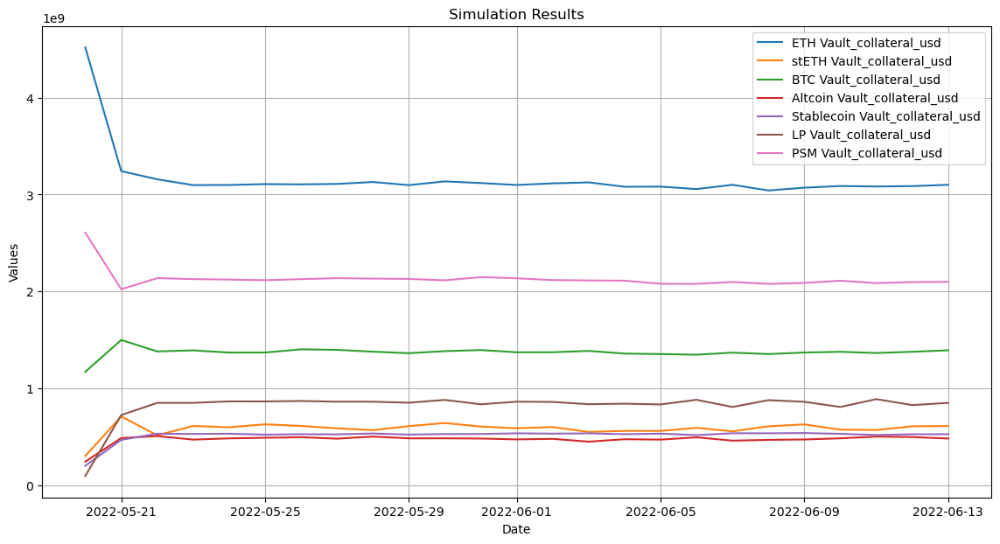

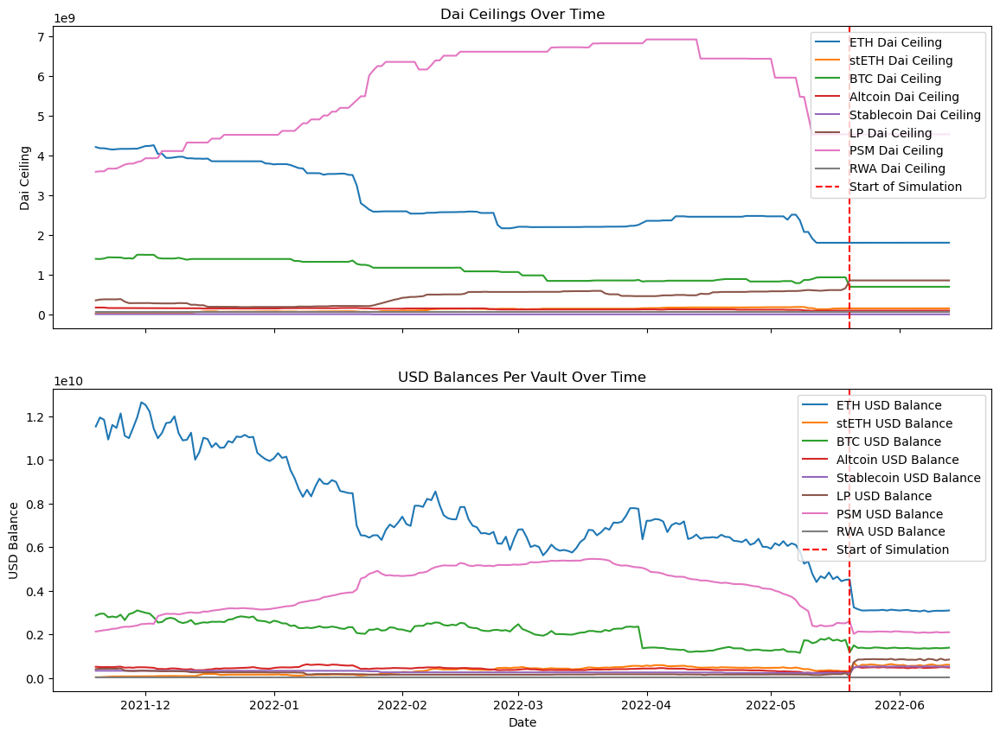

In [851]:


simulation_data = test_data_copy  # Assuming this is defined with your actual data
simulation_data.index = simulation_data.index.tz_localize(None)  # Remove timezone information
start_date = '2022-05-20'
end_date = '2024-03-20'

simulation = RL_VaultSimulator(simulation_data, simulation_data, features, targets, temporals, start_date, end_date, scale_factor=300000000, minimum_value_factor=0.05, volatility_window=250)
simulation.train_model()
simulation.run_simulation(start_date)
simulation.plot_simulation_results()


# Plot Dai ceilings and USD balances
vault_names = ['ETH', 'stETH', 'BTC', 'Altcoin', 'Stablecoin', 'LP', 'PSM', 'RWA']
simulation.plot_dai_ceilings_and_usd_balances(start_date, vault_names)

# Calculate error metrics against actual data (if available)
# Replace 'actual_data' with your actual data DataFrame if you have it
# simulation.calculate_error_metrics(actual_data)


result = simulation.results
evaluate_predictions(result, historical)

### Filter for MVO

In [852]:
historical_data = historical[historical.index <= '2022-05-19']

In [853]:
historical_data_mvo = historical_data.copy()

historical_data_mvo.index= historical_data_mvo.index.tz_localize(None)


In [854]:
result.index

DatetimeIndex(['2022-05-20', '2022-05-21', '2022-05-22', '2022-05-23',
               '2022-05-24', '2022-05-25', '2022-05-26', '2022-05-27',
               '2022-05-28', '2022-05-29', '2022-05-30', '2022-05-31',
               '2022-06-01', '2022-06-02', '2022-06-03', '2022-06-04',
               '2022-06-05', '2022-06-06', '2022-06-07', '2022-06-08',
               '2022-06-09', '2022-06-10', '2022-06-11', '2022-06-12'],
              dtype='datetime64[ns]', freq=None)

In [855]:
combined_data = pd.concat([historical_data_mvo, result])

# Optional: Sort the DataFrame by index if it's not already sorted
combined_data.sort_index(inplace=True)

# Now 'combined_data' contains both historical and simulation data in one DataFrame
print(combined_data)

            ETH Vault_collateral_usd  stETH Vault_collateral_usd  \
2021-11-19      11,530,810,569.93515            39,769,944.75450   
2021-11-20      11,943,278,353.68762            41,280,230.12684   
2021-11-21      11,839,472,041.02766            48,477,796.29037   
2021-11-22      10,933,452,742.14960            59,724,075.18165   
2021-11-23      11,600,116,135.99997            74,570,808.78308   
...                              ...                         ...   
2022-06-08       3,637,672,415.81178           550,722,733.28982   
2022-06-09       3,637,644,711.37109           550,732,825.32270   
2022-06-10       3,637,615,116.25696           550,743,668.82683   
2022-06-11       3,637,581,679.40944           550,758,021.54378   
2022-06-12       3,637,550,545.40515           550,773,133.39234   

            BTC Vault_collateral_usd  Altcoin Vault_collateral_usd  \
2021-11-19       2,866,222,769.09959             520,045,444.90519   
2021-11-20       2,948,959,833.37399       

In [856]:
historical_comparison = historical[historical.index <= '2022-06-12']
historical_comparison

,ETH Vault_collateral_usd,stETH Vault_collateral_usd,BTC Vault_collateral_usd,Altcoin Vault_collateral_usd,Stablecoin Vault_collateral_usd,LP Vault_collateral_usd,PSM Vault_collateral_usd
day,,,,,,,
2021-11-19 00:00:00+00:00,"11,530,810,569.93515","39,769,944.75450","2,866,222,769.09959","520,045,444.90519","336,521,697.42675","412,562,137.86644","2,132,251,251.20941"
2021-11-20 00:00:00+00:00,"11,943,278,353.68762","41,280,230.12684","2,948,959,833.37399","508,972,390.70129","336,521,697.42675","430,562,322.97248","2,164,546,578.27289"
2021-11-21 00:00:00+00:00,"11,839,472,041.02766","48,477,796.29037","2,951,818,107.21472","505,016,705.04971","336,521,697.42675","431,500,082.06578","2,195,743,029.10143"
2021-11-22 00:00:00+00:00,"10,933,452,742.14960","59,724,075.18165","2,788,017,226.13774","509,504,043.07337","336,503,182.74675","433,806,450.38492","2,215,601,174.20796"
2021-11-23 00:00:00+00:00,"11,600,116,135.99997","74,570,808.78308","2,821,788,807.21326","500,427,709.74620","336,503,182.74675","432,619,037.81609","2,258,244,677.18063"
...,...,...,...,...,...,...,...
2022-06-08 00:00:00+00:00,"4,050,060,265.43443","296,041,082.29670","1,089,669,916.28878","227,352,366.03357","233,744,001.91675","469,330,116.49566","3,047,997,695.49500"
2022-06-09 00:00:00+00:00,"4,019,070,946.78803","292,957,067.73844","1,081,641,959.07623","235,816,356.83017","233,743,991.91675","473,692,781.18026","3,067,429,845.05810"
2022-06-10 00:00:00+00:00,"3,541,923,869.83355","303,737,780.74378","1,042,921,620.89711","212,844,964.38839","233,743,991.91675","520,271,255.49190","3,073,483,141.21037"


In [857]:
result

,ETH Vault_collateral_usd,stETH Vault_collateral_usd,BTC Vault_collateral_usd,Altcoin Vault_collateral_usd,Stablecoin Vault_collateral_usd,LP Vault_collateral_usd,PSM Vault_collateral_usd
2022-05-20,"4,473,830,113.09779","334,903,347.41405","1,240,758,718.48997","238,999,273.73184","193,442,986.98972","-10,028,037.02689","2,666,879,365.34002"
2022-05-21,"3,755,609,053.91898","598,955,657.82916","1,393,430,545.72676","299,292,678.60810","365,407,942.91493","206,815,871.11995","2,519,274,017.91708"
2022-05-22,"3,637,979,306.60062","550,697,189.35701","1,156,707,741.68221","302,385,974.98340","426,429,915.31580","450,545,051.45965","2,614,040,588.63561"
2022-05-23,"3,638,076,984.64290","550,688,614.10567","1,156,171,925.21390","302,427,450.69185","426,349,612.44884","451,014,888.03669","2,614,056,292.89377"
2022-05-24,"3,638,053,875.70357","550,690,364.79748","1,156,169,916.53804","302,428,007.96972","426,360,434.47445","451,017,426.67151","2,614,065,741.87820"
2022-05-25,"3,638,030,296.00089","550,691,972.52964","1,156,169,174.92269","302,428,548.64497","426,371,374.28164","451,018,819.25215","2,614,075,582.40032"
2022-05-26,"3,638,005,805.29203","550,693,215.94693","1,156,169,142.64382","302,428,919.14954","426,383,156.38814","451,020,374.73625","2,614,085,153.87492"
2022-05-27,"3,637,982,724.87858","550,694,088.77010","1,156,169,223.37325","302,429,692.77641","426,394,296.60793","451,021,405.96235","2,614,094,335.66235"
2022-05-28,"3,637,958,855.18233","550,695,506.17206","1,156,168,845.27704","302,430,133.14066","426,405,549.95752","451,022,954.63564","2,614,103,923.66503"
2022-05-29,"3,637,933,424.88900","550,697,402.54389","1,156,168,286.93600","302,430,119.86577","426,417,513.91206","451,025,072.41768","2,614,113,947.46522"


## Environment Final

In [858]:
dai_ceilings = [
            'ETH Vault_dai_ceiling','stETH Vault_dai_ceiling','BTC Vault_dai_ceiling', 
    'Altcoin Vault_dai_ceiling','Stablecoin Vault_dai_ceiling','LP Vault_dai_ceiling','RWA Vault_dai_ceiling','PSM Vault_dai_ceiling'
        ]

class SimulationEnvironment:
    def __init__(self, simulator, start_date, end_date, agent=None):
        self.simulator = simulator
        self.start_date = pd.to_datetime(start_date).tz_localize(None)
        self.end_date = pd.to_datetime(end_date).tz_localize(None)
        self.current_date = self.start_date
        self.agent = agent
        self.action_log = []
        self.dai_ceiling = None
    
    def run(self, predefined_actions=None):
        state = self.reset()  # Ensures starting from a clean state every time
        done = False
        reward = 0
        while self.current_date <= self.end_date:
            next_cycle_date = min(self.current_date + pd.DateOffset(days=24), self.end_date)
            print(f"Running simulation from {self.current_date} to {next_cycle_date}")
            
            if predefined_actions:
                action = predefined_actions
            else:
                action = self.agent.agent_policy(state, self.dai_ceiling) if self.agent else None

            if action:
                print(f"Action at {self.current_date}: {action}")
                self.action_log.append({'date': self.current_date, 'action': action})
            else:
                print(f"No action taken at {self.current_date}")

            self.simulator.run_simulation(self.current_date.strftime('%Y-%m-%d'), action)
            state = self.get_state(self.current_date)
            print('state in run as of self.current_date', state)
            reward, current_weights = self.reward_function()  # Assumes this function is defined to handle rewards
            print(f"Reward at the end of the cycle on {next_cycle_date}: {reward}")

            self.current_date = next_cycle_date + pd.DateOffset(days=1)
            if self.current_date > self.end_date:
                done = True
                print(f"Reached or passed end date: stopping simulation at {self.current_date}")
                break
            
            print(f"Completed cycle up to {next_cycle_date}")
        return state, reward, done, {}

    def reset(self):
        self.simulator.reset()
        self.current_date = self.start_date
        print("Environment and simulator reset.")
        self.action_log.append({'date': self.current_date, 'env reset start date': self.start_date})
        self.simulator.current_date = self.current_date
        return self.get_state(self.current_date)

    def get_state(self, simulation_date):
        print('self date', self.current_date)
        print('self.simulator date', self.simulator.current_date)
        self.current_date = self.simulator.current_date
        simulation_date = self.simulator.current_date

        if simulation_date in self.simulator.data.index:
            state_data = self.simulator.data.loc[simulation_date, self.simulator.targets]
        else:
            previous_dates = self.simulator.data.index[self.simulator.data.index < simulation_date]
            if not previous_dates.empty:
                last_available_date = previous_dates[-1]
                state_data = self.simulator.data.loc[last_available_date, self.simulator.targets]
            else:
                state_data = self.simulator.data[self.simulator.targets].iloc[-1]

        total_value = state_data.sum()
        self.action_log.append({'date': self.current_date, 'get state calculated portfolio value': total_value})
        relative_weights = state_data / total_value if total_value != 0 else state_data
        print('relative weights:', relative_weights)
        print(f"Current state fetched for date {simulation_date}: {relative_weights}")
        return relative_weights.to_dict()

    def run_daily_simulation(self, simulation_date):
        volatilities = self.simulator.calculate_historical_volatility()
        if simulation_date in self.simulator.data.index:
            X_test = self.simulator.data.loc[[simulation_date], self.simulator.features]
        else:
            X_test = self.simulator.data.loc[self.simulator.data.index < simulation_date, self.simulator.features].iloc[-1].to_frame().T

        predictions = self.simulator.forecast(X_test, volatilities)
        self.simulator.update_state(pd.DatetimeIndex([simulation_date]), predictions)
        print(f"Simulation date {simulation_date} updated. Current data index: {self.simulator.data.index}")

    def step(self, action=None):
        reward = 0
        if action:
            print('action', action)
            self.simulator.apply_action(action)
            self.action_log.append({'date': self.current_date, 'action': action})

        if not hasattr(self, 'current_simulation_date') or self.current_simulation_date < self.start_date:
            self.current_simulation_date = self.start_date
        
        self.current_simulation_date += pd.DateOffset(days=1)
        
        if self.current_simulation_date <= self.end_date:
            self.run_daily_simulation(self.current_simulation_date)
            done = False
        else:
            done = True
            reward, current_weights = self.reward_function()

        current_state = self.get_state(self.current_simulation_date)
        return current_state, reward, done, {}

    def apply_action(self, action):
        for vault_name, adjustment in action.items():
            ...

        self.action_log.append({
            'date': self.current_date,
            'action': action,
            'additional_info': {}
        })

    def generate_action_dataframe(self):
        return pd.DataFrame(self.action_log)

    def reward_function(self):
        print('Simulator data for MVO:', self.simulator.data[self.simulator.targets])
        optimized_weights, returns, composition, total_portfolio_value = mvo(self.simulator.data)
        self.action_log.append({'date': self.current_date, 'mvo calculated current portfolio value': total_portfolio_value.iloc[-1]})
        self.action_log.append({'date': self.current_date, 'calculated optimized weights': optimized_weights})
        self.action_log.append({'date': self.current_date, 'current composition': composition.iloc[-1]})

        if self.agent is None:
            current_weights = composition.iloc[-1].to_dict()
            target_weights = {k: v for k, v in zip(composition.columns, optimized_weights)}
            print('Target weights (no agent):', target_weights)
        else:
            current_weights = composition.iloc[-1].to_dict()
            self.agent.target_weights = {k: v for k, v in zip(composition.columns, optimized_weights)}
            target_weights = self.agent.target_weights
            self.action_log.append({'date': self.current_date, 'agent weights updated to': target_weights})
            print('Agent weights updated:', target_weights)

        current_daily_returns, current_downside_returns, current_excess_returns, current_sortino_ratio = historical_sortino(returns, composition)
        self.action_log.append({'date': self.current_date, 'current sortino ratio': current_sortino_ratio})
        target_daily_returns, target_downside_returns, target_excess_returns, target_sortino_ratio = optimized_sortino(returns, optimized_weights)
        self.action_log.append({'date': self.current_date, 'target sortino ratio': target_sortino_ratio})
        self.action_log.append({'date': self.current_date, 'current weights': current_weights})
        self.action_log.append({'date': self.current_date, 'target weights': target_weights})
        print('Current Financials:')
        cumulative_return = visualize_mvo_results(current_daily_returns, current_downside_returns, current_excess_returns)
        self.action_log.append({'date': self.current_date, 'current cumulative return': cumulative_return.iloc[-1]})

        max_distance = sum(abs(1 - value) for value in target_weights.values())
        distance_penalty = sum(abs(current_weights.get(key, 0) - value) for key, value in target_weights.items()) / max_distance if max_distance != 0 else 0
        self.action_log.append({'date': self.current_date, 'Distance penalty': distance_penalty})

        sortino_scale = 100000
        scaled_sortino_diff = (target_sortino_ratio - current_sortino_ratio) / sortino_scale
        print('Sortino ratio:', current_sortino_ratio)
        print('Scaled Sortino diff:', scaled_sortino_diff)
        self.action_log.append({'date': self.current_date, 'Scaled Sortino diff': scaled_sortino_diff})

        reward = scaled_sortino_diff - distance_penalty
        reward_no_scale = current_sortino_ratio - distance_penalty
        self.action_log.append({'date': self.current_date, 'Reward': reward})
        self.action_log.append({'date': self.current_date, 'Reward no scale': reward_no_scale})

        self.dai_ceiling = self.simulator.data[dai_ceilings]
        self.action_log.append({'date': self.current_date, 'dai ceilings': self.dai_ceiling})
        print('reward', reward)
        
        return reward_no_scale, current_weights

# Assuming the necessary variables (simulation_data, features, targets, temporals) are defined and correct
simulator_simulation_data = test_data_copy  # Assuming this is correctly defined with your actual data

start_date = '2022-05-20'
end_date = '2022-07-01'
actions = {'stETH Vault_dai_ceiling': 5, 'ETH Vault_dai_ceiling': -5}  # Example action

test_simulator = MVO_VaultSimulator(simulator_simulation_data, test_data_copy, features, targets, temporals, start_date, end_date)
test_simulator.train_model()

test_environment = SimulationEnvironment(test_simulator, start_date, end_date)
test_environment.run(actions)

test_simulator.plot_simulation_results()

sim_results = test_simulator.results
duplicates = sim_results.index.duplicated()
if duplicates.any():
    print(f"Duplicated indexes found: {sim_results.index[duplicates]}")


In [859]:
class SimulationEnvironment:
    def __init__(self, simulator, start_date, end_date, agent=None):
        self.simulator = simulator
        self.start_date = pd.to_datetime(start_date).tz_localize(None)
        self.end_date = pd.to_datetime(end_date).tz_localize(None)
        self.current_date = self.start_date 
        self.agent = agent
        self.action_log = []
        self.dai_ceiling = None
        self.previous_total_portfolio_value = None  # Initialize previous total portfolio value
        self.value_change_factor = 1
        
    def run(self, predefined_actions=None):
        state = self.reset()  # Ensures starting from a clean state every time
        done = False
        reward = 0
        while self.current_date <= self.end_date:
            next_cycle_date = min(self.current_date + pd.DateOffset(days=24), self.end_date)
            print(f"Running simulation from {self.current_date} to {next_cycle_date}")
            
            if predefined_actions:
                action = predefined_actions
            else:
                action = self.agent.agent_policy(state, self.dai_ceiling) if self.agent else None

            if action:
                print(f"Action at {self.current_date}: {action}")
                self.action_log.append({'date': self.current_date, 'action': action})
            else:
                print(f"No action taken at {self.current_date}")

            self.simulator.run_simulation(self.current_date.strftime('%Y-%m-%d'), action)
            state = self.get_state(self.current_date)
            print('state in run as of self.current_date', state)
            reward, current_weights = self.reward_function()  # Assumes this function is defined to handle rewards
            print(f"Reward at the end of the cycle on {next_cycle_date}: {reward}")

            self.current_date = next_cycle_date + pd.DateOffset(days=1)
            if self.current_date > self.end_date:
                done = True
                print(f"Reached or passed end date: stopping simulation at {self.current_date}")
                break
            
            print(f"Completed cycle up to {next_cycle_date}")
        return state, reward, done, {}

    def reset(self):
        self.simulator.reset()
        self.current_date = self.start_date
        print("Environment and simulator reset.")
        self.action_log.append({'date': self.current_date, 'env reset start date': self.start_date})
        self.simulator.current_date = self.current_date
        return self.get_state(self.current_date)

    def get_state(self, simulation_date):
        print('self date', self.current_date)
        print('self.simulator date', self.simulator.current_date)
        self.current_date = self.simulator.current_date
        print('new self date', self.current_date)
        simulation_date = self.simulator.current_date

        if simulation_date in self.simulator.data.index:
            state_data = self.simulator.data.loc[simulation_date, self.simulator.targets]
        else:
            previous_dates = self.simulator.data.index[self.simulator.data.index < simulation_date]
            if not previous_dates.empty:
                last_available_date = previous_dates[-1]
                state_data = self.simulator.data.loc[last_available_date, self.simulator.targets]
            else:
                state_data = self.simulator.data[self.simulator.targets].iloc[-1]

        total_value = state_data.sum()
        self.action_log.append({'date': self.current_date, 'get state calculated portfolio value': total_value})
        relative_weights = state_data / total_value if total_value != 0 else state_data
        print('relative weights:', relative_weights)
        print(f"Current state fetched for date {simulation_date}: {relative_weights}")
        return relative_weights.to_dict()

    def run_daily_simulation(self, simulation_date):
        volatilities = self.simulator.calculate_historical_volatility()
        if simulation_date in self.simulator.data.index:
            X_test = self.simulator.data.loc[[simulation_date], self.simulator.features]
        else:
            X_test = self.simulator.data.loc[self.simulator.data.index < simulation_date, self.simulator.features].iloc[-1].to_frame().T

        predictions = self.simulator.forecast(X_test, volatilities)
        self.simulator.update_state(pd.DatetimeIndex([simulation_date]), predictions)
   
    def step(self, action=None):
        reward = 0
        if action:
            print('action', action)
            self.simulator.apply_action(action)
            self.action_log.append({'date': self.current_date, 'action': action})

        if not hasattr(self, 'current_simulation_date') or self.current_simulation_date < self.start_date:
            self.current_simulation_date = self.start_date
        
        self.current_simulation_date += pd.DateOffset(days=1)
        
        if self.current_simulation_date <= self.end_date:
            self.run_daily_simulation(self.current_simulation_date)
            done = False
        else:
            done = True
            reward, current_weights = self.reward_function()

        current_state = self.get_state(self.current_simulation_date)
        return current_state, reward, done, {}

    def apply_action(self, action):
        for vault_name, adjustment in action.items():
            ...

        self.action_log.append({
            'date': self.current_date,
            'action': action,
            'additional_info': {}
        })

    def generate_action_dataframe(self):
        return pd.DataFrame(self.action_log)

    def reward_function(self):
        print('Simulator data for MVO:', self.simulator.data[self.simulator.targets])
        optimized_weights, returns, composition, total_portfolio_value = mvo(self.simulator.data)
        self.action_log.append({'date': self.current_date, 'mvo calculated current portfolio value': total_portfolio_value.iloc[-1]})
        self.action_log.append({'date': self.current_date, 'calculated optimized weights': optimized_weights})
        self.action_log.append({'date': self.current_date, 'current composition': composition.iloc[-1]})

        if self.agent is None:
            current_weights = composition.iloc[-1].to_dict()
            target_weights = {k: v for k, v in zip(composition.columns, optimized_weights)}
            print('Target weights (no agent):', target_weights)
        else:
            current_weights = composition.iloc[-1].to_dict()
            self.agent.target_weights = {k: v for k, v in zip(composition.columns, optimized_weights)}
            target_weights = self.agent.target_weights
            self.action_log.append({'date': self.current_date, 'agent weights updated to': target_weights})
            print('Agent weights updated:', target_weights)

        current_daily_returns, current_downside_returns, current_excess_returns, current_sortino_ratio = historical_sortino(returns, composition)
        self.action_log.append({'date': self.current_date, 'current sortino ratio': current_sortino_ratio})
        target_daily_returns, target_downside_returns, target_excess_returns, target_sortino_ratio = optimized_sortino(returns, optimized_weights)
        self.action_log.append({'date': self.current_date, 'target sortino ratio': target_sortino_ratio})
        self.action_log.append({'date': self.current_date, 'current weights': current_weights})
        self.action_log.append({'date': self.current_date, 'target weights': target_weights})
        print('Current Financials:')
        cumulative_return = visualize_mvo_results(current_daily_returns, current_downside_returns, current_excess_returns)
        self.action_log.append({'date': self.current_date, 'current cumulative return': cumulative_return.iloc[-1]})

        max_distance = sum(abs(1 - value) for value in target_weights.values())
        distance_penalty = sum(abs(current_weights.get(key, 0) - value) for key, value in target_weights.items()) / max_distance if max_distance != 0 else 0
        self.action_log.append({'date': self.current_date, 'Distance penalty': distance_penalty})

        sortino_scale = 100000
        scaled_sortino_diff = (target_sortino_ratio - current_sortino_ratio) / sortino_scale
        print('Sortino ratio:', current_sortino_ratio)
        print('Scaled Sortino diff:', scaled_sortino_diff)
        self.action_log.append({'date': self.current_date, 'Scaled Sortino diff': scaled_sortino_diff})

        # Calculate the percentage change in total portfolio value
        if self.previous_total_portfolio_value is not None:
            portfolio_value_change_pct = (total_portfolio_value.iloc[-1] - self.previous_total_portfolio_value) / self.previous_total_portfolio_value
        else:
            portfolio_value_change_pct = 0  # No change if there is no previous value
        
        # Scale the portfolio value change percentage
        scaled_portfolio_value_change = portfolio_value_change_pct * self.value_change_factor
        print('port change pct', portfolio_value_change_pct)
        print('scaled port change', scaled_portfolio_value_change)
        
        # Update the previous total portfolio value
        self.previous_total_portfolio_value = total_portfolio_value.iloc[-1]
        
        # Incorporate the scaled percentage change in total portfolio value into the reward
        reward = scaled_sortino_diff - distance_penalty + scaled_portfolio_value_change
        reward_no_scale = current_sortino_ratio - distance_penalty + scaled_portfolio_value_change
        
        self.action_log.append({'date': self.current_date, 'Reward': reward})
        self.action_log.append({'date': self.current_date, 'Reward no scale': reward_no_scale})

        self.dai_ceiling = self.simulator.data[dai_ceilings]
        self.action_log.append({'date': self.current_date, 'dai ceilings': self.dai_ceiling})
        print('reward', reward)
        
        return reward_no_scale, current_weights


Model trained.
Model trained.
sim reset current date 2022-05-20 00:00:00
Simulation reset and model retrained.
Environment and simulator reset.
self date 2022-05-20 00:00:00
self.simulator date 2022-05-20 00:00:00
new self date 2022-05-20 00:00:00
relative weights: ETH Vault_collateral_usd          0.48311
stETH Vault_collateral_usd        0.03406
BTC Vault_collateral_usd          0.11377
Altcoin Vault_collateral_usd      0.03133
Stablecoin Vault_collateral_usd   0.02558
LP Vault_collateral_usd           0.02785
PSM Vault_collateral_usd          0.28431
Name: 2022-05-20 00:00:00, dtype: float64
Current state fetched for date 2022-05-20 00:00:00: ETH Vault_collateral_usd          0.48311
stETH Vault_collateral_usd        0.03406
BTC Vault_collateral_usd          0.11377
Altcoin Vault_collateral_usd      0.03133
Stablecoin Vault_collateral_usd   0.02558
LP Vault_collateral_usd           0.02785
PSM Vault_collateral_usd          0.28431
Name: 2022-05-20 00:00:00, dtype: float64
Running si

C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\si

current state ETH Vault_collateral_usd                 3,189,289,124.42824
stETH Vault_collateral_usd                 790,586,303.86375
BTC Vault_collateral_usd                 1,535,186,615.27018
Altcoin Vault_collateral_usd               456,127,953.21460
Stablecoin Vault_collateral_usd            469,742,425.33369
                                                 ...        
Stablecoin Vault_collateral_usd_30d_ma     241,068,923.84818
LP Vault_collateral_usd_30d_ma             180,755,698.84493
PSM Vault_collateral_usd_30d_ma          3,372,331,742.54073
RWA Vault_collateral_usd_30d_ma             50,870,409.00000
RWA Vault_prev_dai_ceiling                  59,000,000.00000
Name: 2022-05-21 00:00:00, Length: 85, dtype: float64
vault stETH Vault_dai_ceiling
Applying action to: stETH Vault_dai_ceiling
Adjusted stETH Vault_dai_ceiling by 5% from 157305774.47458437 to 165171063.1983136
vault ETH Vault_dai_ceiling
Applying action to: ETH Vault_dai_ceiling
Adjusted ETH Vault_dai_ceiling by

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


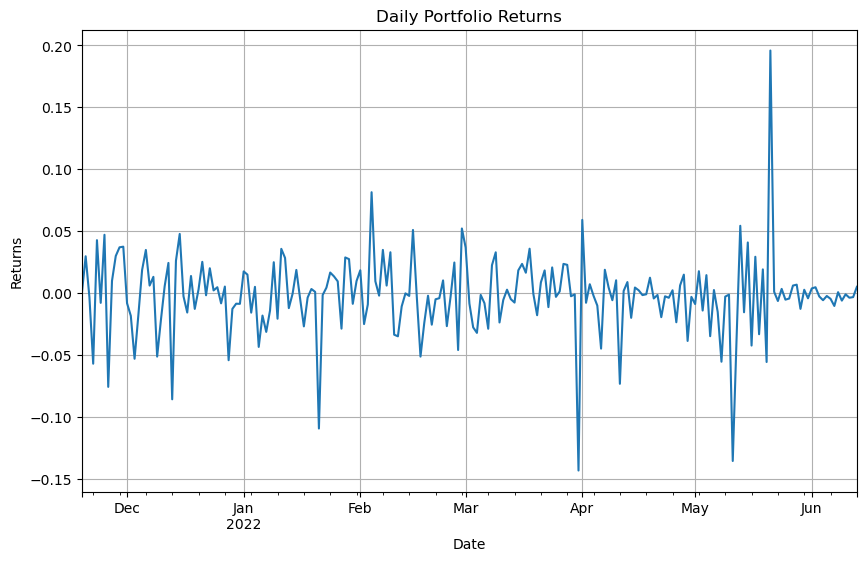

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


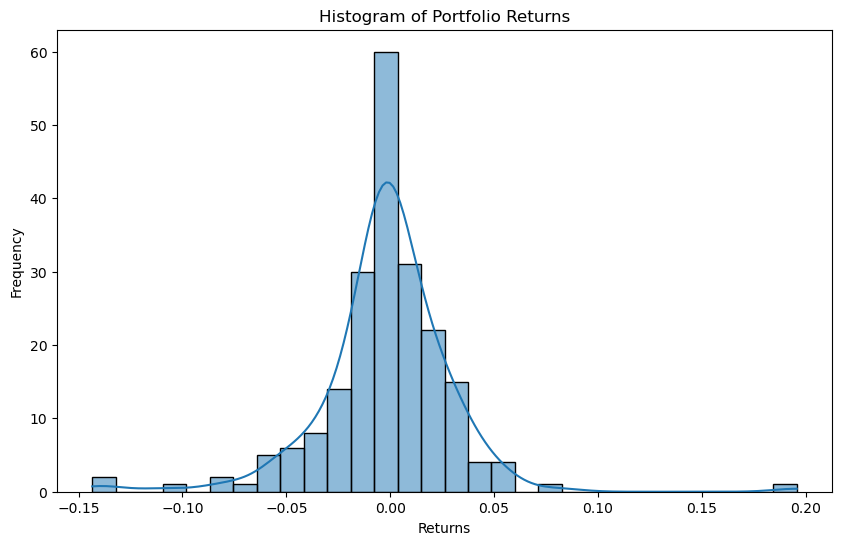

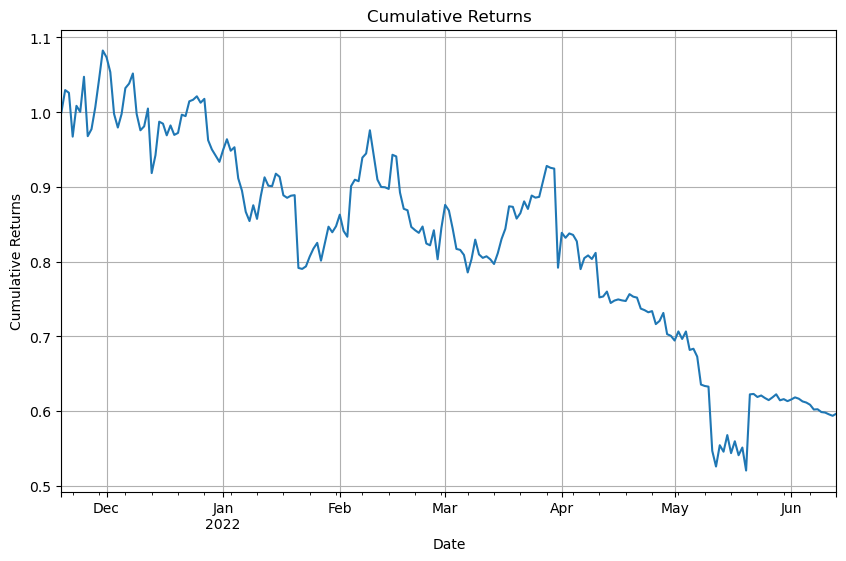

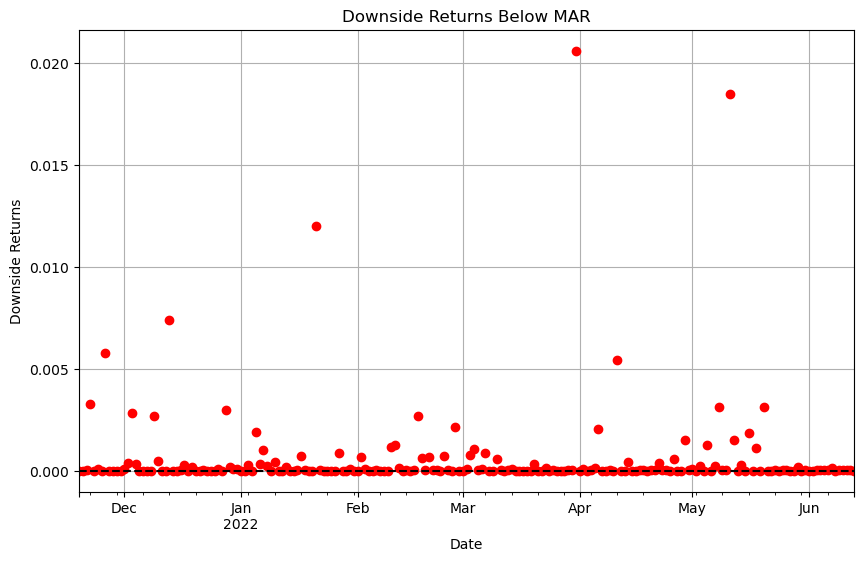

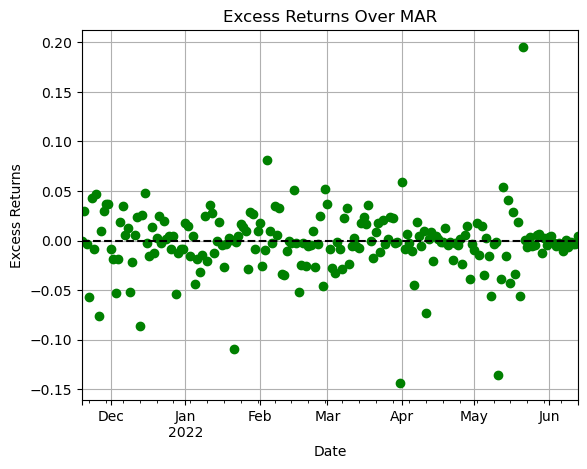

Sortino ratio: -1.3293209052646149
Scaled Sortino diff: 0.0001549895718933869
port change pct 0
scaled port change 0
reward -0.13151001209814323
Reward at the end of the cycle on 2022-06-13 00:00:00: -1.4609859069346516
Completed cycle up to 2022-06-13 00:00:00
Running simulation from 2022-06-14 00:00:00 to 2022-07-01 00:00:00
Action at 2022-06-14 00:00:00: {'stETH Vault_dai_ceiling': 5, 'ETH Vault_dai_ceiling': -5}
current state ETH Vault_collateral_usd                 2,055,664,029.39072
stETH Vault_collateral_usd                 883,483,716.05334
BTC Vault_collateral_usd                 1,542,186,195.11012
Altcoin Vault_collateral_usd               561,424,687.34547
Stablecoin Vault_collateral_usd            483,579,129.22483
                                                 ...        
Stablecoin Vault_collateral_usd_30d_ma     454,863,880.99935
LP Vault_collateral_usd_30d_ma             703,177,002.91814
PSM Vault_collateral_usd_30d_ma          2,398,255,715.88840
RWA Vault_collate

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


Daily downside deviation: 0.024238509511643917
Annualized downside deviation: 0.4630760740108575
Annualized excess return: 7.3992350553055655
Sortino Ratio: 15.978443868235956
Current Financials:


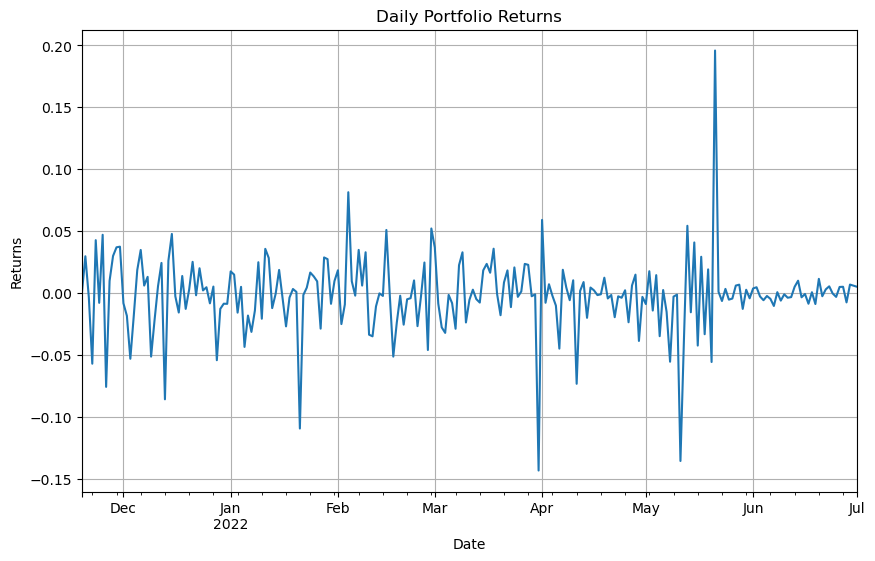

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


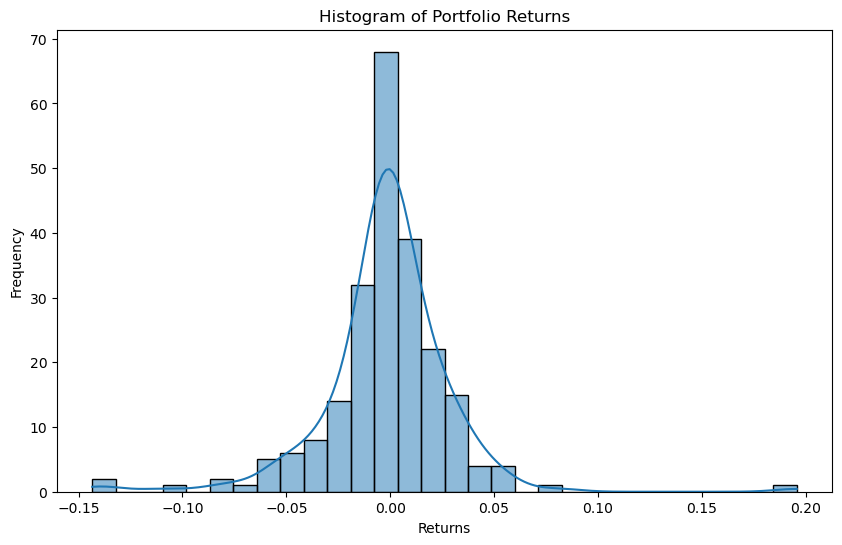

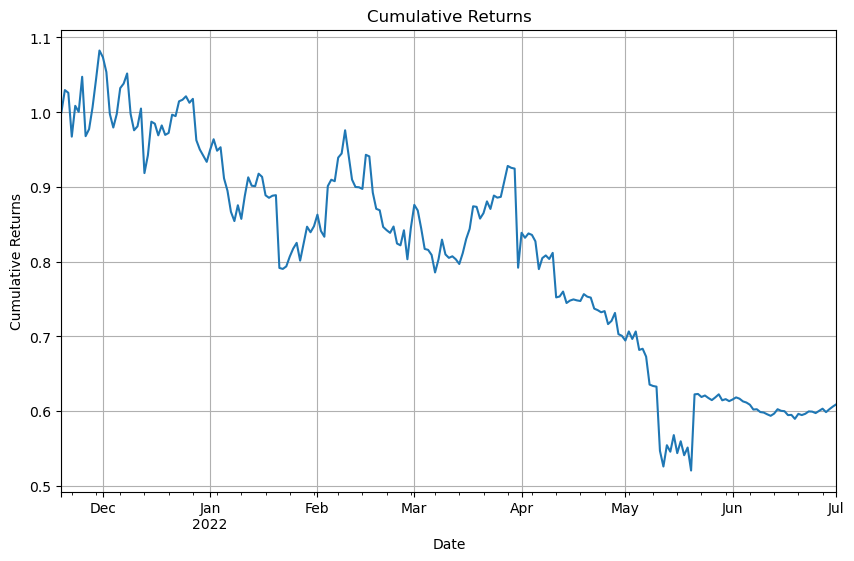

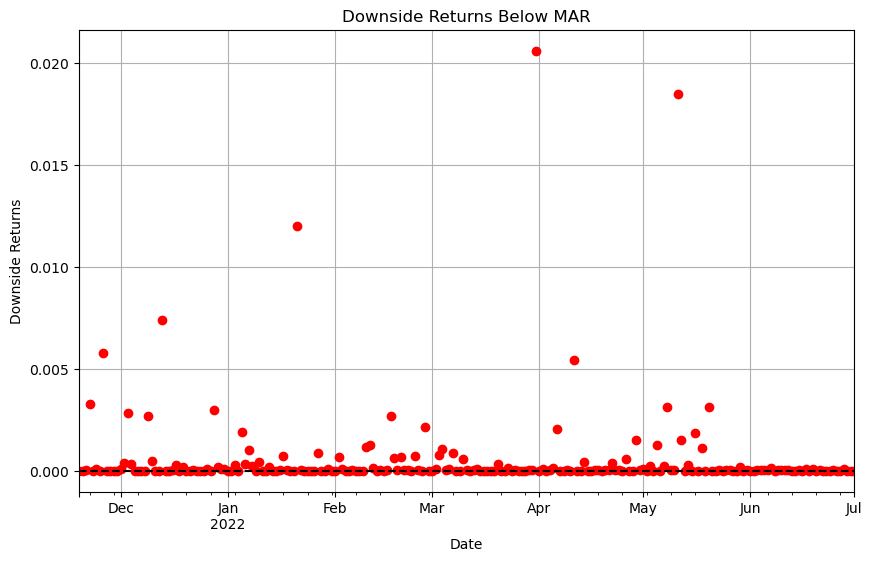

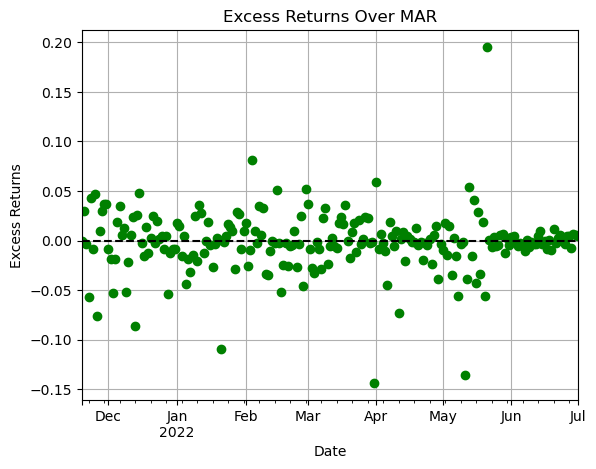

Sortino ratio: -1.2876827255564731
Scaled Sortino diff: 0.00017266126593792428
port change pct 0.013224312067766192
scaled port change 0.013224312067766192
reward -0.10889459401356343
Reward at the end of the cycle on 2022-07-01 00:00:00: -1.3967499808359745
Reached or passed end date: stopping simulation at 2022-07-02 00:00:00


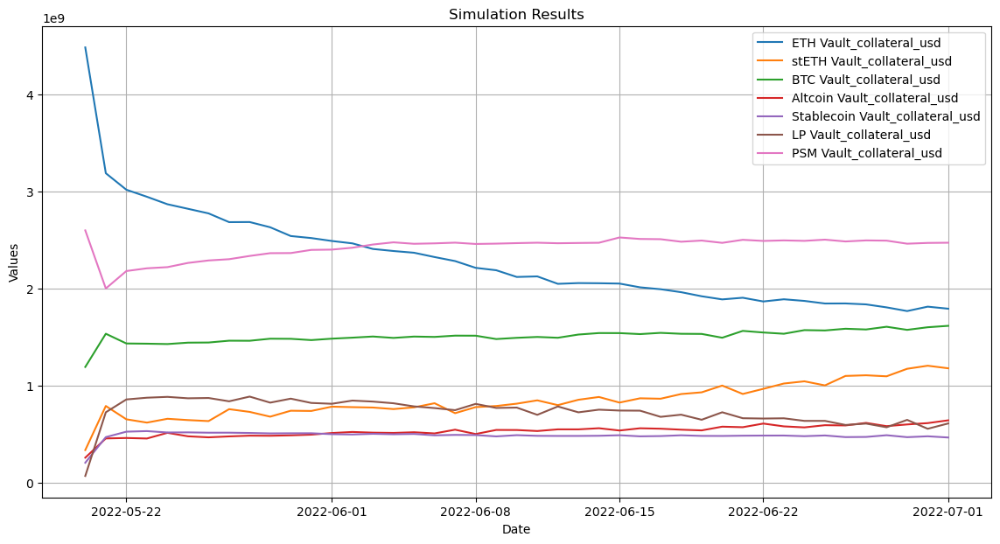

In [860]:
test_data_copy.index = test_data_copy.index.tz_localize(None)

# Assuming the necessary variables (simulation_data, features, targets, temporals) are defined and correct
simulator_simulation_data = test_data_copy  # Assuming this is correctly defined with your actual data

start_date = '2022-05-20'
end_date = '2022-07-01'
actions = {'stETH Vault_dai_ceiling': 5, 'ETH Vault_dai_ceiling': -5}  # Example action
 
test_simulator = RL_VaultSimulator(simulation_data, simulation_data, features, targets, temporals, start_date, end_date, scale_factor=300000000, minimum_value_factor=0.05, volatility_window=250)

#test_simulator.set_parameters(scale_factor=300000000, minimum_value_factor=0.05, volatility_window=250)
test_simulator.train_model()

test_environment = SimulationEnvironment(test_simulator, start_date, end_date)
test_environment.run(actions)

test_simulator.plot_simulation_results()


### Results of Sim

In [861]:
test_data_copy[['mcap_total_volume']]

,mcap_total_volume
day,
2021-11-19,"148,816,900,268.08923"
2021-11-20,"129,054,430,634.73094"
2021-11-21,"119,273,368,298.65698"
2021-11-22,"144,878,354,973.50381"
2021-11-23,"154,531,715,413.08652"
...,...
2024-03-16,"157,322,483,727.65988"
2024-03-17,"157,140,337,241.97678"
2024-03-18,"165,358,124,996.38553"


In [862]:
sim_results = test_simulator.results
sim_results.describe()

,ETH Vault_collateral_usd,stETH Vault_collateral_usd,BTC Vault_collateral_usd,Altcoin Vault_collateral_usd,Stablecoin Vault_collateral_usd,LP Vault_collateral_usd,PSM Vault_collateral_usd
count,43.00000,43.00000,43.00000,43.00000,43.00000,43.00000,43.00000
mean,"2,297,920,587.55541","846,200,391.51495","1,508,513,148.92707","530,893,745.38801","485,529,352.34078","730,843,572.43223","2,426,806,320.57905"
std,"516,263,920.56625","175,456,720.55311","69,076,643.10063","63,676,372.41701","46,598,598.01844","139,805,254.93454","112,968,576.50274"
min,"1,768,853,544.01254","336,112,889.61807","1,192,689,137.31952","258,056,991.13981","205,853,262.78254","69,259,586.82467","2,001,562,241.34568"
25%,"1,898,305,092.44970","749,848,916.07924","1,483,473,992.23131","498,398,117.68370","481,145,407.10108","662,473,488.33461","2,400,760,618.79902"
50%,"2,126,142,200.82015","814,461,942.00291","1,506,579,372.11447","539,143,017.51966","488,222,022.90857","747,565,076.10595","2,470,521,555.54470"
75%,"2,531,685,130.27308","949,299,045.40211","1,543,228,056.24265","570,963,630.67900","503,078,350.38820","823,506,217.67396","2,492,078,713.90579"
max,"4,485,951,755.97101","1,205,595,346.07879","1,616,720,909.89435","642,879,285.83487","531,755,438.02415","887,482,233.74970","2,600,446,990.41517"


In [863]:
sim_results.index.duplicated()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False])

### Backtesting to Historical Data 

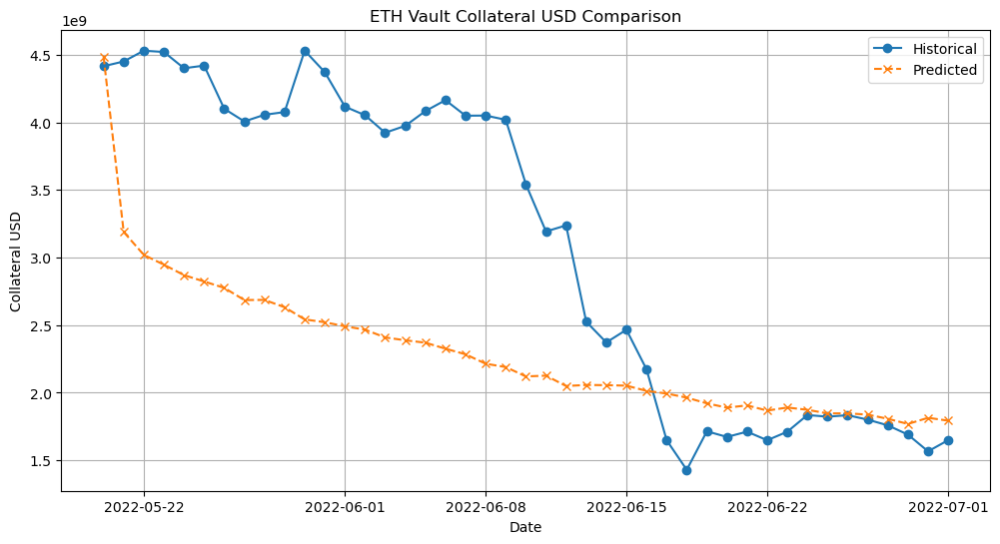

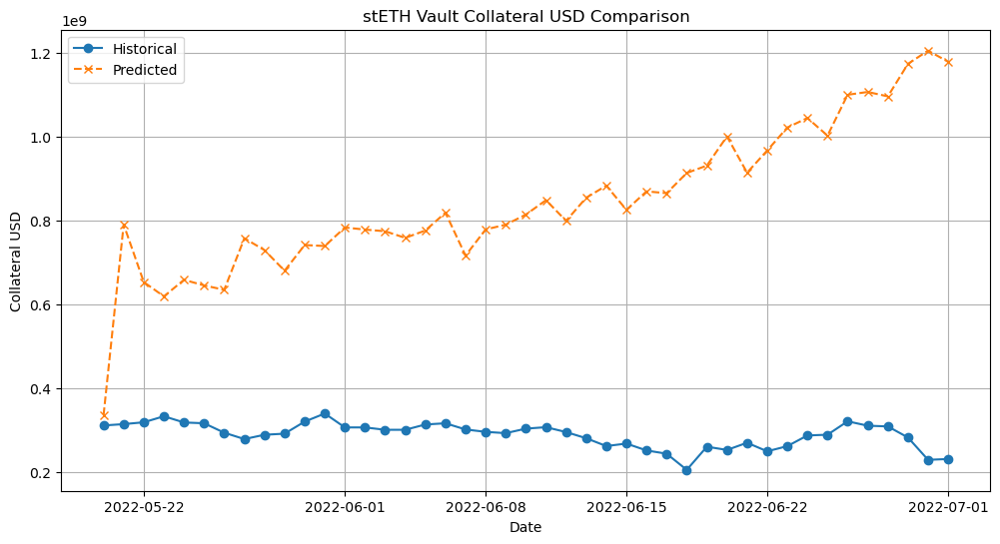

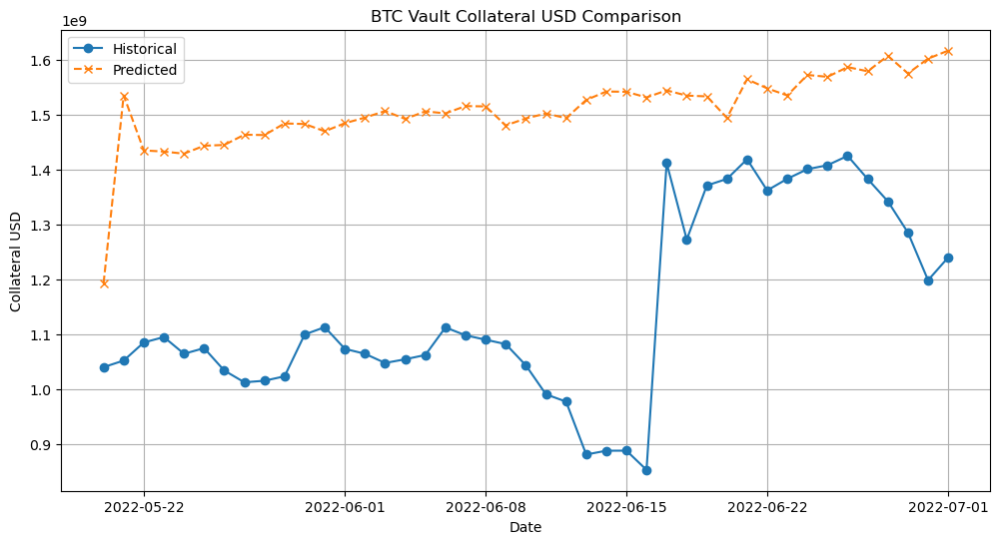

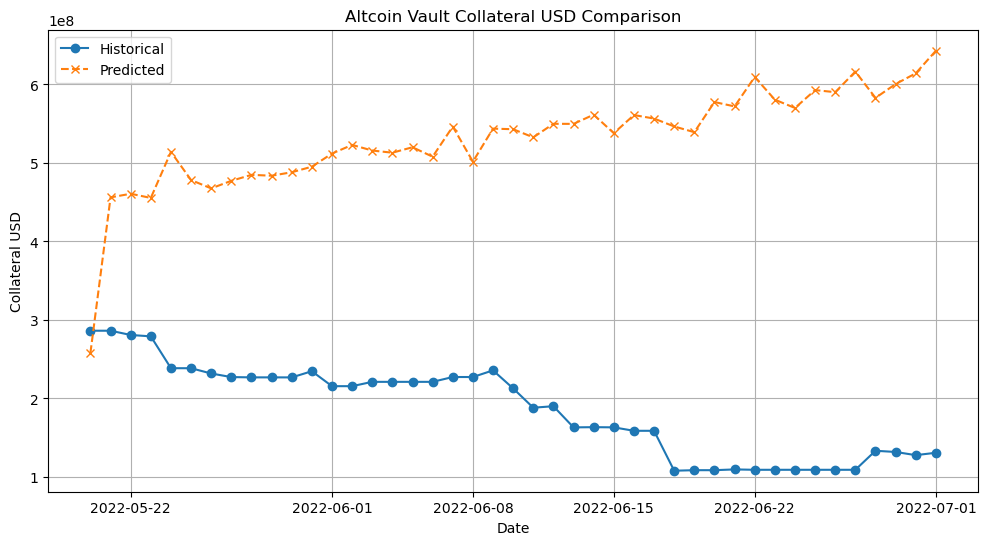

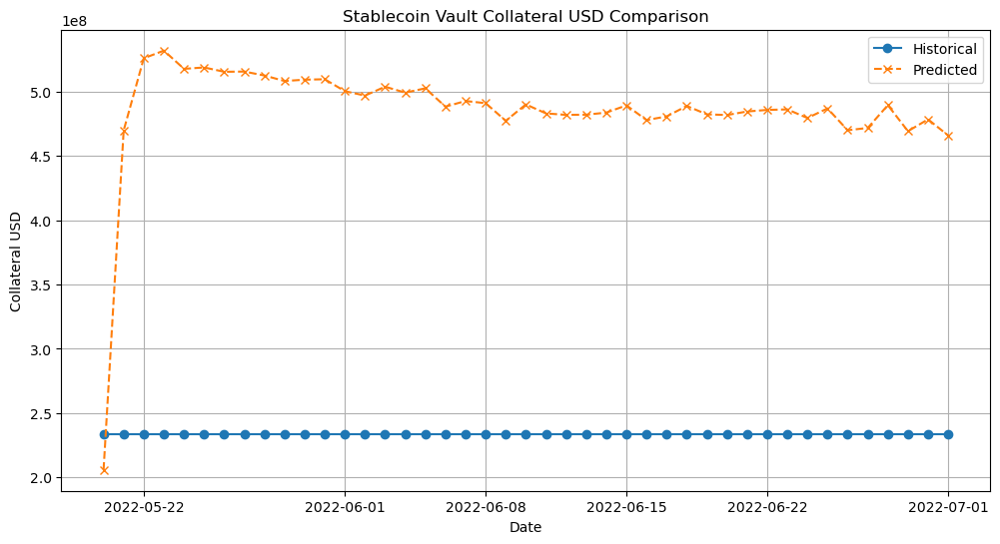

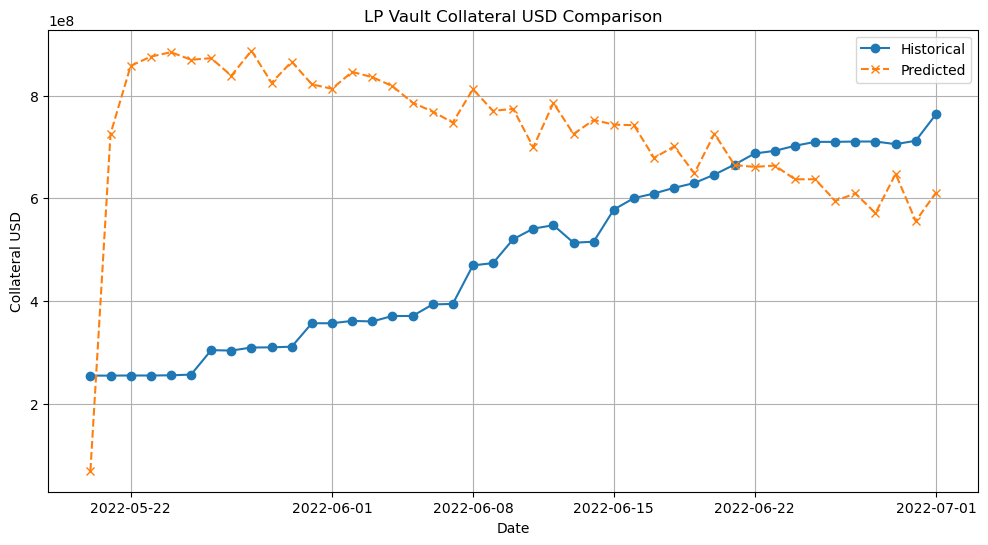

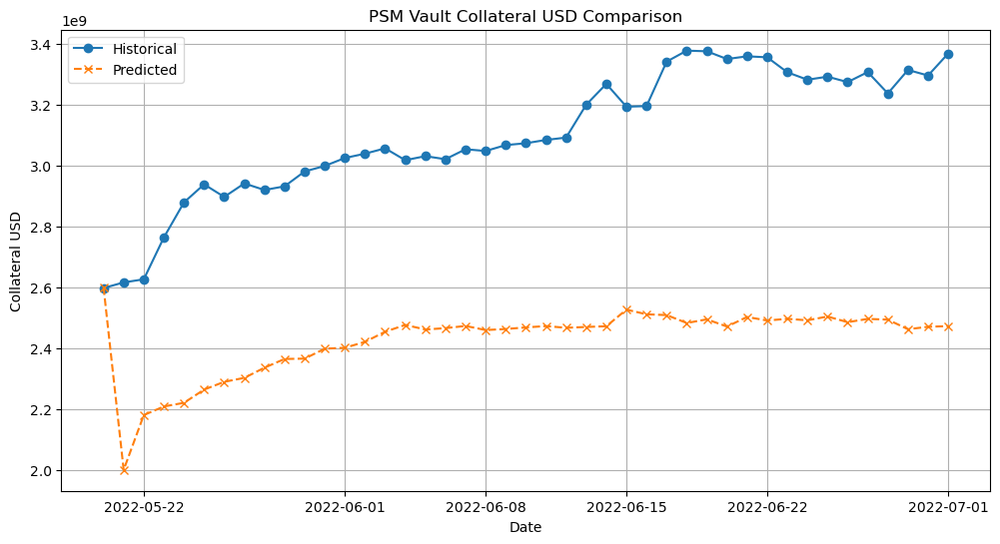

{'ETH Vault': {'MSE': 1.3484539487024228e+18,
  'MAE': 923146682.3458426,
  'RMSE': 1161229498.7221186,
  'R2': 0.008104912478758441},
 'stETH Vault': {'MSE': 3.462457413794031e+17,
  'MAE': 556952904.7904323,
  'RMSE': 588426496.1568294,
  'R2': -394.3356397340626},
 'BTC Vault': {'MSE': 1.5578377498907066e+17,
  'MAE': 364679551.13826144,
  'RMSE': 394694533.7714606,
  'R2': -4.519842500595215},
 'Altcoin Vault': {'MSE': 1.3192556136310488e+17,
  'MAE': 346057353.6405717,
  'RMSE': 363215585.2425731,
  'R2': -38.87991718648099},
 'Stablecoin Vault': {'MSE': 6.551679011665071e+16,
  'MAE': 253082589.27521735,
  'RMSE': 255962477.94676998,
  'R2': -119515232311526.56},
 'LP Vault': {'MSE': 1.2669126049570163e+17,
  'MAE': 292218539.2677724,
  'RMSE': 355937158.07105845,
  'R2': -3.3999421803389334},
 'PSM Vault': {'MSE': 4.8121497113214394e+17,
  'MAE': 675523926.2358071,
  'RMSE': 693696598.7606858,
  'R2': -9.860895571669484}}

In [864]:
evaluate_predictions(sim_results, historical)

### MVO Comparison cleaning

In [865]:
test_data['RWA Vault_collateral_usd']

day
2021-11-19 00:00:00+00:00    50,870,409.00000
2021-11-20 00:00:00+00:00    50,870,409.00000
2021-11-21 00:00:00+00:00    50,870,409.00000
2021-11-22 00:00:00+00:00    50,870,409.00000
2021-11-23 00:00:00+00:00    50,870,409.00000
                                   ...       
2024-03-16 00:00:00+00:00   303,771,975.92692
2024-03-17 00:00:00+00:00   303,771,975.92692
2024-03-18 00:00:00+00:00   303,771,975.92692
2024-03-19 00:00:00+00:00   303,771,975.92692
2024-03-20 00:00:00+00:00   303,771,975.92692
Name: RWA Vault_collateral_usd, Length: 854, dtype: float64

In [866]:
start_date_dt = pd.to_datetime(start_date)  # Convert string to datetime
historical_cutoff = start_date_dt - pd.DateOffset(days=1)
historical_cutoff

Timestamp('2022-05-19 00:00:00')

In [867]:
historical_data = historical[historical.index <= historical_cutoff]
combined_data = pd.concat([historical_data, sim_results])
print(combined_data)


            ETH Vault_collateral_usd  stETH Vault_collateral_usd  \
2021-11-19      11,530,810,569.93515            39,769,944.75450   
2021-11-20      11,943,278,353.68762            41,280,230.12684   
2021-11-21      11,839,472,041.02766            48,477,796.29037   
2021-11-22      10,933,452,742.14960            59,724,075.18165   
2021-11-23      11,600,116,135.99997            74,570,808.78308   
...                              ...                         ...   
2022-06-27       1,837,706,013.11187         1,107,014,972.38520   
2022-06-28       1,806,916,277.26846         1,096,443,659.97943   
2022-06-29       1,768,853,544.01254         1,174,030,560.97779   
2022-06-30       1,814,327,478.09347         1,205,595,346.07879   
2022-07-01       1,793,151,410.86437         1,178,961,657.93554   

            BTC Vault_collateral_usd  Altcoin Vault_collateral_usd  \
2021-11-19       2,866,222,769.09959             520,045,444.90519   
2021-11-20       2,948,959,833.37399       

,ETH Vault_collateral_usd,stETH Vault_collateral_usd,BTC Vault_collateral_usd,Altcoin Vault_collateral_usd,Stablecoin Vault_collateral_usd,LP Vault_collateral_usd,PSM Vault_collateral_usd,RWA Vault_collateral_usd
2021-11-19,"11,530,810,569.93515","39,769,944.75450","2,866,222,769.09959","520,045,444.90519","336,521,697.42675","412,562,137.86644","2,132,251,251.20941","50,870,409.00000"
2021-11-20,"11,943,278,353.68762","41,280,230.12684","2,948,959,833.37399","508,972,390.70129","336,521,697.42675","430,562,322.97248","2,164,546,578.27289","50,870,409.00000"
2021-11-21,"11,839,472,041.02766","48,477,796.29037","2,951,818,107.21472","505,016,705.04971","336,521,697.42675","431,500,082.06578","2,195,743,029.10143","50,870,409.00000"
2021-11-22,"10,933,452,742.14960","59,724,075.18165","2,788,017,226.13774","509,504,043.07337","336,503,182.74675","433,806,450.38492","2,215,601,174.20796","50,870,409.00000"
2021-11-23,"11,600,116,135.99997","74,570,808.78308","2,821,788,807.21326","500,427,709.74620","336,503,182.74675","432,619,037.81609","2,258,244,677.18063","50,870,409.00000"
...,...,...,...,...,...,...,...,...
2022-06-27,"1,837,706,013.11187","1,107,014,972.38520","1,579,059,452.31742","616,359,233.96633","471,645,468.28774","609,379,396.19917","2,497,006,609.02685","50,870,409.00000"
2022-06-28,"1,806,916,277.26846","1,096,443,659.97943","1,607,254,682.65916","582,828,662.46451","489,357,288.12750","571,134,438.84581","2,494,577,890.46735","50,870,409.00000"
2022-06-29,"1,768,853,544.01254","1,174,030,560.97779","1,575,166,693.92176","600,449,903.12111","469,144,119.28266","647,469,850.37274","2,463,134,248.66613","50,870,409.00000"
2022-06-30,"1,814,327,478.09347","1,205,595,346.07879","1,602,138,671.70599","614,096,187.28702","478,350,254.51340","555,639,888.26358","2,471,117,311.83631","50,870,409.00000"


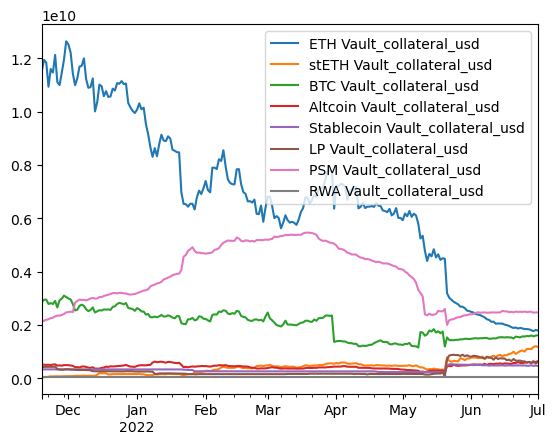

In [868]:
combined_data.index = combined_data.index.tz_localize(None)
test_data['RWA Vault_collateral_usd'].index = test_data['RWA Vault_collateral_usd'].index.tz_localize(None)


#Since RWA is not a target, we need to add back in for MVO calculations
sim_w_RWA = combined_data.merge(test_data['RWA Vault_collateral_usd'], left_index=True, right_index=True, how='left')
# Optional: Sort the DataFrame by index if it's not already sorted
sim_w_RWA.sort_index(inplace=True)

# Now 'combined_data' contains both historical and simulation data in one DataFrame
sim_w_RWA.plot()
sim_w_RWA

In [869]:
sim_cutoff = sim_w_RWA.index.max()
sim_cutoff

Timestamp('2022-07-01 00:00:00')

,ETH Vault_collateral_usd,stETH Vault_collateral_usd,BTC Vault_collateral_usd,Altcoin Vault_collateral_usd,Stablecoin Vault_collateral_usd,LP Vault_collateral_usd,PSM Vault_collateral_usd,RWA Vault_collateral_usd
day,,,,,,,,
2021-11-19,"11,530,810,569.93515","39,769,944.75450","2,866,222,769.09959","520,045,444.90519","336,521,697.42675","412,562,137.86644","2,132,251,251.20941","50,870,409.00000"
2021-11-20,"11,943,278,353.68762","41,280,230.12684","2,948,959,833.37399","508,972,390.70129","336,521,697.42675","430,562,322.97248","2,164,546,578.27289","50,870,409.00000"
2021-11-21,"11,839,472,041.02766","48,477,796.29037","2,951,818,107.21472","505,016,705.04971","336,521,697.42675","431,500,082.06578","2,195,743,029.10143","50,870,409.00000"
2021-11-22,"10,933,452,742.14960","59,724,075.18165","2,788,017,226.13774","509,504,043.07337","336,503,182.74675","433,806,450.38492","2,215,601,174.20796","50,870,409.00000"
2021-11-23,"11,600,116,135.99997","74,570,808.78308","2,821,788,807.21326","500,427,709.74620","336,503,182.74675","432,619,037.81609","2,258,244,677.18063","50,870,409.00000"
...,...,...,...,...,...,...,...,...
2022-06-27,"1,800,714,480.55214","310,731,600.93738","1,382,529,579.79071","109,208,152.59284","233,743,997.45382","710,606,118.37480","3,306,970,942.69320","50,870,409.00000"
2022-06-28,"1,758,510,425.99820","309,030,872.67378","1,342,063,737.36939","133,438,431.51392","233,743,997.45382","710,606,118.37480","3,236,933,835.07079","50,870,409.00000"
2022-06-29,"1,689,810,873.49484","282,629,563.78562","1,284,948,326.66461","131,910,945.34577","233,743,997.45382","705,466,717.68136","3,313,992,929.35301","50,870,409.00000"


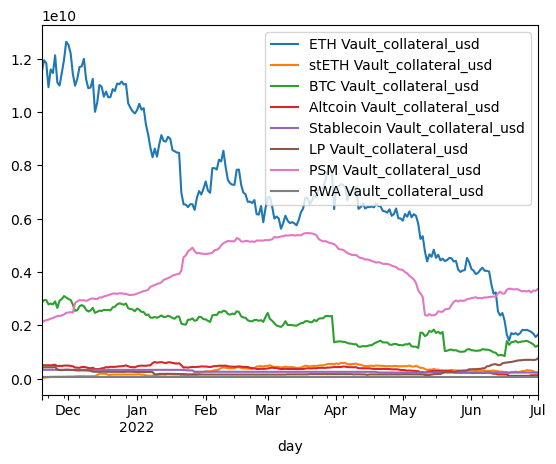

In [870]:
# Assuming 'test_data' is the DataFrame with the timezone-aware index
test_data.index = pd.to_datetime(test_data.index).tz_localize(None)

# Now perform the merge
historical_sim = test_data[test_data.index <= sim_cutoff]
historical_sim = historical_sim[targets].merge(test_data['RWA Vault_collateral_usd'], left_index=True, right_index=True, how='left')
historical_sim.plot()
historical_sim

### Simulation MVO Scores

In [871]:
# Optimized Weights for Simulation

portfolio_mvo_weights, portfolio_returns, portfolio_composition, total_portfolio_value = mvo(sim_w_RWA)
print('optimized weights:', portfolio_mvo_weights)
print('current composition:', portfolio_composition.iloc[-1])
print(f'current portfolio value: ${total_portfolio_value.iloc[-1]:,.2f}')

Individual Sortino Ratios: BTC Vault_collateral_usd          -1.14274
ETH Vault_collateral_usd          -3.58581
stETH Vault_collateral_usd         6.36946
Stablecoin Vault_collateral_usd    0.55936
Altcoin Vault_collateral_usd       0.34502
LP Vault_collateral_usd            0.68669
RWA Vault_collateral_usd          -0.05703
PSM Vault_collateral_usd           0.22426
dtype: float64
Optimized weights: [0.1  0.05 0.5  0.1  0.01 0.01 0.02 0.21]
optimized weights: [0.1  0.05 0.5  0.1  0.01 0.01 0.02 0.21]
current composition: BTC Vault_collateral_usd          0.18305
ETH Vault_collateral_usd          0.20302
stETH Vault_collateral_usd        0.13348
Stablecoin Vault_collateral_usd   0.05274
Altcoin Vault_collateral_usd      0.07279
LP Vault_collateral_usd           0.06914
RWA Vault_collateral_usd          0.00576
PSM Vault_collateral_usd          0.28002
Name: 2022-07-01 00:00:00, dtype: float64
current portfolio value: $8,832,329,156.68


C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


In [872]:
sim_portfolio_daily_returns,  sim_downside_returns, sim_excess_returns, sim_sortino_ratio = historical_sortino(portfolio_returns,portfolio_composition)

Daily downside deviation: 0.023320517264247
Annualized downside deviation: 0.4455378567499012
Annualized excess return: -0.5737114017183023
Portfolio Sortino Ratio: -1.2876827255564731


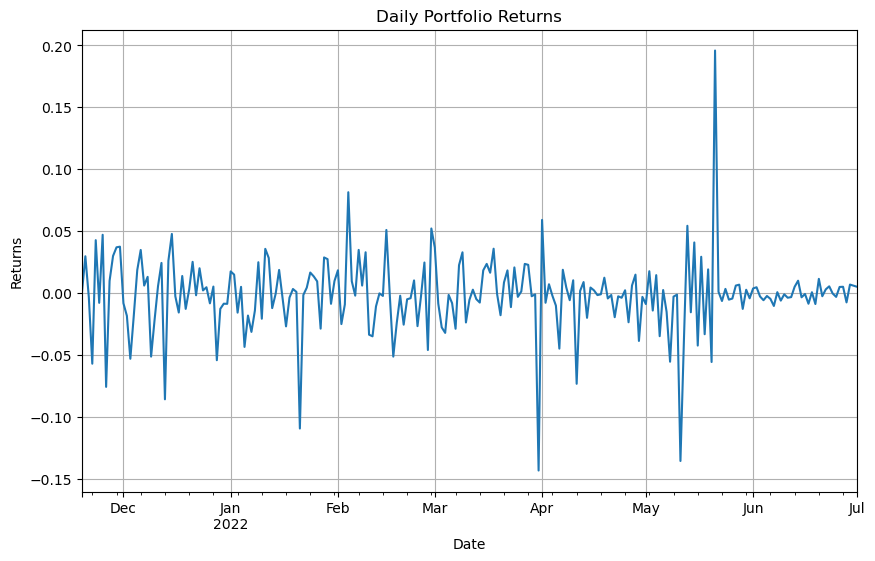

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


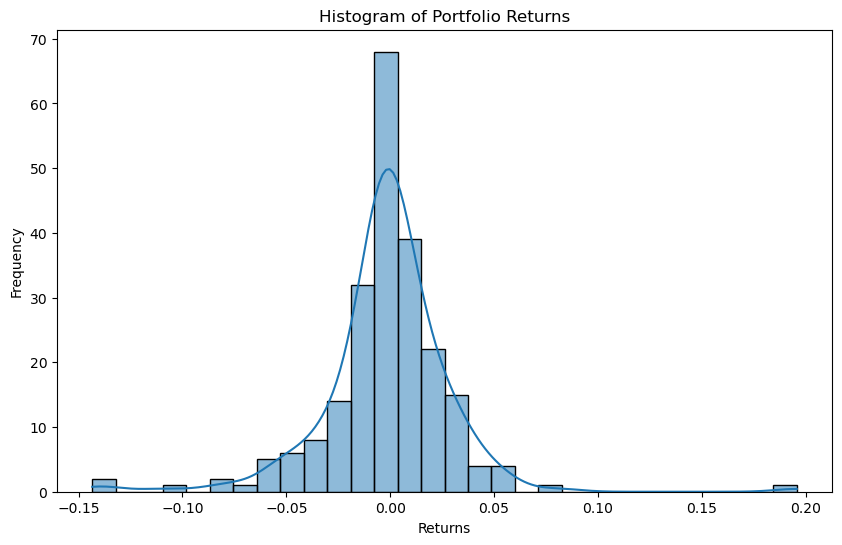

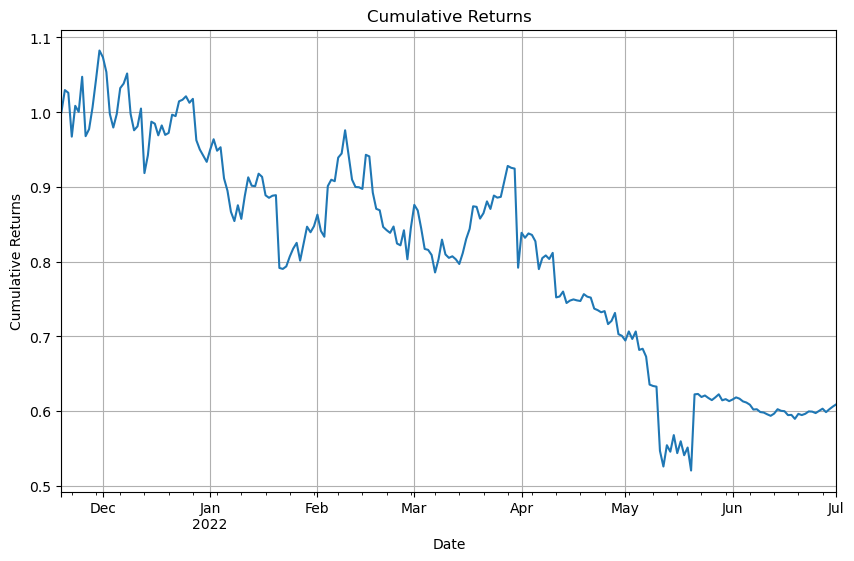

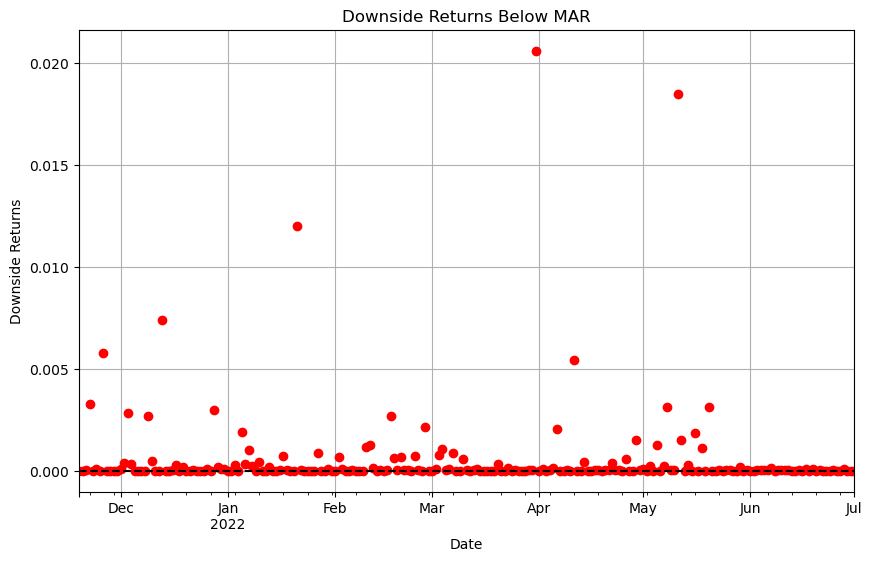

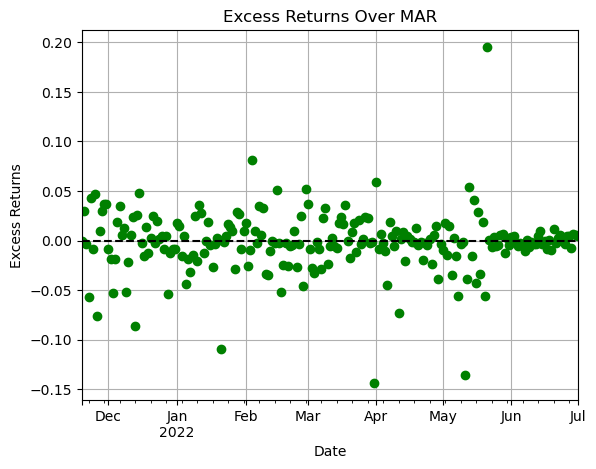

In [873]:
optimized_returns = visualize_mvo_results(sim_portfolio_daily_returns, sim_downside_returns, sim_excess_returns)

sim cumulative return 0.609303896898519


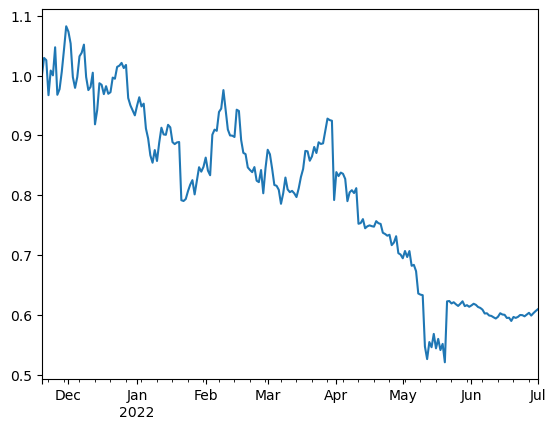

In [874]:
optimized_returns.plot()
print('sim cumulative return', optimized_returns.iloc[-1])

### Historical MVO Scores

In [875]:
historical_optimized_weights, historical_portfolio_returns, historical_portfolio_composition, historical_total_portfolio_value = mvo(historical_sim)
print('average daily return per vault:', historical_portfolio_returns.mean())
print('current composition:', historical_portfolio_composition.iloc[-1])
print(f'current portfolio value: ${historical_total_portfolio_value.iloc[-1]:,.2f}')

Individual Sortino Ratios: BTC Vault_collateral_usd          -1.95794
ETH Vault_collateral_usd          -4.45386
stETH Vault_collateral_usd         3.90225
Stablecoin Vault_collateral_usd   -0.88969
Altcoin Vault_collateral_usd      -3.17905
LP Vault_collateral_usd            1.31992
RWA Vault_collateral_usd          -0.06783
PSM Vault_collateral_usd           0.96307
dtype: float64
Optimized weights: [0.1  0.05 0.5  0.1  0.01 0.22 0.01 0.01]
average daily return per vault: BTC Vault_collateral_usd          -0.00373
ETH Vault_collateral_usd          -0.00864
stETH Vault_collateral_usd         0.00782
Stablecoin Vault_collateral_usd   -0.00162
Altcoin Vault_collateral_usd      -0.00613
LP Vault_collateral_usd            0.00273
RWA Vault_collateral_usd          -0.00000
PSM Vault_collateral_usd           0.00203
dtype: float64
current composition: BTC Vault_collateral_usd          0.16170
ETH Vault_collateral_usd          0.21508
stETH Vault_collateral_usd        0.03016
Stablecoin Vaul

In [876]:
historical_portfolio_daily_returns,  historical_downside_returns, historical_excess_returns, historical_sortino_ratio = historical_sortino(historical_portfolio_returns,historical_portfolio_composition)

Daily downside deviation: 0.025226921213977786
Annualized downside deviation: 0.4819596530693503
Annualized excess return: -0.7371302553896542
Portfolio Sortino Ratio: -1.5294439082094424


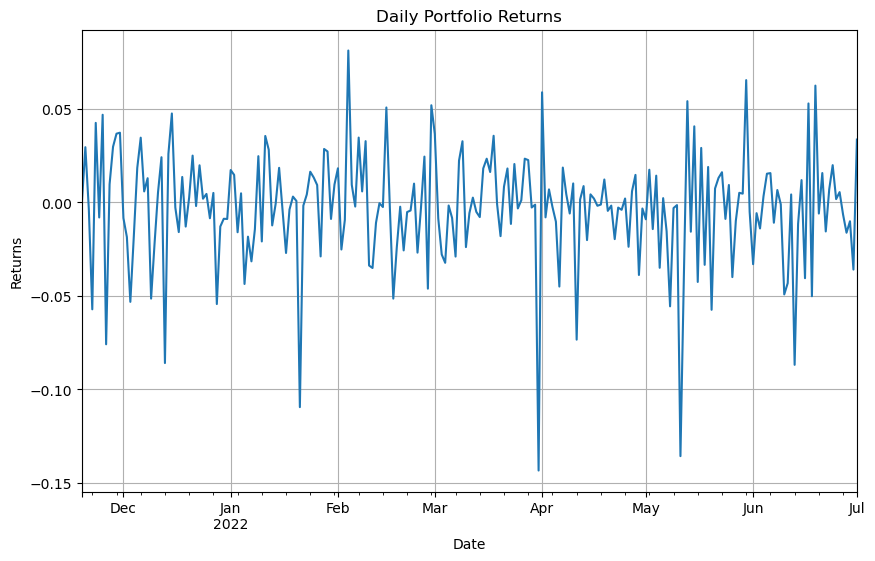

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


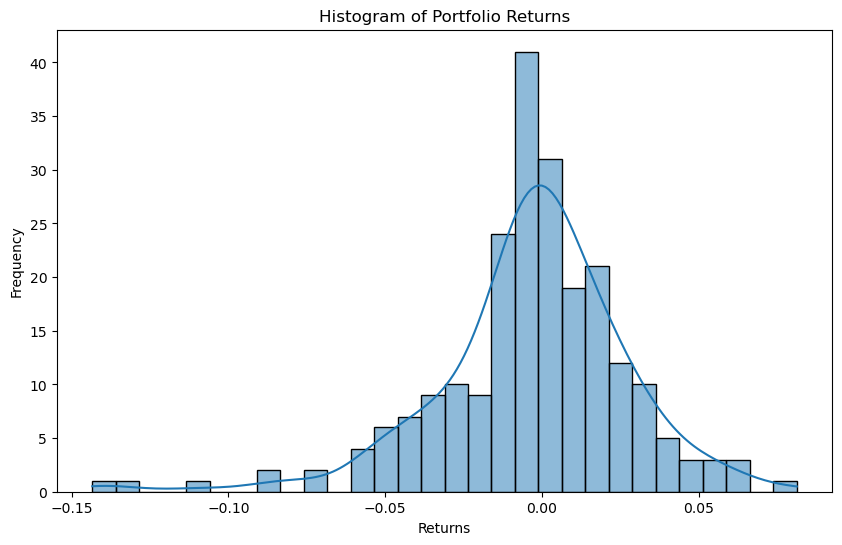

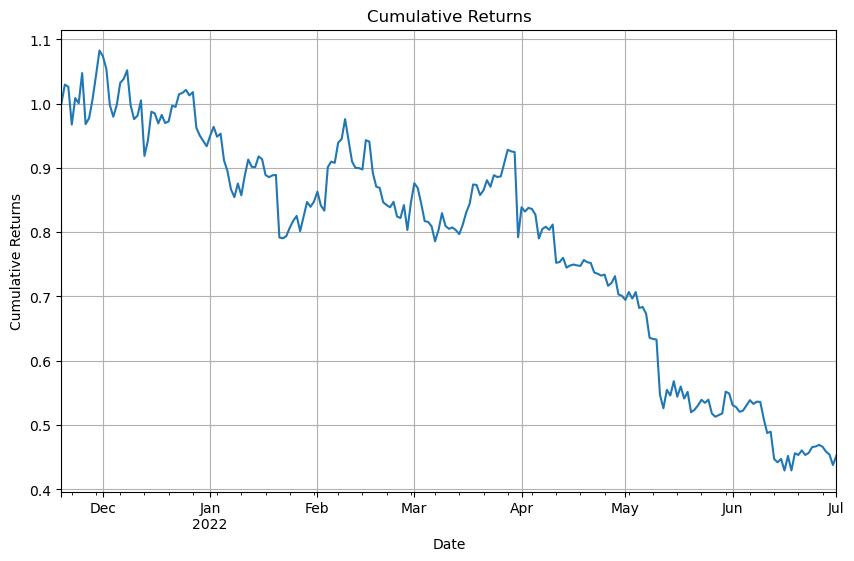

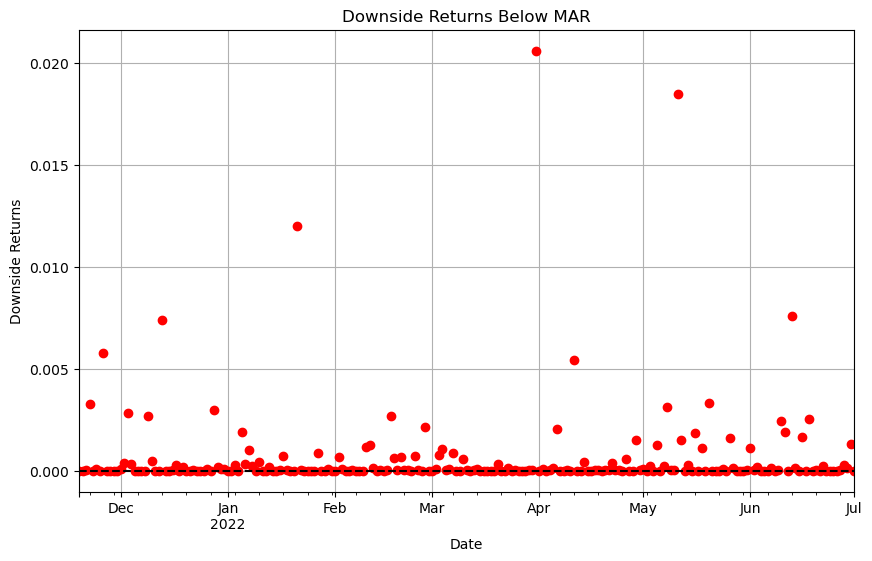

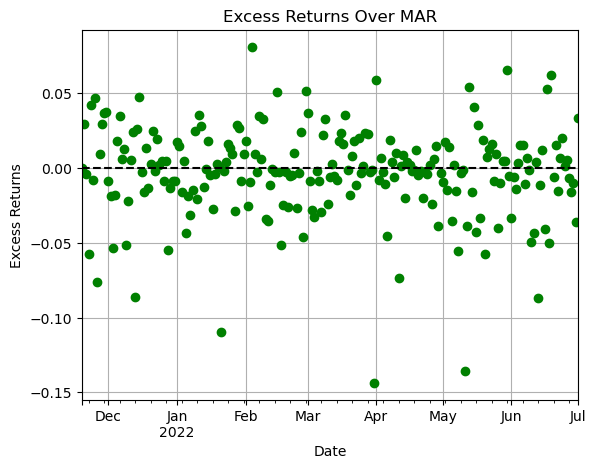

In [877]:
historical_returns = visualize_mvo_results(historical_portfolio_daily_returns, historical_downside_returns, historical_excess_returns)

historical cumulative return 0.4522953137071426


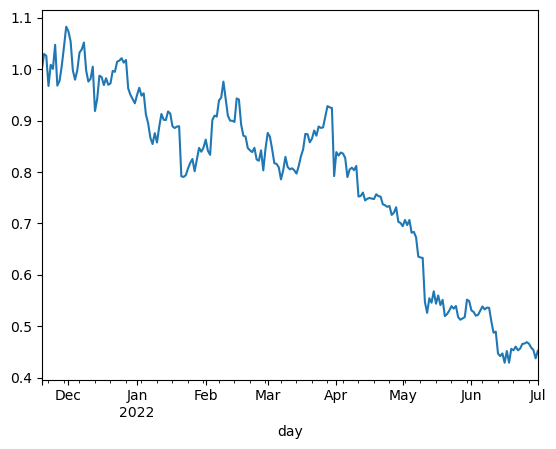

In [878]:
historical_returns.plot()
print('historical cumulative return', historical_returns.iloc[-1])

## Agent

### Non Q Table

In [879]:

class MVOAgent:
    def __init__(self, action_space, target_weights, vault_action_ranges, learning_rate=0.01, discount_factor=0.95, exploration_rate=1.0, exploration_decay=0.995, min_exploration_rate=0.01, initial_strategy_period=0, adjustment_scale=10):
        self.q_table = {}
        self.actions = action_space
        self.target_weights = target_weights
        self.vault_action_ranges = vault_action_ranges  # Ensure this is a non-default argument
        self.lr = learning_rate
        self.gamma = discount_factor
        self.epsilon = exploration_rate
        self.epsilon_decay = exploration_decay
        self.epsilon_min = min_exploration_rate
        self.initial_strategy_period = initial_strategy_period
        self.current_cycle = 0
        self.adjustment_scale = adjustment_scale
        self.dai_ceilings = None

    def get_state_representation(self, state):
        return tuple(state.values())

    def calculate_adjustment(self, current, target, vault):
        print('vault', vault)
        simplified_vault_name = vault.replace('_collateral_usd', '_dai_ceiling')
        print('vault', simplified_vault_name)
        print('target weights in calc', target)
        
        difference = target - current
        desired_adjustment = difference * self.adjustment_scale
        print('weight difference', difference)
        print('Desired adjustment', desired_adjustment)
        print('adjustment scale', self.adjustment_scale)
        
        legal_adjustments = self.vault_action_ranges.get(simplified_vault_name, [])
        print('legal adjustments', legal_adjustments)
        
        if legal_adjustments:
            min_val, max_val = legal_adjustments
            closest_adjustment = max(min(desired_adjustment, max_val), min_val)
            print('closest adjustment', closest_adjustment)
            return closest_adjustment
        else:
            print(f"No action range defined for {simplified_vault_name}")
            return 0  # Return zero adjustment if no action range is defined

    def initial_strategy(self, state):
        print("Calculating initial strategy...")
        action_dict = {}
        print('items in state', state.items())
        for vault, current_weight in state.items():
            print('vault', vault)
            simplified_vault_name = vault.replace('_collateral_usd', '_dai_ceiling')
            print('simplified vault name initial strategy', simplified_vault_name)
            target_weight = self.target_weights.get(vault, 0)
            adjustment = self.calculate_adjustment(current_weight, target_weight, vault)
            if adjustment != 0:  # Only add adjustments if they are non-zero
                action_dict[simplified_vault_name] = adjustment
            print(f"Vault: {vault},'simplified vault initial strategy {simplified_vault_name}, Current: {current_weight}, Target: {target_weight}, Adjustment: {adjustment}")
        self.initial_actions = action_dict  # Save the computed actions
        print("Initial Actions: ", action_dict)
        return action_dict

    def calculate_dynamic_strategy(self, current_weights):
        action_dict = {}
        print("Calculating dynamic strategy based on optimized weights...")
        for vault, current_weight in current_weights.items():
            target_weight = self.target_weights.get(vault, 0)
            adjustment = self.calculate_adjustment(current_weight, target_weight, vault)
            
            adjusted_vault_name = vault.replace('_collateral_usd', '_dai_ceiling')
            
            if adjustment != 0:
                action_dict[adjusted_vault_name] = adjustment
            
            print(f"Vault: {vault}, Current: {current_weight}, Target: {target_weight}, Adjustment: {adjustment}")
            
        return action_dict

    def agent_policy(self, state, dai_ceilings):
        self.current_cycle += 1
        self.dai_ceilings = dai_ceilings
        state_key = self.get_state_representation(state)
        print(f"Cycle Number: {self.current_cycle}, Epsilon: {self.epsilon}")

        # Determine action based on the phase of the strategy
        if self.current_cycle <= self.initial_strategy_period:
            action = self.initial_strategy(state)
            reason = 'initial strategy'
        elif np.random.rand() < self.epsilon:
            action = self.random_action(state)
            reason = 'exploration (random selection for wider state exploration)'
        else:
            action = self.calculate_dynamic_strategy(state)
            reason = 'exploitation (based on learned values aiming for optimal performance)'

        if self.current_cycle > self.initial_strategy_period:
            self.epsilon *= (self.epsilon_decay ** 3)  # Example of more aggressive decay
        elif self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

        self.epsilon = max(self.epsilon, self.epsilon_min)  # Ensure epsilon doesn't go below the minimum

        print('State:', state)
        print(f"Chosen Action: {action}, Reason: {reason}")
        return action

    def random_action(self, state):
        """
        Generate a random action for exploration.
        """
        action = {}
        for vault, range_options in self.vault_action_ranges.items():
            min_val, max_val = range_options
            action[vault] = np.random.uniform(min_val, max_val)
        return action

    def update_q_table(self, old_state, action_index, reward, new_state):
        old_state_key = self.get_state_representation(old_state)
        new_state_key = self.get_state_representation(new_state)
        if new_state_key not in self.q_table:
            self.q_table[new_state_key] = np.zeros(len(self.actions))
        
        old_value = self.q_table[old_state_key][action_index]
        next_max = np.max(self.q_table[new_state_key])
        new_value = (1 - self.lr) * old_value + self.lr * (reward + self.gamma * next_max)
        self.q_table[old_state_key][action_index] = new_value
        print('q table updated', self.q_table)
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
        print('Epsilon after decay:', self.epsilon)


### Q Table

In [880]:
class RlAgent:
    def __init__(self, action_space, target_weights, vault_action_ranges, learning_rate=0.01, discount_factor=0.95,
                 exploration_rate=0.9, exploration_decay=0.95, min_exploration_rate=0.01, initial_strategy_period=0,
                 adjustment_scale=10):
        self.q_table = {}
        self.actions = action_space
        self.target_weights = target_weights
        self.vault_action_ranges = vault_action_ranges
        self.lr = learning_rate
        self.gamma = discount_factor
        self.epsilon = exploration_rate
        self.epsilon_decay = exploration_decay
        self.epsilon_min = min_exploration_rate
        self.initial_strategy_period = initial_strategy_period
        self.current_cycle = 0
        self.adjustment_scale = adjustment_scale
        self.dai_ceilings = None

    def random_action(self, state):
        """
        Generate a random action for exploration.
        """
        action = {}
        for vault, range_options in self.vault_action_ranges.items():
            min_val, max_val = range_options
            action[vault] = np.random.uniform(min_val, max_val)
        return action

    def get_state_representation(self, state):
        return tuple(state.values())

    def calculate_adjustment(self, current, target, vault):
        print('vault', vault)
        simplified_vault_name = vault.replace('_collateral_usd', '_dai_ceiling')
        print('vault', simplified_vault_name)
        print('target weights in calc', target)
        difference = target - current
        desired_adjustment = difference * self.adjustment_scale
        print('weight difference', difference)
        print('Desired adjustment', desired_adjustment)
        print('adjustment scale', self.adjustment_scale)
        legal_adjustments = self.vault_action_ranges.get(simplified_vault_name, [])
        print('legal adjustments', legal_adjustments)
        if legal_adjustments:
            min_val, max_val = legal_adjustments
            closest_adjustment = max(min(desired_adjustment, max_val), min_val)
            print('closest adjustment', closest_adjustment)
            return closest_adjustment
        else:
            print(f"No action range defined for {simplified_vault_name}")
            return 0

    def initial_strategy(self, state):
        print("Calculating initial strategy...")
        action_dict = {}
        print('items in state', state.items())
        for vault, current_weight in state.items():
            print('vault', vault)
            simplified_vault_name = vault.replace('_collateral_usd', '_dai_ceiling')
            print('simplified vault name initial strategy', simplified_vault_name)
            target_weight = self.target_weights.get(vault, 0)
            adjustment = self.calculate_adjustment(current_weight, target_weight, vault)
            if adjustment != 0:  # Only add adjustments if they are non-zero
                action_dict[simplified_vault_name] = adjustment
            print(f"Vault: {vault},'simplified vault initial strategy {simplified_vault_name}, Current: {current_weight}, Target: {target_weight}, Adjustment: {adjustment}")
        self.initial_actions = action_dict  # Save the computed actions
        print("Initial Actions: ", action_dict)
        return action_dict

    def calculate_dynamic_strategy(self, current_weights):
        action_dict = {}
        print("Calculating dynamic strategy based on optimized weights...")
        for vault, current_weight in current_weights.items():
            target_weight = self.target_weights.get(vault, 0)
            adjustment = self.calculate_adjustment(current_weight, target_weight, vault)
            adjusted_vault_name = vault.replace('_collateral_usd', '_dai_ceiling')
            if adjustment != 0:
                action_dict[adjusted_vault_name] = adjustment
            print(f"Vault: {vault}, Current: {current_weight}, Target: {target_weight}, Adjustment: {adjustment}")
        return action_dict

    def agent_policy(self, state, dai_ceilings):
        self.current_cycle += 1
        self.dai_ceilings = dai_ceilings
        state_key = self.get_state_representation(state)
        print(f"Cycle Number: {self.current_cycle}, Epsilon: {self.epsilon}")

        if self.current_cycle <= self.initial_strategy_period:
            action = self.random_action(state)
            reason = 'exploration (random selection for initial strategy period)'
        elif np.random.rand() < self.epsilon:
            action = self.random_action(state)
            reason = 'exploration (random selection for wider state exploration)'
        else:
            action = self.calculate_dynamic_strategy(state)
            reason = 'exploitation (based on learned values aiming for optimal performance)'

        if self.current_cycle > self.initial_strategy_period:
            self.epsilon *= (self.epsilon_decay ** 2)  # Example of more aggressive decay
        elif self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

        self.epsilon = max(self.epsilon, self.epsilon_min)  # Ensure epsilon doesn't go below the minimum

        print('State:', state)
        print(f"Chosen Action: {action}, Reason: {reason}")
        return action

    def exploit_best_known_action(self, state_key):
        if state_key in self.q_table and not self.q_table[state_key].all() == 0:
            action_index = np.argmax(self.q_table[state_key])
            action = self.actions[action_index]
        else:
            action = self.calculate_dynamic_strategy(self.current_state_weights)
        return action

    def update_q_table(self, old_state, action_index, reward, new_state):
        old_state_key = self.get_state_representation(old_state)
        new_state_key = self.get_state_representation(new_state)
        if new_state_key not in self.q_table:
            self.q_table[new_state_key] = np.zeros(len(self.actions))
        old_value = self.q_table[old_state_key][action_index]
        next_max = np.max(self.q_table[new_state_key])
        new_value = (1 - self.lr) * old_value + self.lr * (reward + self.gamma * next_max)
        self.q_table[old_state_key][action_index] = new_value
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay
        print(f'Epsilon after decay: {self.epsilon}')


### Agent Set Up

In [881]:
portfolio_mvo_weights, portfolio_returns, portfolio_composition, total_portfolio_value = mvo(simulation_data)

Individual Sortino Ratios: BTC Vault_collateral_usd          -0.44860
ETH Vault_collateral_usd          -0.36580
stETH Vault_collateral_usd         1.12511
Stablecoin Vault_collateral_usd   -2.40341
Altcoin Vault_collateral_usd      -1.66282
LP Vault_collateral_usd           -0.45683
RWA Vault_collateral_usd           0.48774
PSM Vault_collateral_usd          -0.48644
dtype: float64
Optimized weights: [0.1      0.191222 0.5      0.1      0.01     0.068778 0.02     0.01    ]


In [882]:

# Assuming you have these vault names as keys in optimized_weight_dict
vault_names = [
    'BTC Vault_collateral_usd', 'ETH Vault_collateral_usd', 'stETH Vault_collateral_usd', 'Stablecoin Vault_collateral_usd', 
    'Altcoin Vault_collateral_usd', 'LP Vault_collateral_usd', 'RWA Vault_collateral_usd', 'PSM Vault_collateral_usd'
]

# Map from the detailed keys to simplified keys used in optimized_weight_dict
key_mapping = {
    'BTC Vault_collateral_usd',
    'ETH Vault_collateral_usd',
    'stETH Vault_collateral_usd',
    'Stablecoin Vault_collateral_usd'
    'Altcoin Vault_collateral_usd',
    'LP Vault_collateral_usd',
    'RWA Vault_collateral_usd',
    'PSM Vault_collateral_usd'
}

# Apply this mapping to the initial_weights to align with optimized_weight_dict
initial_weights = dict(portfolio_composition.loc['2022-05-20'].to_dict())

optimized_weight_dict = dict(zip(vault_names, portfolio_mvo_weights))

# Now both dictionaries use the same keys:
print("Initial Weights on 2022-05-20:", initial_weights)
print("Optimized Weights:", optimized_weight_dict)

# Your RlAgent can now be initialized and used with these dictionaries


Initial Weights on 2022-05-20: {'BTC Vault_collateral_usd': 0.1131354019508382, 'ETH Vault_collateral_usd': 0.48043492548500283, 'stETH Vault_collateral_usd': 0.03387400765933107, 'Stablecoin Vault_collateral_usd': 0.025435560745005616, 'Altcoin Vault_collateral_usd': 0.031155567995268595, 'LP Vault_collateral_usd': 0.0276946278356852, 'RWA Vault_collateral_usd': 0.005535616134052087, 'PSM Vault_collateral_usd': 0.2827342921948164}
Optimized Weights: {'BTC Vault_collateral_usd': 0.10000000000001205, 'ETH Vault_collateral_usd': 0.1912220038087577, 'stETH Vault_collateral_usd': 0.49999999999998834, 'Stablecoin Vault_collateral_usd': 0.1, 'Altcoin Vault_collateral_usd': 0.010000000000010488, 'LP Vault_collateral_usd': 0.06877799619124783, 'RWA Vault_collateral_usd': 0.01999999999998404, 'PSM Vault_collateral_usd': 0.01}


In [883]:
def generate_action_space(vault_action_ranges):
    action_space = {}
    for vault, limits in vault_action_ranges.items():
        if isinstance(limits, list):  # If specific steps are provided, use them
            action_space[vault] = limits
        else:  # Generate a range between min and max with the given step
            min_val, max_val, step = limits
            action_space[vault] = list(np.arange(min_val, max_val + step, step))
    return action_space

### Sets Up Action Space: for Some Reason, need to run this first for decent predictions on first try: think related to how some variables are initialized

In [884]:
str(simulation_data.index.max())

'2024-03-20 00:00:00'

test_ceilings = test_data[dai_ceilings]


start_date_dt = pd.to_datetime(start_date)  # Convert string to datetime
historical_cutoff = start_date_dt - pd.DateOffset(days=1)
test_historical_data = test_ceilings[test_ceilings.index <= historical_cutoff]

test_historical_data
last_dai_ceiling = test_historical_data.iloc[-1]
last_dai_ceiling

<Axes: xlabel='day'>

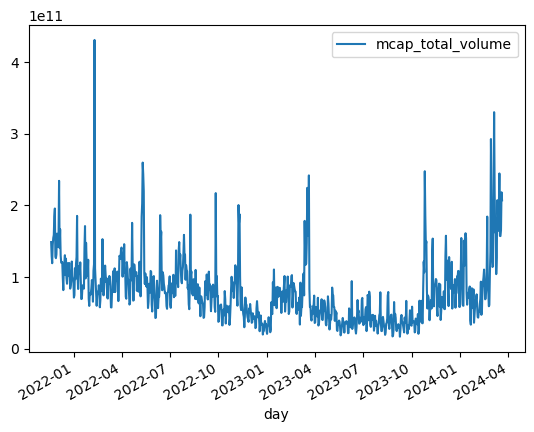

In [885]:
test_data_copy[['mcap_total_volume']].plot()

### Non Q Sim

In [886]:
mvo_data = test_data_copy.copy()
mvo_data.index = mvo_data.index.tz_localize('UTC')

# Define action space as a list of dictionaries
vault_action_ranges = {
    'stETH Vault_dai_ceiling': [-0.5, 0.5],
    'ETH Vault_dai_ceiling': [-1, 0.25],
    'BTC Vault_dai_ceiling': [-1, 0.25], # can try -1 for BTC
    'Altcoin Vault_dai_ceiling': [-0.5, 0.25],
    'Stablecoin Vault_dai_ceiling': [-0.25, 1],
    'LP Vault_dai_ceiling': [-0.5, 0.25],
    'RWA Vault_dai_ceiling': [0, 0],  # If no changes are allowed
    'PSM Vault_dai_ceiling': [-0.5, 0.25]
}

action_space = generate_action_space(vault_action_ranges)

# Assuming `optimized_weight_dict` and `initial_weights` are defined elsewhere in your script
agent = MVOAgent(action_space, optimized_weight_dict, vault_action_ranges, initial_strategy_period=1)
initial_action = agent.initial_strategy(initial_weights)

print("Initial Action Computed:", initial_action)


simulation_data = test_data_copy  
#05-20-2022
start_date = '2022-05-20'
end_date = '2024-03-20'
#end_date = '2022-07-20'

simulator = RL_VaultSimulator(simulation_data, test_data_copy, features, targets, temporals, start_date, end_date, scale_factor=300000000, minimum_value_factor=0.05, volatility_window=250)

simulator.train_model()

environment = SimulationEnvironment(simulator, start_date, end_date, agent)
environment.reset()

state, reward, done, info = environment.run()

simulator.plot_simulation_results()
action_df = environment.generate_action_dataframe()

mvo_sim_results = simulator.results

### Q Sim

test_simulator = RL_VaultSimulator(simulator_simulation_data, test_data_copy, features, targets, temporals, start_date, end_date)
test_simulator.train_model()

test_environment = SimulationEnvironment(test_simulator, start_date, end_date)
test_environment.run(actions)

test_simulator.plot_simulation_results()


vault_action_ranges = {
    'stETH Vault_dai_ceiling': [-0.5, 0.5],
    'ETH Vault_dai_ceiling': [-1, 0.25],
    'BTC Vault_dai_ceiling': [-1, 0.5], # can try -1 for BTC
    'Altcoin Vault_dai_ceiling': [-0.25, 0.25],
    'Stablecoin Vault_dai_ceiling': [-0.25, 1],
    'LP Vault_dai_ceiling': [-0.5, 0.5],
    'RWA Vault_dai_ceiling': [0, 0],  # If no changes are allowed
    'PSM Vault_dai_ceiling': [-0.5, 0.5]
}

vault_action_ranges = {
    'stETH Vault_dai_ceiling': [-0.5, 0.5],
    'ETH Vault_dai_ceiling': [-1, 0.5],
    'BTC Vault_dai_ceiling': [-0.75, 0.5], # can try -1 for BTC
    'Altcoin Vault_dai_ceiling': [-0.25, 0.25],
    'Stablecoin Vault_dai_ceiling': [-0.25, 1],
    'LP Vault_dai_ceiling': [-0.5, 0.5],
    'RWA Vault_dai_ceiling': [0, 0],  # If no changes are allowed
    'PSM Vault_dai_ceiling': [-1, 0.5]
}

Calculating initial strategy...
items in state dict_items([('BTC Vault_collateral_usd', 0.1131354019508382), ('ETH Vault_collateral_usd', 0.48043492548500283), ('stETH Vault_collateral_usd', 0.03387400765933107), ('Stablecoin Vault_collateral_usd', 0.025435560745005616), ('Altcoin Vault_collateral_usd', 0.031155567995268595), ('LP Vault_collateral_usd', 0.0276946278356852), ('RWA Vault_collateral_usd', 0.005535616134052087), ('PSM Vault_collateral_usd', 0.2827342921948164)])
vault BTC Vault_collateral_usd
simplified vault name initial strategy BTC Vault_dai_ceiling
vault BTC Vault_collateral_usd
vault BTC Vault_dai_ceiling
target weights in calc 0.10000000000001205
weight difference -0.013135401950826145
Desired adjustment -0.13135401950826145
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.13135401950826145
Vault: BTC Vault_collateral_usd,'simplified vault initial strategy BTC Vault_dai_ceiling, Current: 0.1131354019508382, Target: 0.10000000000001205, Adjustme

C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.79588e-22): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\brandyns pc\anacondareal\Lib\si

current state ETH Vault_collateral_usd                 3,146,463,840.91276
stETH Vault_collateral_usd                 639,550,108.20896
BTC Vault_collateral_usd                 1,395,895,803.64675
Altcoin Vault_collateral_usd               507,632,470.90661
Stablecoin Vault_collateral_usd            527,181,022.40673
                                                 ...        
Stablecoin Vault_collateral_usd_30d_ma     250,672,995.16393
LP Vault_collateral_usd_30d_ma             203,713,407.26851
PSM Vault_collateral_usd_30d_ma          3,301,990,616.93613
RWA Vault_collateral_usd_30d_ma             50,870,409.00000
RWA Vault_prev_dai_ceiling                  59,000,000.00000
Name: 2022-05-22 00:00:00, Length: 85, dtype: float64
vault stETH Vault_dai_ceiling
Applying action to: stETH Vault_dai_ceiling
Adjusted stETH Vault_dai_ceiling by 0.04279509737371634% from 149943277.71676755 to 150007446.0884718
vault ETH Vault_dai_ceiling
Applying action to: ETH Vault_dai_ceiling
Adjusted ETH Va

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


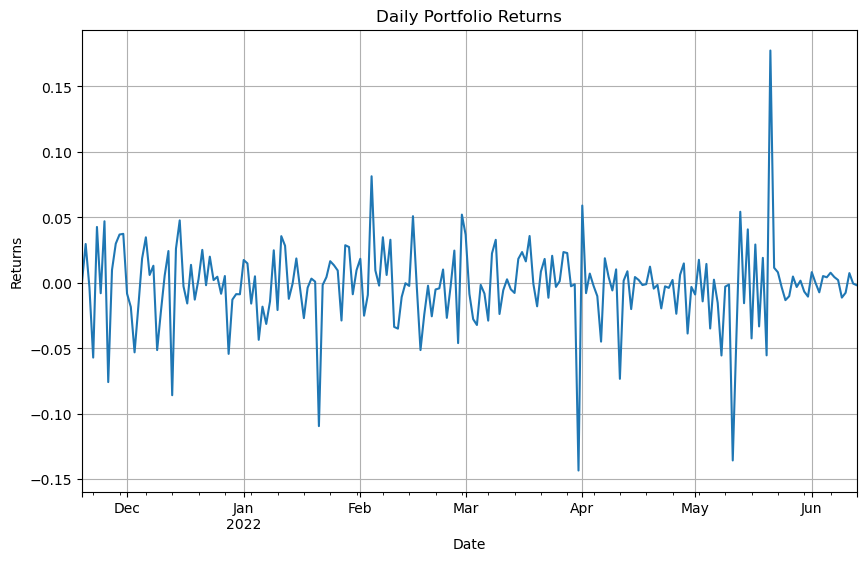

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


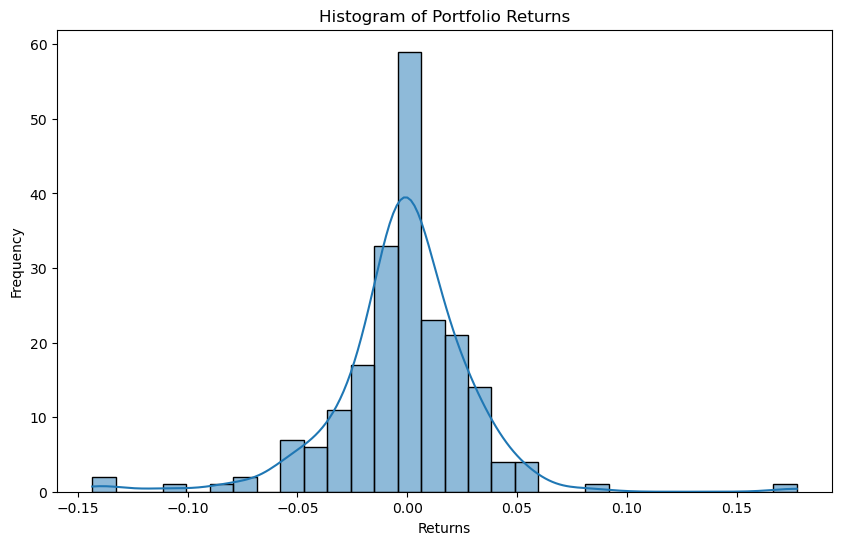

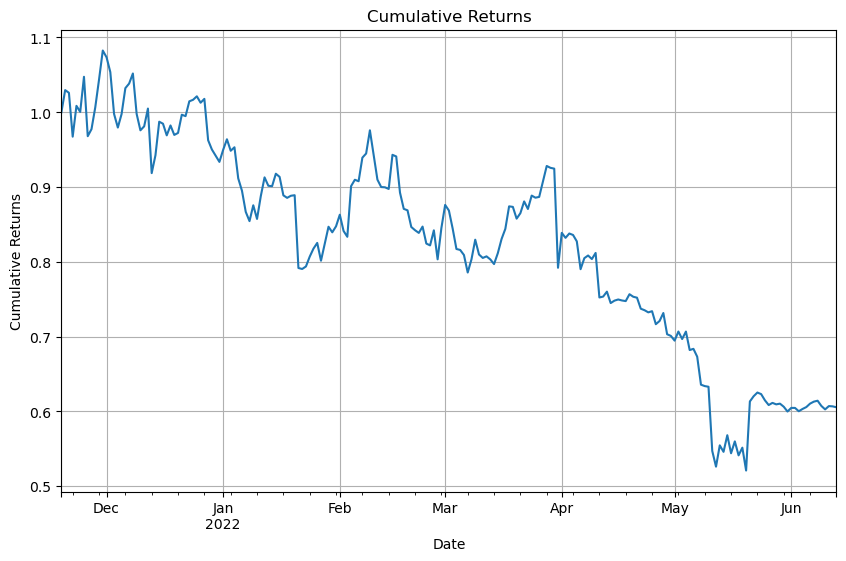

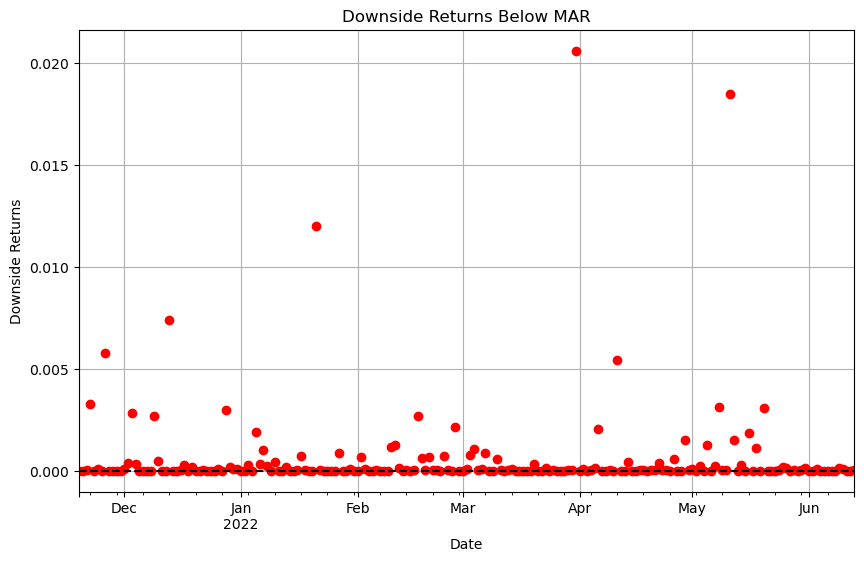

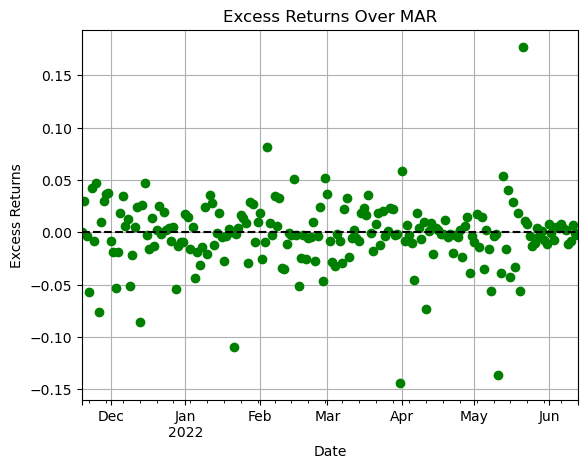

Sortino ratio: -1.3072655479785737
Scaled Sortino diff: 9.81052662422954e-05
port change pct 0
scaled port change 0
reward -0.14147717529024587
Reward at the end of the cycle on 2022-06-13 00:00:00: -1.448840828535062
Completed cycle up to 2022-06-13 00:00:00
Running simulation from 2022-06-14 00:00:00 to 2022-07-08 00:00:00
Cycle Number: 2, Epsilon: 0.855
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05000000000021314
weight difference -0.2897862075812197
Desired adjustment -2.897862075812197
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.33978620758143285, Target: 0.05000000000021314, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.4999999999997775
weight difference 0.440820864422403
Desired adjustment 4.40820864422403
adjustment scale 10
legal adjustments [-0.5,

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


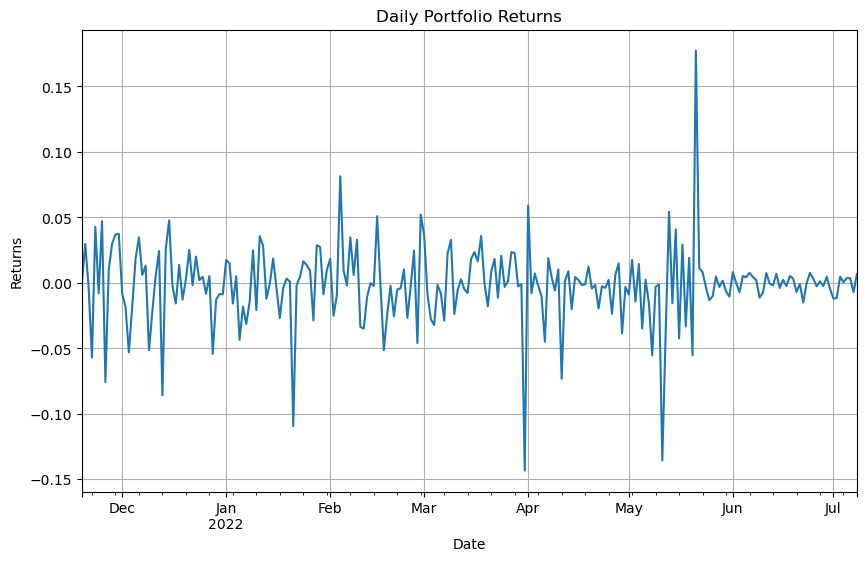

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


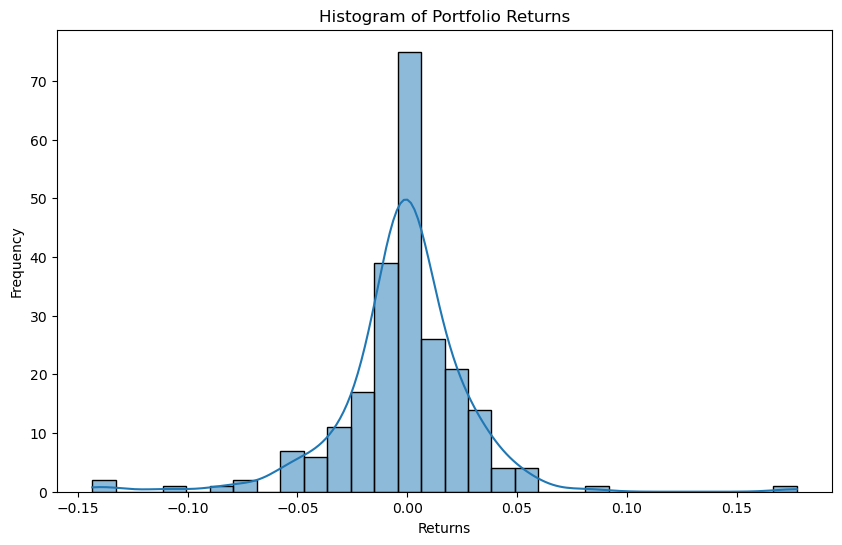

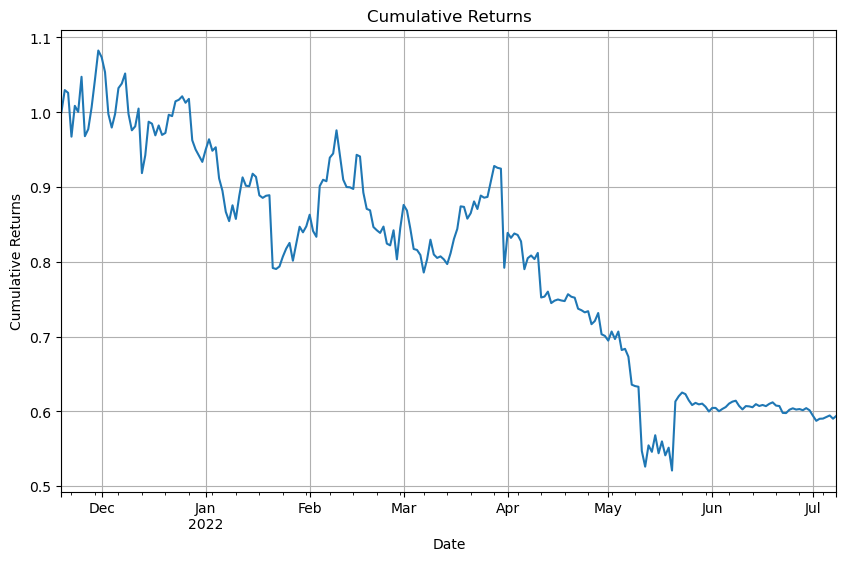

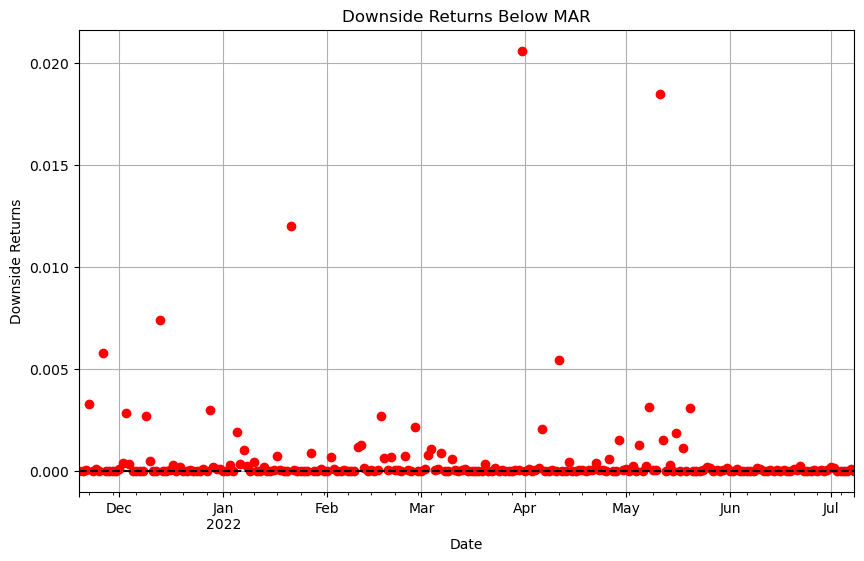

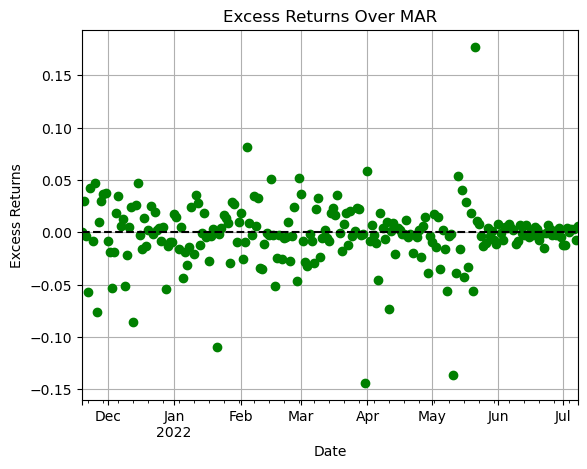

Sortino ratio: -1.3196445191881794
Scaled Sortino diff: 9.00223303420581e-05
port change pct -0.029907828645168975
scaled port change -0.029907828645168975
reward -0.16819269761862443
Reward at the end of the cycle on 2022-07-08 00:00:00: -1.4879272391371459
Completed cycle up to 2022-07-08 00:00:00
Running simulation from 2022-07-09 00:00:00 to 2022-08-02 00:00:00
Cycle Number: 3, Epsilon: 0.7716375
State: {'ETH Vault_collateral_usd': 0.32373736292034666, 'stETH Vault_collateral_usd': 0.07362215566050885, 'BTC Vault_collateral_usd': 0.14264957518829668, 'Altcoin Vault_collateral_usd': 0.051295183518007804, 'Stablecoin Vault_collateral_usd': 0.057003093736116825, 'LP Vault_collateral_usd': 0.10692235362011801, 'PSM Vault_collateral_usd': 0.24477027535660525}
Chosen Action: {'stETH Vault_dai_ceiling': -0.3331591215968862, 'ETH Vault_dai_ceiling': 0.02104347033862064, 'BTC Vault_dai_ceiling': -0.35909278683505286, 'Altcoin Vault_dai_ceiling': 0.4540145615488591, 'Stablecoin Vault_dai_cei

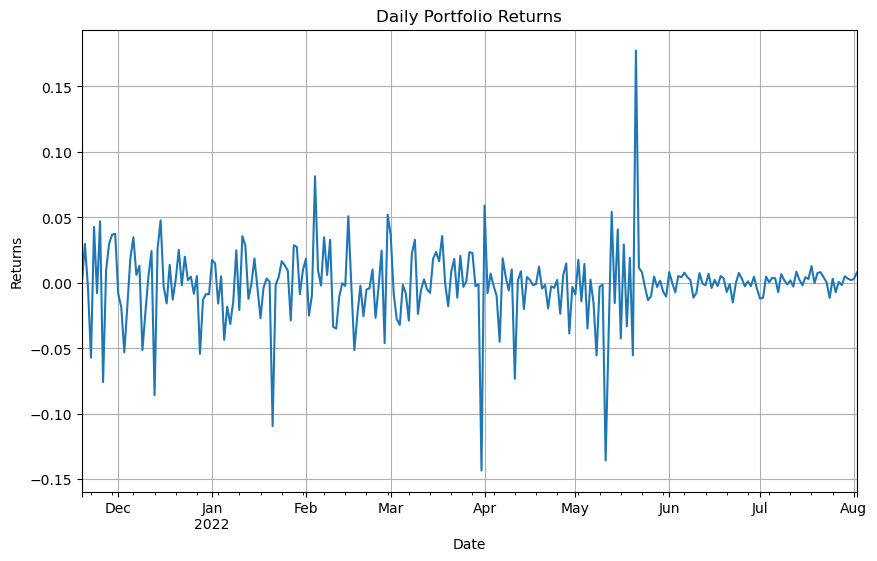

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


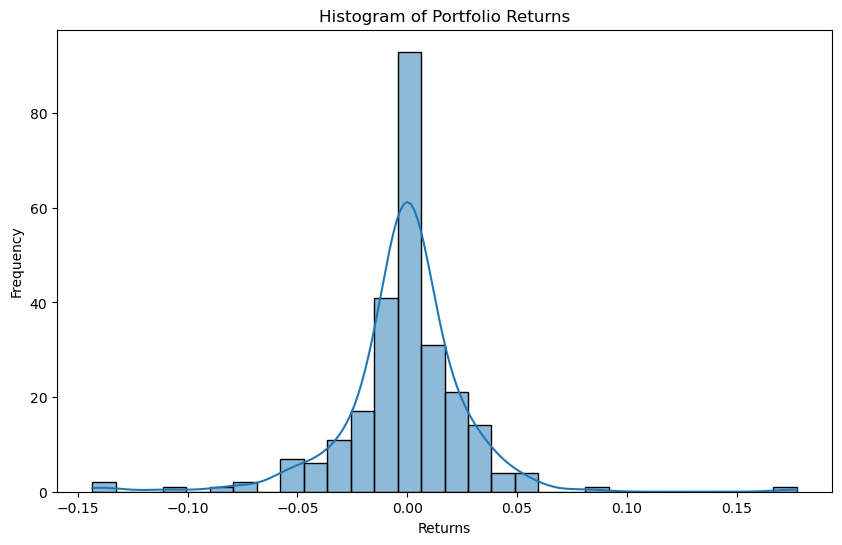

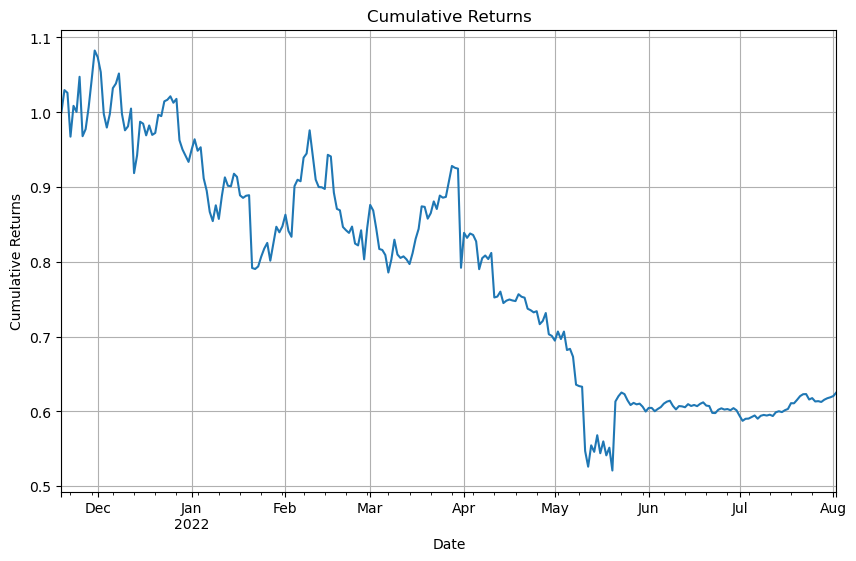

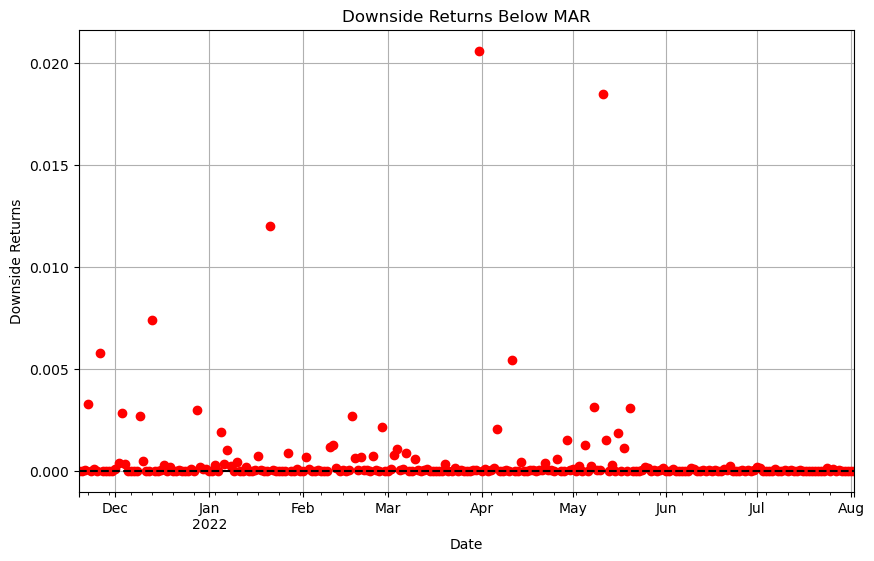

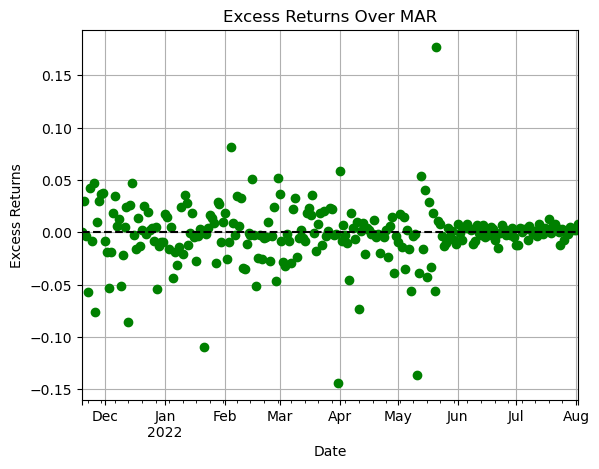

Sortino ratio: -1.2222388439559206
Scaled Sortino diff: 8.071999471813006e-05
port change pct 0.03363333430655616
scaled port change 0.03363333430655616
reward -0.1040515189633491
Reward at the end of the cycle on 2022-08-02 00:00:00: -1.3263710829139879
Completed cycle up to 2022-08-02 00:00:00
Running simulation from 2022-08-03 00:00:00 to 2022-08-27 00:00:00
Cycle Number: 4, Epsilon: 0.69640284375
State: {'ETH Vault_collateral_usd': 0.33613785480885416, 'stETH Vault_collateral_usd': 0.0765326774802549, 'BTC Vault_collateral_usd': 0.1436406652710691, 'Altcoin Vault_collateral_usd': 0.04943690125603455, 'Stablecoin Vault_collateral_usd': 0.056402933864322914, 'LP Vault_collateral_usd': 0.09664869396906947, 'PSM Vault_collateral_usd': 0.24120027335039487}
Chosen Action: {'stETH Vault_dai_ceiling': -0.3143623251270373, 'ETH Vault_dai_ceiling': -0.09839825468007912, 'BTC Vault_dai_ceiling': 0.10809806713774261, 'Altcoin Vault_dai_ceiling': 0.05391005403456217, 'Stablecoin Vault_dai_ceili

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


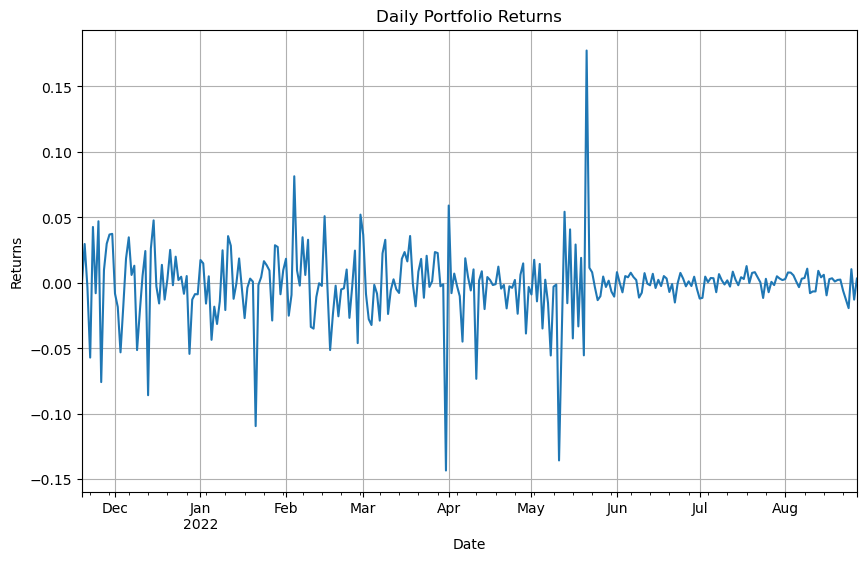

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


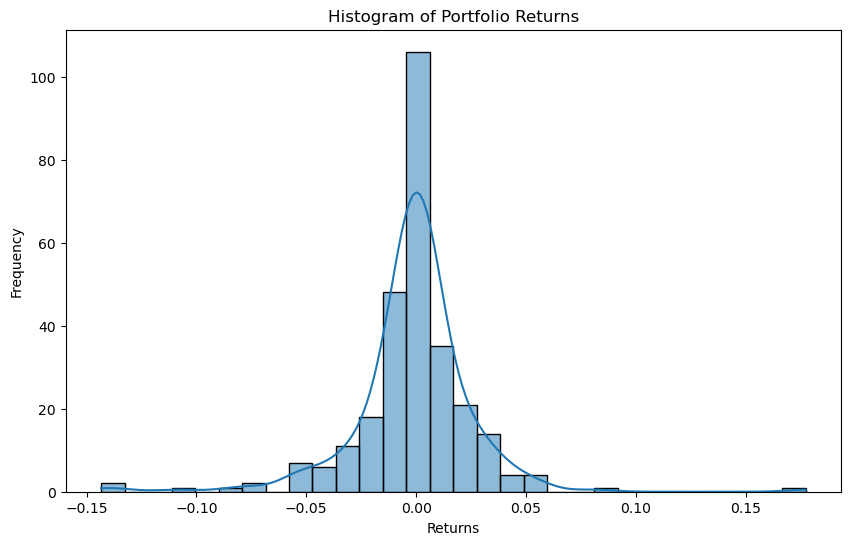

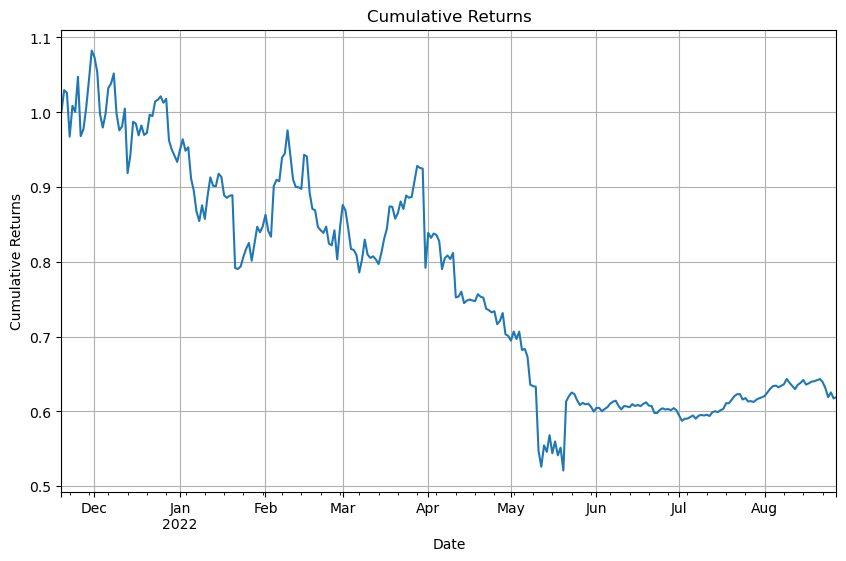

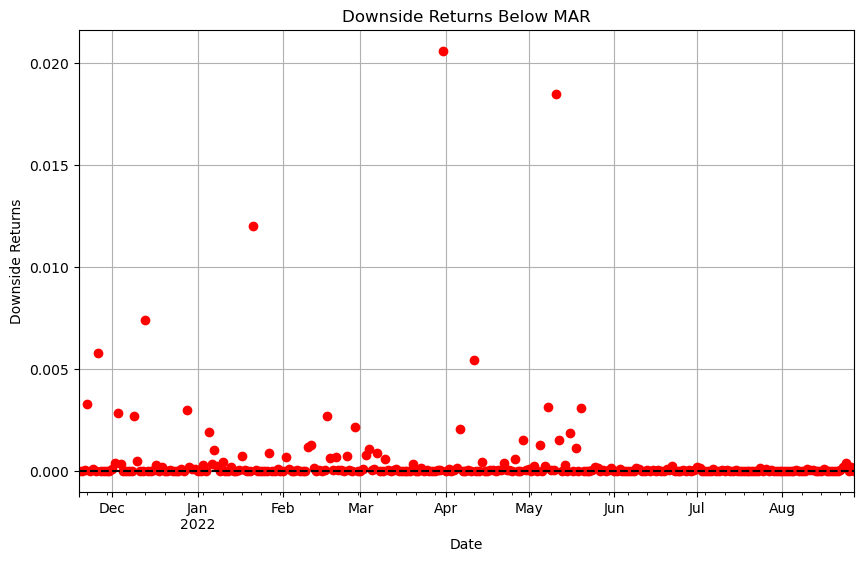

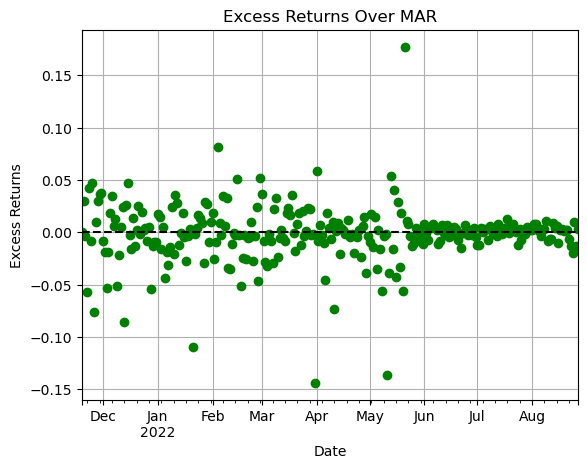

Sortino ratio: -1.2172124365455022
Scaled Sortino diff: 6.685010363475605e-05
port change pct -0.0266319056689458
scaled port change -0.0266319056689458
reward -0.16436376908671044
Reward at the end of the cycle on 2022-08-27 00:00:00: -1.3816430557358474
Completed cycle up to 2022-08-27 00:00:00
Running simulation from 2022-08-28 00:00:00 to 2022-09-21 00:00:00
Cycle Number: 5, Epsilon: 0.6285035664843749
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.2871463255879345
Desired adjustment -2.871463255879345
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.3371463255879345, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.5
weight difference 0.4227860278105496
Desired adjustment 4.227860278105496
adjustment scale 10
legal adjustments

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


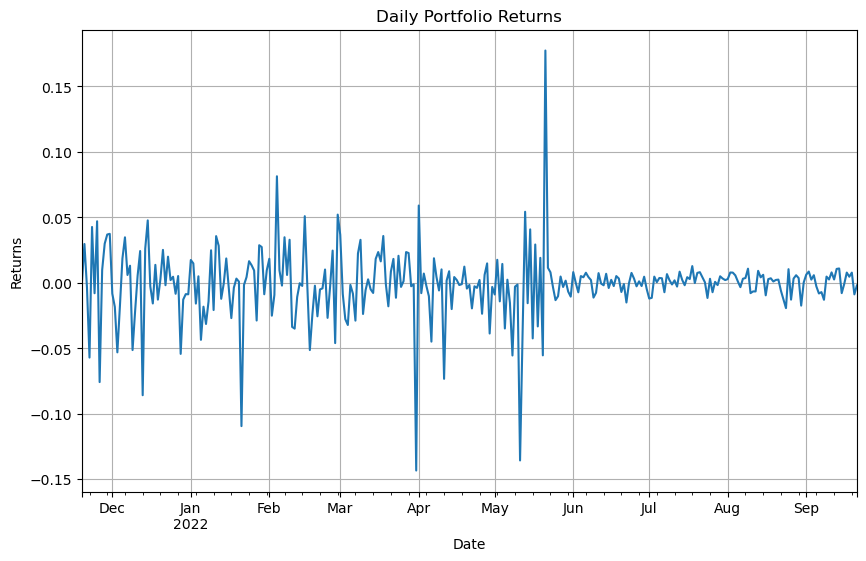

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


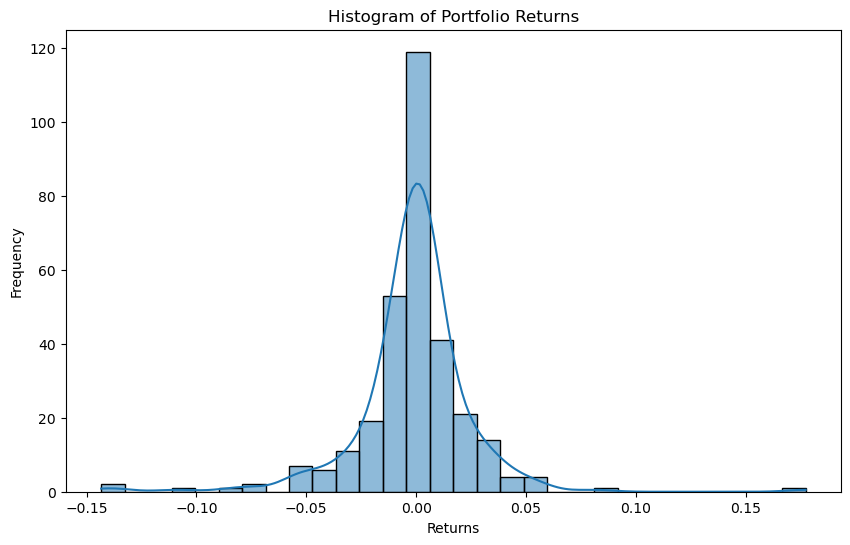

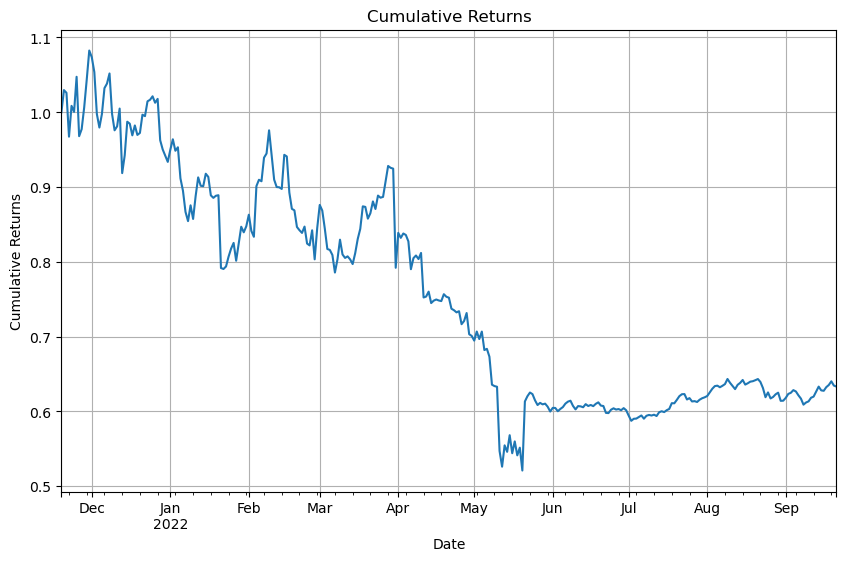

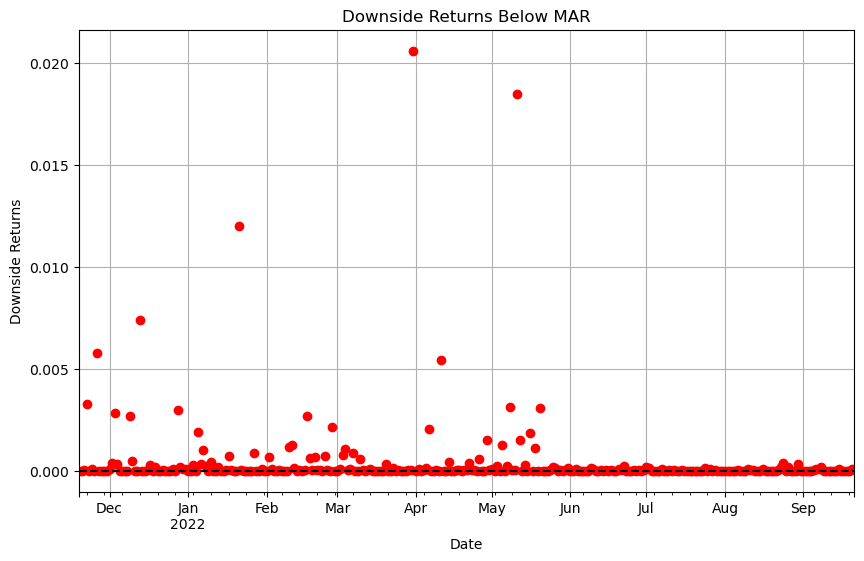

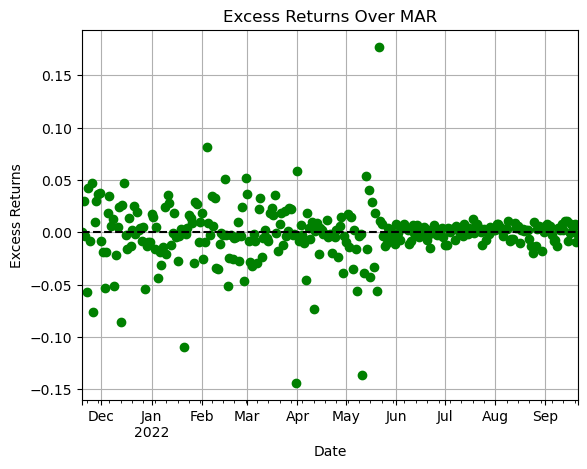

Sortino ratio: -1.1597463871795466
Scaled Sortino diff: 6.426555594691772e-05
port change pct 0.0038206282572593214
scaled port change 0.0038206282572593214
reward -0.13203124486623566
Reward at the end of the cycle on 2022-09-21 00:00:00: -1.2918418976017292
Completed cycle up to 2022-09-21 00:00:00
Running simulation from 2022-09-22 00:00:00 to 2022-10-16 00:00:00
Cycle Number: 6, Epsilon: 0.5672244687521483
State: {'ETH Vault_collateral_usd': 0.3250926805145575, 'stETH Vault_collateral_usd': 0.08691224188396494, 'BTC Vault_collateral_usd': 0.1477120616411712, 'Altcoin Vault_collateral_usd': 0.05053029731525803, 'Stablecoin Vault_collateral_usd': 0.0524187134474304, 'LP Vault_collateral_usd': 0.09376318952301664, 'PSM Vault_collateral_usd': 0.24357081567460115}
Chosen Action: {'stETH Vault_dai_ceiling': -0.20404707444728198, 'ETH Vault_dai_ceiling': 0.4606913321249496, 'BTC Vault_dai_ceiling': -0.10155766153904522, 'Altcoin Vault_dai_ceiling': -0.28422387267326676, 'Stablecoin Vault_

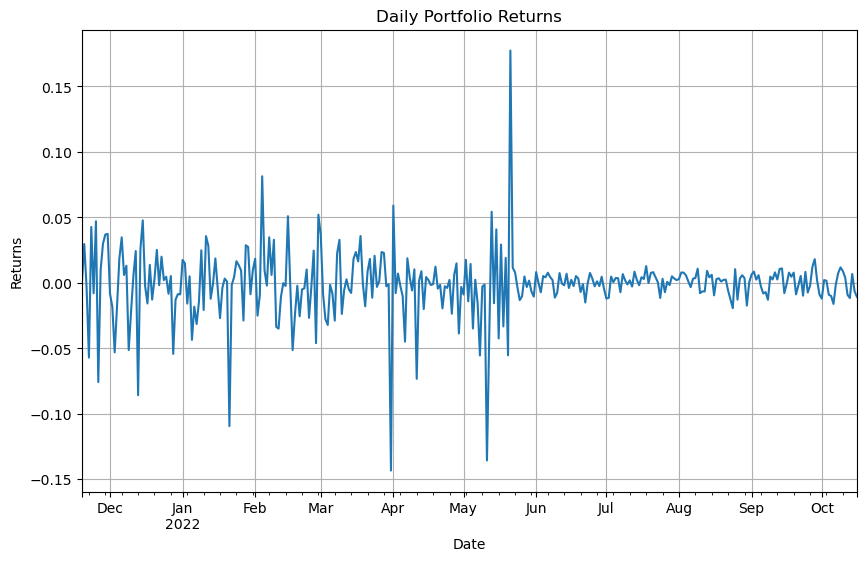

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


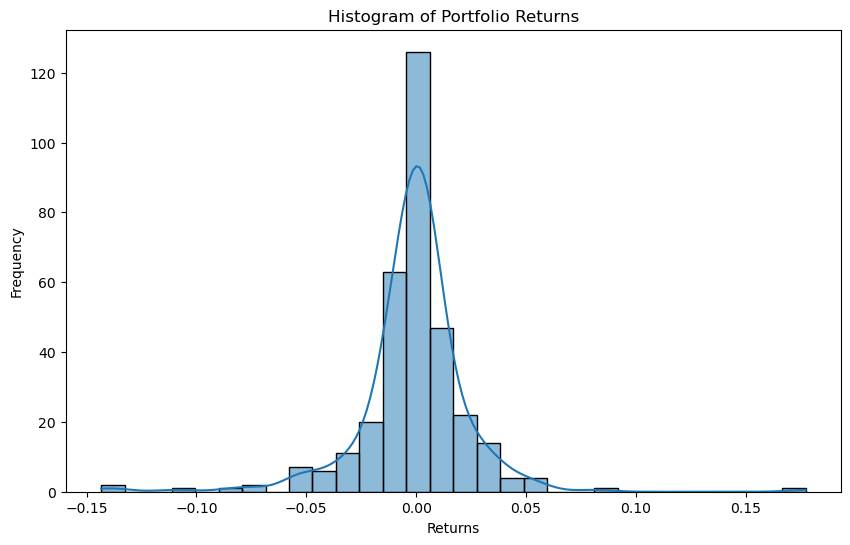

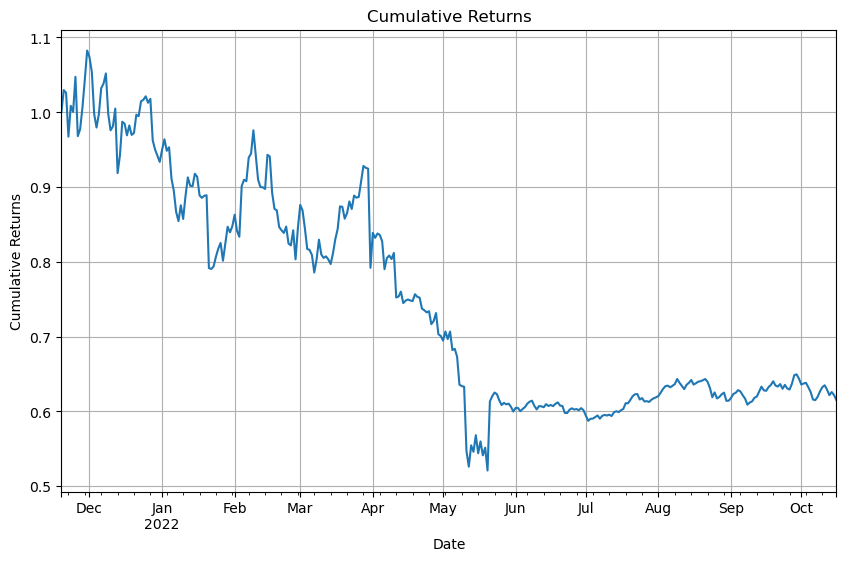

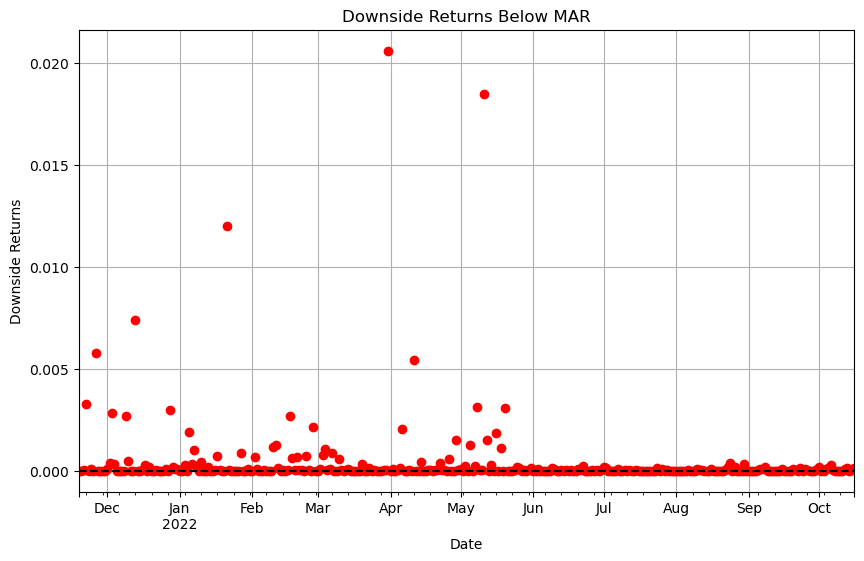

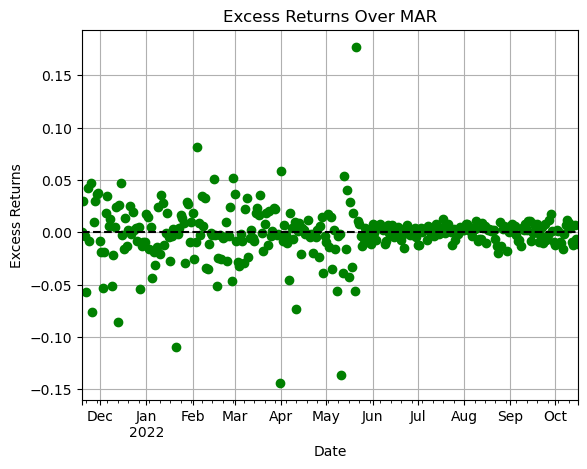

Sortino ratio: -1.1866873188596176
Scaled Sortino diff: 5.375066643348957e-05
port change pct -0.04581101479760748
scaled port change -0.04581101479760748
reward -0.1814212856867516
Reward at the end of the cycle on 2022-10-16 00:00:00: -1.3681623552128026
Completed cycle up to 2022-10-16 00:00:00
Running simulation from 2022-10-17 00:00:00 to 2022-11-10 00:00:00
Cycle Number: 7, Epsilon: 0.5119200830488138
State: {'ETH Vault_collateral_usd': 0.33857338012654276, 'stETH Vault_collateral_usd': 0.0842992596851689, 'BTC Vault_collateral_usd': 0.14295039097100615, 'Altcoin Vault_collateral_usd': 0.05081885388749538, 'Stablecoin Vault_collateral_usd': 0.05567976715808416, 'LP Vault_collateral_usd': 0.08808374509063896, 'PSM Vault_collateral_usd': 0.23959460308106384}
Chosen Action: {'stETH Vault_dai_ceiling': -0.4641843121760093, 'ETH Vault_dai_ceiling': 0.43110009336213584, 'BTC Vault_dai_ceiling': 0.12076027216068597, 'Altcoin Vault_dai_ceiling': 0.4981460620469218, 'Stablecoin Vault_dai_

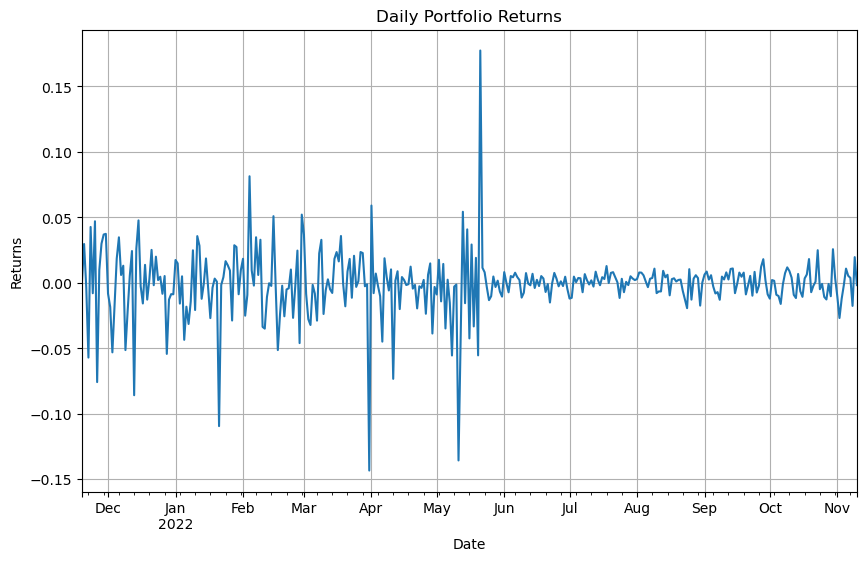

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


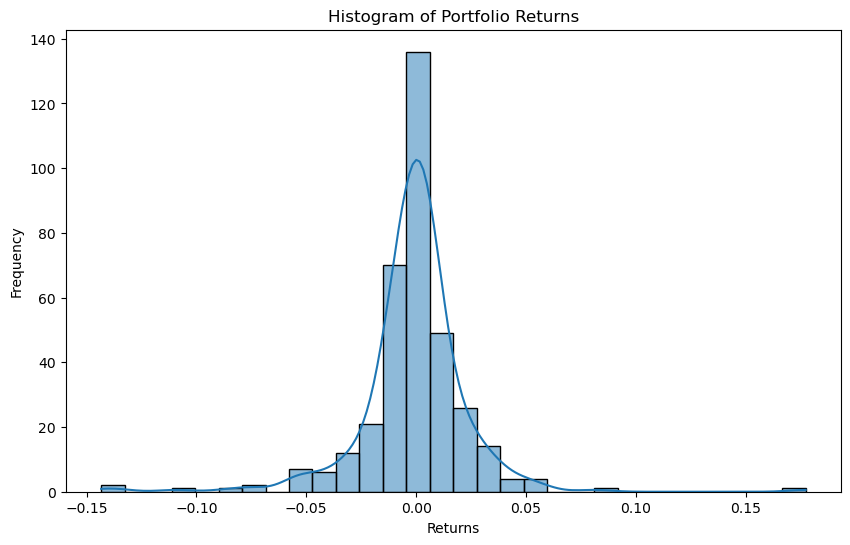

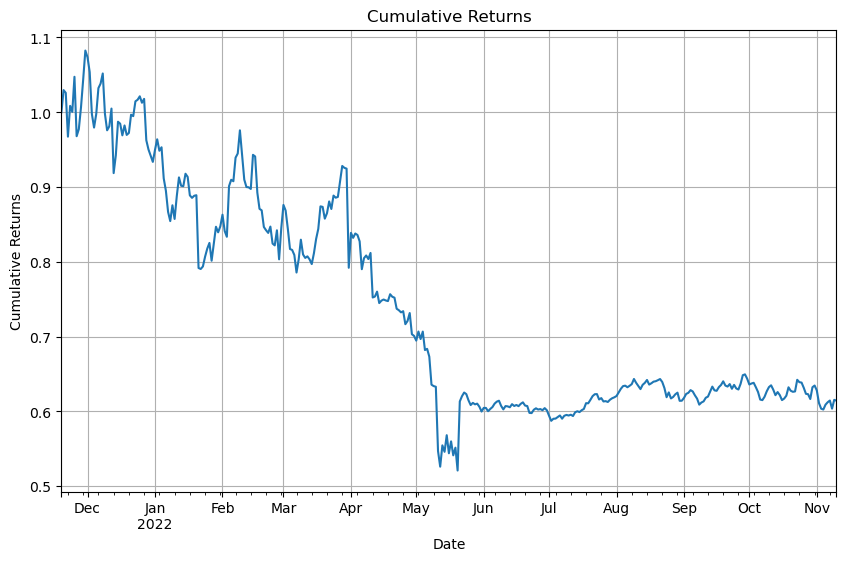

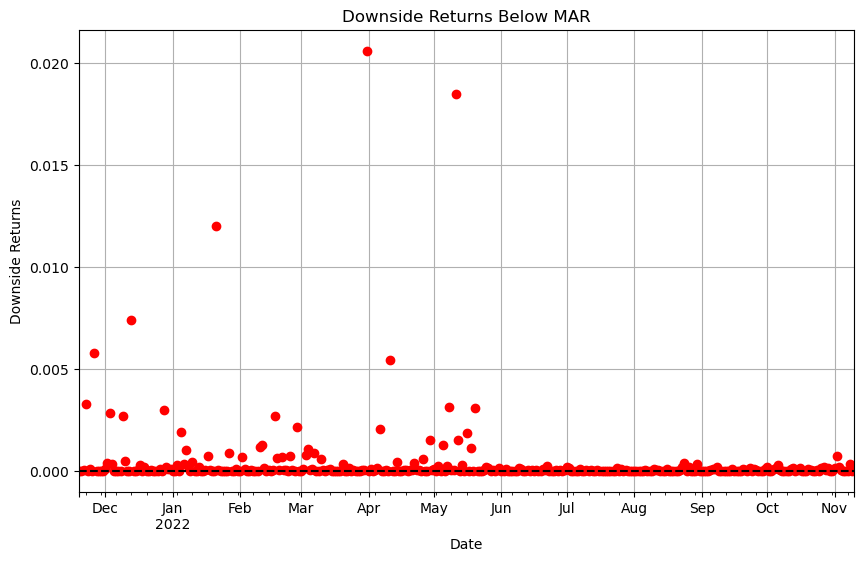

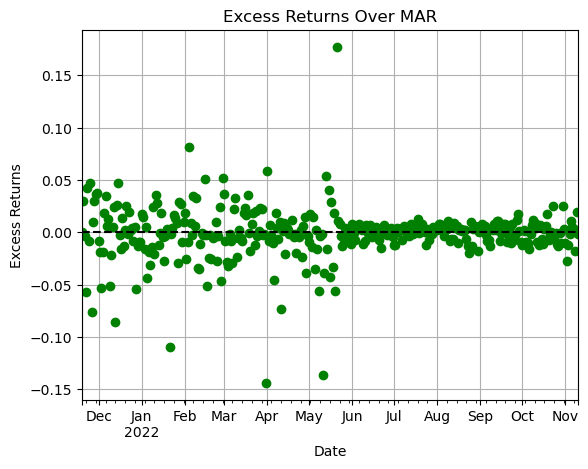

Sortino ratio: -1.1649534161634667
Scaled Sortino diff: 4.2147793779122126e-05
port change pct -0.03408011755870089
scaled port change -0.03408011755870089
reward -0.1720204435255677
Reward at the end of the cycle on 2022-11-10 00:00:00: -1.3370160074828135
Completed cycle up to 2022-11-10 00:00:00
Running simulation from 2022-11-11 00:00:00 to 2022-12-05 00:00:00
Cycle Number: 8, Epsilon: 0.4620078749515544
State: {'ETH Vault_collateral_usd': 0.3535550951517936, 'stETH Vault_collateral_usd': 0.07406886163397541, 'BTC Vault_collateral_usd': 0.1366079126909801, 'Altcoin Vault_collateral_usd': 0.05466785489055665, 'Stablecoin Vault_collateral_usd': 0.057559984277935045, 'LP Vault_collateral_usd': 0.09646473958280942, 'PSM Vault_collateral_usd': 0.22707555177194988}
Chosen Action: {'stETH Vault_dai_ceiling': -0.1006711251243011, 'ETH Vault_dai_ceiling': 0.18673617616315574, 'BTC Vault_dai_ceiling': -0.2113844732976803, 'Altcoin Vault_dai_ceiling': 0.13923278971667952, 'Stablecoin Vault_da

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


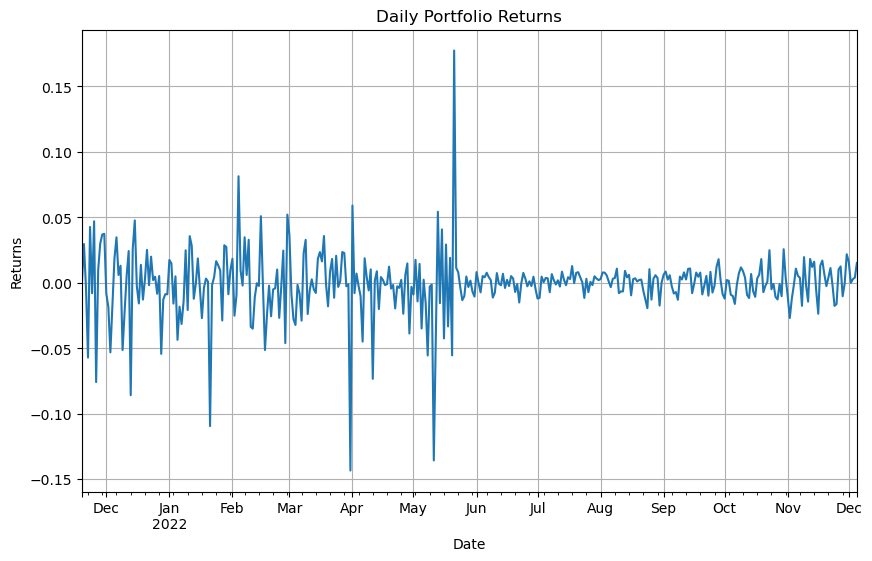

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


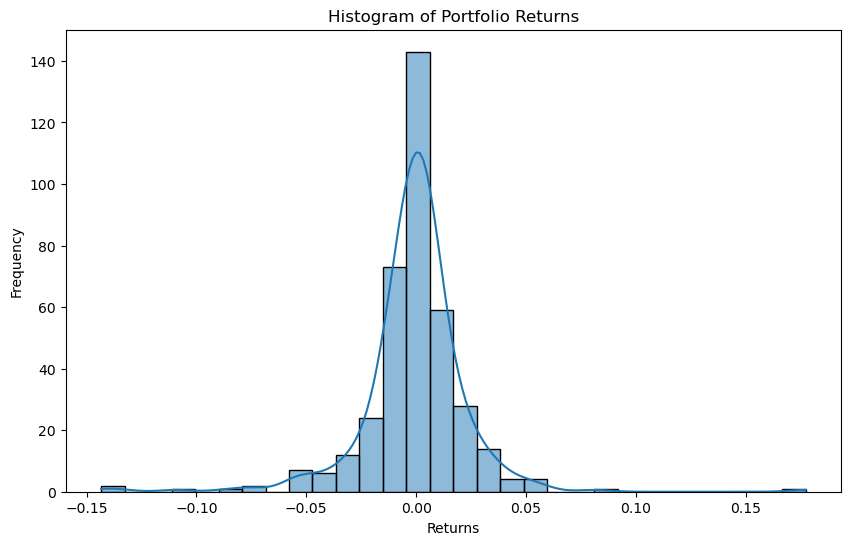

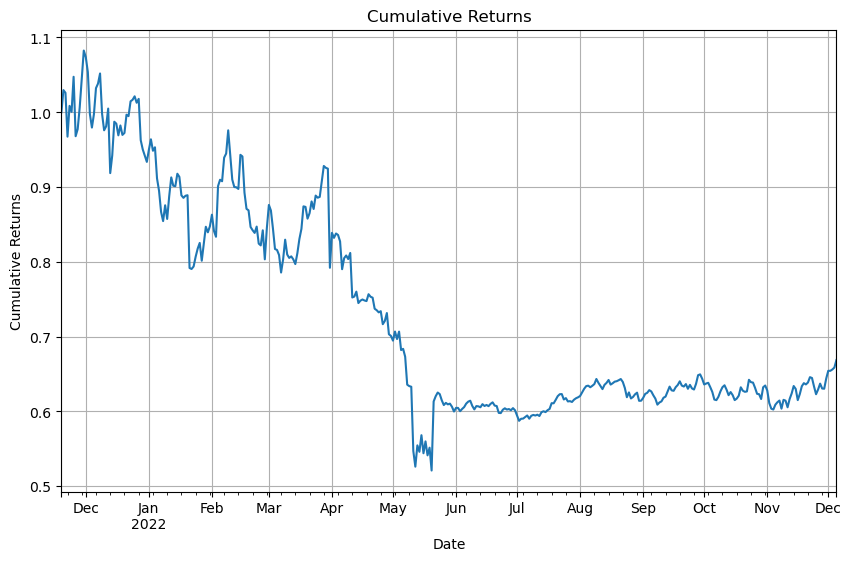

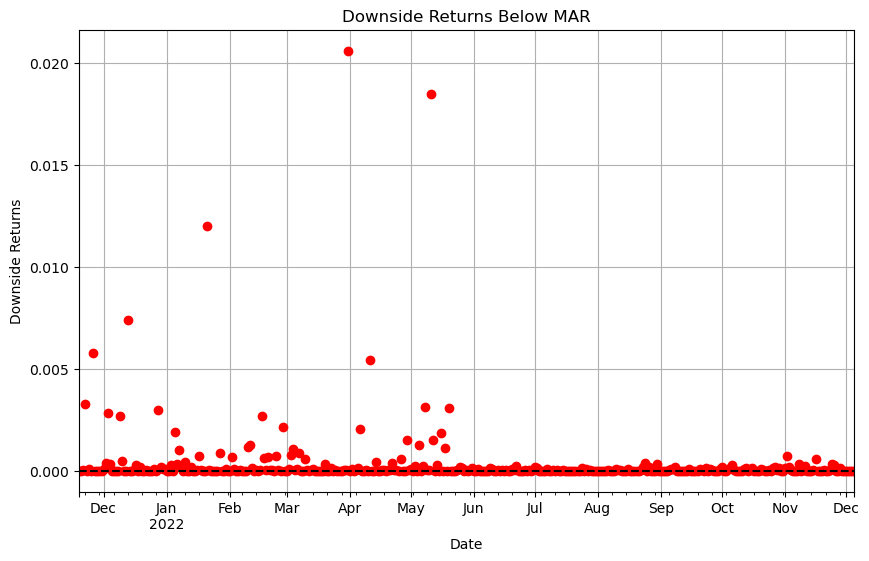

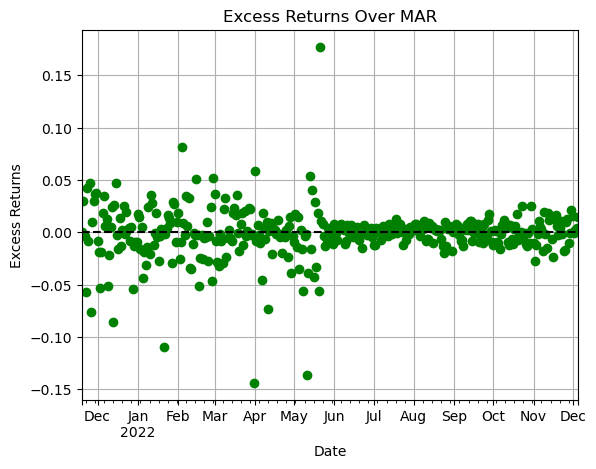

Sortino ratio: -1.0002994969252221
Scaled Sortino diff: 3.896840229870561e-05
port change pct 0.04251999662447046
scaled port change 0.04251999662447046
reward -0.09565628205016544
Reward at the end of the cycle on 2022-12-05 00:00:00: -1.0959947473776863
Completed cycle up to 2022-12-05 00:00:00
Running simulation from 2022-12-06 00:00:00 to 2022-12-30 00:00:00
Cycle Number: 9, Epsilon: 0.4169621071437778
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.050000000000006685
weight difference -0.29981506685740344
Desired adjustment -2.9981506685740342
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.34981506685741015, Target: 0.050000000000006685, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.49999999999999317
weight difference 0.4267265835773262
Desired adjustment 4.26

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


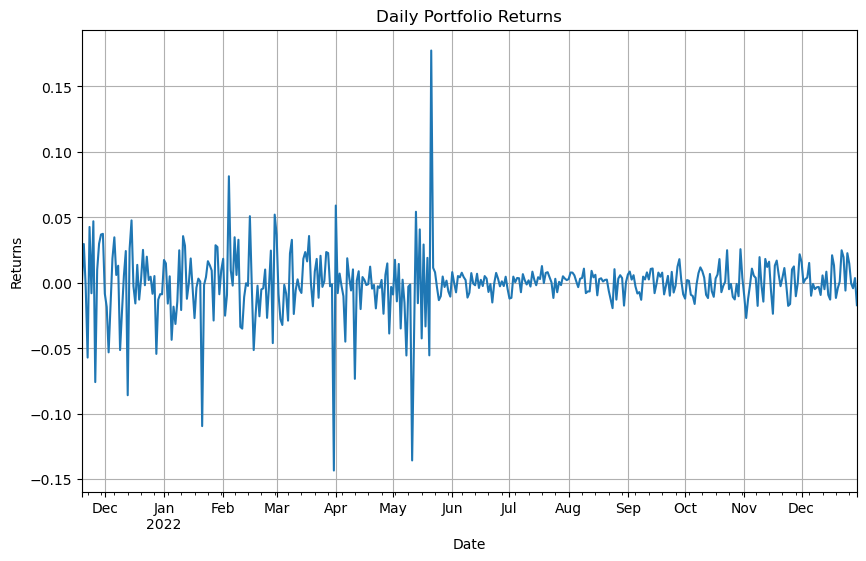

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


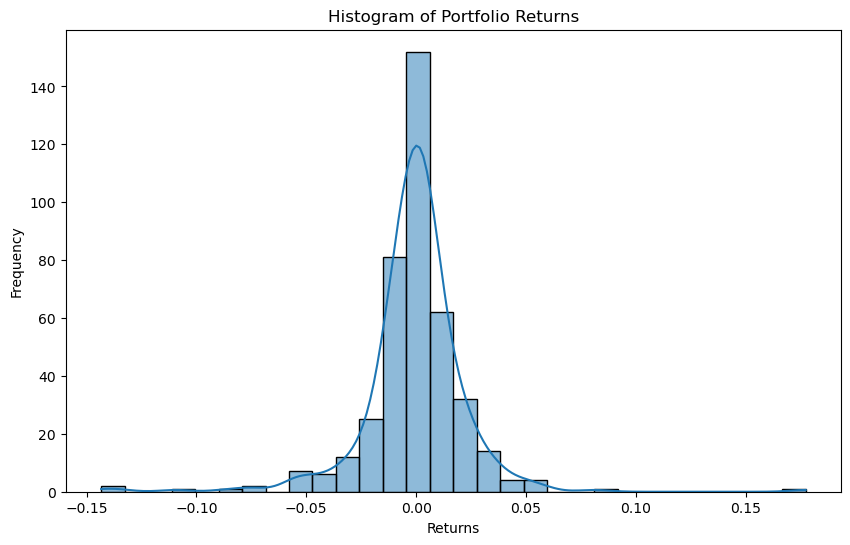

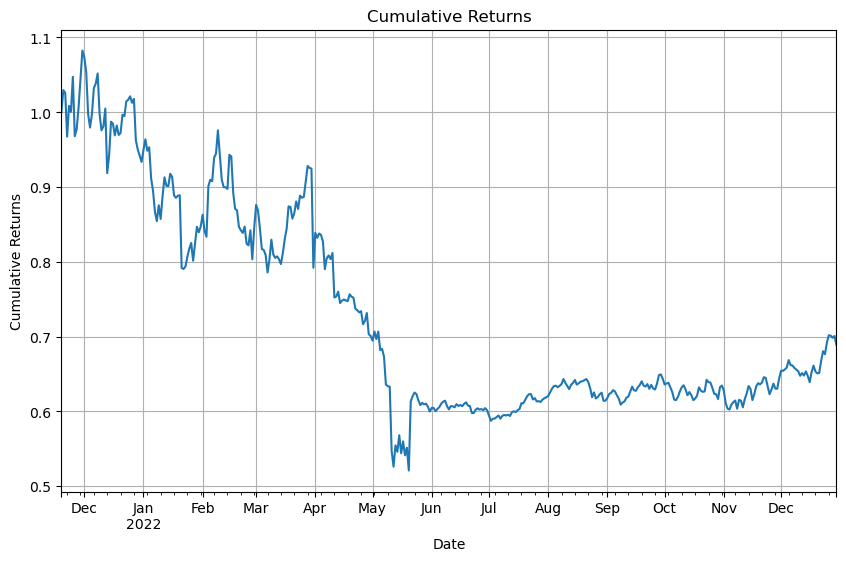

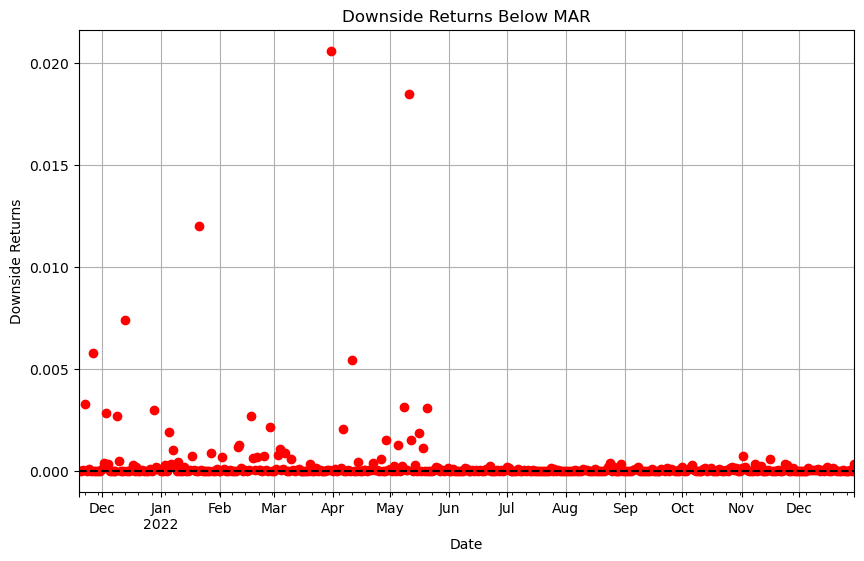

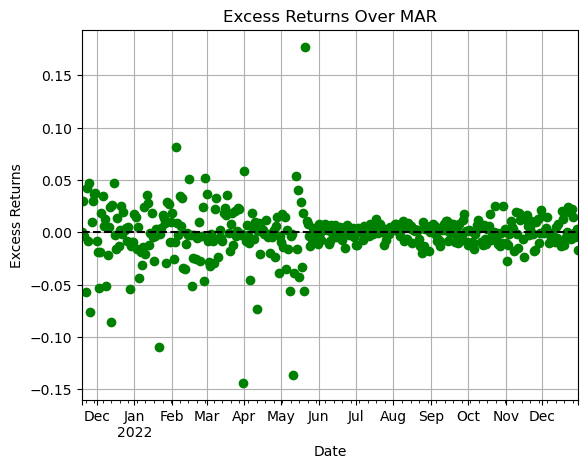

Sortino ratio: -0.9304607348458861
Scaled Sortino diff: 4.0869737580484324e-05
port change pct -0.005422271657184326
scaled port change -0.005422271657184326
reward -0.13915524211274505
Reward at the end of the cycle on 2022-12-30 00:00:00: -1.0696568466962117
Completed cycle up to 2022-12-30 00:00:00
Running simulation from 2022-12-31 00:00:00 to 2023-01-24 00:00:00
Cycle Number: 10, Epsilon: 0.37630830169725943
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.050000000000005734
weight difference -0.2935346606881092
Desired adjustment -2.935346606881092
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.3435346606881149, Target: 0.050000000000005734, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.49999999999999656
weight difference 0.4099028304586403
Desired adjustment 

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


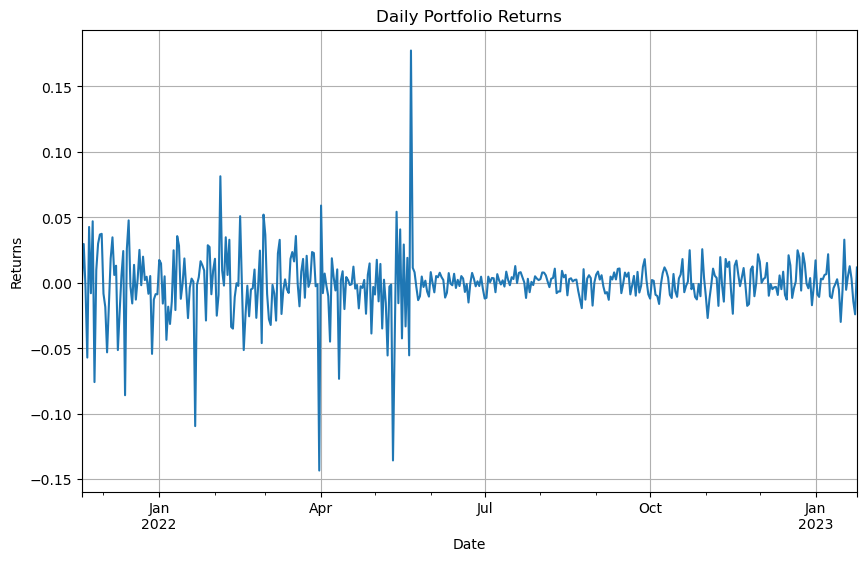

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


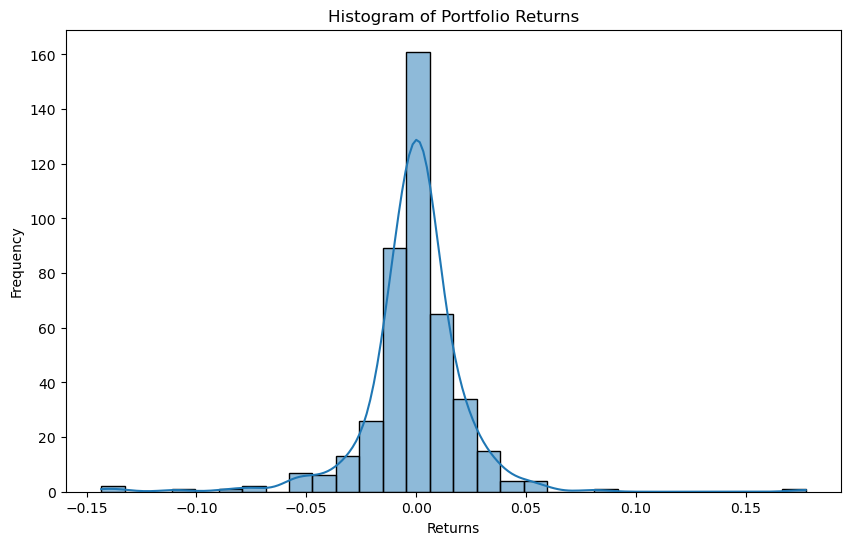

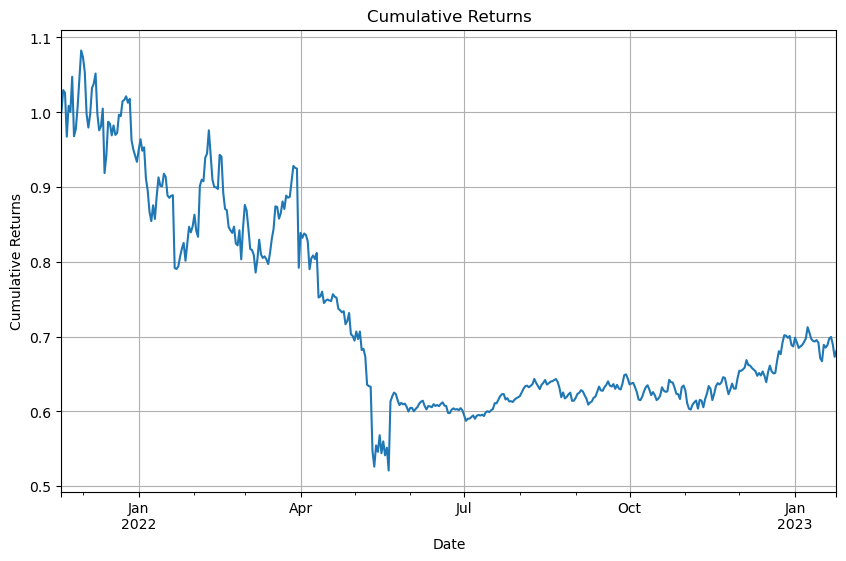

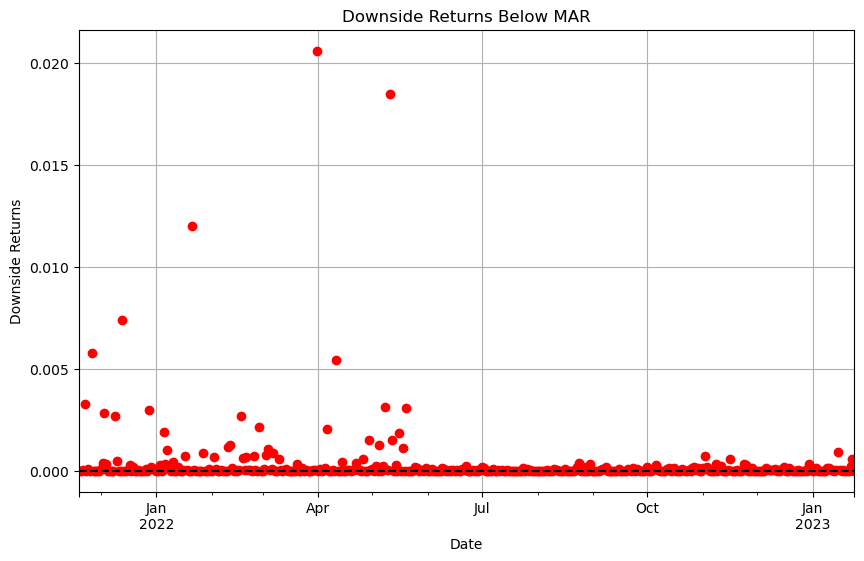

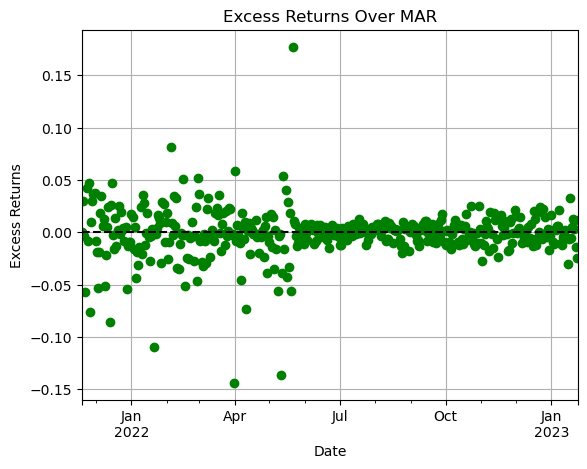

Sortino ratio: -0.9309589958361818
Scaled Sortino diff: 3.7329639117774974e-05
port change pct -0.050859531703229564
scaled port change -0.050859531703229564
reward -0.18261342974706707
Reward at the end of the cycle on 2023-01-24 00:00:00: -1.1136097552223667
Completed cycle up to 2023-01-24 00:00:00
Running simulation from 2023-01-25 00:00:00 to 2023-02-18 00:00:00
Cycle Number: 11, Epsilon: 0.3396182422817766
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05000000000001001
weight difference -0.2708576861563543
Desired adjustment -2.708576861563543
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.32085768615636434, Target: 0.05000000000001001, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.4999999999999919
weight difference 0.4029341373096994
Desired adjustment 4.0

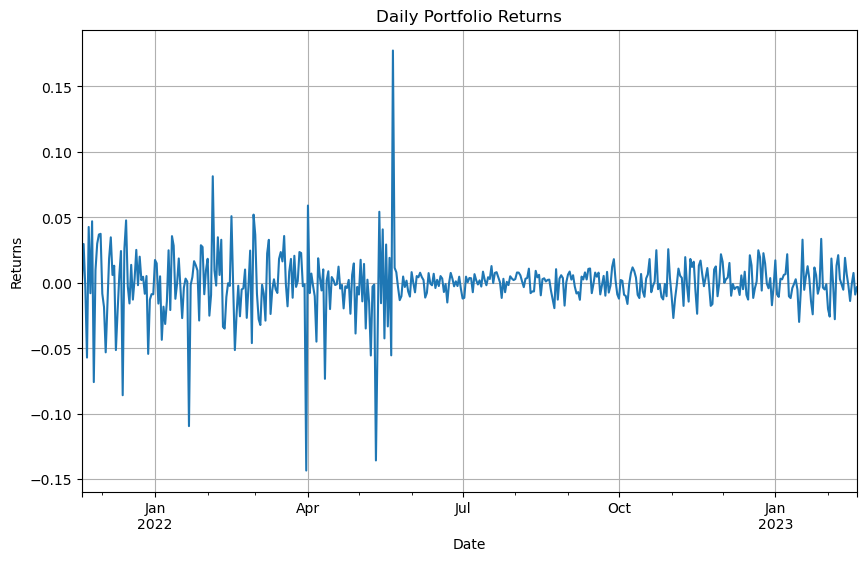

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


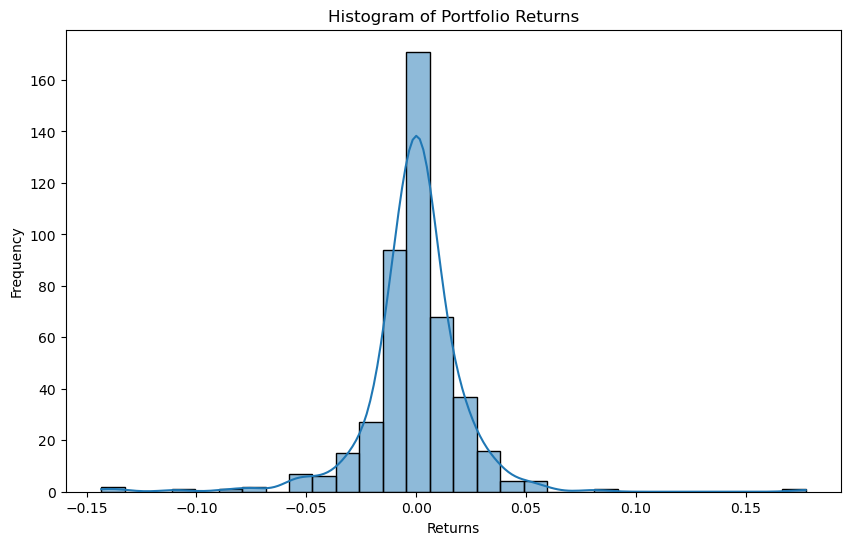

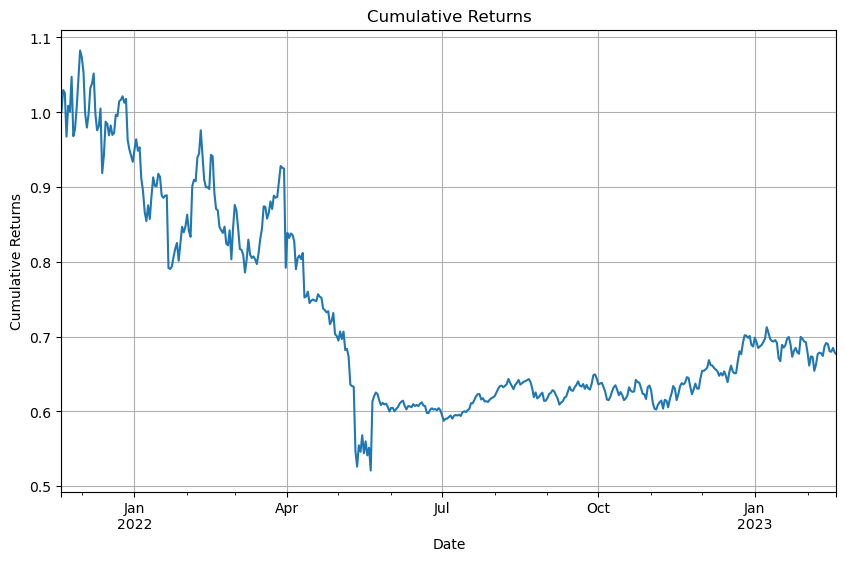

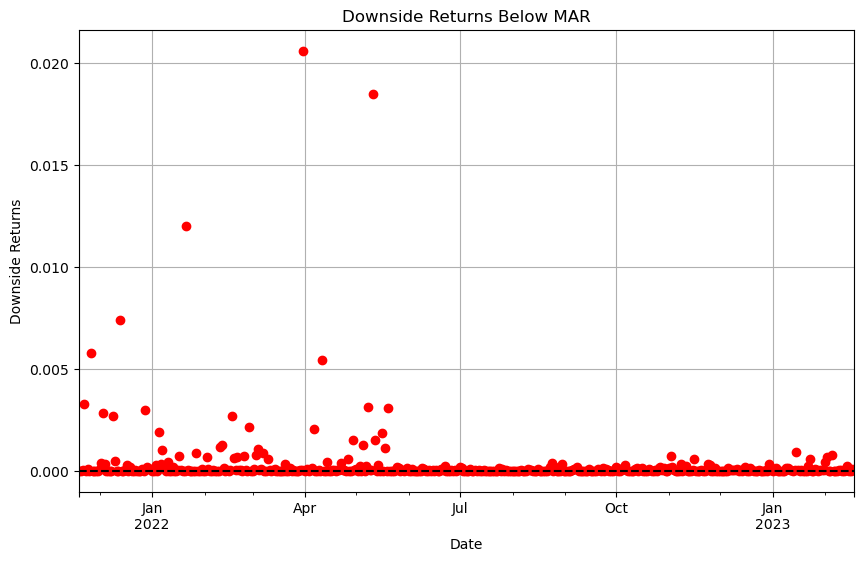

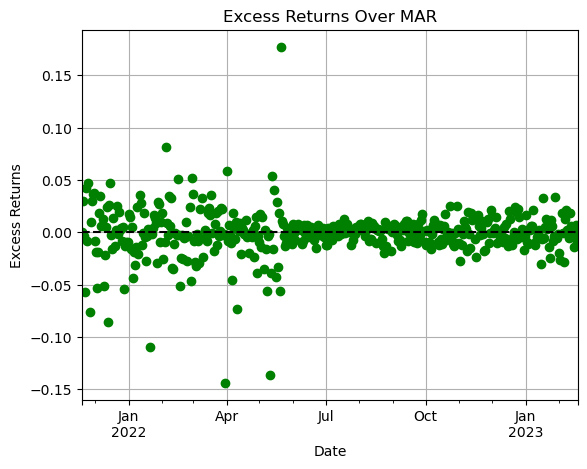

Sortino ratio: -0.9228402947378777
Scaled Sortino diff: 3.614058857088698e-05
port change pct -0.05731695512636697
scaled port change -0.05731695512636697
reward -0.18362321013736913
Reward at the end of the cycle on 2023-02-18 00:00:00: -1.1064996454638176
Completed cycle up to 2023-02-18 00:00:00
Running simulation from 2023-02-19 00:00:00 to 2023-03-15 00:00:00
Cycle Number: 12, Epsilon: 0.30650546365930337
State: {'ETH Vault_collateral_usd': 0.31139517420681356, 'stETH Vault_collateral_usd': 0.1171452999466489, 'BTC Vault_collateral_usd': 0.1341557506145549, 'Altcoin Vault_collateral_usd': 0.0481835984752946, 'Stablecoin Vault_collateral_usd': 0.05507431533485621, 'LP Vault_collateral_usd': 0.09076651975972354, 'PSM Vault_collateral_usd': 0.24327934166210824}
Chosen Action: {'stETH Vault_dai_ceiling': -0.33664063937107247, 'ETH Vault_dai_ceiling': -0.14138240368868416, 'BTC Vault_dai_ceiling': 0.266778172010248, 'Altcoin Vault_dai_ceiling': 0.01725649524179107, 'Stablecoin Vault_da

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


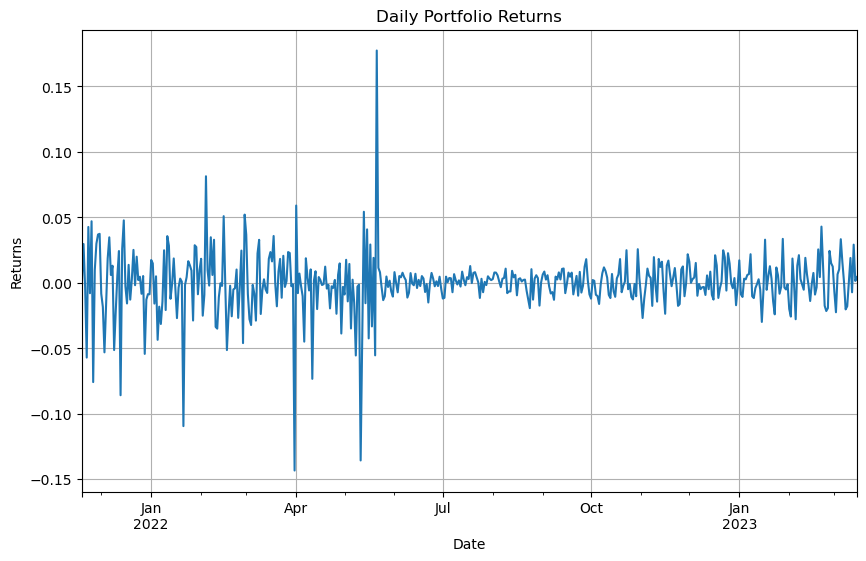

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


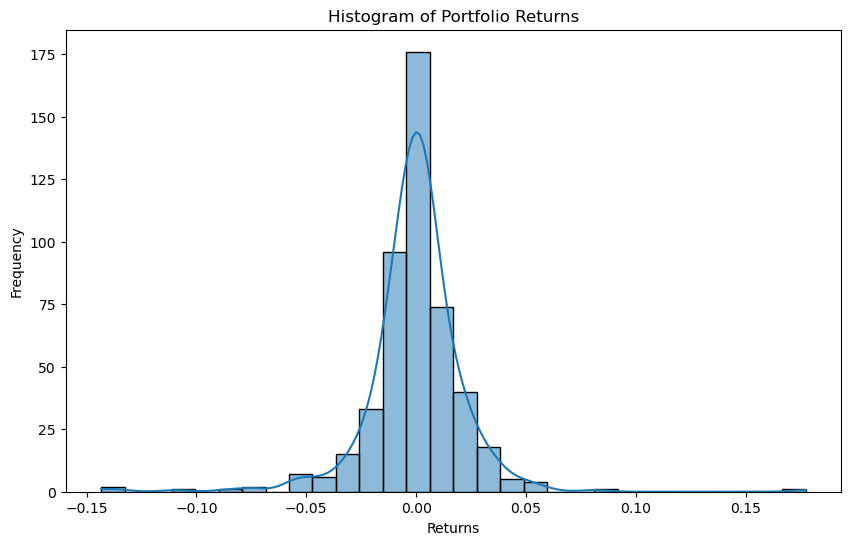

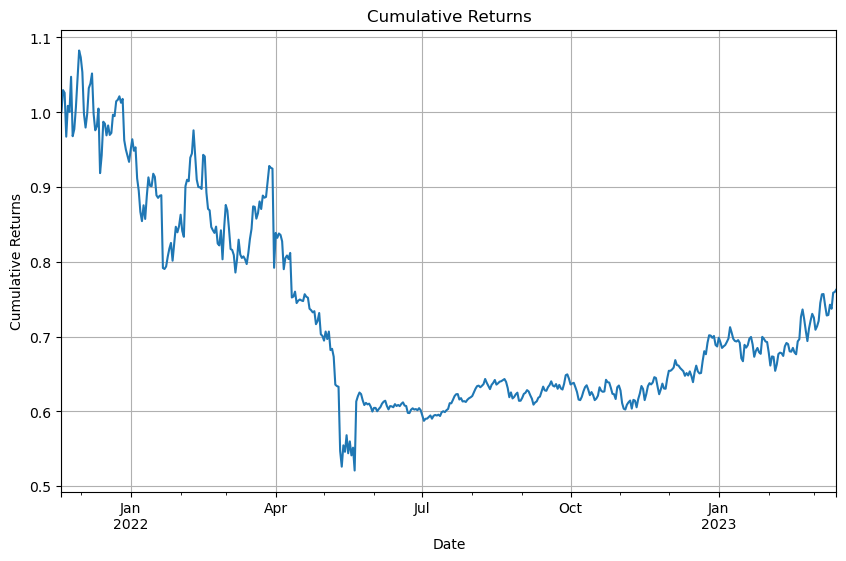

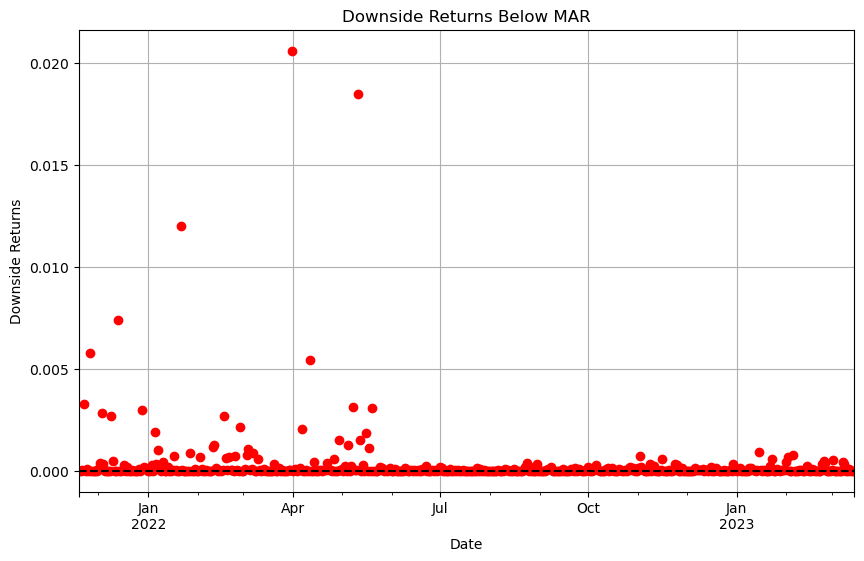

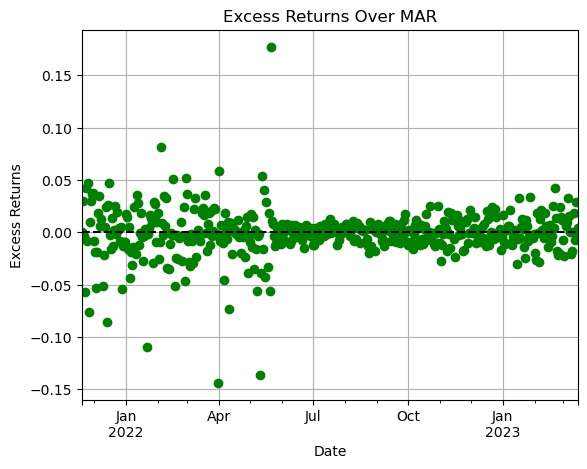

Sortino ratio: -0.6939639220744863
Scaled Sortino diff: 3.3282348276024676e-05
port change pct 0.06336432705483279
scaled port change 0.06336432705483279
reward -0.06549043149313737
Reward at the end of the cycle on 2023-03-15 00:00:00: -0.7594876359158997
Completed cycle up to 2023-03-15 00:00:00
Running simulation from 2023-03-16 00:00:00 to 2023-04-09 00:00:00
Cycle Number: 13, Epsilon: 0.2766211809525213
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05000000000000088
weight difference -0.2554318302997435
Desired adjustment -2.5543183029974346
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.30543183029974436, Target: 0.05000000000000088, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.49999999999999717
weight difference 0.38636111510633653
Desired adjustment 3.86

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


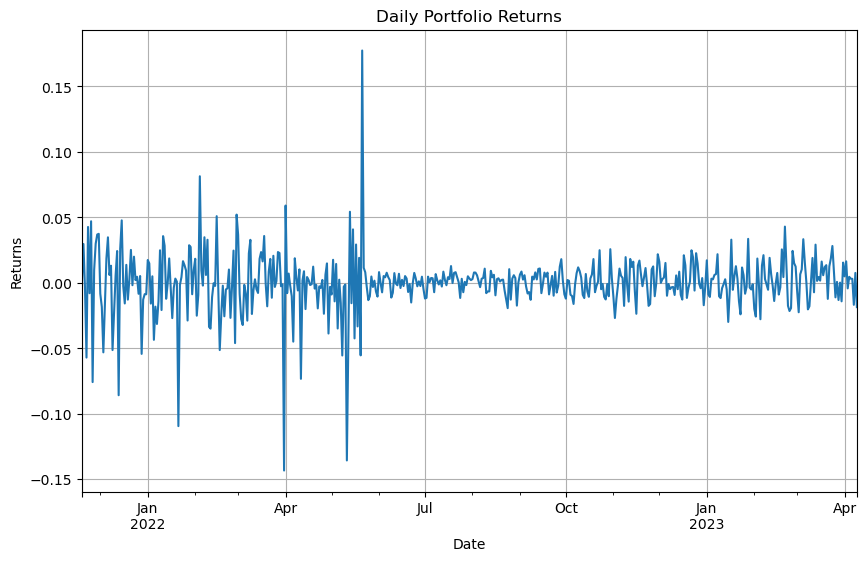

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


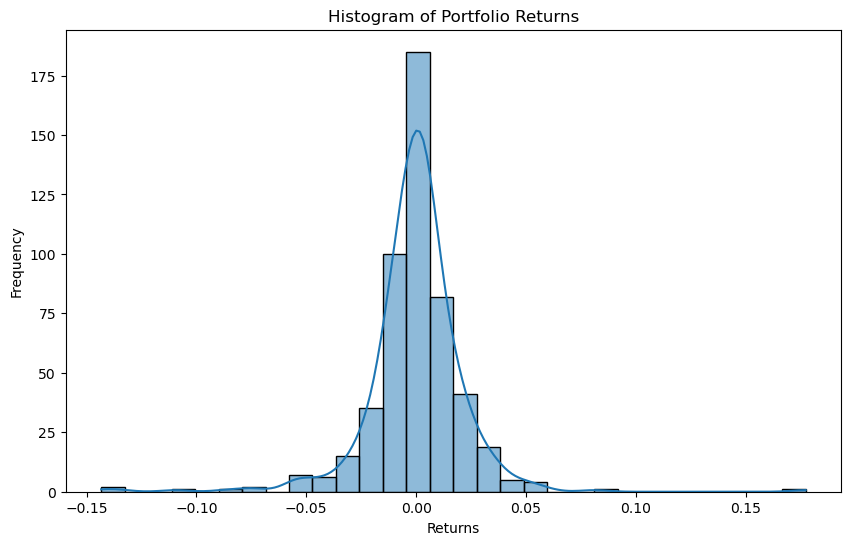

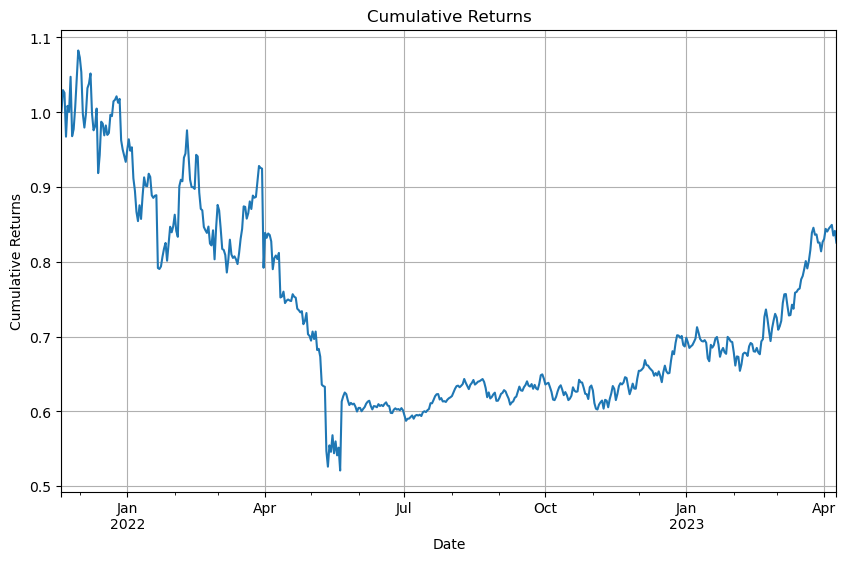

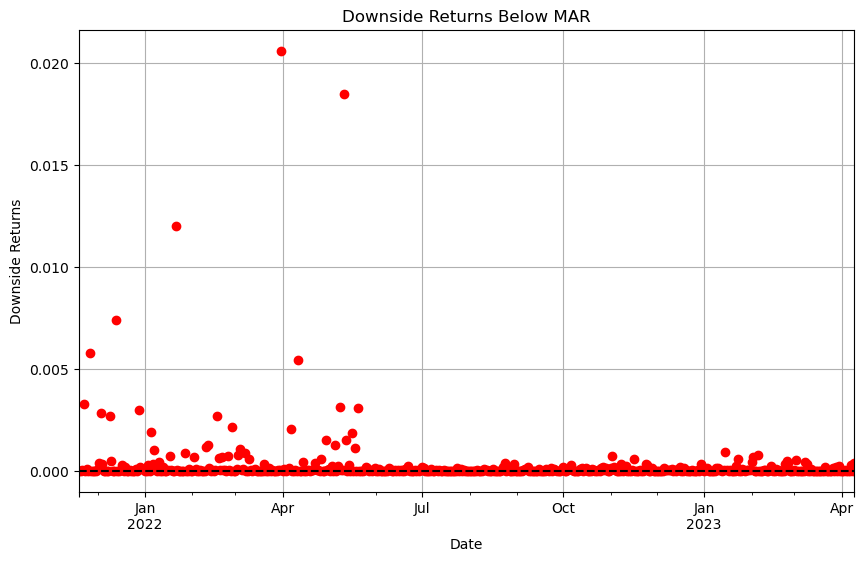

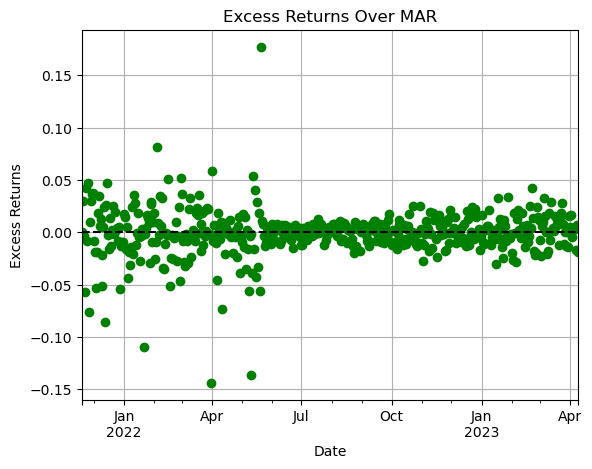

Sortino ratio: -0.5385232990775418
Scaled Sortino diff: 3.325609900227822e-05
port change pct 0.04097240255233562
scaled port change 0.04097240255233562
reward -0.08553091357292136
Reward at the end of the cycle on 2023-04-09 00:00:00: -0.6240874687494655
Completed cycle up to 2023-04-09 00:00:00
Running simulation from 2023-04-10 00:00:00 to 2023-05-04 00:00:00
Cycle Number: 14, Epsilon: 0.24965061580965048
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.050000000000002924
weight difference -0.25200335872852114
Desired adjustment -2.5200335872852113
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.3020033587285241, Target: 0.050000000000002924, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.4999999999999984
weight difference 0.3758261086867597
Desired adjustment 3.75

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


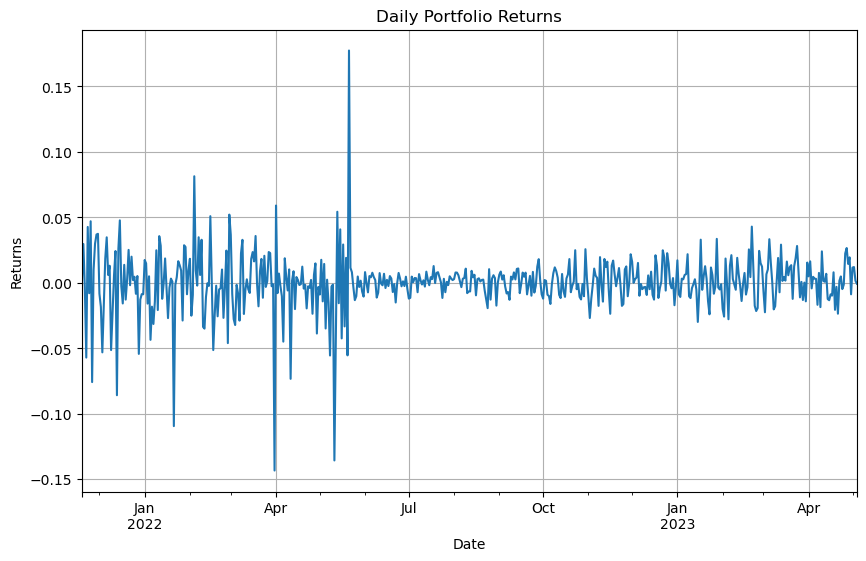

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


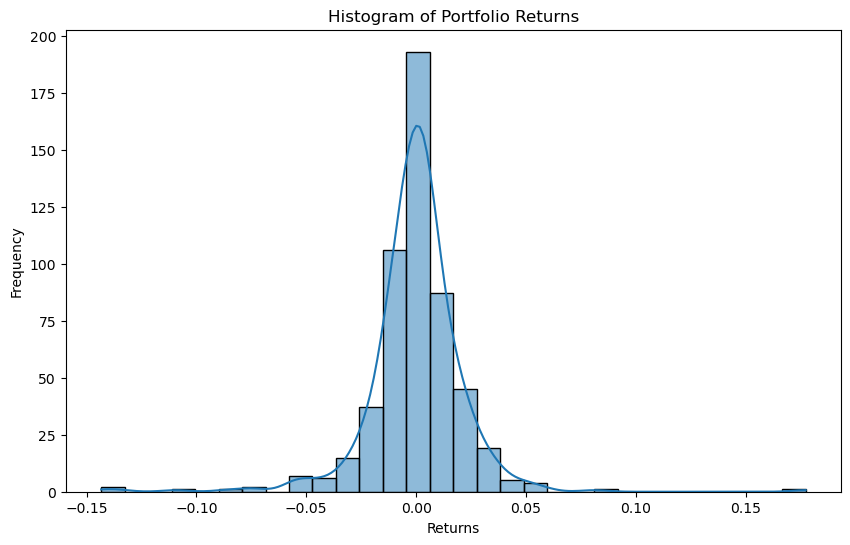

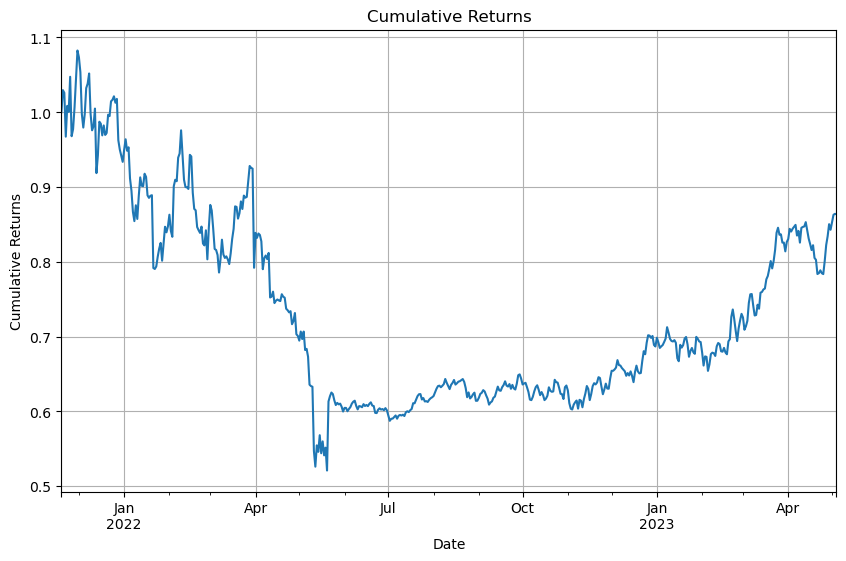

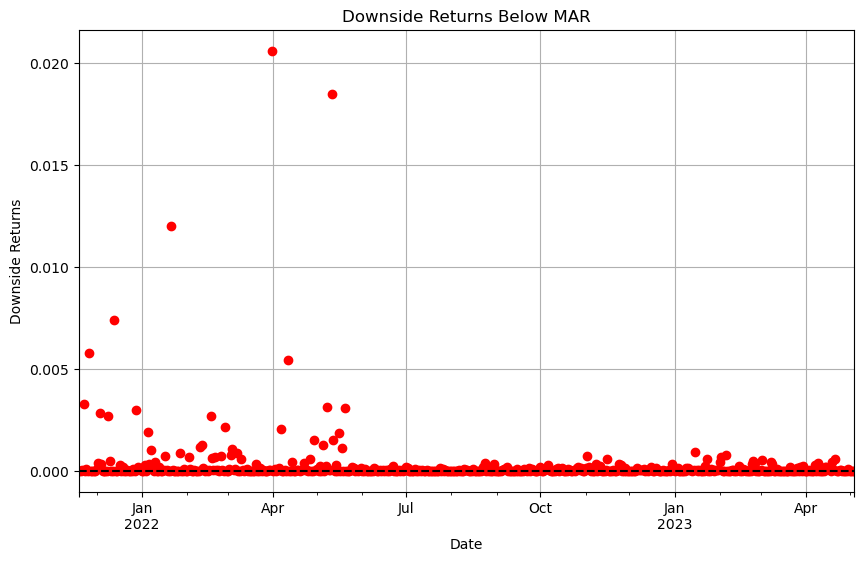

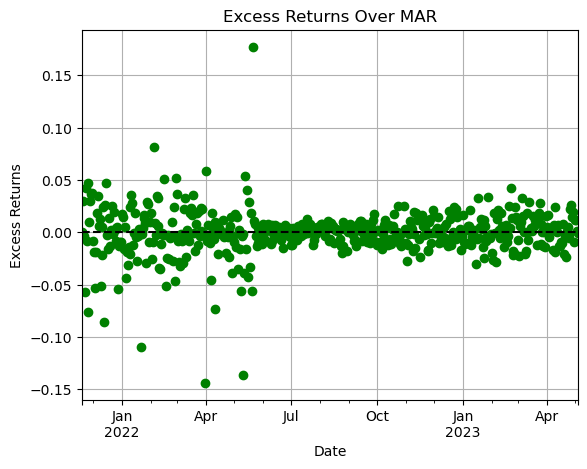

Sortino ratio: -0.44707160025167864
Scaled Sortino diff: 3.1728234438111575e-05
port change pct 0.0029577006067953975
scaled port change 0.0029577006067953975
reward -0.12151402975207659
Reward at the end of the cycle on 2023-05-04 00:00:00: -0.5686173582381934
Completed cycle up to 2023-05-04 00:00:00
Running simulation from 2023-05-05 00:00:00 to 2023-05-29 00:00:00
Cycle Number: 15, Epsilon: 0.22530968076820954
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.23571528566433153
Desired adjustment -2.3571528566433155
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.2857152856643315, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.5
weight difference 0.36863198918081186
Desired adjustment 3.6863198918081186
adjustment scale 10
legal

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


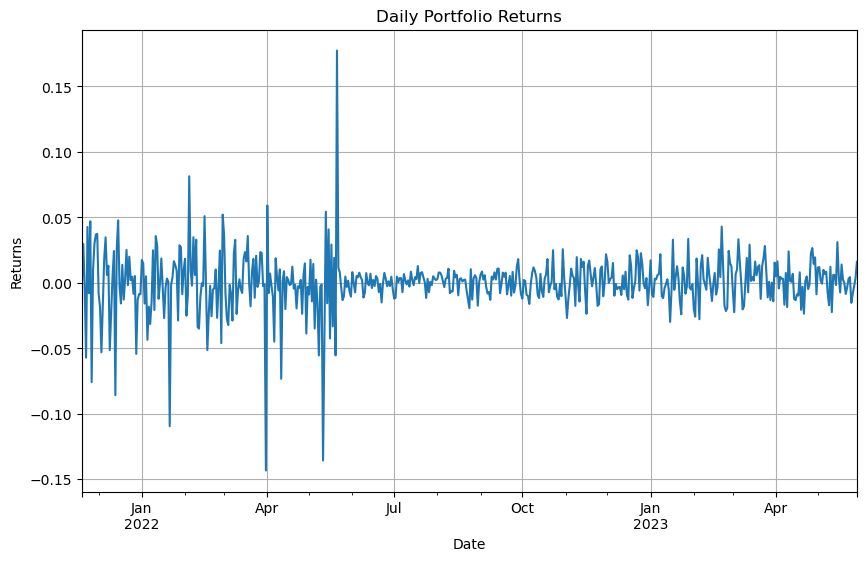

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


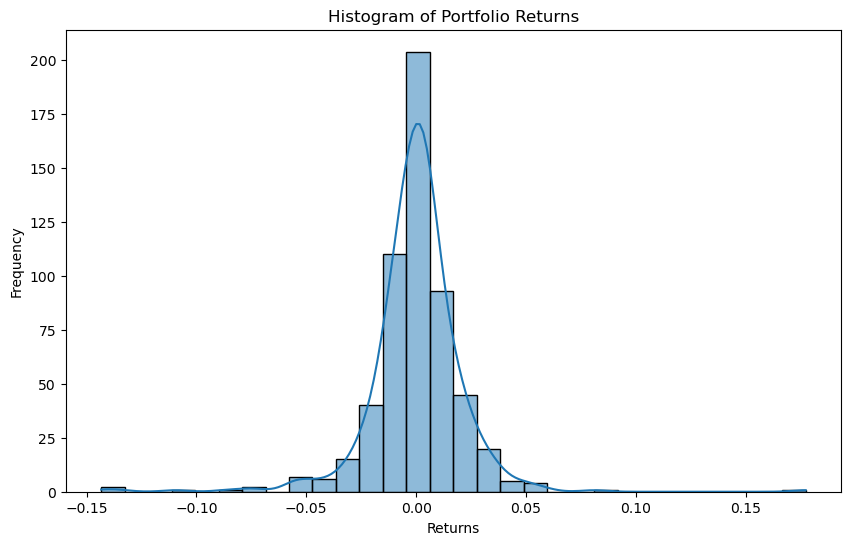

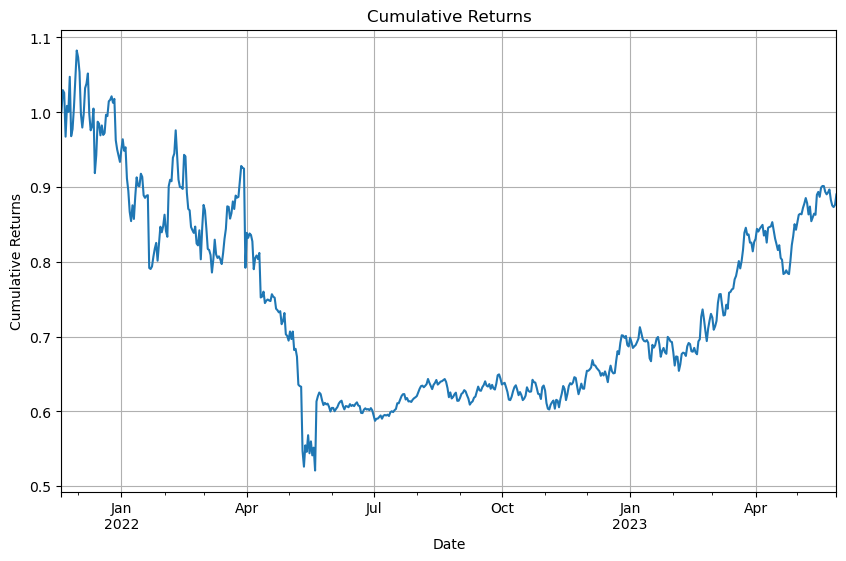

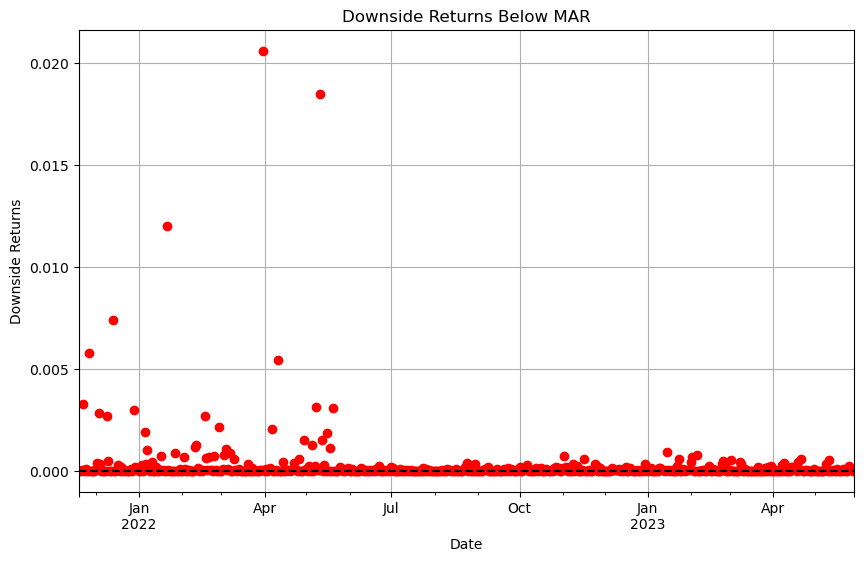

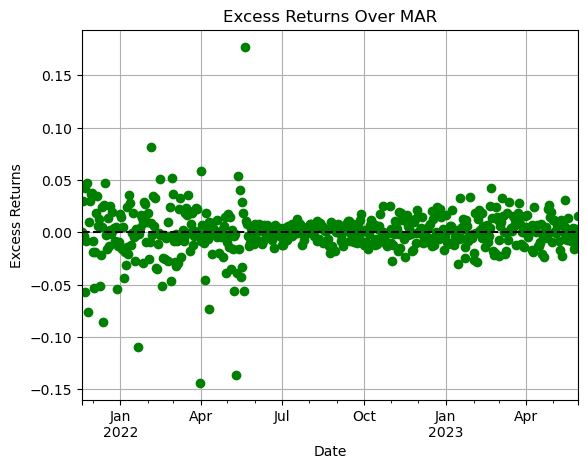

Sortino ratio: -0.38568475421162335
Scaled Sortino diff: 2.9617881685321582e-05
port change pct -0.0005495239032110884
scaled port change -0.0005495239032110884
reward -0.12548700758232212
Reward at the end of the cycle on 2023-05-29 00:00:00: -0.5112013796756307
Completed cycle up to 2023-05-29 00:00:00
Running simulation from 2023-05-30 00:00:00 to 2023-06-23 00:00:00
Cycle Number: 16, Epsilon: 0.2033419868933091
State: {'ETH Vault_collateral_usd': 0.27302563138809055, 'stETH Vault_collateral_usd': 0.132093866184293, 'BTC Vault_collateral_usd': 0.1452293022955354, 'Altcoin Vault_collateral_usd': 0.0415894245315388, 'Stablecoin Vault_collateral_usd': 0.045523425315794945, 'LP Vault_collateral_usd': 0.10989537563870115, 'PSM Vault_collateral_usd': 0.25264297464604624}
Chosen Action: {'stETH Vault_dai_ceiling': -0.3897314916823138, 'ETH Vault_dai_ceiling': 0.24309462154533157, 'BTC Vault_dai_ceiling': 0.03425479319756497, 'Altcoin Vault_dai_ceiling': -0.25920710026521887, 'Stablecoin Va

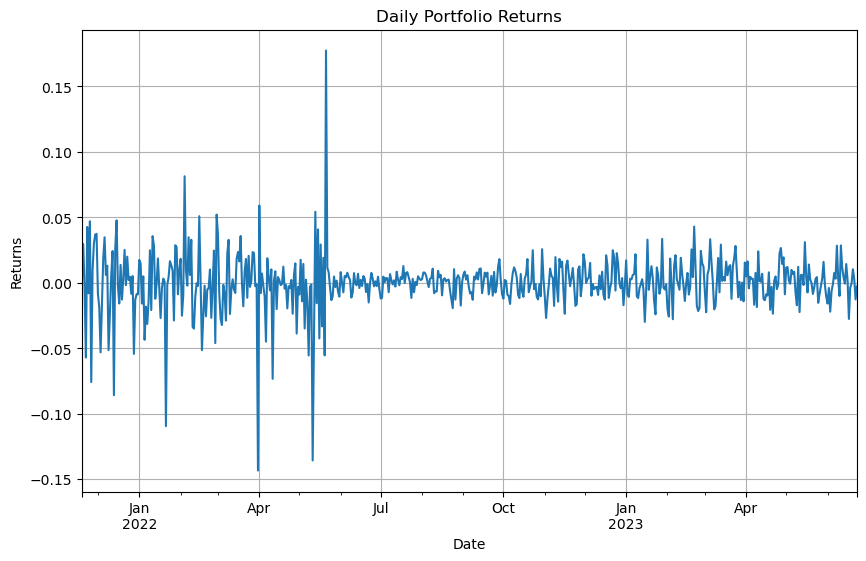

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


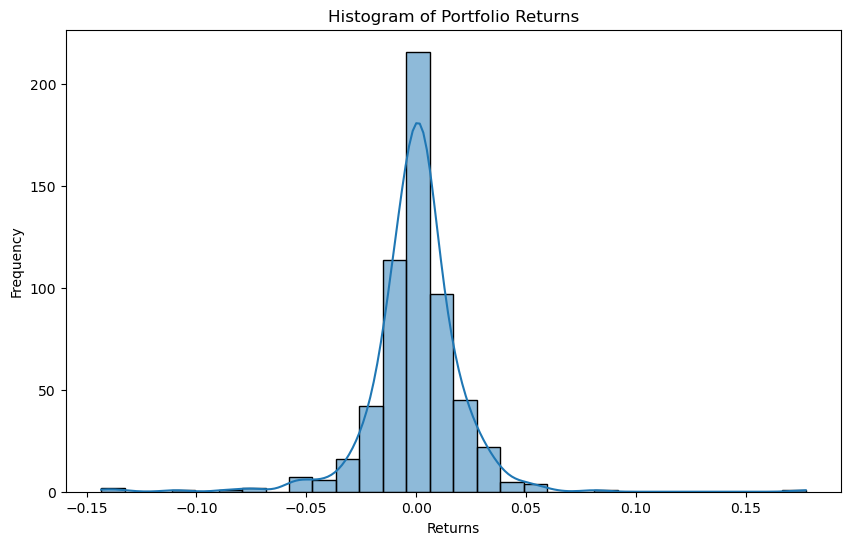

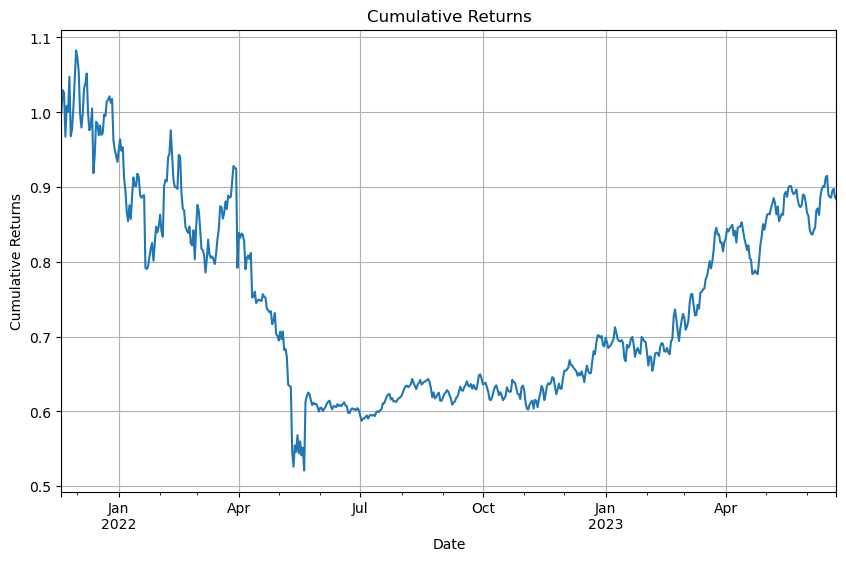

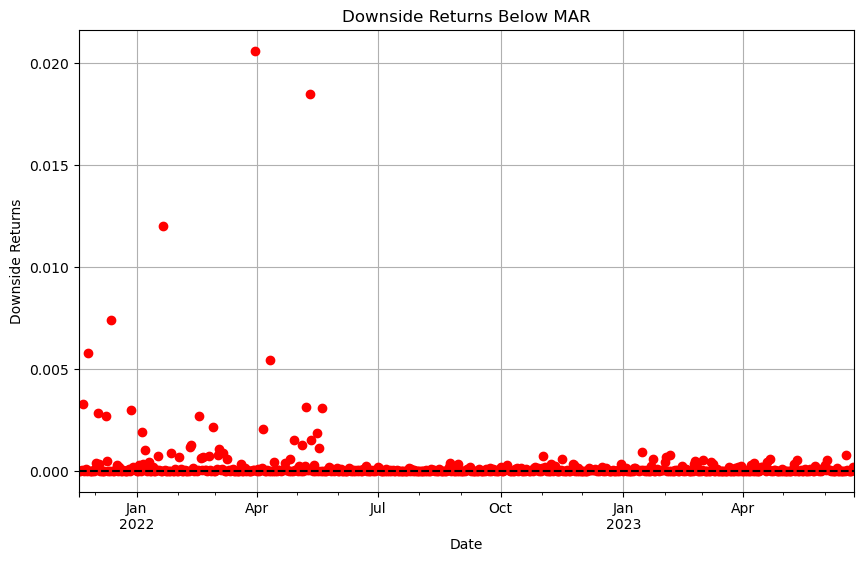

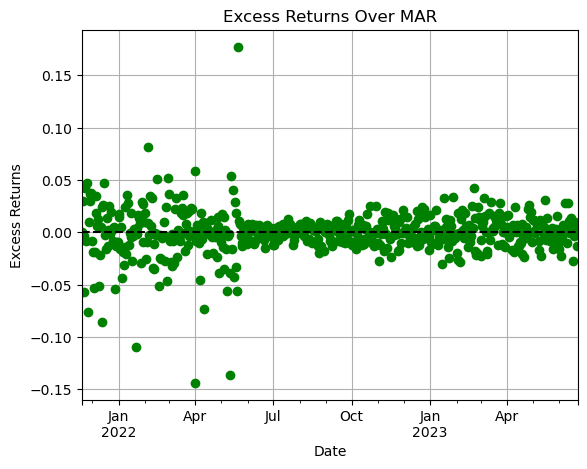

Sortino ratio: -0.39536609306634884
Scaled Sortino diff: 2.752022436698737e-05
port change pct -0.04036600977119901
scaled port change -0.04036600977119901
reward -0.1640214919364386
Reward at the end of the cycle on 2023-06-23 00:00:00: -0.5594151052271544
Completed cycle up to 2023-06-23 00:00:00
Running simulation from 2023-06-24 00:00:00 to 2023-07-18 00:00:00
Cycle Number: 17, Epsilon: 0.18351614317121145
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05000000000000334
weight difference -0.22835899931343226
Desired adjustment -2.2835899931343224
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.2783589993134356, Target: 0.05000000000000334, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.49999999999999734
weight difference 0.3623155851201533
Desired adjustment 3.6

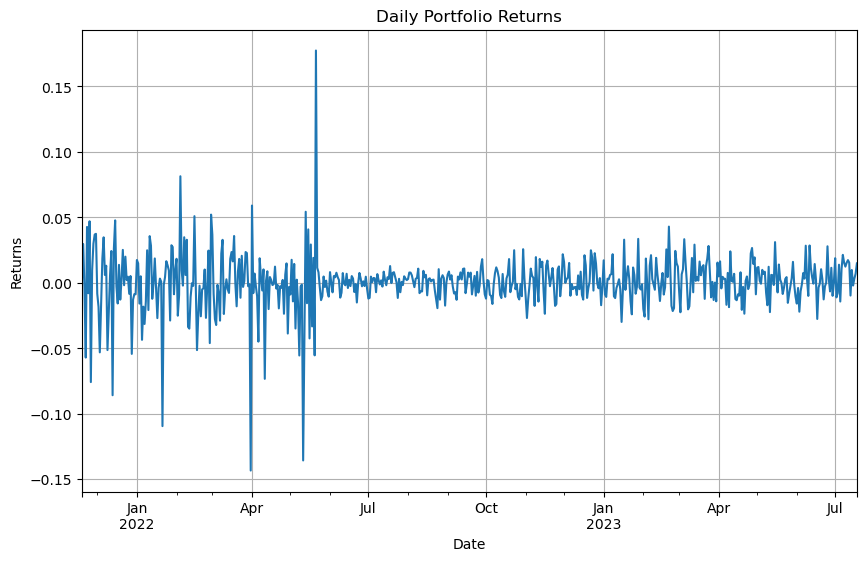

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


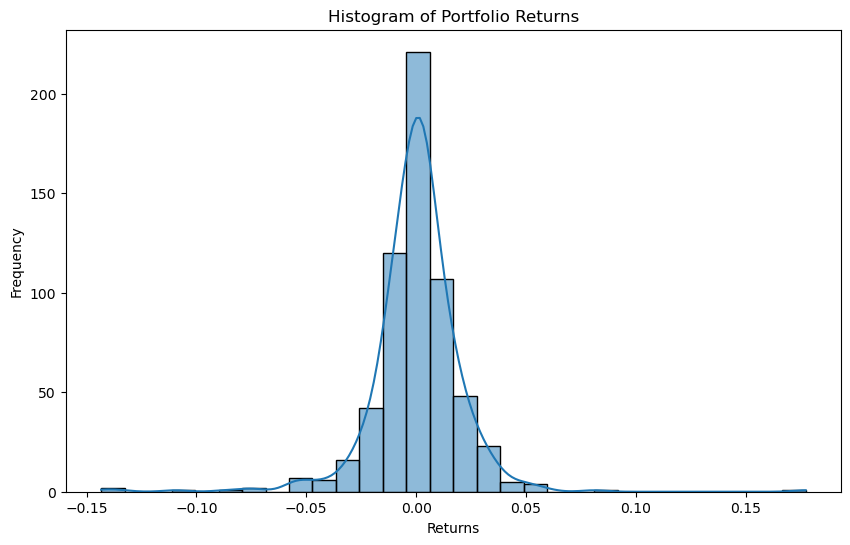

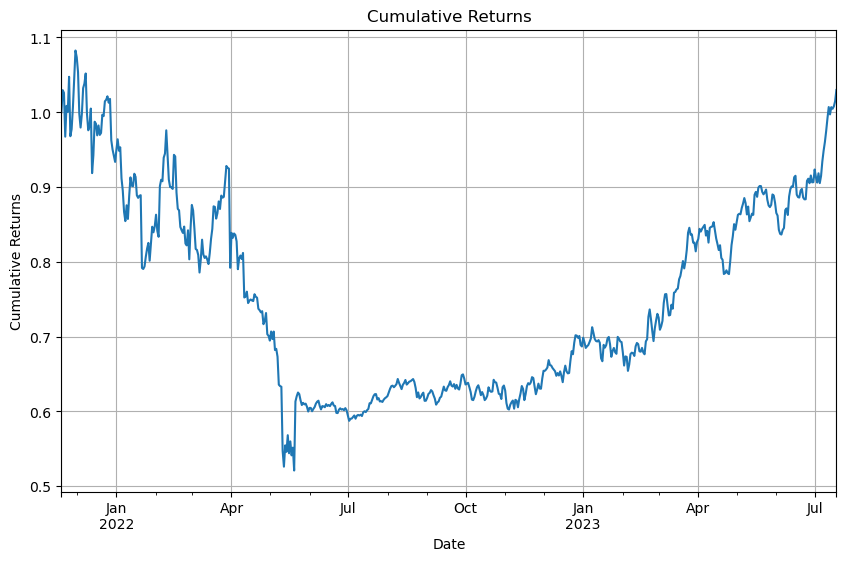

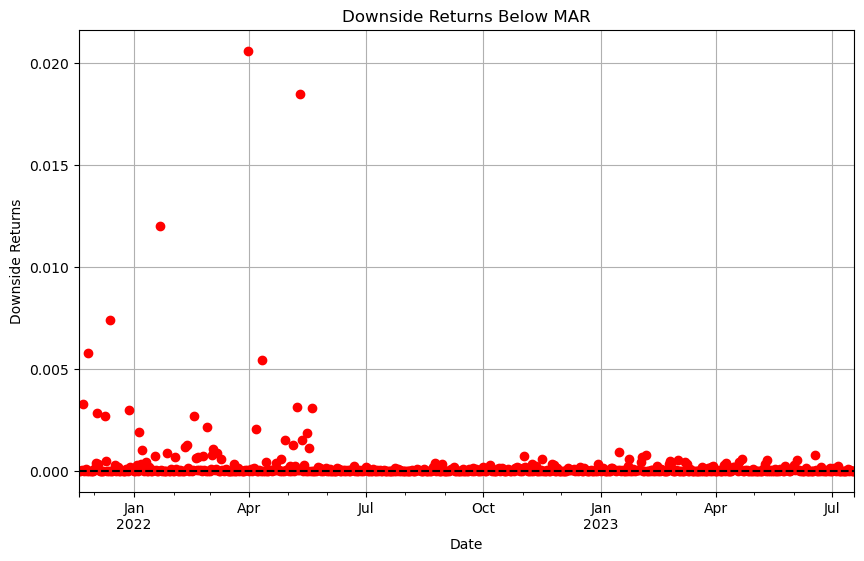

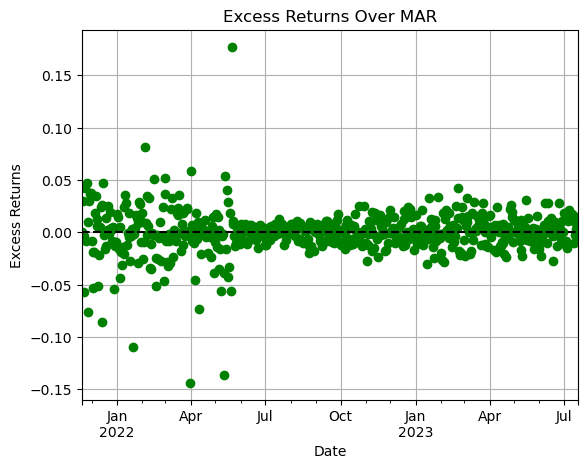

Sortino ratio: -0.10409256559458213
Scaled Sortino diff: 2.7176558001521497e-05
port change pct 0.13373579423616822
scaled port change 0.13373579423616822
reward 0.008281757584230692
Reward at the end of the cycle on 2023-07-18 00:00:00: -0.09583798456835296
Completed cycle up to 2023-07-18 00:00:00
Running simulation from 2023-07-19 00:00:00 to 2023-08-12 00:00:00
Cycle Number: 18, Epsilon: 0.16562331921201834
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.22036096250506587
Desired adjustment -2.2036096250506585
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.27036096250506586, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.5
weight difference 0.36016218474971934
Desired adjustment 3.6016218474971935
adjustment scale 10
legal a

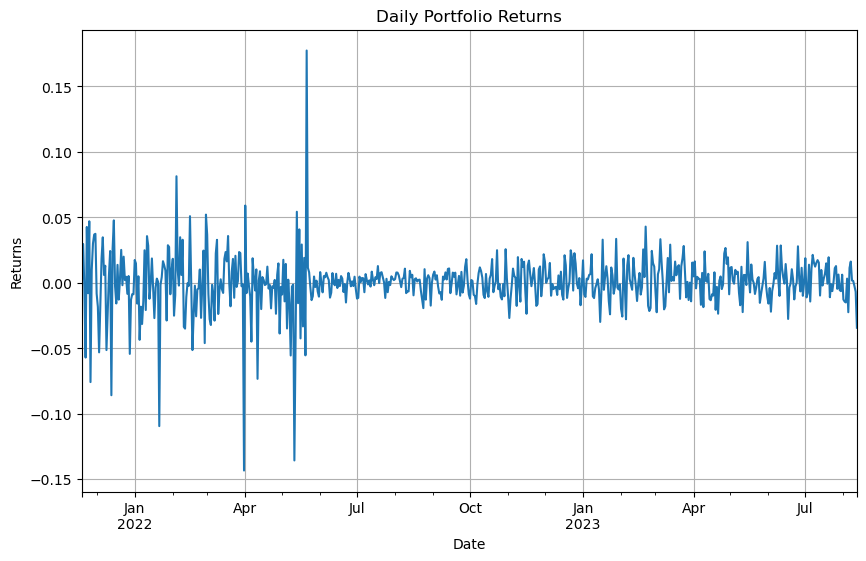

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


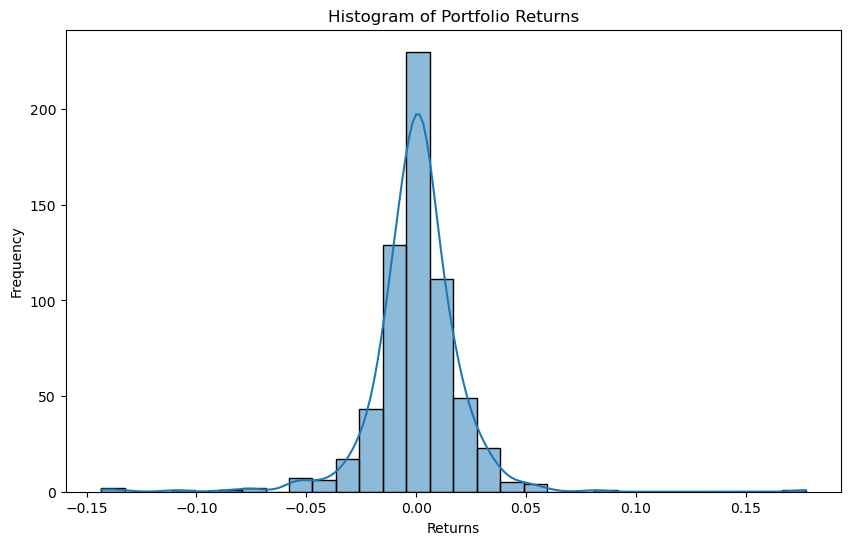

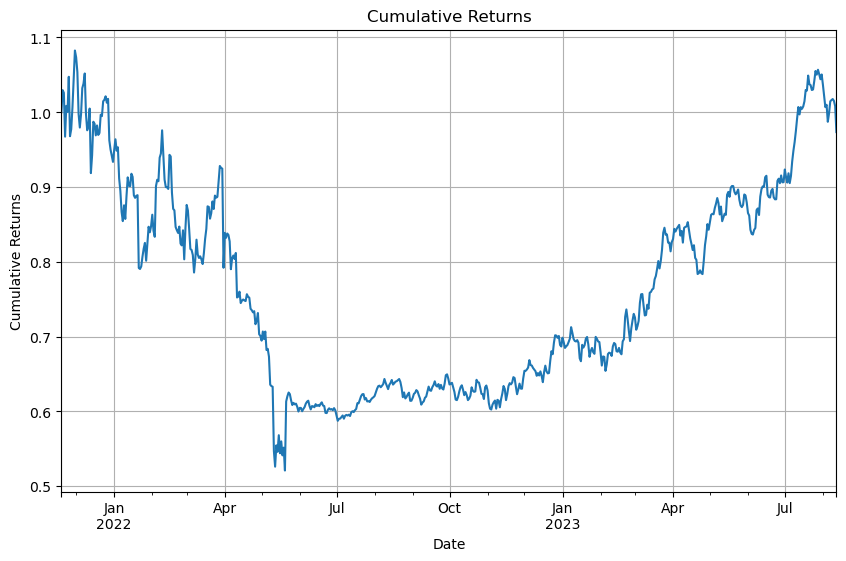

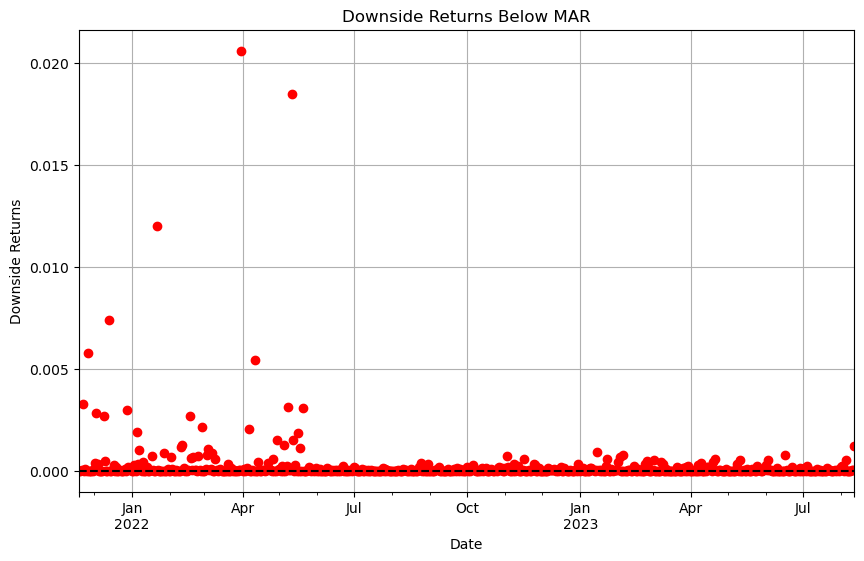

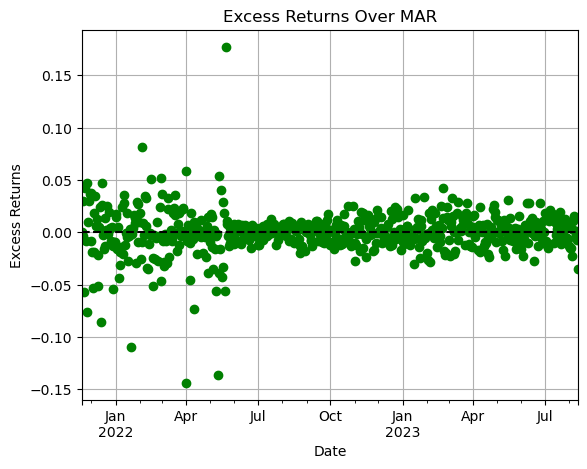

Sortino ratio: -0.21362575854012697
Scaled Sortino diff: 2.5957551876223156e-05
port change pct -0.07884259758508508
scaled port change -0.07884259758508508
reward -0.20027519056665039
Reward at the end of the cycle on 2023-08-12 00:00:00: -0.4139269066586536
Completed cycle up to 2023-08-12 00:00:00
Running simulation from 2023-08-13 00:00:00 to 2023-09-06 00:00:00
Cycle Number: 19, Epsilon: 0.14947504558884656
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.050000000000000086
weight difference -0.22612645235559647
Desired adjustment -2.2612645235559645
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.2761264523555966, Target: 0.050000000000000086, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.5
weight difference 0.3455486109818888
Desired adjustment 3.4554861098188

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


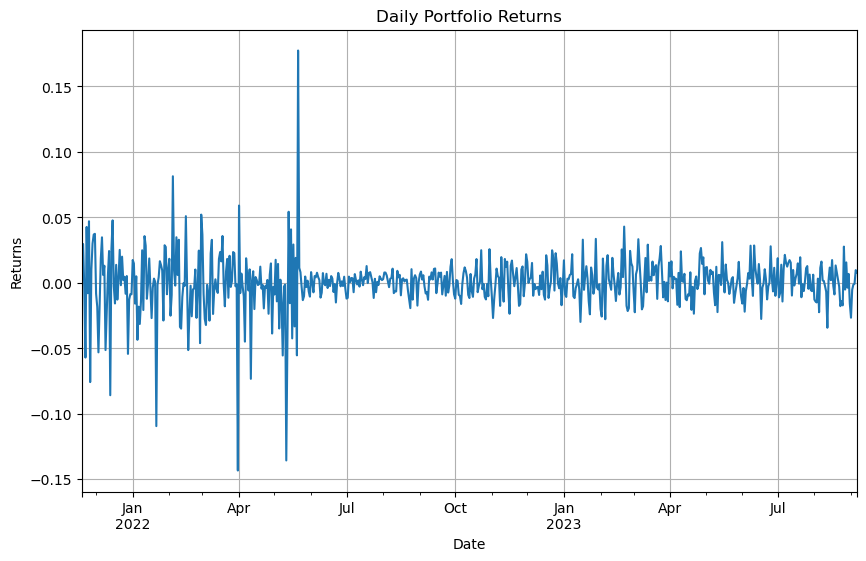

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


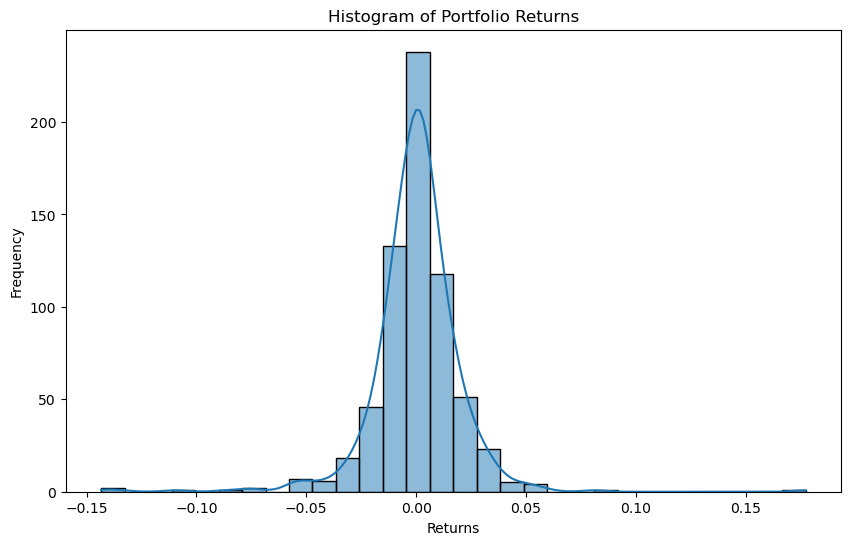

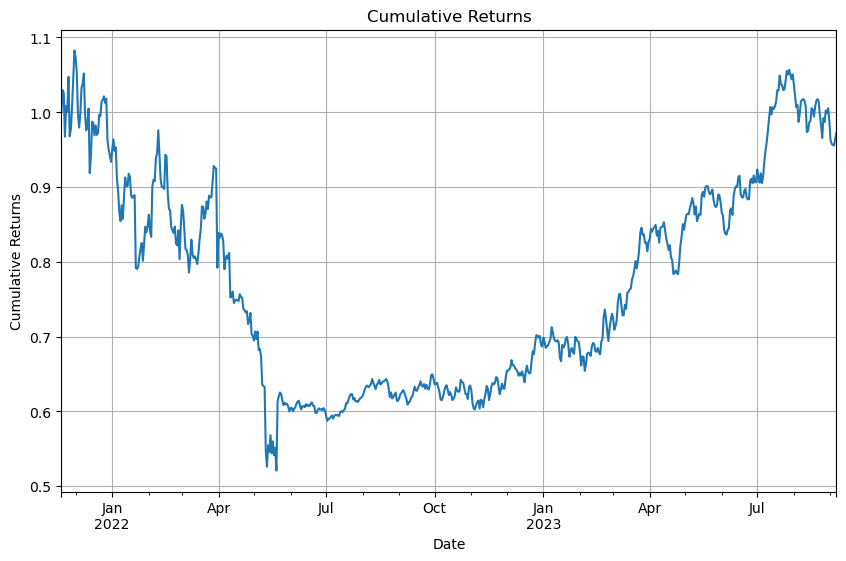

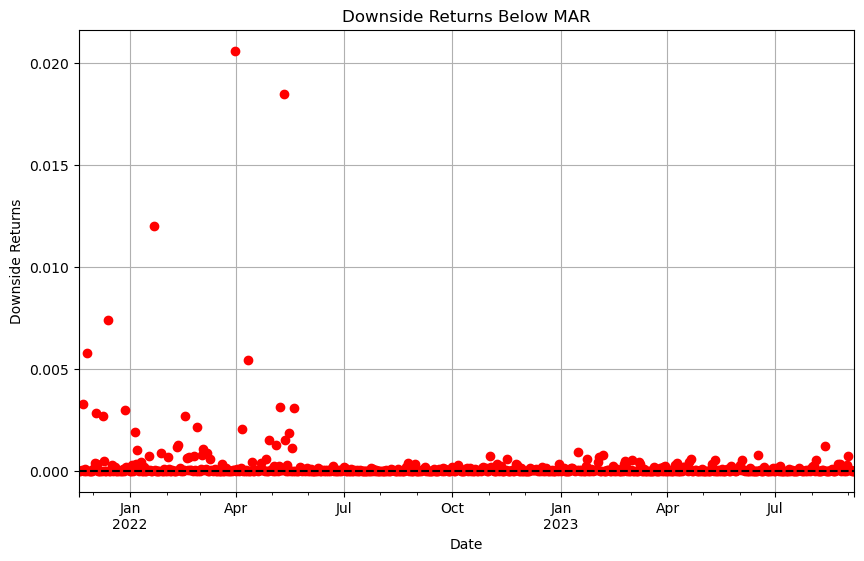

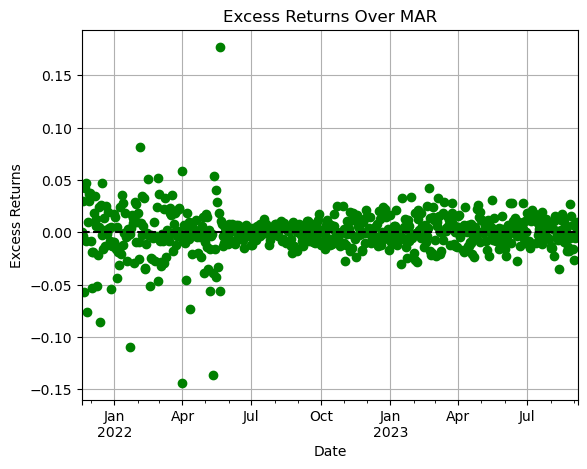

Sortino ratio: -0.2166395754194689
Scaled Sortino diff: 2.4924538358621274e-05
port change pct -0.031071763963679253
scaled port change -0.031071763963679253
reward -0.14872187948434806
Reward at the end of the cycle on 2023-09-06 00:00:00: -0.3653863794421756
Completed cycle up to 2023-09-06 00:00:00
Running simulation from 2023-09-07 00:00:00 to 2023-10-01 00:00:00
Cycle Number: 20, Epsilon: 0.134901228643934
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.20302010352539068
Desired adjustment -2.030201035253907
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.25302010352539067, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.5
weight difference 0.33703682674655844
Desired adjustment 3.3703682674655844
adjustment scale 10
legal ad

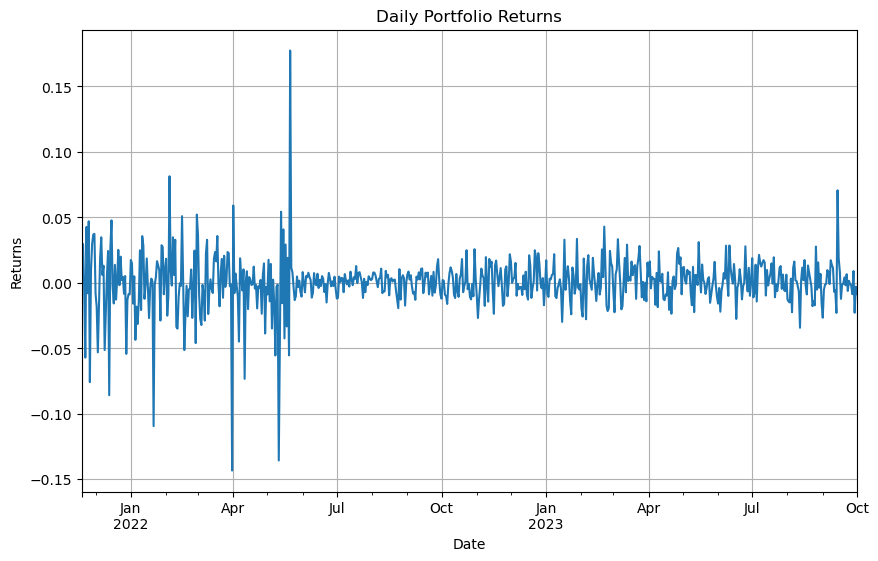

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


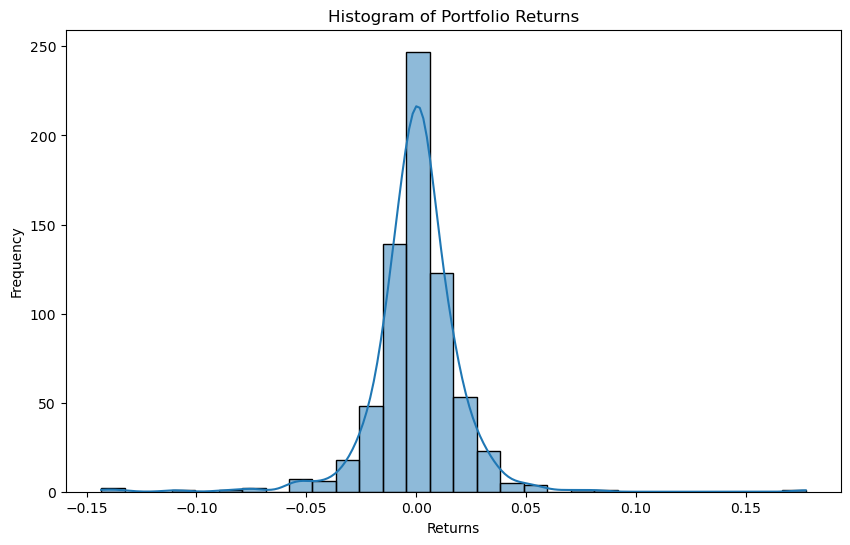

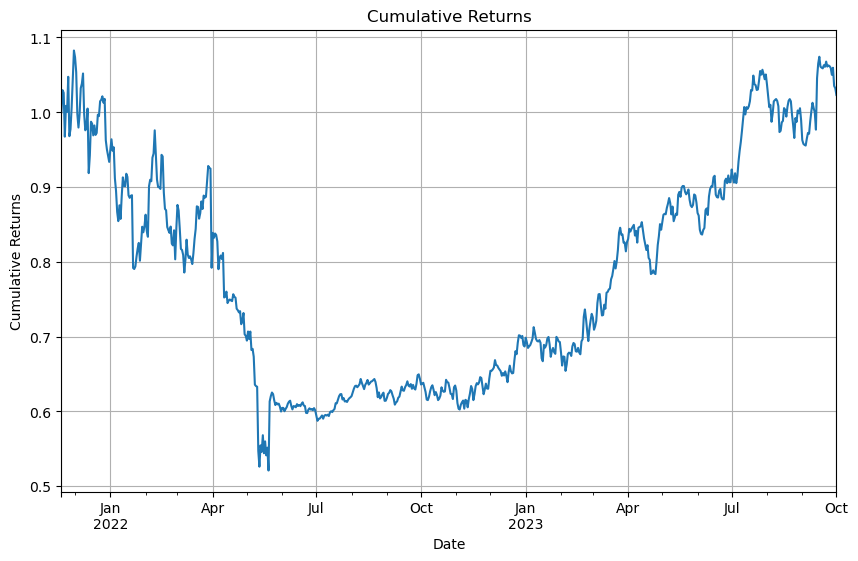

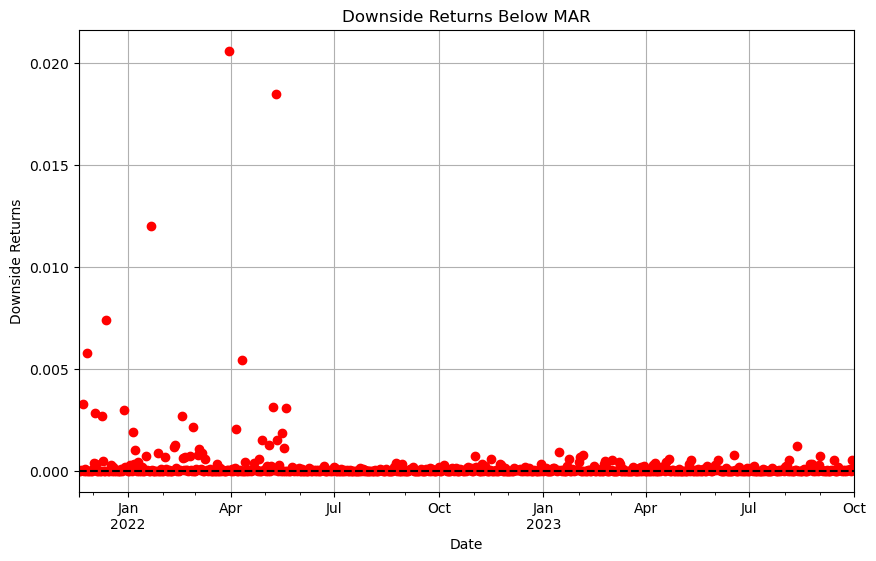

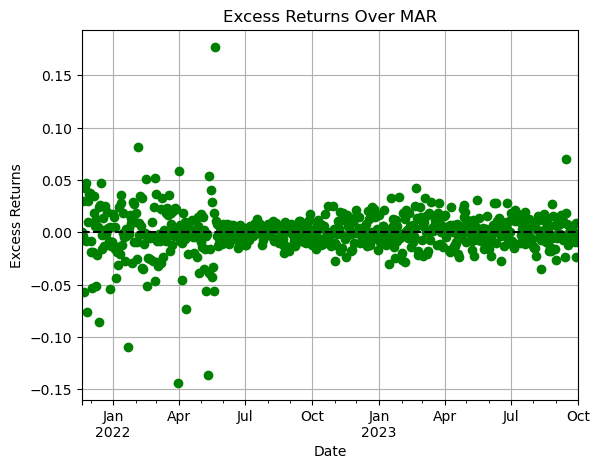

Sortino ratio: -0.126329285720613
Scaled Sortino diff: 2.391181657713906e-05
port change pct 0.000499860485127589
scaled port change 0.000499860485127589
reward -0.1143365418963462
Reward at the end of the cycle on 2023-10-01 00:00:00: -0.24068973943353636
Completed cycle up to 2023-10-01 00:00:00
Running simulation from 2023-10-02 00:00:00 to 2023-10-26 00:00:00
Cycle Number: 21, Epsilon: 0.12174835885115043
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.2006774189586692
Desired adjustment -2.006774189586692
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.2506774189586692, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.4999999999999997
weight difference 0.32790337517964807
Desired adjustment 3.2790337517964807
adjustment scale 

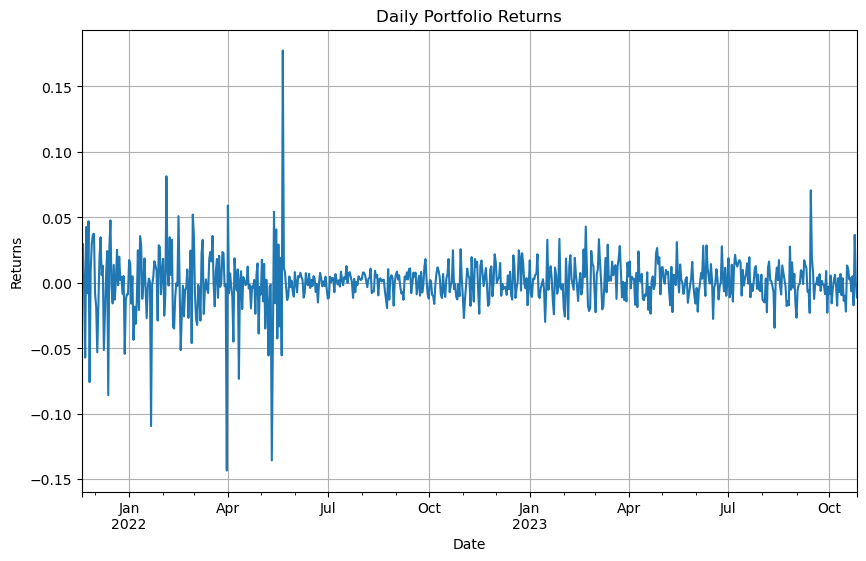

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


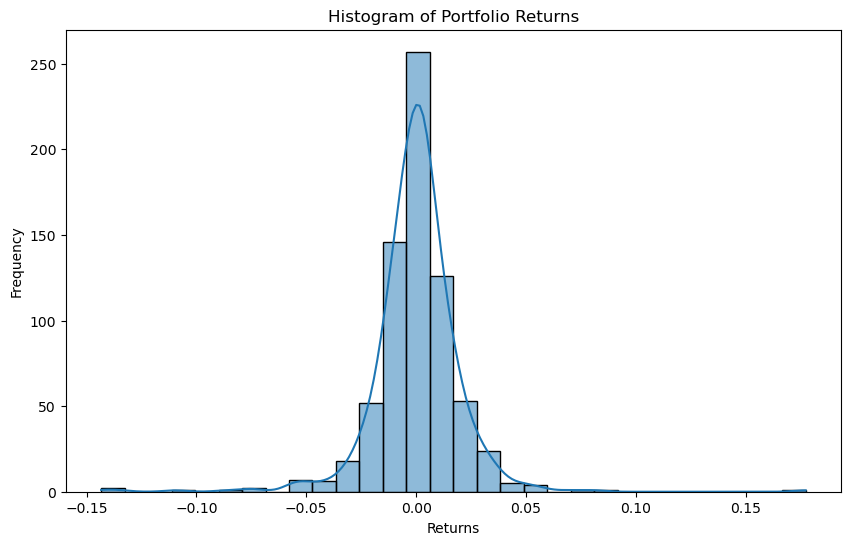

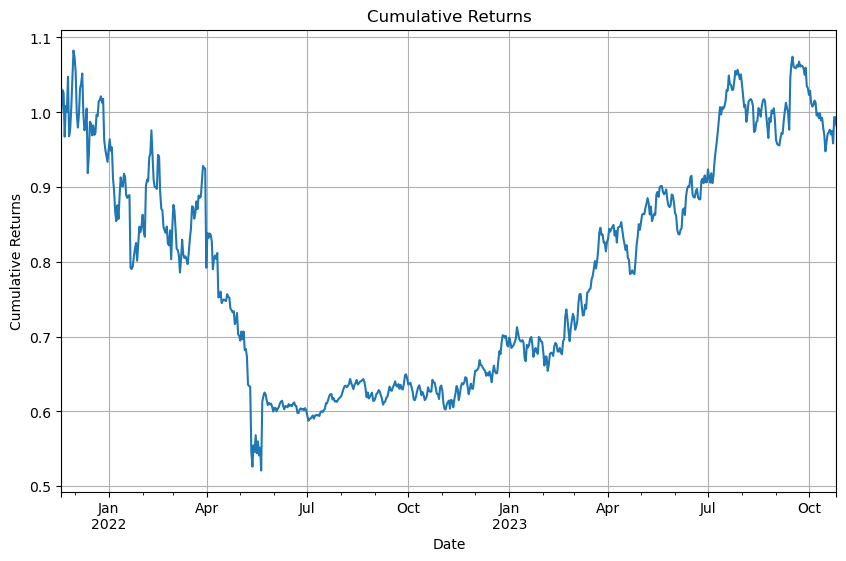

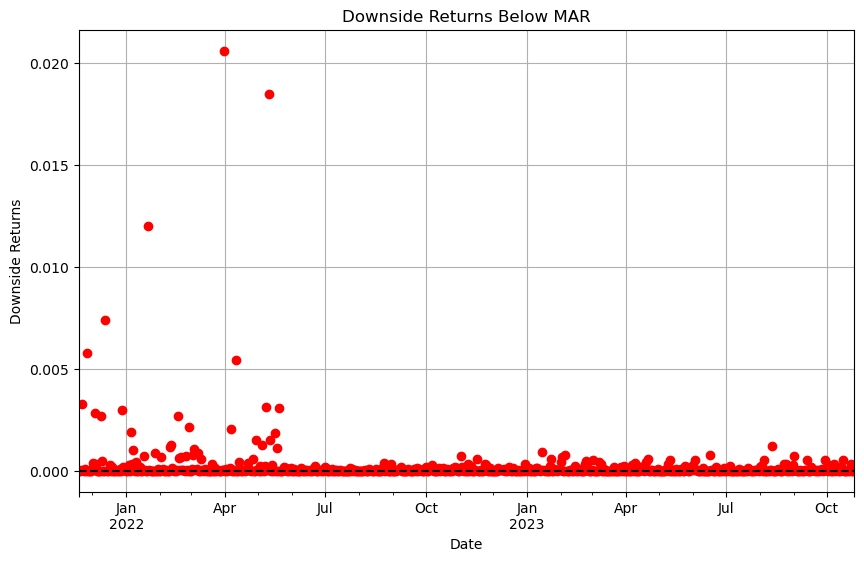

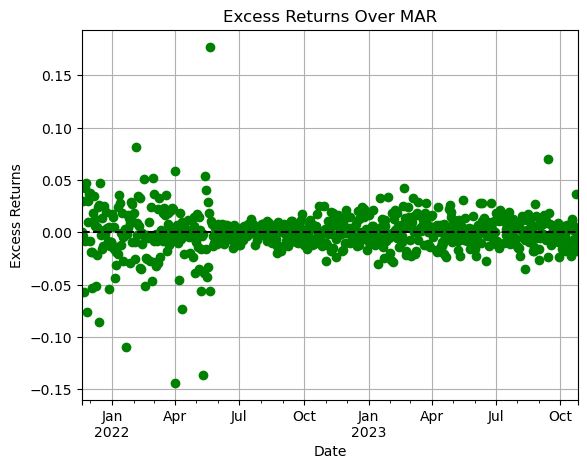

Sortino ratio: -0.2008119074268803
Scaled Sortino diff: 2.2400298847804422e-05
port change pct -0.07219864768490483
scaled port change -0.07219864768490483
reward -0.18463853555019538
Reward at the end of the cycle on 2023-10-26 00:00:00: -0.38547284327592346
Completed cycle up to 2023-10-26 00:00:00
Running simulation from 2023-10-27 00:00:00 to 2023-11-20 00:00:00
Cycle Number: 22, Epsilon: 0.10987789386316325
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.1892208231805702
Desired adjustment -1.892208231805702
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.23922082318057022, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.49999999999999956
weight difference 0.31885350526183065
Desired adjustment 3.1885350526183065
adjustment s

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


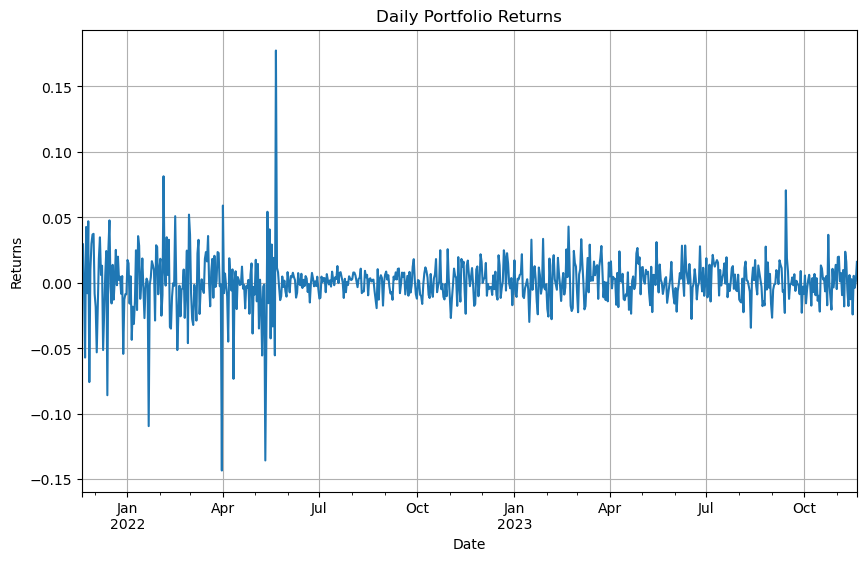

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


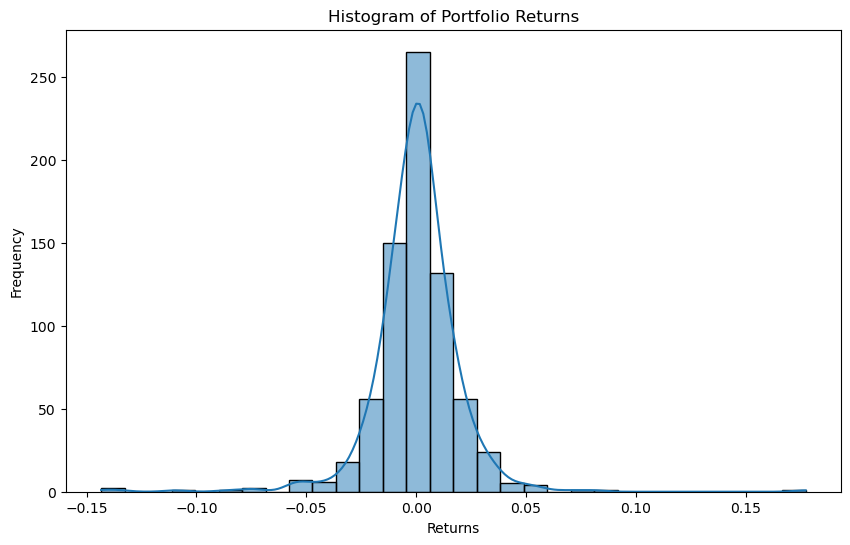

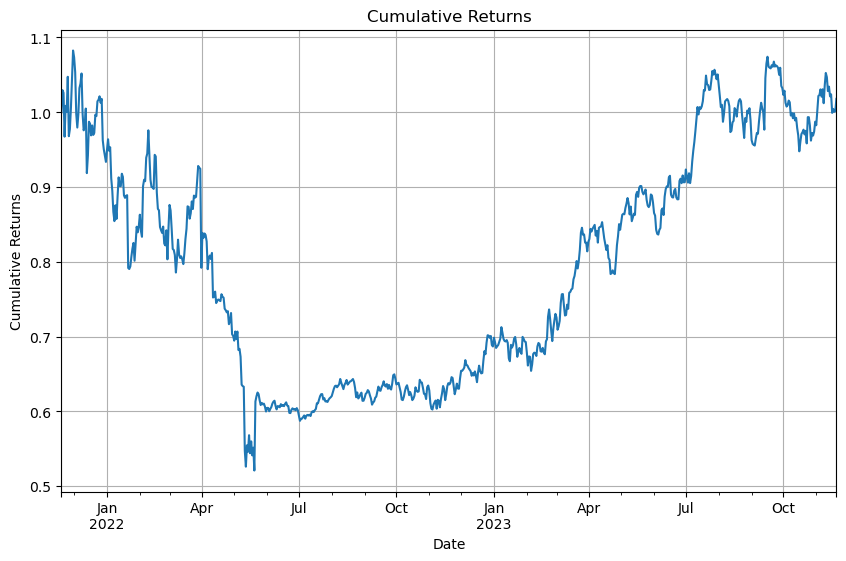

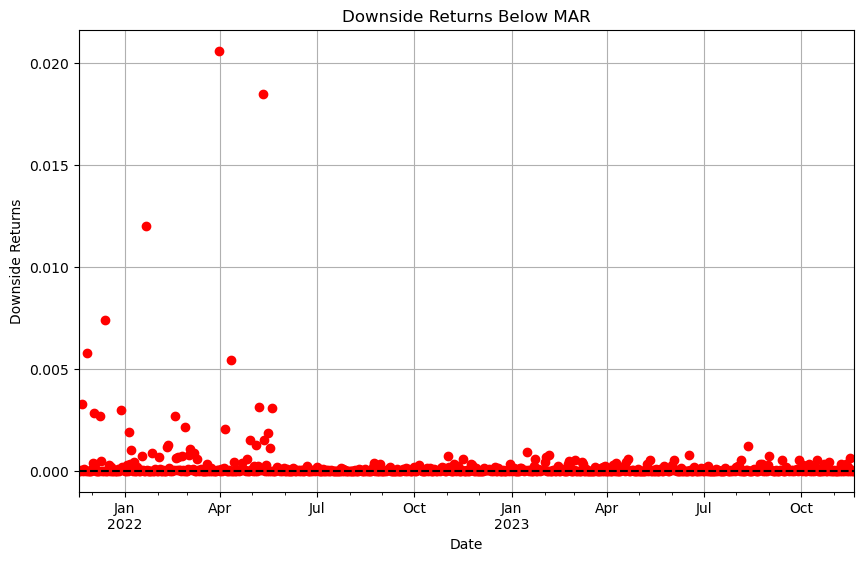

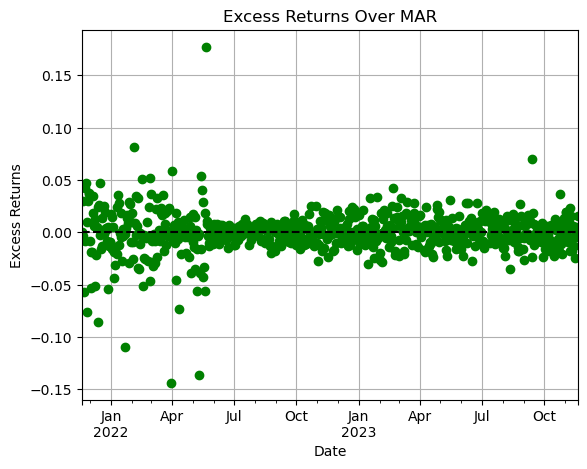

Sortino ratio: -0.14100091464558565
Scaled Sortino diff: 2.1531792616567372e-05
port change pct -0.009721898709974364
scaled port change -0.009721898709974364
reward -0.11792008723847976
Reward at the end of the cycle on 2023-11-20 00:00:00: -0.25894253367668196
Completed cycle up to 2023-11-20 00:00:00
Running simulation from 2023-11-21 00:00:00 to 2023-12-15 00:00:00
Cycle Number: 23, Epsilon: 0.09916479921150484
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05000000000000558
weight difference -0.17600266709276852
Desired adjustment -1.7600266709276853
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.22600266709277408, Target: 0.05000000000000558, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.4999999999999974
weight difference 0.3067657872385431
Desired adjustmen

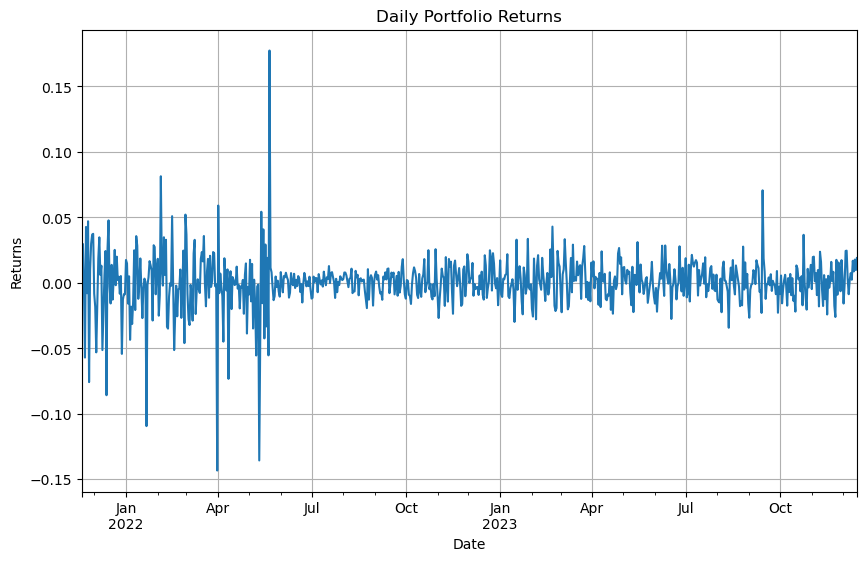

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


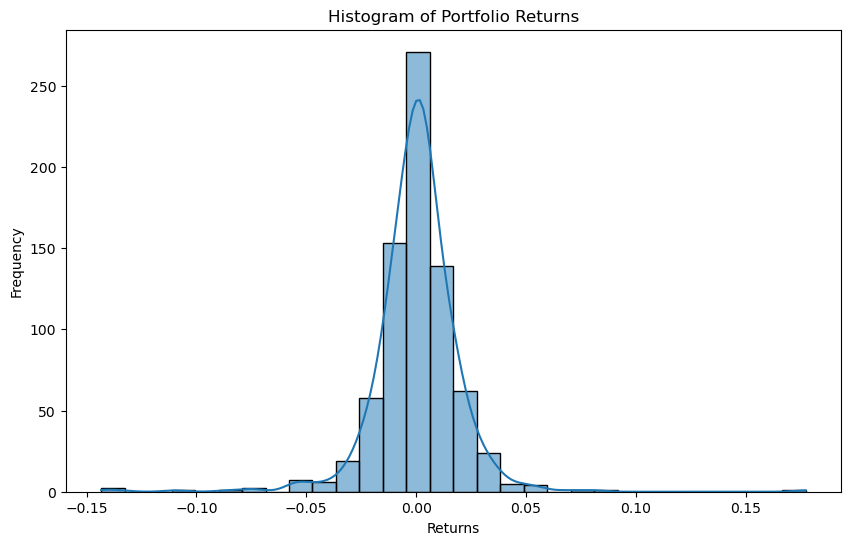

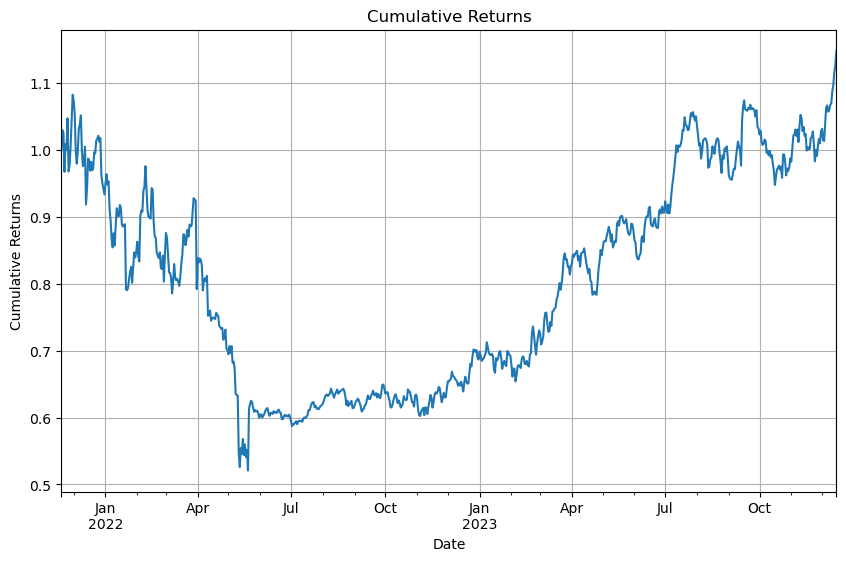

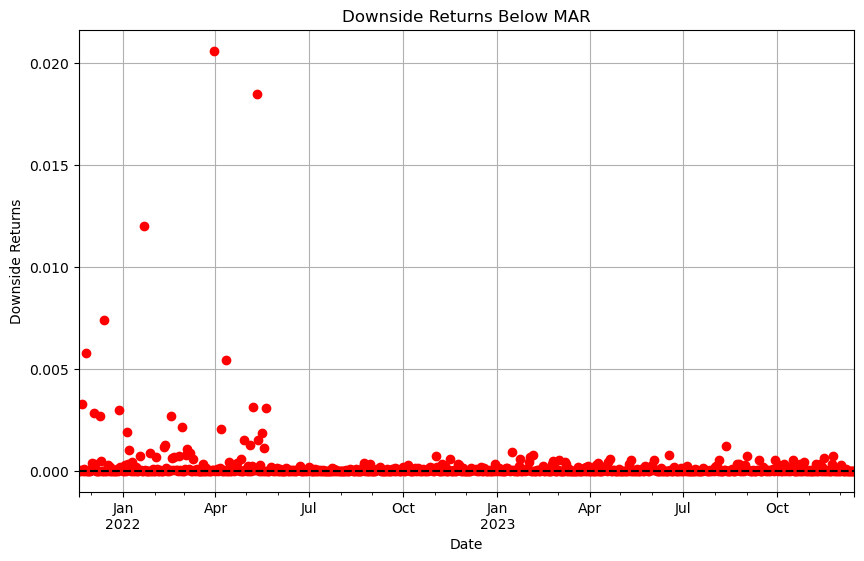

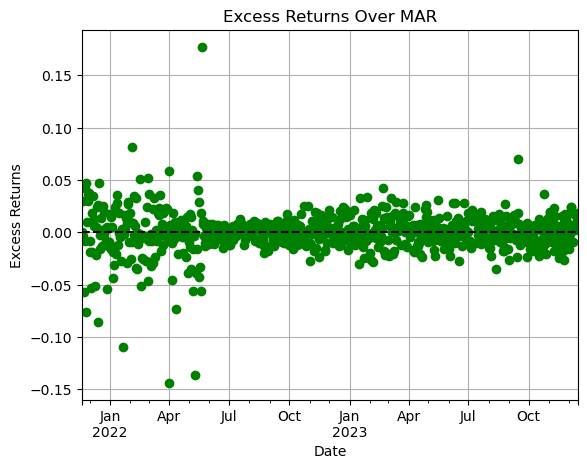

Sortino ratio: 0.06643687580754211
Scaled Sortino diff: 2.0105143944040855e-05
port change pct 0.0921347549749593
scaled port change 0.0921347549749593
reward -0.019968465361442422
Reward at the end of the cycle on 2023-12-15 00:00:00: 0.04644830530215564
Completed cycle up to 2023-12-15 00:00:00
Running simulation from 2023-12-16 00:00:00 to 2024-01-09 00:00:00
Cycle Number: 24, Epsilon: 0.08949623128838312
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.1778384503943236
Desired adjustment -1.778384503943236
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.2278384503943236, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.5
weight difference 0.31140911871912336
Desired adjustment 3.1140911871912333
adjustment scale 10
legal adjustm

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


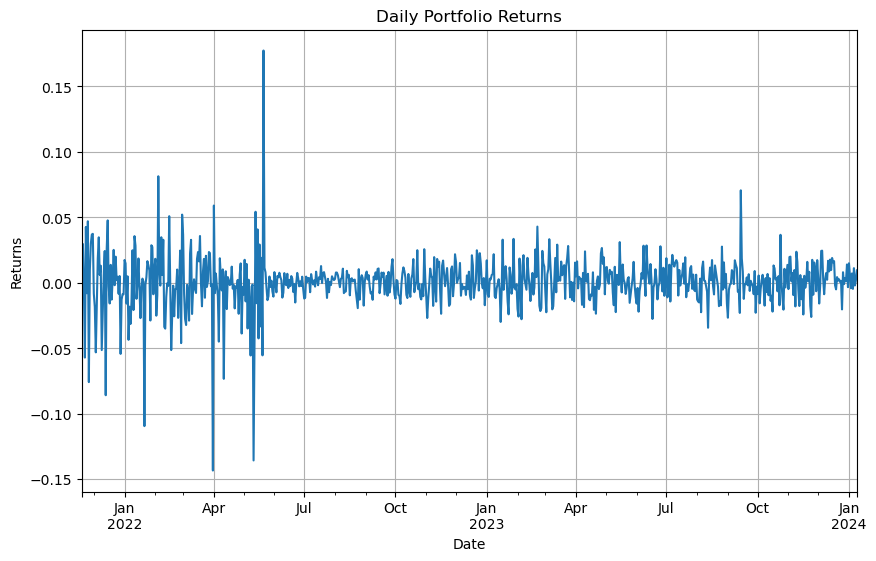

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


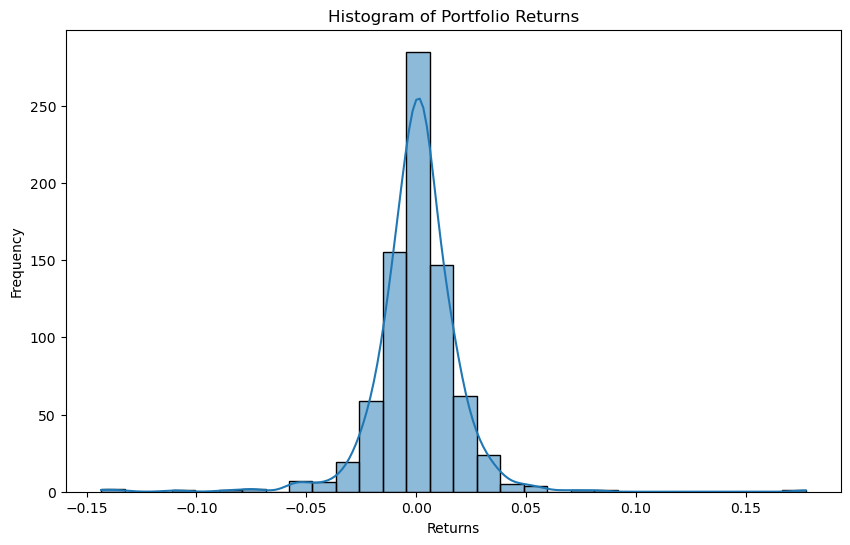

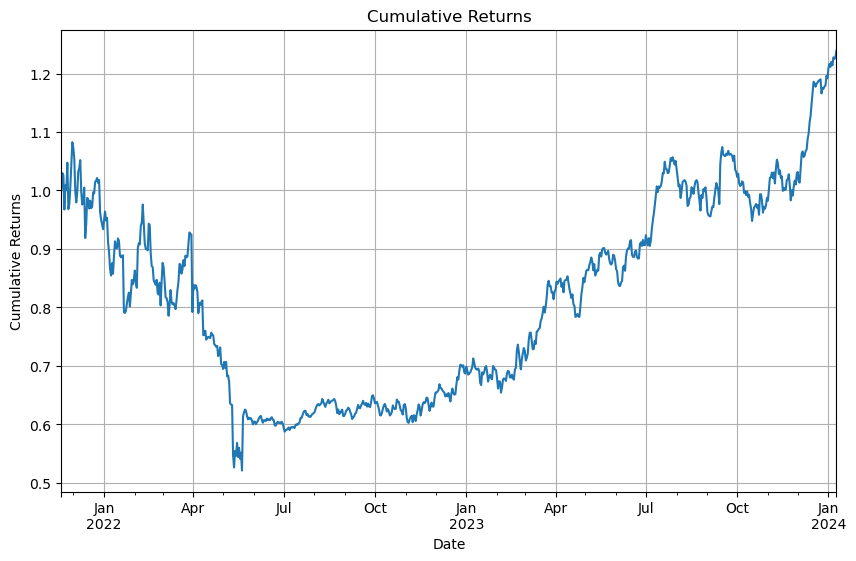

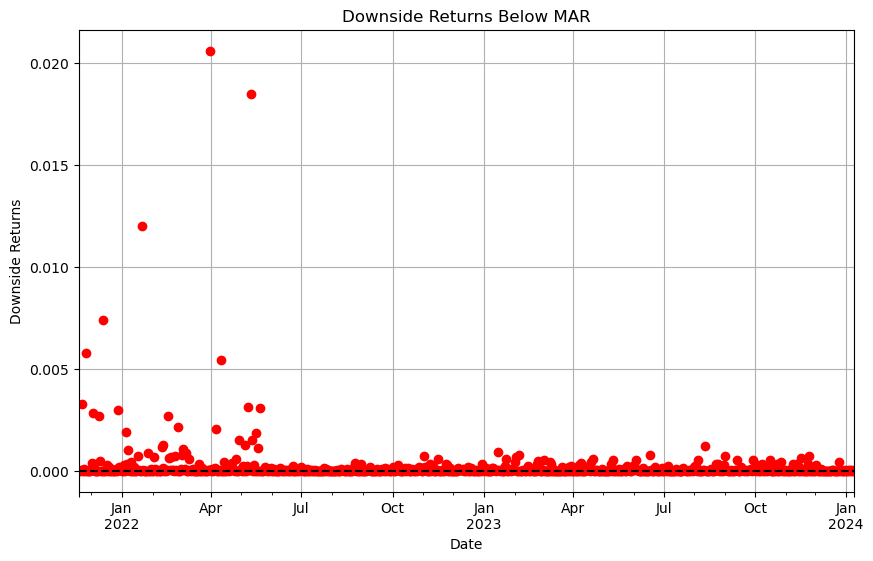

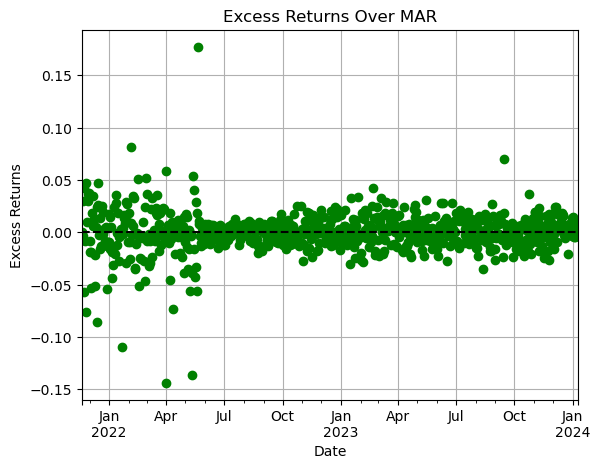

Sortino ratio: 0.19488941684393044
Scaled Sortino diff: 1.9385689168056642e-05
port change pct 0.05750758156741439
scaled port change 0.05750758156741439
reward -0.05435709636251978
Reward at the end of the cycle on 2024-01-09 00:00:00: 0.1405129347922426
Completed cycle up to 2024-01-09 00:00:00
Running simulation from 2024-01-10 00:00:00 to 2024-02-03 00:00:00
Cycle Number: 25, Epsilon: 0.08077034873776576
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05000000000000376
weight difference -0.18242069974242492
Desired adjustment -1.8242069974242492
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.23242069974242868, Target: 0.05000000000000376, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.4999999999999991
weight difference 0.30771212224784206
Desired adjustment 3.07

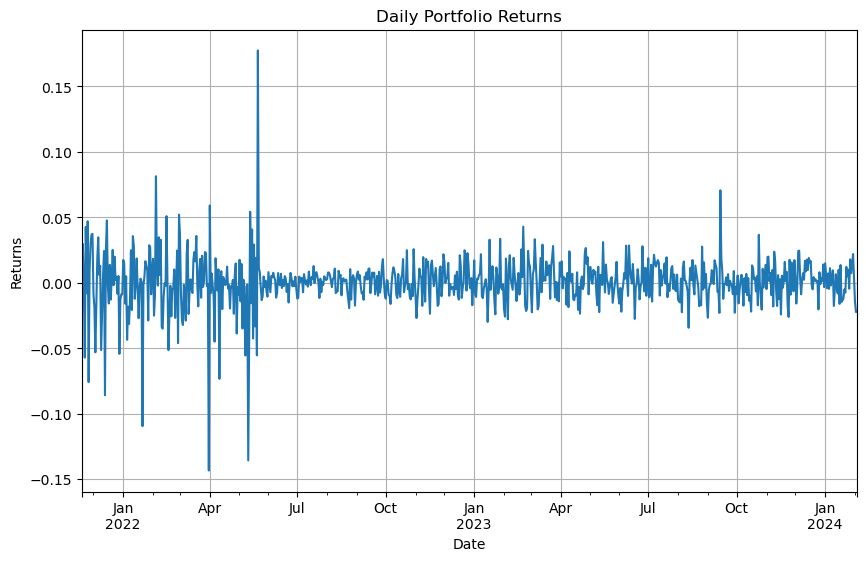

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


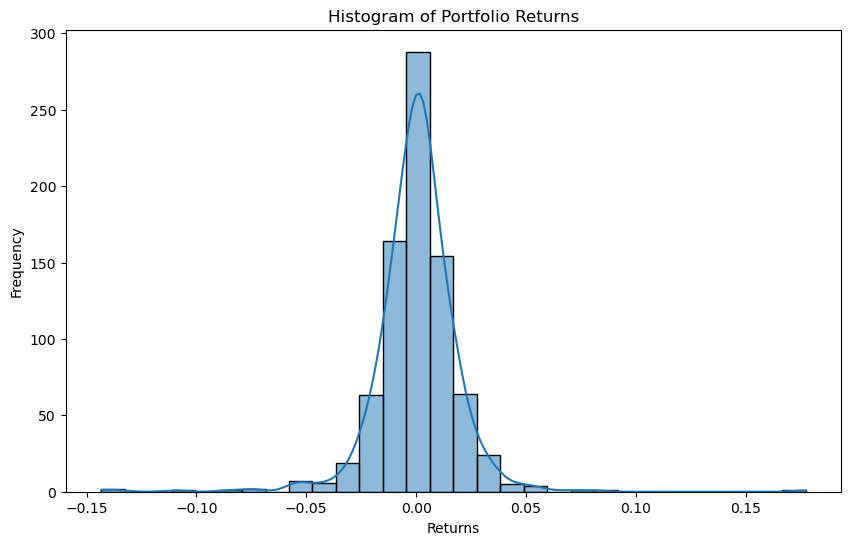

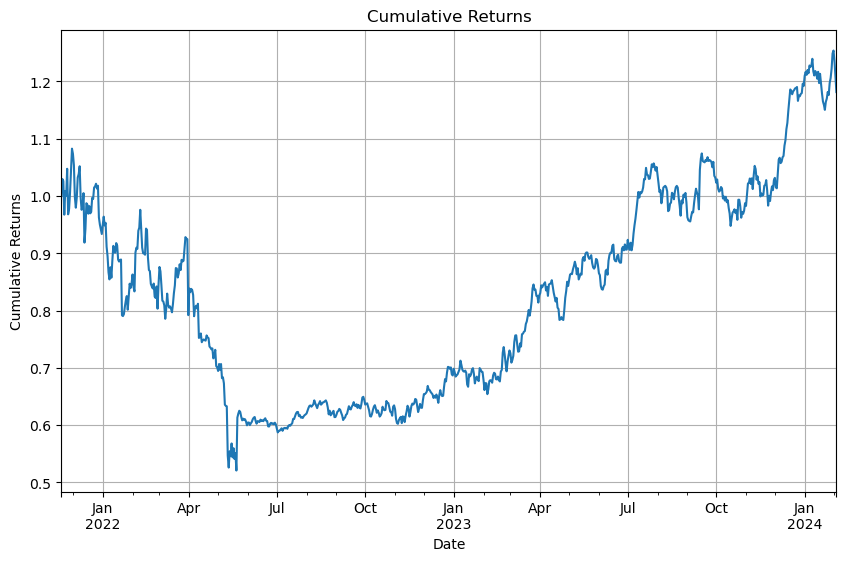

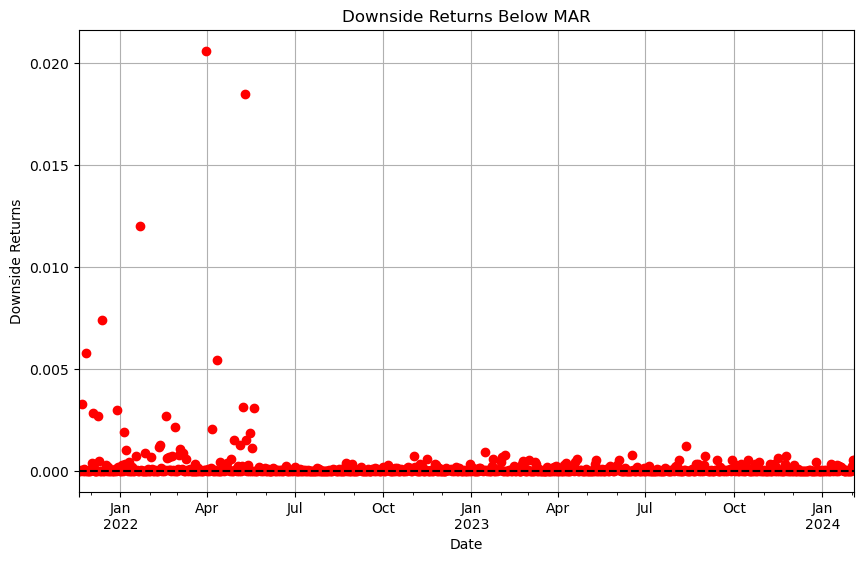

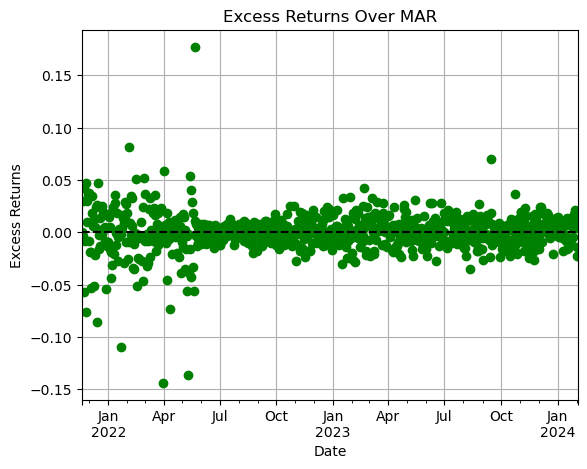

Sortino ratio: 0.10035226577876541
Scaled Sortino diff: 1.8690914415002006e-05
port change pct -0.07753466866879036
scaled port change -0.07753466866879036
reward -0.18461029140874827
Reward at the end of the cycle on 2024-02-03 00:00:00: -0.08427671654439786
Completed cycle up to 2024-02-03 00:00:00
Running simulation from 2024-02-04 00:00:00 to 2024-02-28 00:00:00
Cycle Number: 26, Epsilon: 0.07289523973583359
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.18034579454652705
Desired adjustment -1.8034579454652704
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.23034579454652707, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.5
weight difference 0.2902536683171681
Desired adjustment 2.902536683171681
adjustment scale 10
legal ad

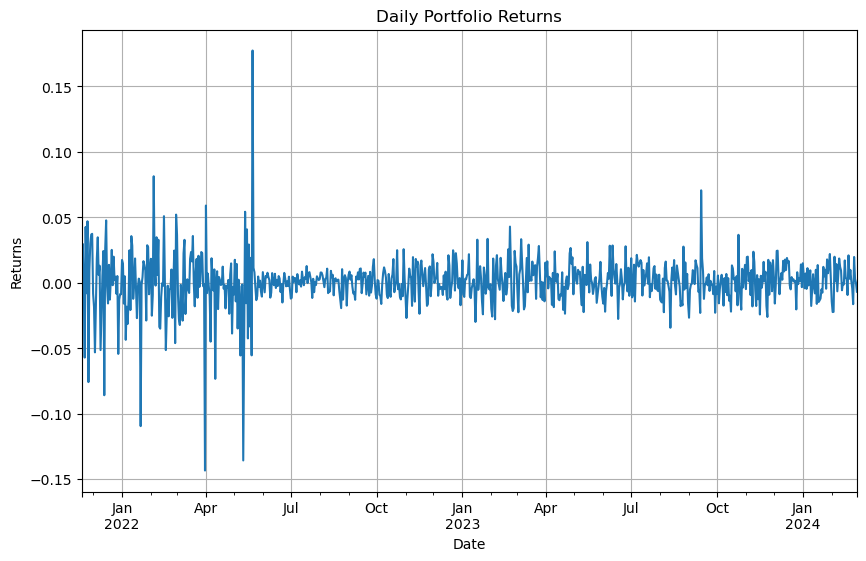

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


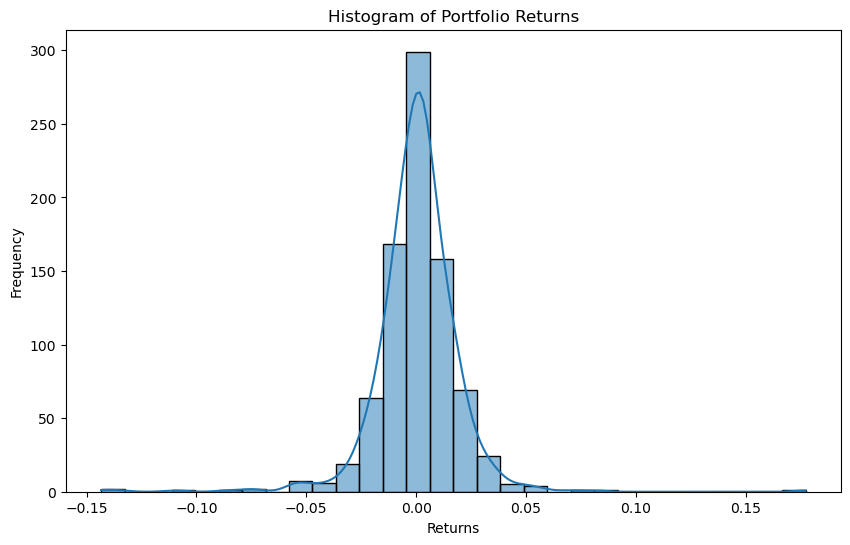

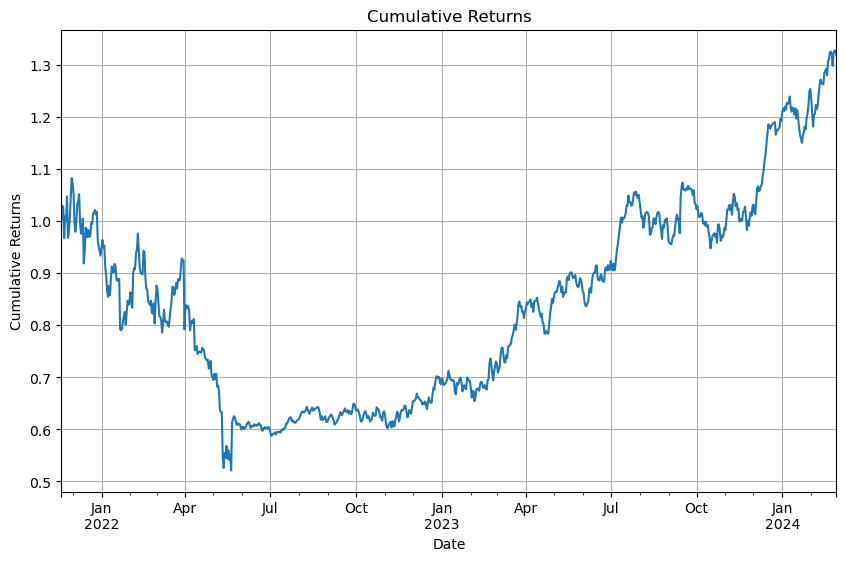

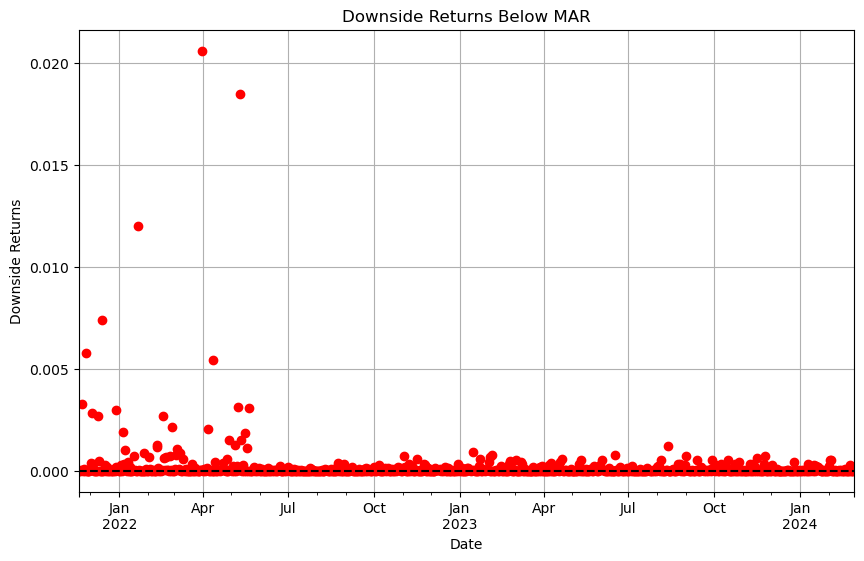

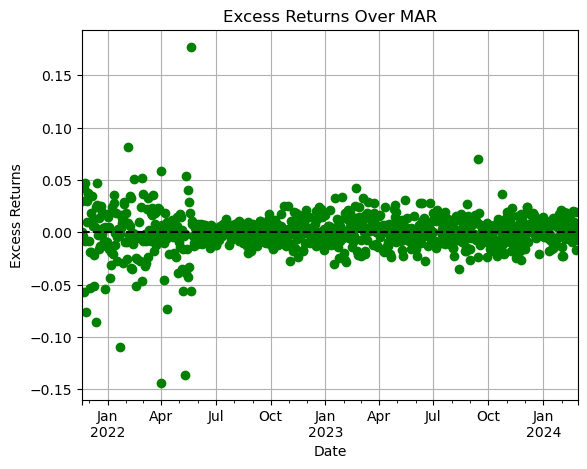

Sortino ratio: 0.28372740648949685
Scaled Sortino diff: 1.742780130692493e-05
port change pct 0.06356847471107525
scaled port change 0.06356847471107525
reward -0.044072192393193696
Reward at the end of the cycle on 2024-02-28 00:00:00: 0.2396377862949962
Completed cycle up to 2024-02-28 00:00:00
Running simulation from 2024-02-29 00:00:00 to 2024-03-20 00:00:00
Cycle Number: 27, Epsilon: 0.06578795386158981
Calculating dynamic strategy based on optimized weights...
vault ETH Vault_collateral_usd
vault ETH Vault_dai_ceiling
target weights in calc 0.05
weight difference -0.17945564396275576
Desired adjustment -1.7945564396275575
adjustment scale 10
legal adjustments [-0.5, 0.5]
closest adjustment -0.5
Vault: ETH Vault_collateral_usd, Current: 0.22945564396275575, Target: 0.05, Adjustment: -0.5
vault stETH Vault_collateral_usd
vault stETH Vault_dai_ceiling
target weights in calc 0.5
weight difference 0.29052842349676455
Desired adjustment 2.9052842349676453
adjustment scale 10
legal adju

C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scipy\optimize\_optimize.py:404: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "
C:\Users\brandyns pc\anacondareal\Lib\site-packages\scip

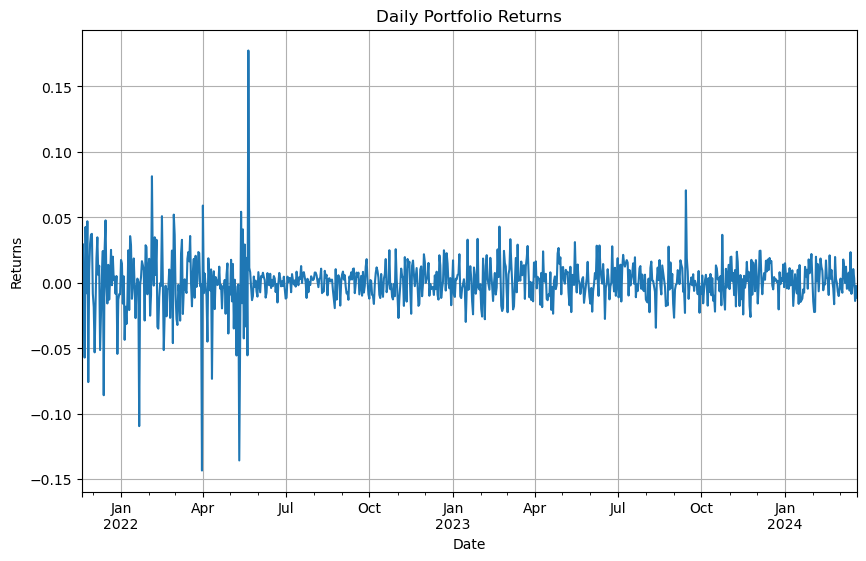

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


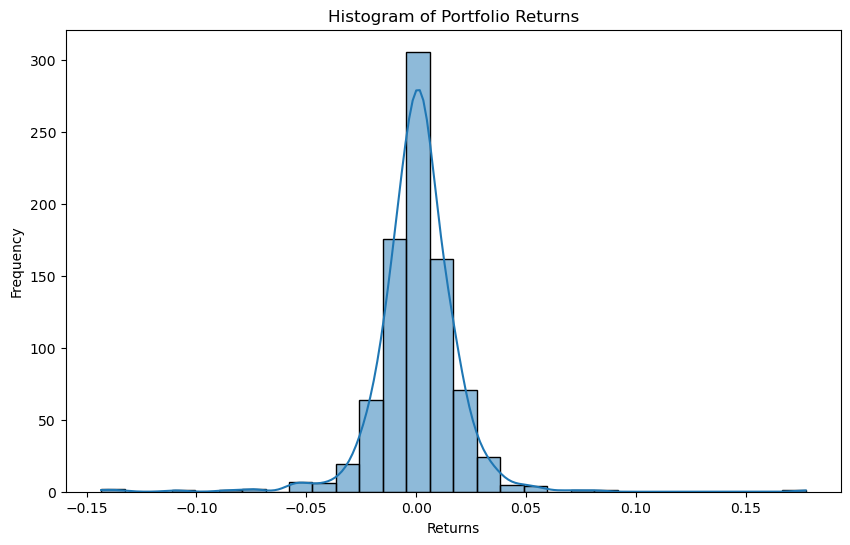

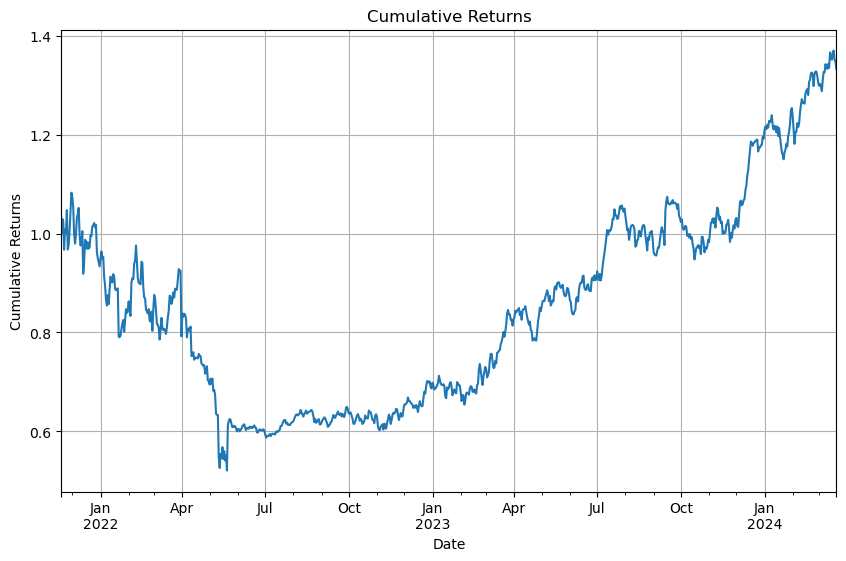

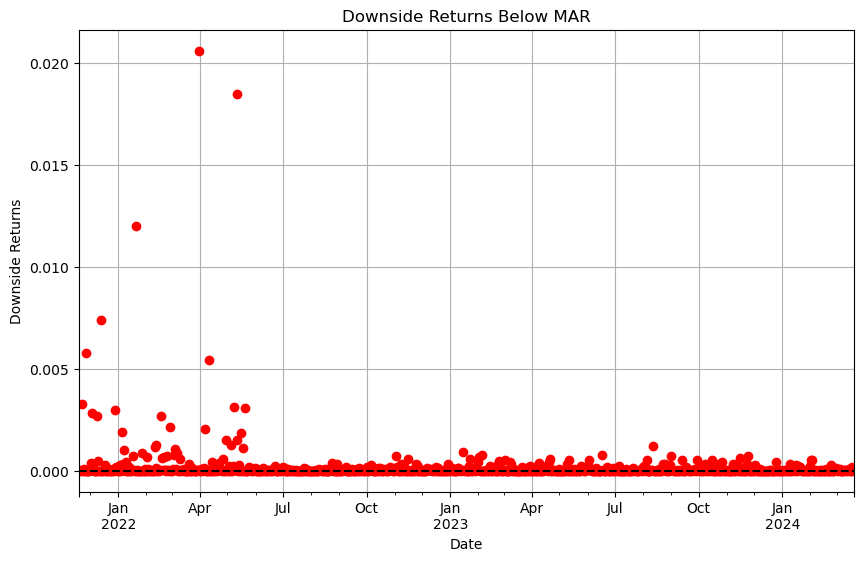

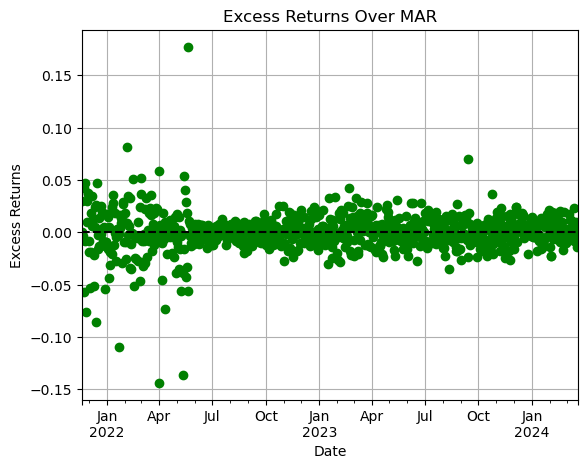

Sortino ratio: 0.293275283699528
Scaled Sortino diff: 1.7009060351986906e-05
port change pct -0.014831636695541366
scaled port change -0.014831636695541366
reward -0.11938916105969354
Reward at the end of the cycle on 2024-03-20 00:00:00: 0.17386911357948248
Reached or passed end date: stopping simulation at 2024-03-21 00:00:00


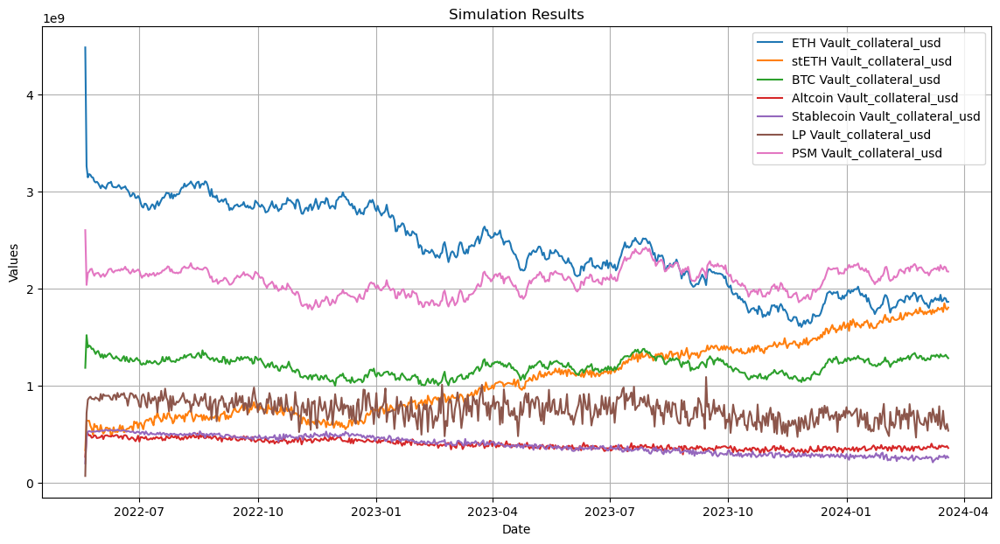

In [887]:
# Define action space as a list of dictionaries
vault_action_ranges = {
    'stETH Vault_dai_ceiling': [-0.5, 0.5],
    'ETH Vault_dai_ceiling': [-0.5, 0.5],
    'BTC Vault_dai_ceiling': [-0.5, 0.5], # can try -1 for BTC
    'Altcoin Vault_dai_ceiling': [-0.5, 0.5],
    'Stablecoin Vault_dai_ceiling': [-0.25, 1],
    'LP Vault_dai_ceiling': [-0.5, 0.5],
    'RWA Vault_dai_ceiling': [0, 0],  # If no changes are allowed
    'PSM Vault_dai_ceiling': [-0.5, 0.5]
}

action_space = generate_action_space(vault_action_ranges)

# Assuming `optimized_weight_dict` and `initial_weights` are defined elsewhere in your script
agent = RlAgent(action_space, optimized_weight_dict, vault_action_ranges, initial_strategy_period=1)
initial_action = agent.initial_strategy(initial_weights)

print("Initial Action Computed:", initial_action)


simulation_data = test_data_copy  
simulation_data.index = simulation_data.index.tz_localize(None)  # Remove timezone information
#05-20-2022
start_date = '2022-05-20'
end_date = '2024-03-20'
#end_date = '2022-07-20'


simulator = RL_VaultSimulator(simulation_data, test_data_copy, features, targets, temporals, start_date, end_date, scale_factor=300000000, minimum_value_factor=0.05, volatility_window=250)
simulator.train_model()
#simulator.set_parameters()

environment = SimulationEnvironment(simulator, start_date, end_date, agent)
environment.reset()

state, reward, done, info = environment.run()

simulator.plot_simulation_results()
action_df = environment.generate_action_dataframe()


### DAI Ceilings


<Axes: xlabel='timestamp'>

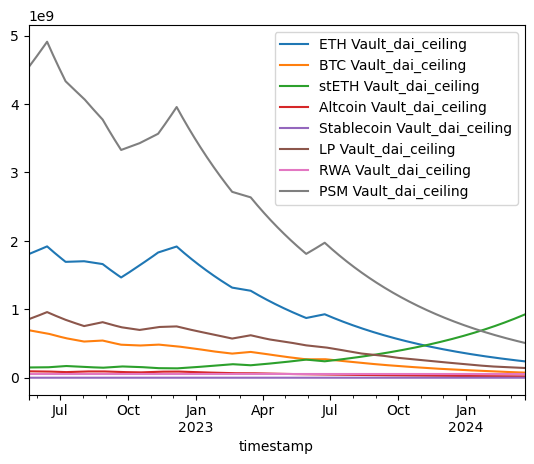

In [888]:
sim_dai_ceilings = simulator.dai_ceilings_history
sim_dai_ceilings.plot()

In [889]:
sim_dai_ceilings

,ETH Vault_dai_ceiling,BTC Vault_dai_ceiling,stETH Vault_dai_ceiling,Altcoin Vault_dai_ceiling,Stablecoin Vault_dai_ceiling,LP Vault_dai_ceiling,RWA Vault_dai_ceiling,PSM Vault_dai_ceiling
timestamp,,,,,,,,
2022-05-20,"1,805,368,930.88345","694,725,332.88445","149,815,023.30913","93,818,193.00588",0.00000,"854,537,847.30471","59,000,000.00000","4,536,963,808.04593"
2022-05-21,"1,809,801,427.45491","692,818,141.30358","149,879,136.79423","93,727,613.31224","10,076.97028","858,497,605.86540","59,000,000.00000","4,551,349,472.38039"
2022-05-22,"1,814,244,806.58091","690,916,185.43178","149,943,277.71677","93,637,121.07158","10,154.53300","862,475,713.16034","59,000,000.00000","4,565,780,750.33379"
2022-05-23,"1,818,699,094.98003","689,019,450.89575","150,007,446.08847","93,546,716.19946","10,232.69272","866,472,254.21390","59,000,000.00000","4,580,257,786.53640"
2022-05-24,"1,823,164,319.43644","687,127,923.36162","150,071,641.92109","93,456,398.61155","10,311.45405","870,487,314.44446","59,000,000.00000","4,594,780,726.07705"
...,...,...,...,...,...,...,...,...
2024-03-16,"244,459,604.06491","76,395,336.65878","904,753,945.64307","19,255,239.34735","214,354.60587","144,367,543.84024","59,000,000.00000","520,005,103.71208"
2024-03-17,"243,237,306.04459","76,013,359.97548","909,277,715.37129","19,196,001.75984","215,873.29983","143,829,699.22899","59,000,000.00000","517,405,078.19352"
2024-03-18,"242,021,119.51436","75,633,293.17561","913,824,103.94814","19,136,946.41322","217,402.75368","143,293,858.37023","59,000,000.00000","514,818,052.80255"


### Actions Log

In [890]:
start_date_dt = pd.to_datetime(start_date)  # Convert string to datetime
historical_cutoff = start_date_dt - pd.DateOffset(days=1)
historical_data = historical[historical.index <= historical_cutoff]


historical_data = historical_data.merge(test_data['RWA Vault_collateral_usd'], left_index=True, right_index=True, how='left')
historical_data

historical_optimized_weights, historical_portfolio_returns, historical_portfolio_composition, historical_total_portfolio_value = mvo(historical_data)
historical_portfolio_daily_returns,  historical_downside_returns, historical_excess_returns, historical_sortino_ratio = historical_sortino(historical_portfolio_returns,historical_portfolio_composition)

Individual Sortino Ratios: BTC Vault_collateral_usd          -1.61046
ETH Vault_collateral_usd          -3.02073
stETH Vault_collateral_usd         6.49820
Stablecoin Vault_collateral_usd   -1.21766
Altcoin Vault_collateral_usd      -1.94559
LP Vault_collateral_usd           -1.97911
RWA Vault_collateral_usd          -0.07620
PSM Vault_collateral_usd           0.43863
dtype: float64
Optimized weights: [0.1  0.05 0.5  0.1  0.01 0.01 0.02 0.21]
Daily downside deviation: 0.02550965199145749
Annualized downside deviation: 0.48736121698871765
Annualized excess return: -0.711474304628297
Portfolio Sortino Ratio: -1.4598500656747324


In [891]:
action_df.set_index('date', inplace=True)
action_df.columns

Index(['env reset start date', 'get state calculated portfolio value',
       'action', 'mvo calculated current portfolio value',
       'calculated optimized weights', 'current composition',
       'agent weights updated to', 'current sortino ratio',
       'target sortino ratio', 'current weights', 'target weights',
       'current cumulative return', 'Distance penalty', 'Scaled Sortino diff',
       'Reward', 'Reward no scale', 'dai ceilings'],
      dtype='object')

In [892]:
action_df['dai ceilings'].dropna().to_dict()

{Timestamp('2022-06-14 00:00:00'):             ETH Vault_dai_ceiling  stETH Vault_dai_ceiling  \
 2021-11-19    4,215,499,587.09872         16,779,001.87837   
 2021-11-20    4,185,875,620.48578         17,284,635.75812   
 2021-11-21    4,185,229,052.82756         19,140,998.34184   
 2021-11-22    4,167,338,922.83872         22,170,168.94489   
 2021-11-23    4,152,215,276.92244         23,065,851.72446   
 ...                           ...                      ...   
 2022-06-09    1,900,772,626.95039        151,167,184.00312   
 2022-06-10    1,905,439,356.28641        151,231,876.14671   
 2022-06-11    1,910,117,543.25939        151,296,595.97536   
 2022-06-12    1,914,807,215.99982        151,361,343.50094   
 2022-06-13    1,919,508,402.70728        151,426,118.73527   
 
             BTC Vault_dai_ceiling  Altcoin Vault_dai_ceiling  \
 2021-11-19    1,398,087,189.04925          170,858,309.36176   
 2021-11-20    1,393,749,077.71651          171,141,983.01782   
 2021-11-21  

In [893]:
action_df['target weights'].dropna().to_dict()

{Timestamp('2022-06-14 00:00:00'): {'BTC Vault_collateral_usd': 0.10000000000014961,
  'ETH Vault_collateral_usd': 0.05000000000021314,
  'stETH Vault_collateral_usd': 0.4999999999997775,
  'Stablecoin Vault_collateral_usd': 0.1,
  'Altcoin Vault_collateral_usd': 0.01,
  'LP Vault_collateral_usd': 0.03331529734618195,
  'RWA Vault_collateral_usd': 0.01999999999988497,
  'PSM Vault_collateral_usd': 0.18668470265380804},
 Timestamp('2022-07-09 00:00:00'): {'BTC Vault_collateral_usd': 0.10000000000014456,
  'ETH Vault_collateral_usd': 0.05000000000020385,
  'stETH Vault_collateral_usd': 0.4999999999997974,
  'Stablecoin Vault_collateral_usd': 0.1,
  'Altcoin Vault_collateral_usd': 0.01,
  'LP Vault_collateral_usd': 0.04527251569721257,
  'RWA Vault_collateral_usd': 0.019999999999850127,
  'PSM Vault_collateral_usd': 0.1747274843028166},
 Timestamp('2022-08-03 00:00:00'): {'BTC Vault_collateral_usd': 0.10000000000004698,
  'ETH Vault_collateral_usd': 0.05000000000006264,
  'stETH Vault_col

In [894]:
action_df['current composition'].dropna().to_dict()

{Timestamp('2022-06-14 00:00:00'): BTC Vault_collateral_usd          0.14479
 ETH Vault_collateral_usd          0.33787
 stETH Vault_collateral_usd        0.05884
 Stablecoin Vault_collateral_usd   0.05999
 Altcoin Vault_collateral_usd      0.05480
 LP Vault_collateral_usd           0.09514
 RWA Vault_collateral_usd          0.00565
 PSM Vault_collateral_usd          0.24292
 Name: 2022-06-13 00:00:00, dtype: float64,
 Timestamp('2022-07-09 00:00:00'): BTC Vault_collateral_usd          0.14182
 ETH Vault_collateral_usd          0.32185
 stETH Vault_collateral_usd        0.07319
 Stablecoin Vault_collateral_usd   0.05667
 Altcoin Vault_collateral_usd      0.05100
 LP Vault_collateral_usd           0.10630
 RWA Vault_collateral_usd          0.00582
 PSM Vault_collateral_usd          0.24334
 Name: 2022-07-08 00:00:00, dtype: float64,
 Timestamp('2022-08-03 00:00:00'): BTC Vault_collateral_usd          0.14283
 ETH Vault_collateral_usd          0.33424
 stETH Vault_collateral_usd        0

<Axes: xlabel='date'>

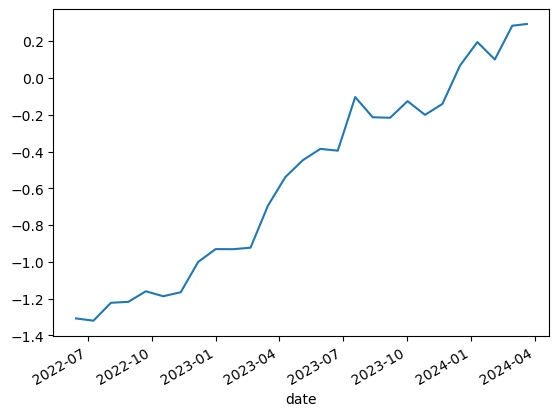

In [895]:
action_df['current sortino ratio'].dropna().plot()

<Axes: xlabel='date'>

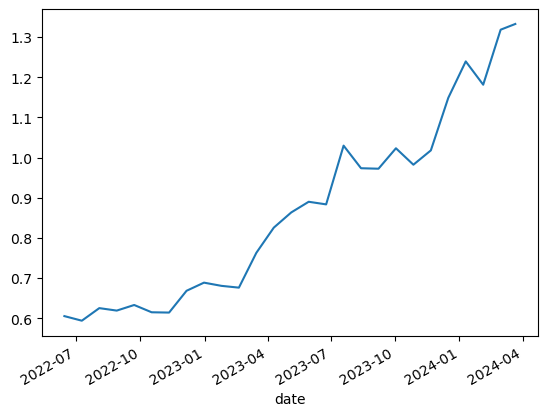

In [896]:
action_df['current cumulative return'].dropna().plot()

In [897]:
action_df['action'].dropna().to_dict()

{Timestamp('2022-05-20 00:00:00'): {'stETH Vault_dai_ceiling': 0.04279509737371634,
  'ETH Vault_dai_ceiling': 0.2455174948255402,
  'BTC Vault_dai_ceiling': -0.2745245481332259,
  'Altcoin Vault_dai_ceiling': -0.09654811155889165,
  'Stablecoin Vault_dai_ceiling': 0.7697027913279229,
  'LP Vault_dai_ceiling': 0.46338012683491336,
  'RWA Vault_dai_ceiling': 0.0,
  'PSM Vault_dai_ceiling': 0.31707690303679237},
 Timestamp('2022-06-14 00:00:00'): {'ETH Vault_dai_ceiling': -0.5,
  'stETH Vault_dai_ceiling': 0.5,
  'BTC Vault_dai_ceiling': -0.45611942404406636,
  'Altcoin Vault_dai_ceiling': -0.4510925682980622,
  'Stablecoin Vault_dai_ceiling': 0.39666613604493506,
  'LP Vault_dai_ceiling': -0.5,
  'PSM Vault_dai_ceiling': -0.5},
 Timestamp('2022-07-09 00:00:00'): {'stETH Vault_dai_ceiling': -0.3331591215968862,
  'ETH Vault_dai_ceiling': 0.02104347033862064,
  'BTC Vault_dai_ceiling': -0.35909278683505286,
  'Altcoin Vault_dai_ceiling': 0.4540145615488591,
  'Stablecoin Vault_dai_ceiling

In [898]:
action_df
actions_log_path = '../data/actions/actionslog.csv'
action_df.to_csv(actions_log_path)

In [899]:
simulations_path = '../data/portfolio/simulations'
simulator.results.to_csv('simulations_path')

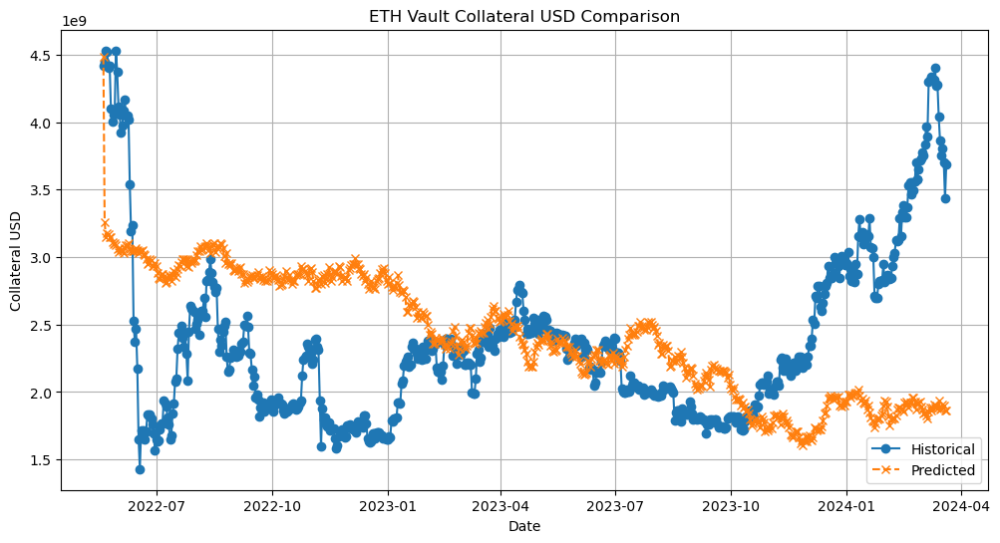

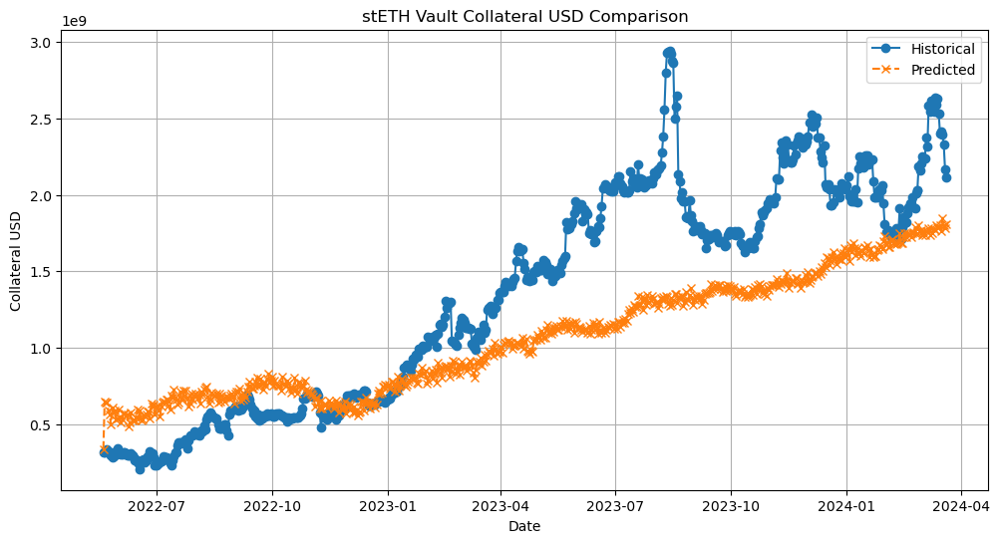

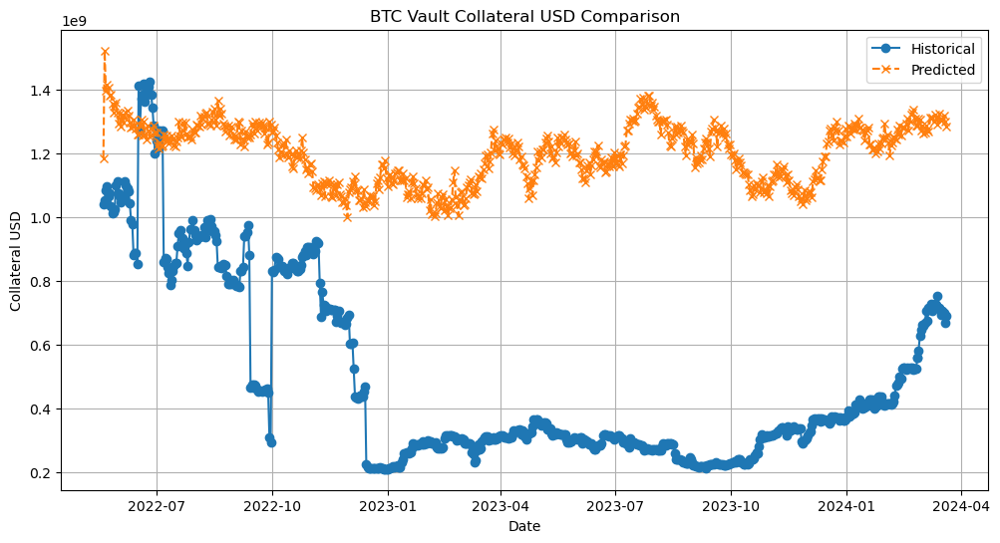

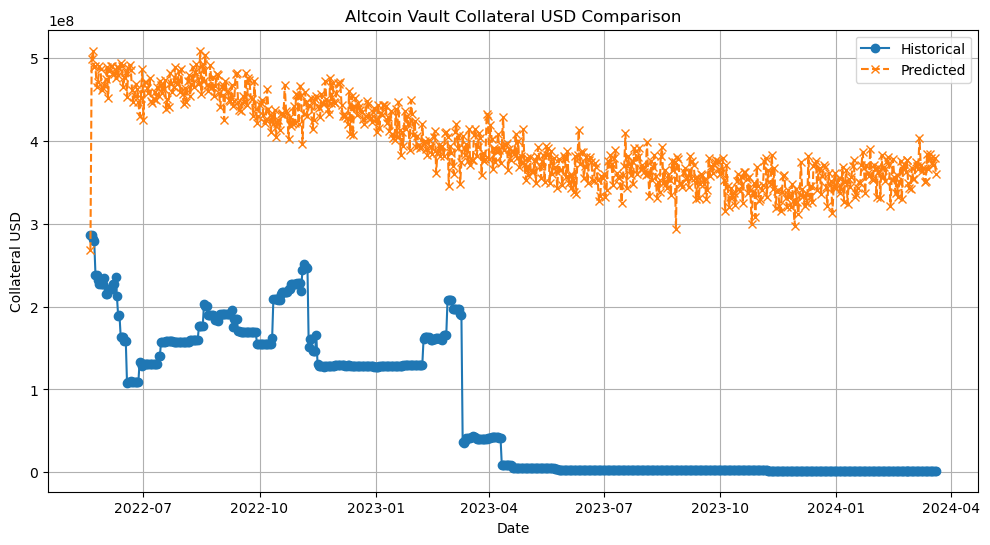

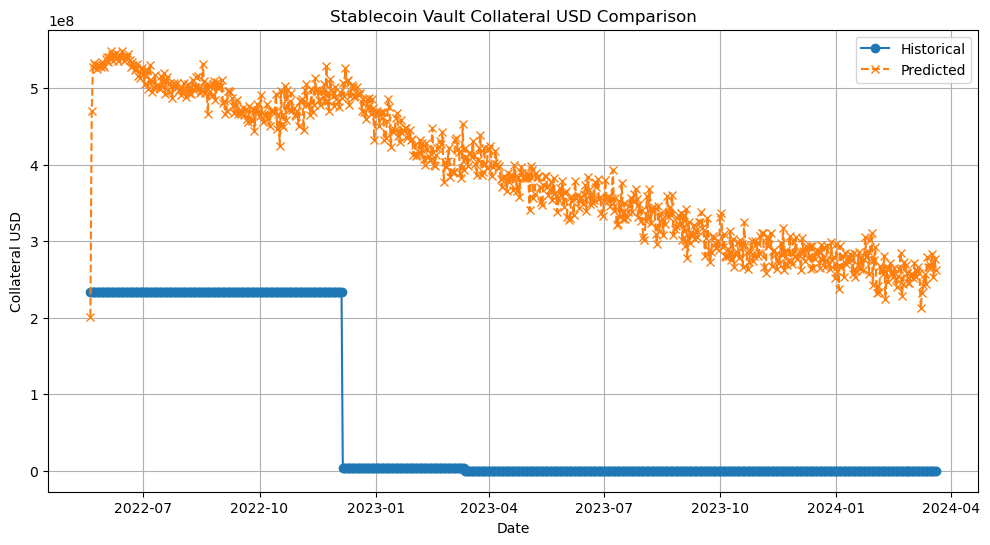

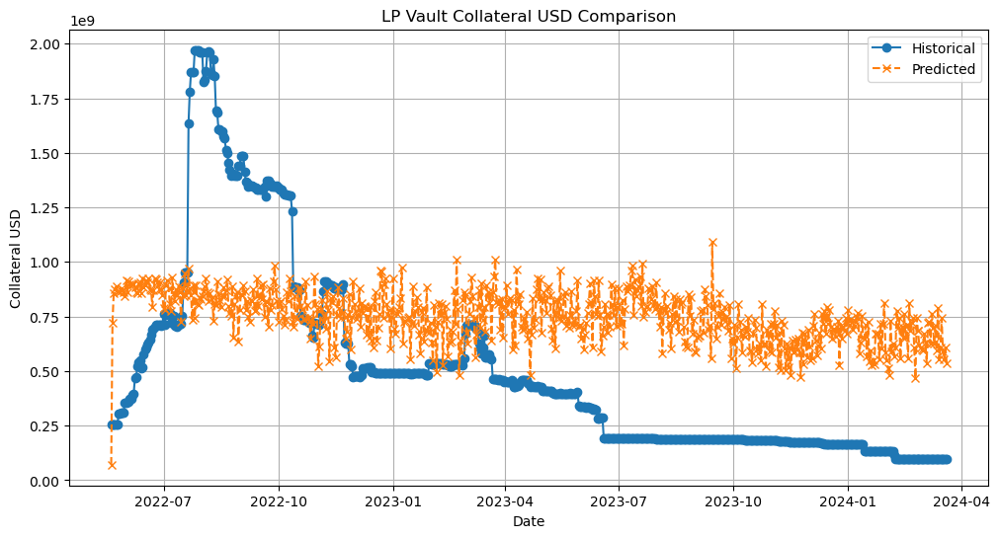

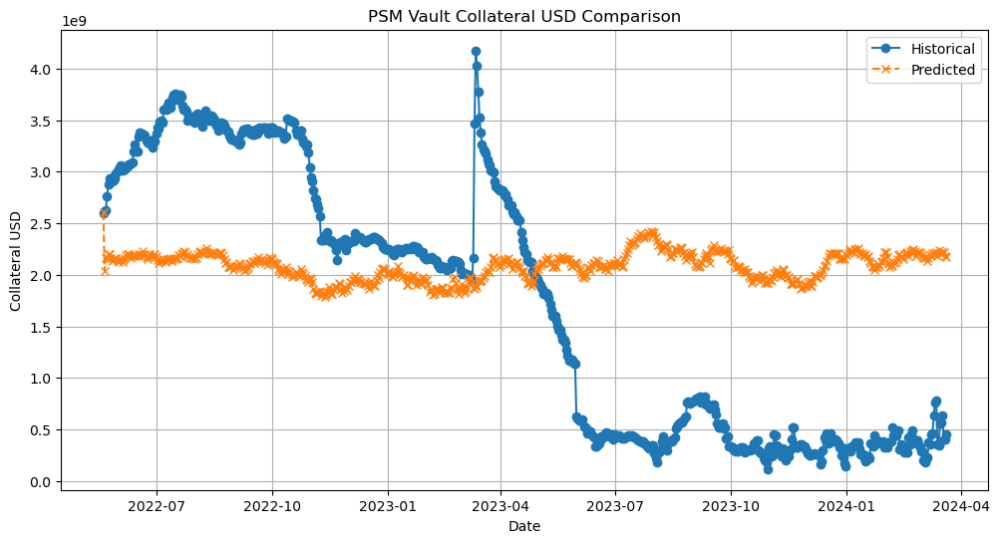

{'ETH Vault': {'MSE': 6.739183957484722e+17,
  'MAE': 645510971.4664187,
  'RMSE': 820925328.9724177,
  'R2': -0.7454025809997147},
 'stETH Vault': {'MSE': 2.4603901402115066e+17,
  'MAE': 395946829.69678044,
  'RMSE': 496023199.075558,
  'R2': 0.5278484224938301},
 'BTC Vault': {'MSE': 5.7310330536120954e+17,
  'MAE': 711079108.289717,
  'RMSE': 757035867.948943,
  'R2': -5.668749340994134},
 'Altcoin Vault': {'MSE': 1.0606648831212517e+17,
  'MAE': 321528828.41665703,
  'RMSE': 325678504.5288147,
  'R2': -14.40834936309276},
 'Stablecoin Vault': {'MSE': 1.0674107961797808e+17,
  'MAE': 319110617.0274174,
  'RMSE': 326712533.61017245,
  'R2': -8.414741012509367},
 'LP Vault': {'MSE': 2.3272133393287133e+17,
  'MAE': 428924623.03300375,
  'RMSE': 482411996.0499234,
  'R2': -0.16666087745773428},
 'PSM Vault': {'MSE': 1.829204158969146e+18,
  'MAE': 1213735287.6721523,
  'RMSE': 1352480742.5502021,
  'R2': -0.13243943970658822}}

In [900]:
rl_sim_results = simulator.results
evaluate_predictions(rl_sim_results, historical)

### Data Prep for MVO

In [901]:
start_date_dt = pd.to_datetime(start_date)  # Convert string to datetime
historical_cutoff = start_date_dt - pd.DateOffset(days=1)
historical_cutoff

Timestamp('2022-05-19 00:00:00')

In [902]:
historical_ceilings = test_data_copy[dai_ceilings]
ceiling_historical_cutoff = historical_cutoff.tz_localize(None)

historical_ceilings_for_sim =  historical_ceilings[historical_ceilings.index <= ceiling_historical_cutoff]
historical_ceilings_for_sim
combined_ceiling_data = pd.concat([historical_ceilings_for_sim, sim_dai_ceilings])
combined_ceiling_data

,ETH Vault_dai_ceiling,stETH Vault_dai_ceiling,BTC Vault_dai_ceiling,Altcoin Vault_dai_ceiling,Stablecoin Vault_dai_ceiling,LP Vault_dai_ceiling,RWA Vault_dai_ceiling,PSM Vault_dai_ceiling
2021-11-19,"4,215,499,587.09872","16,779,001.87837","1,398,087,189.04925","170,858,309.36176","5,000,000.00000","352,901,603.86001","59,000,000.00000","3,593,103,707.31785"
2021-11-20,"4,185,875,620.48578","17,284,635.75812","1,393,749,077.71651","171,141,983.01782","5,000,000.00000","372,841,835.68929","59,000,000.00000","3,604,384,386.93336"
2021-11-21,"4,185,229,052.82756","19,140,998.34184","1,407,300,021.86314","171,131,567.49223","5,000,000.00000","378,293,238.31257","59,000,000.00000","3,604,384,386.93336"
2021-11-22,"4,167,338,922.83872","22,170,168.94489","1,437,967,464.63631","159,239,990.91266","5,000,000.00000","378,299,770.81950","59,000,000.00000","3,674,297,040.97279"
2021-11-23,"4,152,215,276.92244","23,065,851.72446","1,435,093,757.47548","158,801,066.38277","5,000,000.00000","378,879,291.14350","59,000,000.00000","3,670,722,718.34453"
...,...,...,...,...,...,...,...,...
2024-03-16,"244,459,604.06491","904,753,945.64307","76,395,336.65878","19,255,239.34735","214,354.60587","144,367,543.84024","59,000,000.00000","520,005,103.71208"
2024-03-17,"243,237,306.04459","909,277,715.37129","76,013,359.97548","19,196,001.75984","215,873.29983","143,829,699.22899","59,000,000.00000","517,405,078.19352"
2024-03-18,"242,021,119.51436","913,824,103.94814","75,633,293.17561","19,136,946.41322","217,402.75368","143,293,858.37023","59,000,000.00000","514,818,052.80255"
2024-03-19,"240,811,013.91679","918,393,224.46788","75,255,126.70973","19,078,072.74682","218,943.04365","142,760,013.79893","59,000,000.00000","512,243,962.53854"


In [903]:
test_data.columns

Index(['ETH Vault_collateral_usd', 'stETH Vault_collateral_usd',
       'BTC Vault_collateral_usd', 'Altcoin Vault_collateral_usd',
       'Stablecoin Vault_collateral_usd', 'LP Vault_collateral_usd',
       'PSM Vault_collateral_usd', 'ETH Vault_dai_ceiling',
       'stETH Vault_dai_ceiling', 'BTC Vault_dai_ceiling',
       'Altcoin Vault_dai_ceiling', 'Stablecoin Vault_dai_ceiling',
       'LP Vault_dai_ceiling', 'PSM Vault_dai_ceiling',
       'BTC Vault_market_price', 'ETH Vault_market_price',
       'stETH Vault_market_price', 'Stablecoin Vault_market_price',
       'Altcoin Vault_market_price', 'LP Vault_market_price',
       'effective_funds_rate', 'M1V', 'WM2NS', 'fed_reverse_repo',
       'mcap_total_volume', 'defi_apy_medianAPY', 'defi_apy_avg7day',
       'dpi_market_Volume', 'ETH Vault_liquidation_ratio',
       'BTC Vault_liquidation_ratio', 'stETH Vault_liquidation_ratio',
       'Altcoin Vault_liquidation_ratio', 'Stablecoin Vault_liquidation_ratio',
       'LP Vault_liq

<Axes: >

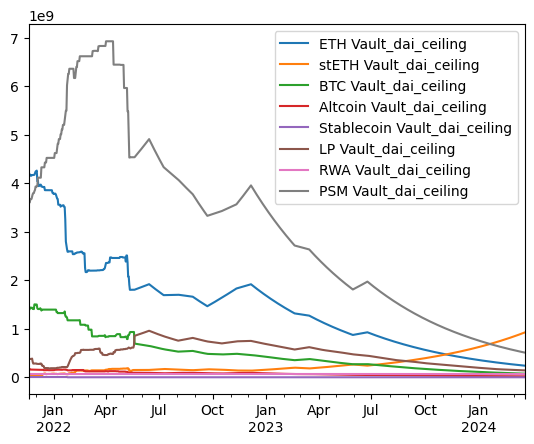

In [904]:
combined_ceiling_data.plot()

<Axes: xlabel='day'>

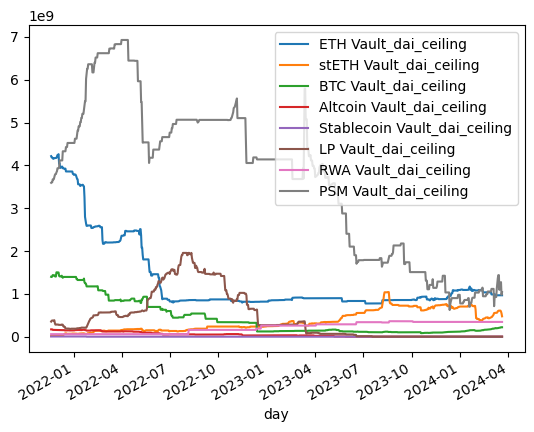

In [905]:
historical_ceilings.plot()

In [906]:
historical_data = historical[historical.index <= historical_cutoff]
rl_combined_data = pd.concat([historical_data, rl_sim_results])
#mvo_combined_data = pd.concat([historical_data, mvo_sim_results])
#print(mvo_combined_data)
print(rl_combined_data)

            ETH Vault_collateral_usd  stETH Vault_collateral_usd  \
2021-11-19      11,530,810,569.93515            39,769,944.75450   
2021-11-20      11,943,278,353.68762            41,280,230.12684   
2021-11-21      11,839,472,041.02766            48,477,796.29037   
2021-11-22      10,933,452,742.14960            59,724,075.18165   
2021-11-23      11,600,116,135.99997            74,570,808.78308   
...                              ...                         ...   
2024-03-16       1,879,378,943.34483         1,760,111,149.39078   
2024-03-17       1,905,711,071.19469         1,849,435,380.42872   
2024-03-18       1,899,475,494.36092         1,800,343,233.61375   
2024-03-19       1,862,875,992.39622         1,785,028,659.09513   
2024-03-20       1,864,930,632.99398         1,805,623,210.24561   

            BTC Vault_collateral_usd  Altcoin Vault_collateral_usd  \
2021-11-19       2,866,222,769.09959             520,045,444.90519   
2021-11-20       2,948,959,833.37399       

<Axes: >

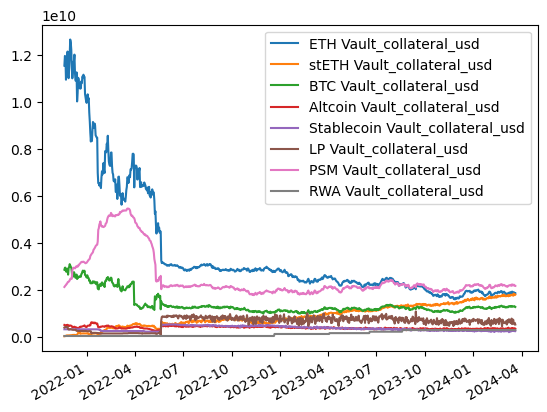

In [907]:
rl_combined_data.index = rl_combined_data.index.tz_localize(None)
#mvo_combined_data.index = mvo_combined_data.index.tz_localize(None)

test_data['RWA Vault_collateral_usd'].index = test_data['RWA Vault_collateral_usd'].index.tz_localize(None)


#Since RWA is not a target, we need to add back in for MVO calculations
rl_sim_w_RWA = rl_combined_data.merge(test_data['RWA Vault_collateral_usd'], left_index=True, right_index=True, how='left')
#mvo_sim_w_RWA = mvo_combined_data.merge(test_data['RWA Vault_collateral_usd'], left_index=True, right_index=True, how='left')

# Optional: Sort the DataFrame by index if it's not already sorted
rl_sim_w_RWA.sort_index(inplace=True)
#mvo_sim_w_RWA.sort_index(inplace=True)


# Now 'combined_data' contains both historical and simulation data in one DataFrame
#mvo_sim_w_RWA.plot()
rl_sim_w_RWA.plot()

In [908]:
rl_sim_w_RWA.iloc[-1].sum()

8593813768.907654

In [909]:
sim_cutoff = rl_sim_w_RWA.index.max()
sim_cutoff

Timestamp('2024-03-20 00:00:00')

,ETH Vault_collateral_usd,stETH Vault_collateral_usd,BTC Vault_collateral_usd,Altcoin Vault_collateral_usd,Stablecoin Vault_collateral_usd,LP Vault_collateral_usd,PSM Vault_collateral_usd,RWA Vault_collateral_usd
day,,,,,,,,
2021-11-19,"11,530,810,569.93515","39,769,944.75450","2,866,222,769.09959","520,045,444.90519","336,521,697.42675","412,562,137.86644","2,132,251,251.20941","50,870,409.00000"
2021-11-20,"11,943,278,353.68762","41,280,230.12684","2,948,959,833.37399","508,972,390.70129","336,521,697.42675","430,562,322.97248","2,164,546,578.27289","50,870,409.00000"
2021-11-21,"11,839,472,041.02766","48,477,796.29037","2,951,818,107.21472","505,016,705.04971","336,521,697.42675","431,500,082.06578","2,195,743,029.10143","50,870,409.00000"
2021-11-22,"10,933,452,742.14960","59,724,075.18165","2,788,017,226.13774","509,504,043.07337","336,503,182.74675","433,806,450.38492","2,215,601,174.20796","50,870,409.00000"
2021-11-23,"11,600,116,135.99997","74,570,808.78308","2,821,788,807.21326","500,427,709.74620","336,503,182.74675","432,619,037.81609","2,258,244,677.18063","50,870,409.00000"
...,...,...,...,...,...,...,...,...
2024-03-16,"3,752,247,535.61763","2,417,541,115.80447","693,532,316.12871","1,944,419.59103","99,227.46740","97,377,612.28187","567,092,988.70479","303,771,975.92692"
2024-03-17,"3,803,584,313.35047","2,393,113,805.45610","706,205,158.85654","1,944,419.59103","99,227.46740","97,379,575.13498","631,684,264.91900","303,771,975.92692"
2024-03-18,"3,703,955,421.92055","2,328,357,914.39336","700,133,609.78409","1,944,419.59103","99,227.46740","97,380,556.52498","399,224,583.39463","303,771,975.92692"


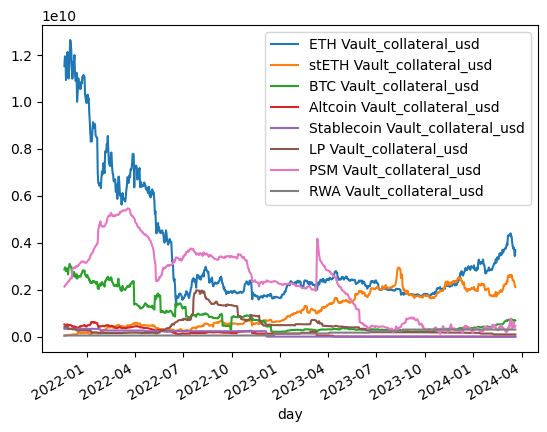

In [910]:
# Assuming 'test_data' is the DataFrame with the timezone-aware index
test_data.index = pd.to_datetime(test_data.index).tz_localize(None)

# Now perform the merge
historical_sim = test_data[test_data.index <= sim_cutoff]
historical_sim = historical_sim[targets].merge(test_data['RWA Vault_collateral_usd'], left_index=True, right_index=True, how='left')
historical_sim.plot()
historical_sim

### Historical Stats

In [911]:
historical_optimized_weights, historical_portfolio_returns, historical_portfolio_composition, historical_total_portfolio_value = mvo(historical_sim)
print('average daily return per vault:', historical_portfolio_returns.mean())
print('current composition:', historical_portfolio_composition.iloc[-1])
print(f'current portfolio value: ${historical_total_portfolio_value.iloc[-1]:,.2f}')

Individual Sortino Ratios: BTC Vault_collateral_usd          -0.44815
ETH Vault_collateral_usd          -0.36545
stETH Vault_collateral_usd         1.12372
Stablecoin Vault_collateral_usd   -2.40068
Altcoin Vault_collateral_usd      -1.66096
LP Vault_collateral_usd           -0.45638
RWA Vault_collateral_usd           0.48709
PSM Vault_collateral_usd          -0.48595
dtype: float64
Optimized weights: [0.1        0.19134517 0.5        0.1        0.01       0.06865483
 0.02       0.01      ]
average daily return per vault: BTC Vault_collateral_usd          -0.00166
ETH Vault_collateral_usd          -0.00133
stETH Vault_collateral_usd         0.00464
Stablecoin Vault_collateral_usd   -0.00950
Altcoin Vault_collateral_usd      -0.00653
LP Vault_collateral_usd           -0.00170
RWA Vault_collateral_usd           0.00209
PSM Vault_collateral_usd          -0.00182
dtype: float64
current composition: BTC Vault_collateral_usd          0.09394
ETH Vault_collateral_usd          0.50203
stETH Va

In [912]:
historical_portfolio_daily_returns,  historical_downside_returns, historical_excess_returns, historical_sortino_ratio = historical_sortino(historical_portfolio_returns,historical_portfolio_composition)

Daily downside deviation: 0.018521889407538017
Annualized downside deviation: 0.35386020027286225
Annualized excess return: -0.20447169577712399
Portfolio Sortino Ratio: -0.577831854555713


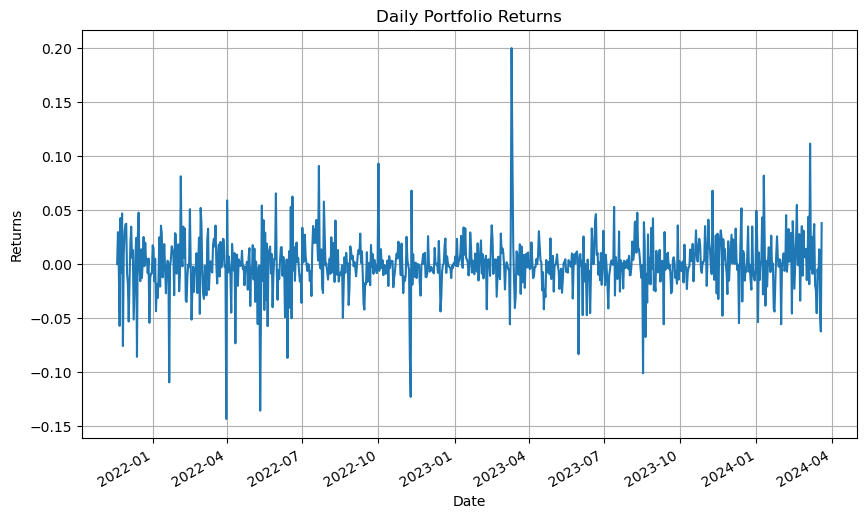

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


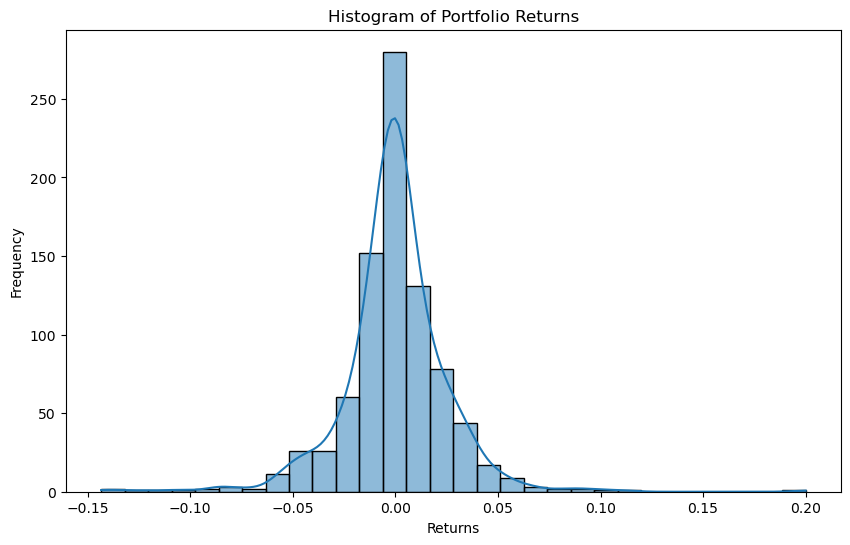

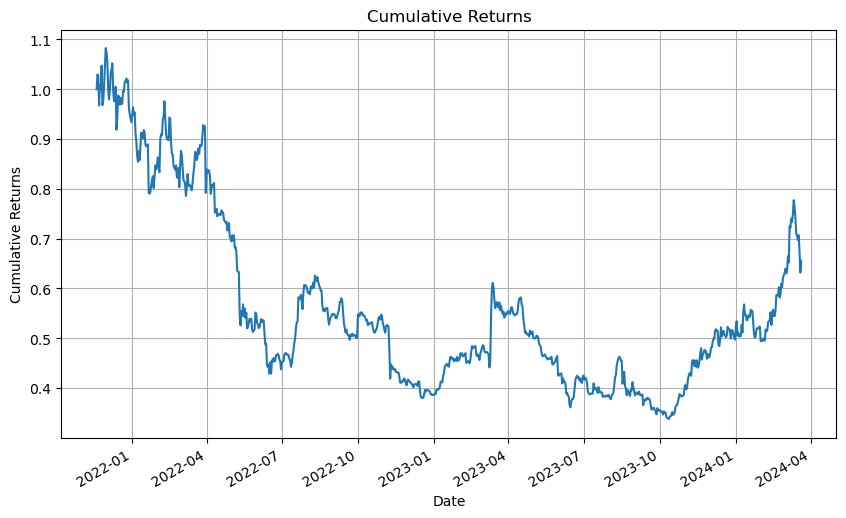

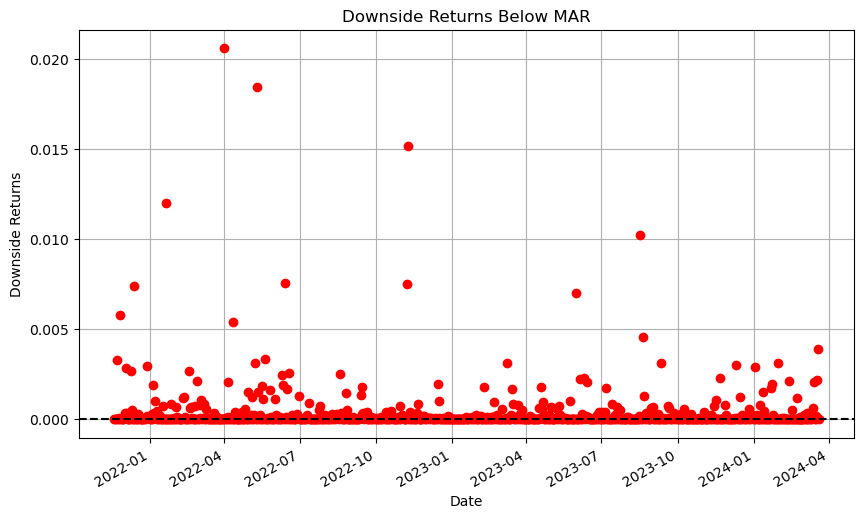

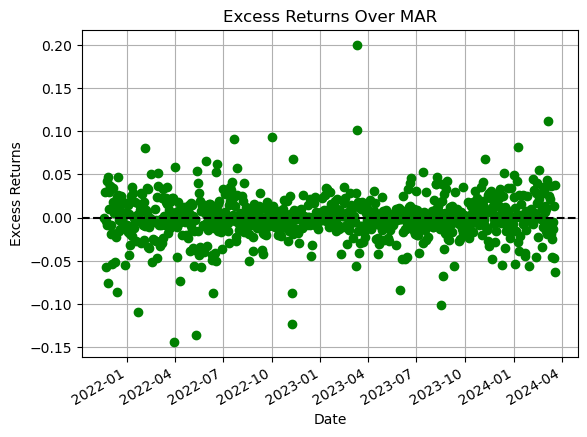

In [913]:
historical_returns = visualize_mvo_results(historical_portfolio_daily_returns, historical_downside_returns, historical_excess_returns)

### Sim Stats - Final Simulation w/ Agent Scores

In [914]:
rl_sim_w_RWA.iloc[-1].sum()

8593813768.907654

In [915]:
#mvo_sim_w_RWA.iloc[-1].sum()

In [916]:
# Optimized Weights for Simulation

rl_portfolio_mvo_weights, rl_portfolio_returns, rl_portfolio_composition, rl_total_portfolio_value = mvo(rl_sim_w_RWA)
print('optimized weights:', rl_portfolio_mvo_weights)
print('current composition:', rl_portfolio_composition.iloc[-1])
print(f'current portfolio value: ${rl_total_portfolio_value.iloc[-1]:,.2f}')

Individual Sortino Ratios: BTC Vault_collateral_usd          -0.43375
ETH Vault_collateral_usd          -0.91596
stETH Vault_collateral_usd         1.75123
Stablecoin Vault_collateral_usd   -0.17243
Altcoin Vault_collateral_usd      -0.22889
LP Vault_collateral_usd            0.07099
RWA Vault_collateral_usd           0.79147
PSM Vault_collateral_usd          -0.04434
dtype: float64
Optimized weights: [0.1        0.05       0.5        0.1        0.01       0.03228134
 0.02       0.18771866]
optimized weights: [0.1        0.05       0.5        0.1        0.01       0.03228134
 0.02       0.18771866]
current composition: BTC Vault_collateral_usd          0.14947
ETH Vault_collateral_usd          0.21701
stETH Vault_collateral_usd        0.21011
Stablecoin Vault_collateral_usd   0.03049
Altcoin Vault_collateral_usd      0.04182
LP Vault_collateral_usd           0.06252
RWA Vault_collateral_usd          0.03535
PSM Vault_collateral_usd          0.25324
Name: 2024-03-20 00:00:00, dtype: flo

mvo_portfolio_mvo_weights, mvo_portfolio_returns, mvo_portfolio_composition, mvo_total_portfolio_value = mvo(mvo_sim_w_RWA)
print('optimized weights:', mvo_portfolio_mvo_weights)
print('current composition:', mvo_portfolio_composition.iloc[-1])
print(f'current portfolio value: ${mvo_total_portfolio_value.iloc[-1]:,.2f}')

mvo_sim_portfolio_daily_returns,  mvo_sim_downside_returns, mvo_sim_excess_returns, mvo_sim_sortino_ratio = historical_sortino(mvo_portfolio_returns,mvo_portfolio_composition)

In [917]:
rl_sim_portfolio_daily_returns,  rl_sim_downside_returns, rl_sim_excess_returns, rl_sim_sortino_ratio = historical_sortino(rl_portfolio_returns,rl_portfolio_composition)

Daily downside deviation: 0.013657709934651074
Annualized downside deviation: 0.26093018192719547
Annualized excess return: 0.08837088122338432
Portfolio Sortino Ratio: 0.3386763484802287


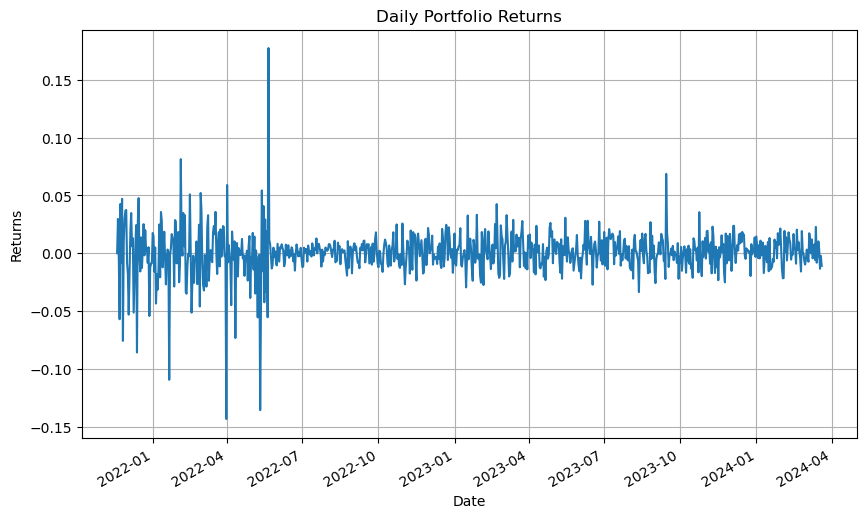

C:\Users\brandyns pc\anacondareal\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


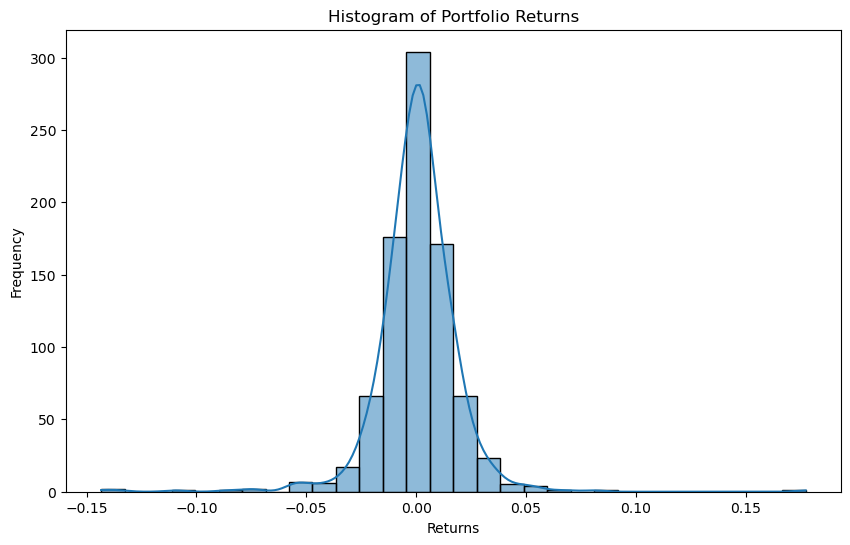

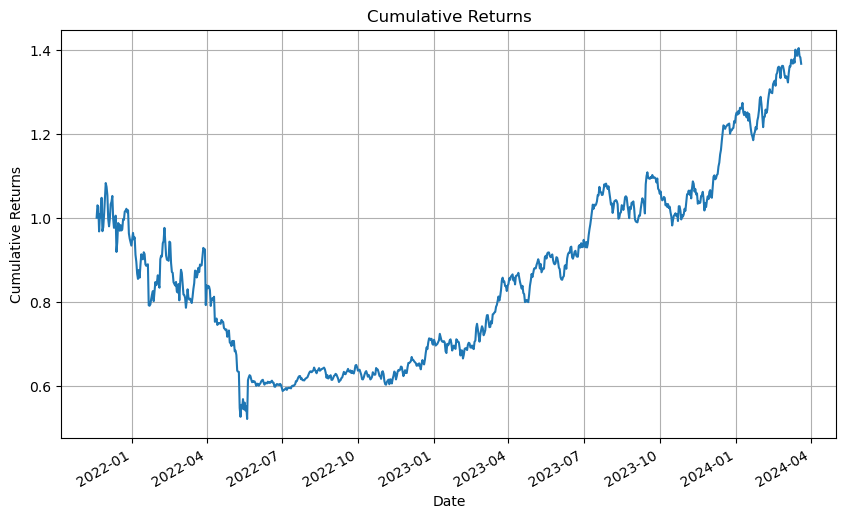

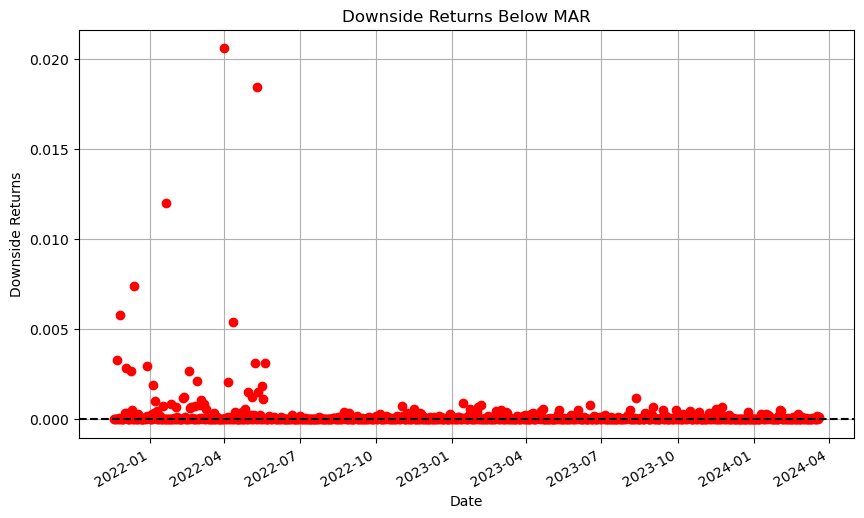

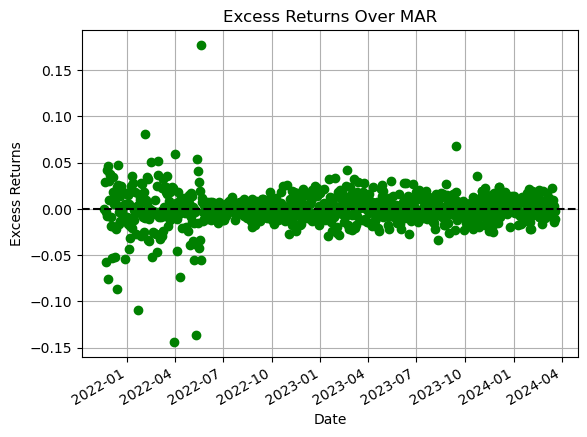

In [918]:
rl_optimized_returns = visualize_mvo_results(rl_sim_portfolio_daily_returns, rl_sim_downside_returns, rl_sim_excess_returns)

In [919]:
#mvo_optimized_returns = visualize_mvo_results(mvo_sim_portfolio_daily_returns, mvo_sim_downside_returns, mvo_sim_excess_returns)

### Comparisons on charts

In [920]:
#print(mvo_optimized_returns.describe())
print(rl_optimized_returns.describe())

count   854.00000
mean      0.86938
std       0.21790
min       0.52079
25%       0.65262
50%       0.85749
75%       1.02954
max       1.40392
dtype: float64


In [921]:
# Find the duplicate indices
#mvo_duplicate_indices = mvo_optimized_returns.index[mvo_optimized_returns.index.duplicated()]
rl_duplicate_indices = rl_optimized_returns.index[rl_optimized_returns.index.duplicated()]

# Print the duplicate indices
#print("MVO Duplicate indices:", mvo_duplicate_indices)
print("RL Duplicate indices:", rl_duplicate_indices)

# Drop duplicates, keeping the first occurrence
rl_optimized_returns = rl_optimized_returns[~rl_optimized_returns.index.duplicated(keep='first')]
#mvo_optimized_returns = mvo_optimized_returns[~mvo_optimized_returns.index.duplicated(keep='first')]

# Verify if duplicates are removed
print("After removing duplicates")
#print("MVO indices:", mvo_optimized_returns.index)
print("RL indices:", rl_optimized_returns.index)


RL Duplicate indices: DatetimeIndex(['2024-02-26'], dtype='datetime64[ns]', freq=None)
After removing duplicates
RL indices: DatetimeIndex(['2021-11-19', '2021-11-20', '2021-11-21', '2021-11-22',
               '2021-11-23', '2021-11-24', '2021-11-25', '2021-11-26',
               '2021-11-27', '2021-11-28',
               ...
               '2024-03-11', '2024-03-12', '2024-03-13', '2024-03-14',
               '2024-03-15', '2024-03-16', '2024-03-17', '2024-03-18',
               '2024-03-19', '2024-03-20'],
              dtype='datetime64[ns]', length=853, freq=None)


In [922]:
historical_returns.index

DatetimeIndex(['2021-11-19', '2021-11-20', '2021-11-21', '2021-11-22',
               '2021-11-23', '2021-11-24', '2021-11-25', '2021-11-26',
               '2021-11-27', '2021-11-28',
               ...
               '2024-03-11', '2024-03-12', '2024-03-13', '2024-03-14',
               '2024-03-15', '2024-03-16', '2024-03-17', '2024-03-18',
               '2024-03-19', '2024-03-20'],
              dtype='datetime64[ns]', name='day', length=856, freq=None)

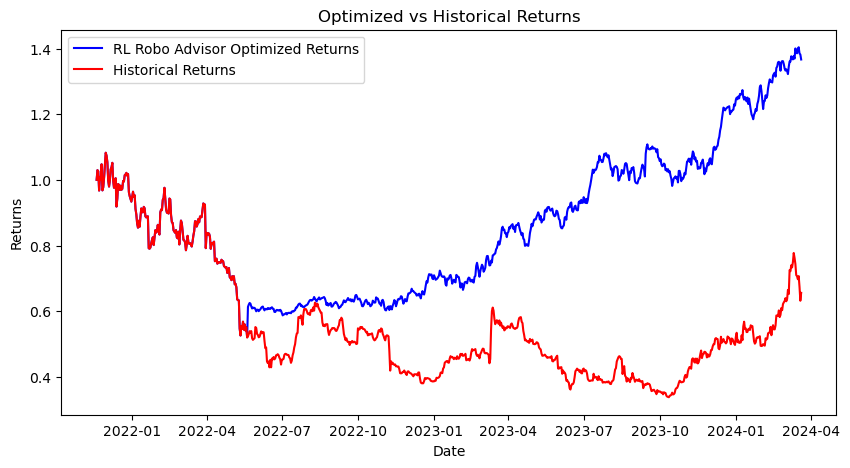

In [923]:
all_dates = rl_optimized_returns.index.union(historical_returns.index)
#optimized_returns = optimized_returns.reindex(all_dates, fill_value=0)
#historical_returns = historical_returns.reindex(all_dates, fill_value=0)

plt.figure(figsize=(10, 5))
plt.plot(rl_optimized_returns.index, rl_optimized_returns.values, label='RL Robo Advisor Optimized Returns', color='blue')
#plt.plot(mvo_optimized_returns.index, mvo_optimized_returns.values, label='MVO Robo Advisor Optimized Returns', color='green')
plt.plot(historical_returns.index, historical_returns.values, label='Historical Returns', color='red')
plt.title('Optimized vs Historical Returns')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()


### Sim Composition

In [924]:
rl_total_portfolio_value

2021-11-19   17,889,054,224.19703
2021-11-20   18,424,991,815.56187
2021-11-21   18,359,419,867.17642
2021-11-22   17,327,479,302.88201
2021-11-23   18,075,140,768.48598
                     ...         
2024-03-16    8,832,187,389.91942
2024-03-17    8,840,213,894.92747
2024-03-18    8,718,681,701.22540
2024-03-19    8,693,592,441.27316
2024-03-20    8,593,813,768.90765
Length: 854, dtype: float64

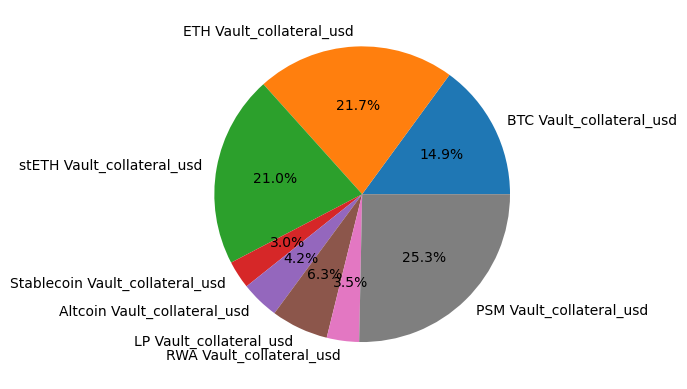

current portfolio value: $8,593,813,768.91


In [925]:
plt.pie(rl_portfolio_composition.iloc[-1], labels = rl_portfolio_composition.columns, autopct='%1.1f%%')
plt.show() 
print(f'current portfolio value: ${rl_total_portfolio_value.iloc[-1]:,.2f}')

plt.pie(mvo_portfolio_composition.iloc[-1], labels = mvo_portfolio_composition.columns, autopct='%1.1f%%')
plt.show() 
print(f'current portfolio value: ${mvo_total_portfolio_value.iloc[-1]:,.2f}')

### Historical Composition 

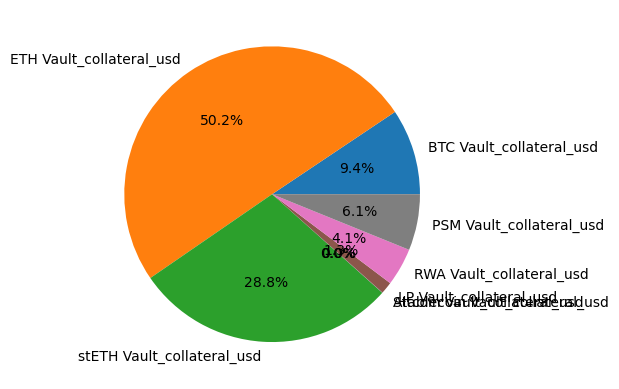

current portfolio value: $7,342,533,784.81


In [926]:
plt.pie(historical_portfolio_composition.iloc[-1], labels = historical_portfolio_composition.columns, autopct='%1.1f%%' )
plt.show() 
print(f'current portfolio value: ${historical_total_portfolio_value.iloc[-1]:,.2f}')

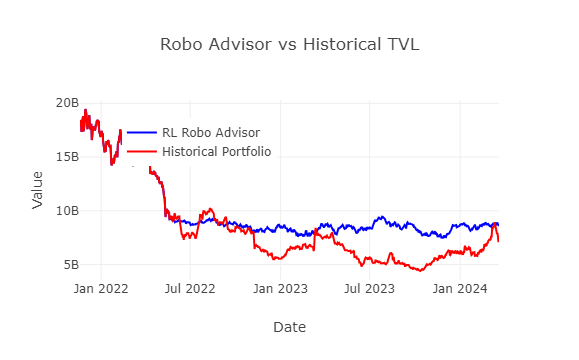

In [927]:
import plotly.graph_objs as go
import plotly.offline as pyo

# Create traces for each line
trace1 = go.Scatter(
    x=rl_total_portfolio_value.index,
    y=rl_total_portfolio_value.values,
    mode='lines',
    name='RL Robo Advisor',
    line=dict(color='blue')
)
"""
trace2 = go.Scatter(
    x=mvo_total_portfolio_value.index,
    y=mvo_total_portfolio_value.values,
    mode='lines',
    name='MVO Robo Advisor Portfolio',
    line=dict(color='green')
)
"""
trace3 = go.Scatter(
    x=historical_total_portfolio_value.index,
    y=historical_total_portfolio_value.values,
    mode='lines',
    name='Historical Portfolio',
    line=dict(color='red')
)

# Create the layout
layout = go.Layout(
    title='Robo Advisor vs Historical TVL',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Value'),
    legend=dict(x=0.1, y=0.9)
)

# Combine the data and layout into a figure
fig = go.Figure(data=[trace1, trace3], layout=layout)

# Render the figure
pyo.iplot(fig)


In [928]:
## Add historical MAR from annual risk_free rate to daily risk free  

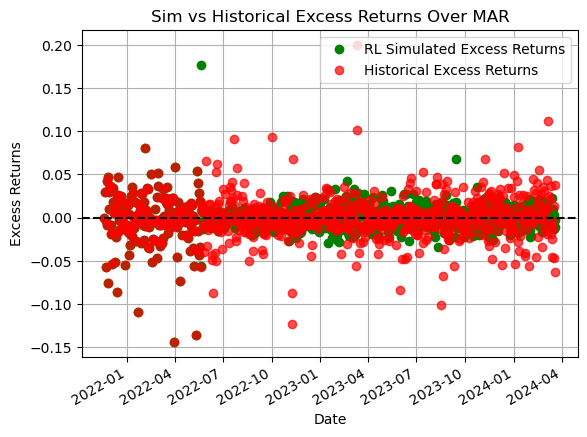

In [929]:
ax = rl_sim_excess_returns.plot(style='go', label='RL Simulated Excess Returns', title='Sim vs Historical Excess Returns Over MAR')
# Plot the second set of excess returns on the same axis
#mvo_sim_excess_returns.plot(ax=ax, style='bo', alpha=0.7, label='MVO Simulated Excess Returns')  # 'ro' for red dots, you can change the color and marker style
historical_excess_returns.plot(ax=ax, style='ro', alpha=0.7, label='Historical Excess Returns')  # 'ro' for red dots, you can change the color and marker style

# Add a line at the minimum acceptable return (MAR) for reference
plt.axhline(0, color='k', linestyle='--')

# Set the labels and grid
plt.xlabel('Date')
plt.ylabel('Excess Returns')
plt.grid(True)

# Add the legend
plt.legend()

# Show the plot
plt.show()


sim_portfolio_daily_returns.describe()

historical_portfolio_daily_returns.describe()

(1 + sim_portfolio_daily_returns).cumprod()

# Set the display option to show all rows
pd.set_option('display.max_rows', None)

# Assuming 'sim_portfolio_daily_returns' is your daily returns Series
cumulative_returns = (1 + sim_portfolio_daily_returns).cumprod()

# Display the cumulative returns
cumulative_returns

# Reset display option if you want to limit the display in other parts of your code


pd.reset_option('display.max_rows')
(1 + historical_portfolio_daily_returns).cumprod()